# Necessary Imports and mount to drive

In [ ]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import pickle
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rc

# Scikit-learn core
from sklearn import model_selection, metrics
from sklearn.base import clone
from sklearn.preprocessing import MinMaxScaler

# Model selection
from sklearn.model_selection import (
    train_test_split,
    StratifiedKFold,
    LeaveOneOut,
    cross_val_score
)

# Sampling
from imblearn.over_sampling import SMOTE, RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler

# Classifiers
from sklearn.ensemble import (
    RandomForestClassifier,
    VotingClassifier,
    ExtraTreesClassifier,
    AdaBoostClassifier,
    GradientBoostingClassifier,
    BaggingClassifier
)
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

# Metrics
from sklearn.metrics import (
    roc_curve,
    roc_auc_score,
    precision_recall_curve,
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    auc
)

# External ML libraries
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

# Configurations
sns.set()
%matplotlib inline

# Random seed
np.random.seed(1)

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)


Mounted at /content/drive


# Models & Dataset Paths

In [ ]:
models = [
    ('LogR', LogisticRegression(random_state=0, max_iter=1000)),
    ('SVM', SVC(kernel='rbf', probability=True, random_state=0)),
    ('DT', DecisionTreeClassifier(criterion='entropy', random_state=0)),
    ('RF', RandomForestClassifier(n_estimators=10, criterion='entropy', random_state=0)),
    ('XGB', XGBClassifier(random_state=0, use_label_encoder=False, eval_metric='logloss')),
    ('R-Blend', VotingClassifier(
        estimators=[
            ('DT', DecisionTreeClassifier(criterion='entropy', random_state=0)),
            ('LogR', LogisticRegression(random_state=0, max_iter=1000)),
            # ('SVM', SVC(kernel='rbf', probability=True, random_state=0)),
            ('XGB', XGBClassifier(random_state=0, use_label_encoder=False, eval_metric='logloss')),
        ],
        voting='soft',
        weights=[1, 1.5, 1]
    )),
]

In [ ]:
DATASET_PATHS = ["/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_doripenem_KN.csv",
"/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_ertapenem_KN.csv",
"/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_meropenem_EcS.csv",
"/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_ertapenem_EcS.csv",
"/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_doripenem_EcS.csv",
"/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_imipenem_EcS.csv",
"/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_doripenem_PA.csv",
"/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_streptomycin_SE.csv",
"/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_imipenem_KN.csv",
"/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_clindamycin_CJ.csv",
"/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_meropenem_KN.csv",
"/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_kanamycin_SE.csv"]

# Utility Classes

In [ ]:
def read_dataset(idx = 0):
  df = pd.read_csv(dataset[idx])
  df.drop('sum', axis=1, errors='ignore', inplace=True)
  # Getting Prediction column
  y = df.pop(df.columns[-1])

  # Getting feature columns
  X = df.iloc[:, 1:]

  return df, X, y

def scale_column(df, column_name = 'sum'):
  scaler = MinMaxScaler()
  scaled_column = scaler.fit_transform(df[column_name].values.reshape(-1, 1))
  df[column_name] = scaled_column
  # df.shape
  return df

def clean_dataset_name(name):
    parts = name.split('_')
    if len(parts) >= 4:
        antibiotic = parts[2].capitalize()
        pathogen = parts[3].upper()
        return f"{antibiotic} ({pathogen})"
    return name

def add_sum_column(df):
    df_features = df.iloc[:, 1:-1]  # Exclude Isolate and Label
    df['sum'] = df_features.sum(axis=1)
    df = scale_column(df, column_name='sum')

    # Move 'sum' before the label column
    label_col = df.columns[-1]
    cols = list(df.columns)
    cols.insert(-1, cols.pop(cols.index('sum')))
    df = df[cols]
    return df

# Codes for generating results for writting paper starts from here
## AMR Dataset (Sunwar et al.) Overview: Size, Features, and Class Balance

In [ ]:
df = pd.read_csv(DATASET_PATHS[0])
display(df)

,Isolate,aac(3)-II=COMPLETE,aac(3)-II=PARTIAL_END_OF_CONTIG,aac(3)-IIa=COMPLETE,aac(3)-IId=COMPLETE,aac(3)-IV=COMPLETE,aac(3)-IV=PARTIAL_END_OF_CONTIG,aac(3)-Ib=COMPLETE,aac(3)-VIa=COMPLETE,aac(6')-33=COMPLETE,...,sul3=PARTIAL,sul3=PARTIAL_END_OF_CONTIG,tet(A)=COMPLETE,tet(A)=PARTIAL_END_OF_CONTIG,tet(B)=COMPLETE,tet(D)=COMPLETE,tet(G)=COMPLETE,tet(W)=COMPLETE,tet(X)=COMPLETE,doripenem
0,PDT000144005.3,0,0,1,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
1,PDT000311283.1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,PDT000015908.2,0,0,1,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
3,PDT000130445.2,0,0,0,1,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
4,PDT000143982.3,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
311,PDT000143931.3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
312,PDT000473853.1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
313,PDT000145818.3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
314,PDT000130453.2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


### ✅ Dataset Summary

,Dataset,Number of Isolates,Number of Features,Resistant,Susceptible
0,Doripenem (KN),316,324,241,75
1,Ertapenem (KN),181,324,90,91
2,Meropenem (ECS),91,236,45,46
3,Ertapenem (ECS),129,236,61,68
4,Doripenem (ECS),49,236,25,24
5,Imipenem (ECS),64,236,37,27
6,Doripenem (PA),44,164,22,22
7,Streptomycin (SE),1042,179,542,500
8,Imipenem (KN),200,324,113,87
9,Clindamycin (CJ),26,42,8,18


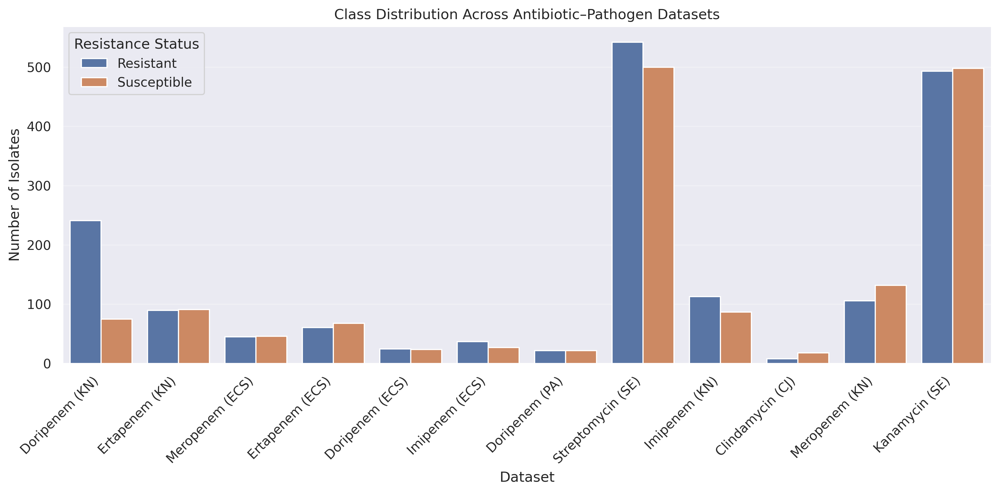

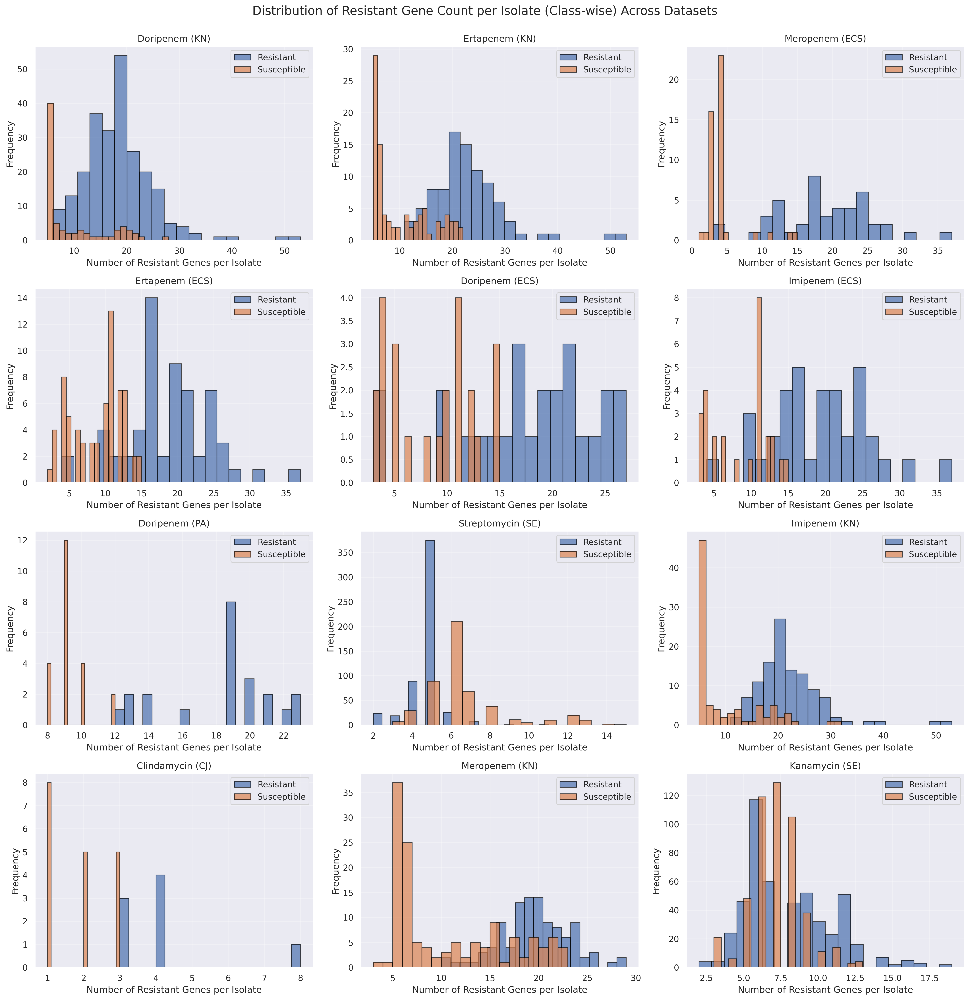

### 🏷️ Dataset Summary Sorted by Class Imbalance Ratio

,Dataset,Number of Isolates,Number of Features,Resistant,Susceptible,Imbalance Ratio
0,Doripenem (KN),316,324,241,75,3.21
1,Clindamycin (CJ),26,42,8,18,2.25
2,Imipenem (ECS),64,236,37,27,1.37
3,Imipenem (KN),200,324,113,87,1.30
4,Meropenem (KN),238,324,106,132,1.25
5,Ertapenem (ECS),129,236,61,68,1.11
6,Streptomycin (SE),1042,179,542,500,1.08
7,Doripenem (ECS),49,236,25,24,1.04
8,Meropenem (ECS),91,236,45,46,1.02
9,Ertapenem (KN),181,324,90,91,1.01



📂 Saved files to Google Drive:
- /content/drive/MyDrive/Research Work/AMR Automation/Output/tables/dataset_summary.csv
- /content/drive/MyDrive/Research Work/AMR Automation/Output/tables/dataset_summary_sorted_by_imbalance.csv
- /content/drive/MyDrive/Research Work/AMR Automation/Output/figures/overview/class_distribution_barplot.png
- /content/drive/MyDrive/Research Work/AMR Automation/Output/figures/overview/gene_count_histograms_grid.png
- /content/drive/MyDrive/Research Work/AMR Automation/Output/SUMMARY.md


In [ ]:
# ============================
# AMR Dataset Summary & Plots
# ============================

# ---- Config ----
OUTPUT_ROOT = "/content/drive/MyDrive/Research Work/AMR Automation/Output/"
FALLBACK_DATASET_DIR = "/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/"  # used if DATASET_PATHS not defined

# ---- Imports ----
import warnings
warnings.filterwarnings("ignore")

from pathlib import Path
from glob import glob
from datetime import datetime

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from IPython.display import display, Markdown

# ---- Style / Reproducibility ----
sns.set()
np.random.seed(1)

# ---- I/O Prep ----
OUT_ROOT = Path(OUTPUT_ROOT)
DIR_TABLES = OUT_ROOT / "tables"
DIR_FIG_OVERVIEW = OUT_ROOT / "figures" / "overview"
DIR_FIG_HISTS = OUT_ROOT / "figures" / "histograms"

for d in [OUT_ROOT, DIR_TABLES, DIR_FIG_OVERVIEW, DIR_FIG_HISTS]:
    d.mkdir(parents=True, exist_ok=True)

# ---- Dataset Discovery ----
try:
    DATASET_PATHS  # if user defined earlier in notebook
except NameError:
    DATASET_PATHS = sorted(glob(str(Path(FALLBACK_DATASET_DIR) / "*.csv")))

if not DATASET_PATHS:
    raise FileNotFoundError(
        "No CSV datasets found. Provide DATASET_PATHS or place CSVs in "
        f"{FALLBACK_DATASET_DIR}"
    )

# ---- Helpers ----
def clean_dataset_name(name: str) -> str:
    """Format dataset name from filename."""
    base = Path(name).stem
    parts = base.split("_")
    if len(parts) >= 4:
        antibiotic = parts[2].capitalize()
        pathogen = parts[3].upper()
        return f"{antibiotic} ({pathogen})"
    return base

# ---- Build Summary Table ----
rows = []
for path in DATASET_PATHS:
    df = pd.read_csv(path)
    y = df.iloc[:, -1]  # target column
    X = df.iloc[:, 1:-1]  # features

    dataset_name = clean_dataset_name(Path(path).name)
    rows.append({
        "Dataset": dataset_name,
        "Number of Isolates": df.shape[0],
        "Number of Features": X.shape[1],
        "Resistant": int((y == 1).sum()),
        "Susceptible": int((y == 0).sum()),
    })

summary_df = pd.DataFrame(rows)

# Save table
summary_csv_path = DIR_TABLES / "dataset_summary.csv"
summary_df.to_csv(summary_csv_path, index=False)

# Display in Colab
display(Markdown("### ✅ Dataset Summary"))
display(summary_df)

# ---- Class Distribution Bar Plot ----
summary_melted = summary_df.melt(
    id_vars="Dataset",
    value_vars=["Resistant", "Susceptible"],
    var_name="Class",
    value_name="Count",
)

plt.figure(figsize=(12, 6))
sns.barplot(data=summary_melted, x="Dataset", y="Count", hue="Class")
plt.xticks(rotation=45, ha="right")
plt.title("Class Distribution Across Antibiotic–Pathogen Datasets")
plt.ylabel("Number of Isolates")
plt.xlabel("Dataset")
plt.legend(title="Resistance Status")
plt.tight_layout()

# Show in Colab
plt.show()

# Save
barplot_path = DIR_FIG_OVERVIEW / "class_distribution_barplot.png"
plt.savefig(barplot_path, dpi=300, bbox_inches="tight")
plt.close()

# ---- Histograms per dataset ----
n = len(DATASET_PATHS)
cols = 3
rows = int(np.ceil(n / cols))
fig, axes = plt.subplots(rows, cols, figsize=(18, 4.5 * rows))
axes = np.atleast_1d(axes).flatten()

for i, path in enumerate(DATASET_PATHS):
    df = pd.read_csv(path)
    y = df.iloc[:, -1]
    X = df.iloc[:, 1:-1]

    dataset_name = clean_dataset_name(Path(path).name)
    gene_counts = X.sum(axis=1)

    resistant_counts = gene_counts[y == 1]
    susceptible_counts = gene_counts[y == 0]

    ax = axes[i]
    ax.hist(resistant_counts, bins=20, alpha=0.7, label="Resistant", edgecolor="black")
    ax.hist(susceptible_counts, bins=20, alpha=0.7, label="Susceptible", edgecolor="black")
    ax.set_title(dataset_name)
    ax.set_xlabel("Number of Resistant Genes per Isolate")
    ax.set_ylabel("Frequency")
    ax.legend()

# Hide empty plots
for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.suptitle(
    "Distribution of Resistant Gene Count per Isolate (Class-wise) Across Datasets",
    fontsize=16,
    y=1.02,
)
plt.show()

# Save grid
grid_hist_path = DIR_FIG_OVERVIEW / "gene_count_histograms_grid.png"
plt.savefig(grid_hist_path, dpi=300, bbox_inches="tight")
plt.close()

# ---- Imbalance Ratio ----
summary_df["Imbalance Ratio"] = summary_df.apply(
    lambda r: round(max(r["Resistant"], r["Susceptible"]) / max(1, min(r["Resistant"], r["Susceptible"])), 2),
    axis=1
)
sorted_summary_df = summary_df.sort_values("Imbalance Ratio", ascending=False).reset_index(drop=True)

# Save
sorted_csv_path = DIR_TABLES / "dataset_summary_sorted_by_imbalance.csv"
sorted_summary_df.to_csv(sorted_csv_path, index=False)

# Show in Colab
display(Markdown("### 🏷️ Dataset Summary Sorted by Class Imbalance Ratio"))
display(sorted_summary_df)

# ---- Markdown Summary ----
ts = datetime.now().strftime("%Y-%m-%d %H:%M:%S")
summary_md = OUT_ROOT / "SUMMARY.md"
summary_md.write_text(
    f"# AMR Automation Output Summary\n\n"
    f"- Generated: {ts}\n"
    f"- Datasets processed: {len(DATASET_PATHS)}\n"
    f"- Tables:\n"
    f"  - {summary_csv_path}\n"
    f"  - {sorted_csv_path}\n"
    f"- Figures:\n"
    f"  - {barplot_path}\n"
    f"  - {grid_hist_path}\n"
)

print("\n📂 Saved files to Google Drive:")
print(f"- {summary_csv_path}")
print(f"- {sorted_csv_path}")
print(f"- {barplot_path}")
print(f"- {grid_hist_path}")
print(f"- {summary_md}")


# Top Features by ANOVA vs Random Forest (Top 10 Feature Table + Heatmap, Top-3 Only)
This section generates and saves the top-10 features per dataset using ANOVA (F-score and p-value) and Random Forest importance. The saved CSV is then used to plot a heatmap showing only the top three features per method (top-2 plus R-Score, formerly sum). ANOVA highlights linear separability, while RF shows nonlinear importance. Results are saved to .../Output/ for reuse.

In [ ]:
# ================================
# Top Features: ANOVA vs RandomForest
# ================================

# ---- Config ----
OUTPUT_ROOT = "/content/drive/MyDrive/Research Work/AMR Automation/Output/"
FALLBACK_DATASET_DIR = "/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/"  # used if DATASET_PATHS not defined

# ---- Imports ----
import warnings
warnings.filterwarnings("ignore")

from pathlib import Path
from glob import glob
from datetime import datetime

import numpy as np
import pandas as pd

from sklearn.feature_selection import f_classif
from sklearn.ensemble import RandomForestClassifier

from IPython.display import display, Markdown

# ---- Reproducibility ----
np.random.seed(42)

# ---- I/O Prep ----
OUT_ROOT = Path(OUTPUT_ROOT)
DIR_TABLES = OUT_ROOT / "tables"
for d in [OUT_ROOT, DIR_TABLES]:
    d.mkdir(parents=True, exist_ok=True)

# ---- Dataset Discovery (uses DATASET_PATHS if available; else `dataset`; else auto-discover) ----
try:
    DATASET_PATHS = DATASET_PATHS  # noqa: F821
except NameError:
    try:
        DATASET_PATHS = dataset  # noqa: F821
    except NameError:
        DATASET_PATHS = sorted(glob(str(Path(FALLBACK_DATASET_DIR) / "*.csv")))

if not DATASET_PATHS:
    raise FileNotFoundError(
        "No CSV datasets found. Provide a list in DATASET_PATHS (or `dataset`) or place CSVs in "
        f"{FALLBACK_DATASET_DIR}"
    )

# ---- Helpers ----
def clean_dataset_name(name: str) -> str:
    """Format dataset name from filename: ..._<Antibiotic>_<Pathogen>.csv -> 'Antibiotic (PATHOGEN)'"""
    base = Path(name).stem
    parts = base.split("_")
    if len(parts) >= 4:
        antibiotic = parts[2].capitalize()
        pathogen = parts[3].upper()
        return f"{antibiotic} ({pathogen})"
    return base

def ensure_sum_feature(X: pd.DataFrame) -> pd.DataFrame:
    """Ensure 'sum' exists as the row-wise sum of features."""
    if "sum" not in X.columns:
        X = X.copy()
        X["sum"] = X.sum(axis=1)
    return X

def get_top_anova_features(X: pd.DataFrame, y: pd.Series, topn: int = 10):
    """
    Univariate ANOVA F-test (f_classif). Returns top-N by p-value (ascending).
    Handles constant or ill-posed features by setting F=0, p=1 for them.
    """
    X = ensure_sum_feature(X)

    # Run ANOVA
    F, pvals = f_classif(X, y)

    # Clean invalids: NaN/inf -> F=0, p=1
    F = np.asarray(F, dtype=float)
    pvals = np.asarray(pvals, dtype=float)
    bad = ~np.isfinite(F) | ~np.isfinite(pvals)
    F[bad] = 0.0
    pvals[bad] = 1.0

    anova_df = pd.DataFrame({"Feature": X.columns, "F_score": F, "p_value": pvals})

    # Rank by p-value ascending
    anova_df = anova_df.sort_values(by="p_value", ascending=True).reset_index(drop=True)

    # Pick top N
    top_anova = anova_df.head(topn).copy()
    # Prepare rows: (rank, feature, F, p)
    result = []
    for i, row in top_anova.iterrows():
        result.append((i + 1, row.Feature, float(row.F_score), float(row.p_value)))
    return result

def get_top_rf_features(X: pd.DataFrame, y: pd.Series, topn: int = 10, n_estimators: int = 300, random_state: int = 42):
    X = ensure_sum_feature(X)
    rf = RandomForestClassifier(n_estimators=n_estimators, random_state=random_state, n_jobs=-1)
    rf.fit(X, y)
    imp_df = pd.DataFrame({"Feature": X.columns, "Importance": rf.feature_importances_})
    top_rf = imp_df.sort_values(by="Importance", ascending=False).head(topn).reset_index(drop=True)
    return [(i + 1, row.Feature, row.Importance) for i, row in top_rf.iterrows()]

# ---- Build Features Table (same format pattern as before) ----
rows = []
for path in DATASET_PATHS:
    df = pd.read_csv(path)
    y = df.iloc[:, -1]
    X = df.iloc[:, 1:-1]
    ds_name = clean_dataset_name(Path(path).name)

    anova_feats = get_top_anova_features(X.copy(), y, topn=10)
    rf_feats = get_top_rf_features(X.copy(), y, topn=10)

    # Keep the same presentation style: dataset name on first row, then blanks for the remaining ranks
    for i in range(10):
        p_for_print = max(anova_feats[i][3], np.finfo(float).tiny)  # formatting only
        rows.append({
            "Dataset": ds_name if i == 0 else "",
            "ANOVA Rank": anova_feats[i][0],
            "Feature (ANOVA)": f"{anova_feats[i][1]} (F={anova_feats[i][2]:.4f}, p={p_for_print:.2e})",
            "RF Rank": rf_feats[i][0],
            "Feature (Random Forest)": f"{rf_feats[i][1]} ({rf_feats[i][2]:.6f})",
        })

features_table = pd.DataFrame(rows)

# ---- Save & Display ----
out_csv = DIR_TABLES / "top10_features_anova_vs_randomforest.csv"
features_table.to_csv(out_csv, index=False)

display(Markdown("### 🔎 Top 10 Features by ANOVA (F-test) vs Random Forest Importance"))
display(features_table)

print(f"\n📄 Saved table to: {out_csv}")


### 🔎 Top 10 Features by ANOVA (F-test) vs Random Forest Importance

,Dataset,ANOVA Rank,Feature (ANOVA),RF Rank,Feature (Random Forest)
0,Doripenem (KN),1,"ampC=COMPLETE (F=278.7066, p=3.14e-45)",1,sum (0.124526)
1,,2,"sum (F=107.4625, p=7.53e-22)",2,ampC=COMPLETE (0.098774)
2,,3,"gyrA_S83T=POINT (F=94.2139, p=1.19e-19)",3,blaKPC-3=COMPLETE (0.045156)
3,,4,"sul1=COMPLETE (F=86.8667, p=2.12e-18)",4,sul1=COMPLETE (0.040355)
4,,5,"pmrB_R256G=POINT (F=65.8821, p=1.10e-14)",5,blaKPC-2=COMPLETE (0.035850)
...,...,...,...,...,...
115,,6,"ble=COMPLETE (F=185.2939, p=8.37e-39)",6,aac(3)-VIa=COMPLETE (0.050103)
116,,7,"sul1=COMPLETE (F=171.5757, p=2.89e-36)",7,ble=COMPLETE (0.045929)
117,,8,"ant(2'')-Ia=COMPLETE (F=95.3849, p=1.43e-21)",8,ant(2'')-Ia=COMPLETE (0.043410)
118,,9,"sul2=COMPLETE (F=85.6265, p=1.31e-19)",9,aph(6)-Ic=COMPLETE (0.039435)



📄 Saved table to: /content/drive/MyDrive/Research Work/AMR Automation/Output/tables/top10_features_anova_vs_randomforest.csv


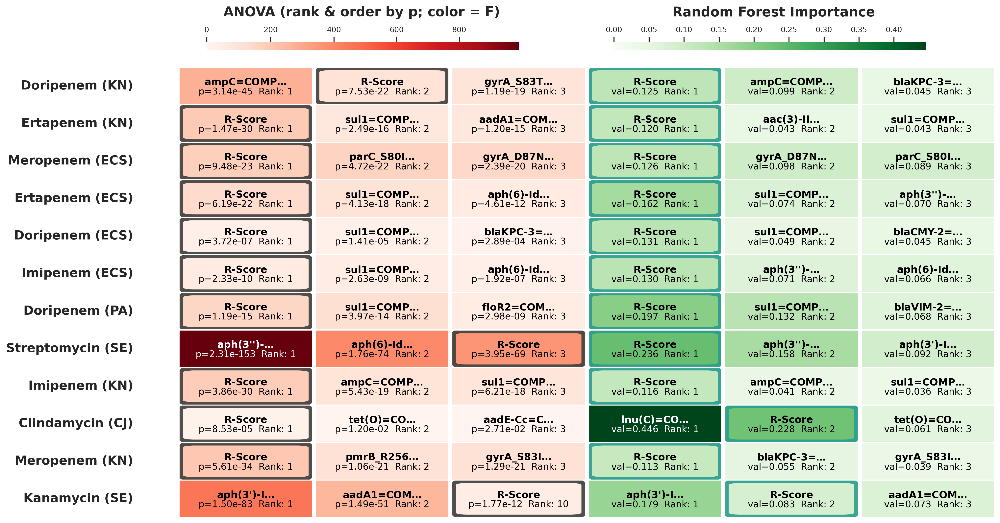

Saved figure to:
- /content/drive/MyDrive/Research Work/AMR Automation/Output/figures/overview/feature_heatmap_anova_vs_rf.png
- /content/drive/MyDrive/Research Work/AMR Automation/Output/feature_heatmap_anova_vs_rf.png


In [ ]:
# ============================================
# Feature Heatmap from SAVED TABLE ONLY
# ANOVA (rank & order by p; color by F) vs Random Forest Importance
# Display 'sum' as 'R-Score'
# ============================================

# ---- Config ----
OUTPUT_ROOT = "/content/drive/MyDrive/Research Work/AMR Automation/Output/"
TABLE_PATH = OUTPUT_ROOT + "tables/top10_features_anova_vs_randomforest.csv"
DISPLAY_SUM_LABEL = "R-Score"   # <- new display name

# ---- Imports ----
import warnings
warnings.filterwarnings('ignore')

from pathlib import Path
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colorbar as mcolorbar
from matplotlib.colors import Normalize, PowerNorm
from matplotlib.patches import FancyBboxPatch

# ---- I/O Prep ----
OUT_ROOT = Path(OUTPUT_ROOT)
DIR_FIG_OVERVIEW = OUT_ROOT / "figures" / "overview"
for d in [OUT_ROOT, DIR_FIG_OVERVIEW]:
    d.mkdir(parents=True, exist_ok=True)

# ---- Helpers ----
def wrap(name, width=11):
    name = str(name)
    return name[:width-2] + '…' if len(name) > width else name

def is_dark_color(rgb):
    luminance = 0.299*rgb[0] + 0.587*rgb[1] + 0.114*rgb[2]
    return luminance < 0.5

def display_feat_name(name):
    """Show 'sum' as 'R-Score' in the plot."""
    return DISPLAY_SUM_LABEL if name == "sum" else name

def parse_anova_cell(cell):
    """'feature (F=12.3456, p=1.23e-04)' -> (feature, F, p)"""
    if pd.isna(cell):
        return ("", 0.0, 1.0)
    s = str(cell)
    name = s.rsplit(" (", 1)[0]
    mF = re.search(r"\(F=([+\-]?\d+(?:\.\d+)?(?:[eE][+\-]?\d+)?),\s*p=", s)
    mp = re.search(r"p=([+\-]?\d+(?:\.\d+)?(?:[eE][+\-]?\d+)?)", s)
    F = float(mF.group(1)) if mF else 0.0
    p = float(mp.group(1)) if mp else 1.0
    return (name, F, p)

def parse_rf_cell(cell):
    """'feature (0.012345)' -> (feature, 0.012345)"""
    if pd.isna(cell):
        return ("", 0.0)
    name = str(cell).rsplit(" (", 1)[0]
    m = re.search(r"\(([+\-]?\d+(?:\.\d+)?(?:[eE][+\-]?\d+)?)\)$", str(cell))
    imp = float(m.group(1)) if m else 0.0
    return (name, imp)

def select_top2_plus_sum_by_p(rows, prefer_sum=True):
    """
    rows: list of (p_rank, feature, F, p)
    Returns exactly 3 items.
    - Take top-2 by p_rank.
    - Third is 'sum' if present & not already selected; otherwise the next best by p_rank.
    - Final returned order is sorted by p ascending (so the position reflects p within the trio).
    """
    rows = sorted(rows, key=lambda x: x[0])  # by p_rank (ascending)
    selected = rows[:2]
    selected_feats = {r[1] for r in selected}

    if prefer_sum:
        sum_row = next((r for r in rows if r[1] == "sum"), None)
        if sum_row and "sum" not in selected_feats:
            selected.append(sum_row)
        else:
            selected.append(rows[2])
    else:
        selected.append(rows[2])

    # Sort the 3 by p (ascending) for display order
    selected = sorted(selected, key=lambda x: x[3])
    # return list of (feature, F, p, p_rank)
    return [(feat, F, p, p_rank) for (p_rank, feat, F, p) in selected]

# ---- Load the saved table ----
tbl = pd.read_csv(TABLE_PATH)
tbl["Dataset"] = tbl["Dataset"].replace("", np.nan).ffill()
datasets = tbl["Dataset"].unique().tolist()

anova_vals, anova_ranks = [], []
rf_vals, rf_ranks = [], []
dataset_names = []

for ds in datasets:
    block = tbl[tbl["Dataset"] == ds]

    # Parse all ANOVA cells to collect (feature, F, p)
    a_all = []
    for _, r in block.iterrows():
        a_name, a_F, a_p = parse_anova_cell(r["Feature (ANOVA)"])
        # skip blank rows
        if a_name == "":
            continue
        a_all.append((a_name, float(a_F), float(a_p)))

    # Compute p-based ranks across ALL features for this dataset (1 = smallest p)
    # Tie-breaker: smaller p first, then larger F first (optional)
    a_sorted = sorted(a_all, key=lambda x: (x[2], -abs(x[1])))
    p_rank_map = {feat: i+1 for i, (feat, F, p) in enumerate(a_sorted)}

    # Build rows as (p_rank, feature, F, p) for selection
    a_rows = [(p_rank_map[feat], feat, F, p) for (feat, F, p) in a_all]

    # RF parsing stays as-is (uses provided RF Rank from CSV for display/selection)
    rf_rows = []
    for _, r in block.iterrows():
        rf_name, rf_imp = parse_rf_cell(r["Feature (Random Forest)"])
        if rf_name == "":
            continue
        rf_rows.append((int(r["RF Rank"]), rf_name, float(rf_imp)))

    # Pick 3 cells for each side
    sel_anova = select_top2_plus_sum_by_p(a_rows, prefer_sum=True)
    # For RF, keep original behavior: top-2 by RF Rank + sum if present
    rf_rows = sorted(rf_rows, key=lambda x: x[0])
    rf_selected = rf_rows[:2]
    rf_feats_selected = {r[1] for r in rf_selected}
    rf_sum = next((r for r in rf_rows if r[1] == "sum"), None)
    if rf_sum and "sum" not in rf_feats_selected:
        rf_selected.append(rf_sum)
    else:
        rf_selected.append(rf_rows[2])

    # Store values
    # ANOVA: list of (feat, F, p) and separate ranks (p-ranks)
    anova_vals.append([(f, F, p) for (f, F, p, _) in sel_anova])
    anova_ranks.append([p_rank_map[f] for (f, F, p, _) in sel_anova])

    # RF: list of (feat, imp) and ranks (from CSV)
    rf_vals.append([(rk_name, rk_val) for (_, rk_name, rk_val) in rf_selected])
    rf_ranks.append([rk for (rk, _, _) in rf_selected])

    dataset_names.append(ds)

# ---- Sanity: RF importances in [0,1]; if they look like %, convert ----
raw_rf_values = [v for row in rf_vals for _, v in row]
rf_max_raw = max(raw_rf_values) if raw_rf_values else 1.0
if 1.0 < rf_max_raw <= 100.0:
    rf_vals = [[(f, v / 100.0) for (f, v) in row] for row in rf_vals]

# ---- Plot params ----
cell_h = 0.75
anova_gamma = 0.99     # power-law on F for nicer contrast
cell_w = 2.3

n = len(datasets)
fig_w = 6 * cell_w + 2.3
fig_h = n * cell_h + 1.2

gs_kw = dict(width_ratios=[1]*6, height_ratios=[cell_h]*n)
fig, axes = plt.subplots(nrows=n, ncols=6, figsize=(fig_w, fig_h), gridspec_kw=gs_kw)
plt.subplots_adjust(left=0.13, right=0.98, top=0.80, bottom=0.06, hspace=0.03, wspace=0.03)

# Color scaling
abs_anova_F_vals = [abs(F) for row in anova_vals for _, F, _ in row]
abs_rf_vals = [abs(v) for row in rf_vals for _, v in row]
anova_max = max(abs_anova_F_vals) if abs_anova_F_vals else 1.0
rf_max = max(abs_rf_vals) if abs_rf_vals else 1.0

anova_cmap = plt.cm.Reds
rf_cmap = plt.cm.Greens

# Titles
fig.text(0.32, 0.88, "ANOVA (rank & order by p; color = F)", fontsize=16, ha='center', va='bottom', weight='bold')
fig.text(0.75, 0.88, "Random Forest Importance", fontsize=16, ha='center', va='bottom', weight='bold')

# Colorbars
usable = 1 - 0.13 - 0.02
col_step = usable / 6
cbar_w = col_step * 2.3
cbar_y = 0.83
bar_height = 0.013

left1 = 0.13 + col_step * 0.2
cbar_ax1 = fig.add_axes([left1, cbar_y, cbar_w, bar_height])
mcolorbar.ColorbarBase(
    cbar_ax1, cmap=anova_cmap,
    norm=PowerNorm(gamma=anova_gamma, vmin=0, vmax=anova_max),
    orientation='horizontal'
)
cbar_ax1.xaxis.set_ticks_position('top')
cbar_ax1.tick_params(labelsize=9)
cbar_ax1.set_yticks([]); cbar_ax1.tick_params(left=False, labelleft=False)
for spine in cbar_ax1.spines.values():
    spine.set_visible(False)

left2 = 0.13 + col_step * 3.2
cbar_ax2 = fig.add_axes([left2, cbar_y, cbar_w, bar_height])
mcolorbar.ColorbarBase(
    cbar_ax2, cmap=rf_cmap,
    norm=Normalize(0, rf_max),
    orientation='horizontal'
)
cbar_ax2.xaxis.set_ticks_position('top')
cbar_ax2.tick_params(labelsize=9)
cbar_ax2.set_yticks([]); cbar_ax2.tick_params(left=False, labelleft=False)
for spine in cbar_ax2.spines.values():
    spine.set_visible(False)

# Cells
for i in range(n):
    for j in range(6):
        if j < 3:
            # ANOVA cells: order already sorted by p ascending
            feat, F, p = anova_vals[i][j]
            rank = anova_ranks[i][j]  # p-based rank among ALL features
            cmap = anova_cmap
            normval = (abs(F) / (anova_max + 1e-9)) ** anova_gamma
            disp_val = f"p={p:.2e}"
        else:
            # RF cells
            feat, val = rf_vals[i][j-3]
            rank = rf_ranks[i][j-3]
            cmap = rf_cmap
            normval = abs(val) / (rf_max + 1e-9)
            disp_val = f"val={val:.3f}"

        color = cmap(normval)
        axes[i, j].set_facecolor(color)
        rgb = color[:3]
        text_color = 'white' if is_dark_color(rgb) else 'black'

        # Use R-Score label for 'sum'
        label = display_feat_name(feat)

        axes[i, j].text(0.5, 0.60, wrap(label), fontsize=12, ha='center', va='center', weight='bold', color=text_color)
        axes[i, j].text(0.5, 0.34, f"{disp_val}  Rank: {rank}", fontsize=11, ha='center', va='center', color=text_color)
        axes[i, j].set_xticks([]); axes[i, j].set_yticks([])

        # Highlight R-Score cells (originally 'sum')
        if feat == 'sum':
            padding = 0.11
            border_color = '#3e3e3c' if j < 3 else '#2a9d8f'
            box = FancyBboxPatch(
                (padding, padding), 1-2*padding, 1-2*padding,
                boxstyle="round,pad=0.10", linewidth=5,
                edgecolor=border_color, facecolor='none', alpha=0.9,
                transform=axes[i, j].transAxes, zorder=10
            )
            axes[i, j].add_patch(box)
        else:
            for spine in axes[i, j].spines.values():
                spine.set_visible(False)

    # Row label
    axes[i, 0].text(-0.35, 0.5, dataset_names[i], ha='right', va='center', fontsize=15, weight='bold', transform=axes[i,0].transAxes)
    for j in range(6):
        axes[i, j].tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)

# ---- Save & Show ----
out_path1 = DIR_FIG_OVERVIEW / "feature_heatmap_anova_vs_rf.png"
out_path2 = OUT_ROOT / "feature_heatmap_anova_vs_rf.png"

plt.savefig(out_path1, dpi=400, bbox_inches='tight', transparent=False)
plt.savefig(out_path2, dpi=400, bbox_inches='tight', transparent=False)
plt.show()

print(f"Saved figure to:\n- {out_path1}\n- {out_path2}")


# XGBoost Importance of R-Score (Across Datasets)
Computes and saves the XGBoost importance rank and value for R-Score (formerly sum) per dataset, and previews the table. Results are written to .../Output/tables/xgb_rscore_rank_across_datasets.csv for reuse.

In [ ]:
# ================================
# XGBoost: R-Score (sum) Rank per Dataset
# ================================

# ---- Config ----
OUTPUT_ROOT = "/content/drive/MyDrive/Research Work/AMR Automation/Output/"
FALLBACK_DATASET_DIR = "/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data"

# ---- Imports ----
import warnings
warnings.filterwarnings("ignore")

from pathlib import Path
from glob import glob

import numpy as np
import pandas as pd
from xgboost import XGBClassifier
from IPython.display import display, Markdown

# ---- I/O Prep ----
OUT_ROOT = Path(OUTPUT_ROOT)
DIR_TABLES = OUT_ROOT / "tables"
DIR_TABLES.mkdir(parents=True, exist_ok=True)

# ---- Dataset Discovery ----
try:
    DATASET_PATHS = DATASET_PATHS  # pre-defined list
except NameError:
    try:
        DATASET_PATHS = dataset  # fallback variable name used earlier
    except NameError:
        DATASET_PATHS = sorted(glob(str(Path(FALLBACK_DATASET_DIR) / "*.csv")))

if not DATASET_PATHS:
    raise FileNotFoundError(
        "No CSV datasets found. Set DATASET_PATHS or `dataset`, or put CSVs in "
        f"{FALLBACK_DATASET_DIR}"
    )

# ---- Helpers ----
def clean_dataset_name(name: str) -> str:
    base = Path(name).stem
    parts = base.split("_")
    if len(parts) >= 4:
        antibiotic = parts[2].capitalize()
        pathogen = parts[3].upper()
        return f"{antibiotic} ({pathogen})"
    return base

def get_xgb_rscore_rank(dataset_paths):
    rows = []
    for path in dataset_paths:
        df = pd.read_csv(path)
        y = df.iloc[:, -1]
        X = df.iloc[:, 1:-1].copy()

        # Ensure R-Score (formerly 'sum')
        if "sum" not in X.columns:
            X["sum"] = X.sum(axis=1)

        model = XGBClassifier(random_state=0, use_label_encoder=False, eval_metric='logloss')
        model.fit(X, y)

        imp = pd.DataFrame({
            "Feature": X.columns,
            "Importance": model.feature_importances_
        }).sort_values("Importance", ascending=False).reset_index(drop=True)

        # Rank of 'sum' (R-Score)
        if "sum" in imp["Feature"].values:
            sum_idx = imp.index[imp["Feature"] == "sum"][0]
            rscore_rank = int(sum_idx) + 1
            rscore_importance = float(imp.loc[sum_idx, "Importance"])
        else:
            rscore_rank, rscore_importance = np.nan, np.nan

        rows.append({
            "Dataset": clean_dataset_name(Path(path).name),
            "R-Score Rank (XGB)": rscore_rank,
            "R-Score Importance (XGB)": round(rscore_importance, 6)
        })

    return pd.DataFrame(rows)

# ---- Run & Save ----
xgb_rscore_df = get_xgb_rscore_rank(DATASET_PATHS)

out_csv = DIR_TABLES / "xgb_rscore_rank_across_datasets.csv"
xgb_rscore_df.to_csv(out_csv, index=False)

display(Markdown("### 📊 XGBoost: R-Score Rank Across Datasets"))
display(xgb_rscore_df)

print(f"\nSaved to: {out_csv}")


### 📊 XGBoost: R-Score Rank Across Datasets

,Dataset,R-Score Rank (XGB),R-Score Importance (XGB)
0,Doripenem (KN),14,0.021043
1,Ertapenem (KN),1,0.144385
2,Meropenem (ECS),1,0.406827
3,Ertapenem (ECS),4,0.103866
4,Doripenem (ECS),2,0.167358
5,Imipenem (ECS),6,0.059178
6,Doripenem (PA),1,0.890918
7,Streptomycin (SE),4,0.094828
8,Imipenem (KN),1,0.102164
9,Clindamycin (CJ),43,0.000000



Saved to: /content/drive/MyDrive/Research Work/AMR Automation/Output/tables/xgb_rscore_rank_across_datasets.csv


# Noman et al. Dataset → CSV + Target Summary (12 outputs)
Convert the DOCX to CSV and summarize the last 12 target columns (resistant/susceptible/missing and % resistant). Saves both output.csv and noman_targets_summary.csv under .../AMR Prediction/Data/.

In [ ]:
# ============================================
# noman_ds.docx -> raw CSV -> output.csv (+ summary)
# output.csv structure: [NCBI Taxon ID] + binary gene matrix + last 12 targets
# ============================================

# ---- Paths ----
DATA_DIR = "/content/drive/MyDrive/Research Work/AMR Automation/Data/"
INPUT_DOCX = DATA_DIR + "noman_ds.docx"
RAW_CSV = DATA_DIR + "noman_ds_raw.csv"          # step 1 output (all 30 original cols)
OUTPUT_CSV = DATA_DIR + "output.csv"             # step 2 final (ID + genes + 12 targets)
SUMMARY_CSV = DATA_DIR + "noman_targets_summary.csv"

# ---- Setup ----
!pip -q uninstall -y docx >/dev/null 2>&1
!pip -q install python-docx >/dev/null

import warnings
warnings.filterwarnings("ignore")

from pathlib import Path
import pandas as pd
import numpy as np
import docx

Path(DATA_DIR).mkdir(parents=True, exist_ok=True)

# ---- Helper: extract rows from DOCX with strict column count ----
def extract_rows_from_docx(docx_file, expected_cols=30, delimiter="\t"):
    d = docx.Document(docx_file)
    rows = []
    for para in d.paragraphs:
        line = para.text.strip()
        if not line:
            continue
        parts = line.split(delimiter)
        if len(parts) == expected_cols:
            rows.append(parts)
    return rows

# ---- Original 30-column header (order matters) ----
COLUMNS = [
    "Genome Name","Organism Name","NCBI Taxon ID","Genome Status","Strain","GenBank Accessions",
    "Contigs","Genome Length","Isolation Source","Isolation Country","Host Name",
    "Antimicrobial Resistance","Antimicrobial Resistance Evidence","Resistant Gene","Fine Consistency",
    "Checkm Completeness","Checkm Contamination","Genome Quality","Ampicillin","Amoxicillin",
    "Meropenem","Cefepime","Fosfomycin","Ceftazidime","Chloramphenicol","Erythromycin",
    "Tetracycline","Gentamycin","Butirosin","Ciprofloxacin"
]
# last 12 are the targets by definition here
TARGETS = COLUMNS[-12:]
ID_COL = "NCBI Taxon ID"
GENE_LIST_COL = "Resistant Gene"

# ---------------------------
# STEP 1: DOCX -> RAW CSV
# ---------------------------
rows = extract_rows_from_docx(INPUT_DOCX, expected_cols=len(COLUMNS), delimiter="\t")
if not rows:
    raise ValueError("No valid rows found. Check delimiter or docx formatting.")

df_raw = pd.DataFrame(rows, columns=COLUMNS)

# If first row duplicates header names, drop it (strict check)
if df_raw.iloc[0].tolist() == COLUMNS:
    df_raw = df_raw.iloc[1:].reset_index(drop=True)

# Drop any other header-like rows that sneaked in (case-insensitive)
def is_header_like_row(row):
    # e.g., "NCBI Taxon ID" appearing in the ID column as a value
    if str(row[ID_COL]).strip().lower() == ID_COL.lower():
        return True
    # or the last 12 target cells literally equal their own column names (e.g., "meropenem")
    return all(str(row[col]).strip().lower() == col.lower() for col in TARGETS)

df_raw = df_raw[~df_raw.apply(is_header_like_row, axis=1)].reset_index(drop=True)

df_raw.to_csv(RAW_CSV, index=False)
print(f"Saved raw CSV: {RAW_CSV} (shape={df_raw.shape})")

# --------------------------------------------
# STEP 2: Build final 'output.csv' (workable)
# [NCBI Taxon ID] + binary gene matrix + 12 targets
# --------------------------------------------
def split_genes(cell):
    if pd.isna(cell):
        return []
    s = str(cell).replace(" ", "").replace('"', "").replace("'", "")
    return [g for g in s.split(",") if g]

# Collect unique genes
all_genes = set()
for g in df_raw[GENE_LIST_COL]:
    all_genes.update(split_genes(g))
gene_cols = sorted(all_genes)

# Build binary matrix
bin_rows = []
for g in df_raw[GENE_LIST_COL]:
    gset = set(split_genes(g))
    bin_rows.append([1 if gene in gset else 0 for gene in gene_cols])

binary_df = pd.DataFrame(bin_rows, columns=gene_cols)

# Compose final output with ID, binary matrix, and targets at the END
final_df = pd.concat(
    [
        df_raw[[ID_COL]].reset_index(drop=True),
        binary_df.reset_index(drop=True),
        df_raw[TARGETS].reset_index(drop=True)
    ],
    axis=1
)

final_df.to_csv(OUTPUT_CSV, index=False)
print(f"Saved output.csv: {OUTPUT_CSV} (shape={final_df.shape})")

# --------------------------------------------
# STEP 3: Summary from the LAST 12 columns of output.csv
# --------------------------------------------
# Reload to be extra-sure we’re summarizing the saved structure
out_df = pd.read_csv(OUTPUT_CSV)
last_12_cols = out_df.columns[-12:]  # ensure "last 12" invariant
targets_df = out_df[last_12_cols].apply(pd.to_numeric, errors="coerce")

summary_rows = []
n_isolates = len(out_df)
for col in last_12_cols:
    s = targets_df[col]
    missing = int(s.isna().sum())
    resistant = int((s == 1).sum())
    susceptible = int((s == 0).sum())
    denom = max(1, n_isolates - missing)
    pct_res = 100.0 * resistant / denom
    summary_rows.append({
        "Target": col,
        "Isolates": n_isolates,
        "Resistant (1)": resistant,
        "Susceptible (0)": susceptible,
        "Missing": missing,
        "Resistant %": f"{pct_res:.2f}%"
    })

summary_df = pd.DataFrame(summary_rows)
summary_df.to_csv(SUMMARY_CSV, index=False)

from IPython.display import display, Markdown
display(Markdown("### ✅ Target Summary (computed from the **last 12 columns** of `output.csv`)"))
display(summary_df)

print(f"Saved target summary: {SUMMARY_CSV}")


Saved raw CSV: /content/drive/MyDrive/Research Work/AMR Automation/Data/noman_ds_raw.csv (shape=(1437, 30))
Saved output.csv: /content/drive/MyDrive/Research Work/AMR Automation/Data/output.csv (shape=(1437, 307))


### ✅ Target Summary (computed from the **last 12 columns** of `output.csv`)

,Target,Isolates,Resistant (1),Susceptible (0),Missing,Resistant %
0,Ampicillin,1437,1428,9,0,99.37%
1,Amoxicillin,1437,1423,14,0,99.03%
2,Meropenem,1437,814,623,0,56.65%
3,Cefepime,1437,1415,22,0,98.47%
4,Fosfomycin,1437,1425,12,0,99.16%
5,Ceftazidime,1437,1428,9,0,99.37%
6,Chloramphenicol,1437,1405,32,0,97.77%
7,Erythromycin,1437,36,1401,0,2.51%
8,Tetracycline,1437,205,1232,0,14.27%
9,Gentamycin,1437,608,829,0,42.31%


Saved target summary: /content/drive/MyDrive/Research Work/AMR Automation/Data/noman_targets_summary.csv


In [ ]:
final_df.head(5)

,NCBI Taxon ID,ARR-2,ARR-3,ARR-4,ARR-7,ARR-8,EcmlA1,FosA,Gar,aaDA1,...,Meropenem,Cefepime,Fosfomycin,Ceftazidime,Chloramphenicol,Erythromycin,Tetracycline,Gentamycin,Butirosin,Ciprofloxacin
0,1009714,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,0,0,0,0,0
1,1402490,0,0,0,0,0,0,0,0,0,...,0,1,1,1,1,0,0,0,0,0
2,1402491,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,0,0,0,0,0
3,1402492,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,0,0,0,0,1
4,1402493,0,0,0,0,0,0,0,0,0,...,0,1,1,1,1,0,0,0,0,0


# Library Versions

In [ ]:
# ============================================================
# Software Version Checker — Paste into a Colab cell and run
# Fill in the "x.x.x" placeholders in your thesis table
# ============================================================

import sys
import importlib

libraries = {
    "Python":           sys.version.split()[0],
    "scikit-learn":     "sklearn",
    "XGBoost":          "xgboost",
    "imbalanced-learn": "imblearn",
    "SHAP":             "shap",
    "pandas":           "pandas",
    "NumPy":            "numpy",
    "matplotlib":       "matplotlib",
    "seaborn":          "seaborn",
}

print("=" * 50)
print("SOFTWARE VERSIONS FOR THESIS TABLE")
print("=" * 50)

for display_name, module_name in libraries.items():
    if display_name == "Python":
        print(f"  {display_name:20s}  {module_name}")
    else:
        try:
            mod = importlib.import_module(module_name)
            version = getattr(mod, "__version__", "unknown")
            print(f"  {display_name:20s}  {version}")
        except ImportError:
            print(f"  {display_name:20s}  NOT INSTALLED")

print("=" * 50)
print("\nCopy these into Table 5.X of your thesis.")

# Also check GPU
print("\n--- GPU Info ---")
try:
    import torch
    if torch.cuda.is_available():
        print(f"  GPU: {torch.cuda.get_device_name(0)}")
    else:
        print("  GPU: Not available via PyTorch")
except ImportError:
    pass

# Colab-specific GPU check
try:
    !nvidia-smi --query-gpu=name,memory.total --format=csv,noheader
except:
    print("  Run '!nvidia-smi' manually to check GPU model")

SOFTWARE VERSIONS FOR THESIS TABLE
  Python                3.12.12
  scikit-learn          1.6.1
  XGBoost               3.2.0
  imbalanced-learn      0.14.1
  SHAP                  0.50.0
  pandas                2.2.2
  NumPy                 2.0.2
  matplotlib            3.10.0
  seaborn               0.13.2

Copy these into Table 5.X of your thesis.

--- GPU Info ---
  GPU: Tesla T4
Tesla T4, 15360 MiB


# Baseline Performance Results and Accuracy Heatmap (Percent, No R-Blend)
The first cell evaluates all datasets in DATASET_PATHS using the predefined models list, saving combined and per-dataset baseline performance metrics (Accuracy, F1, Precision, Recall, AUROC, AUPRC, CV F1) to CSV. The second cell loads the combined results, removes the R-Blend model, and plots a percentage-based accuracy heatmap with colors scaled from the minimum to maximum observed values for clear visual comparison.

### 📊 Baseline Performance — All Datasets (combined)

,Dataset,Model,Test Accuracy,Test F1,Test Precision,Test Recall,AUROC,AUPRC,CV F1 (5-fold train),Train Accuracy,Train F1
0,Doripenem (KN),LogR,0.953,0.970,0.960,0.980,0.951,0.978,0.942,0.960,0.974
1,Doripenem (KN),SVM,0.938,0.961,0.925,1.000,0.929,0.960,0.938,0.937,0.960
2,Doripenem (KN),DT,0.953,0.970,0.960,0.980,0.923,0.956,0.930,1.000,1.000
3,Doripenem (KN),RF,0.938,0.961,0.925,1.000,0.916,0.955,0.936,0.992,0.995
4,Doripenem (KN),XGB,0.969,0.980,0.961,1.000,0.935,0.966,0.931,0.996,0.997
5,Doripenem (KN),R-Blend,0.969,0.980,0.961,1.000,0.939,0.969,0.937,0.996,0.997
6,Ertapenem (KN),LogR,0.892,0.882,0.938,0.833,0.965,0.969,0.904,1.000,1.000
7,Ertapenem (KN),SVM,0.865,0.857,0.882,0.833,0.977,0.977,0.881,0.979,0.980
8,Ertapenem (KN),DT,0.838,0.800,1.000,0.667,0.833,0.829,0.802,1.000,1.000
9,Ertapenem (KN),RF,0.811,0.759,1.000,0.611,0.972,0.960,0.853,1.000,1.000



Saved combined results: /content/drive/MyDrive/Research Work/AMR Automation/Output/tables/baseline_results_ALL_datasets.csv
Saved per-dataset results to: /content/drive/MyDrive/Research Work/AMR Automation/Output/tables


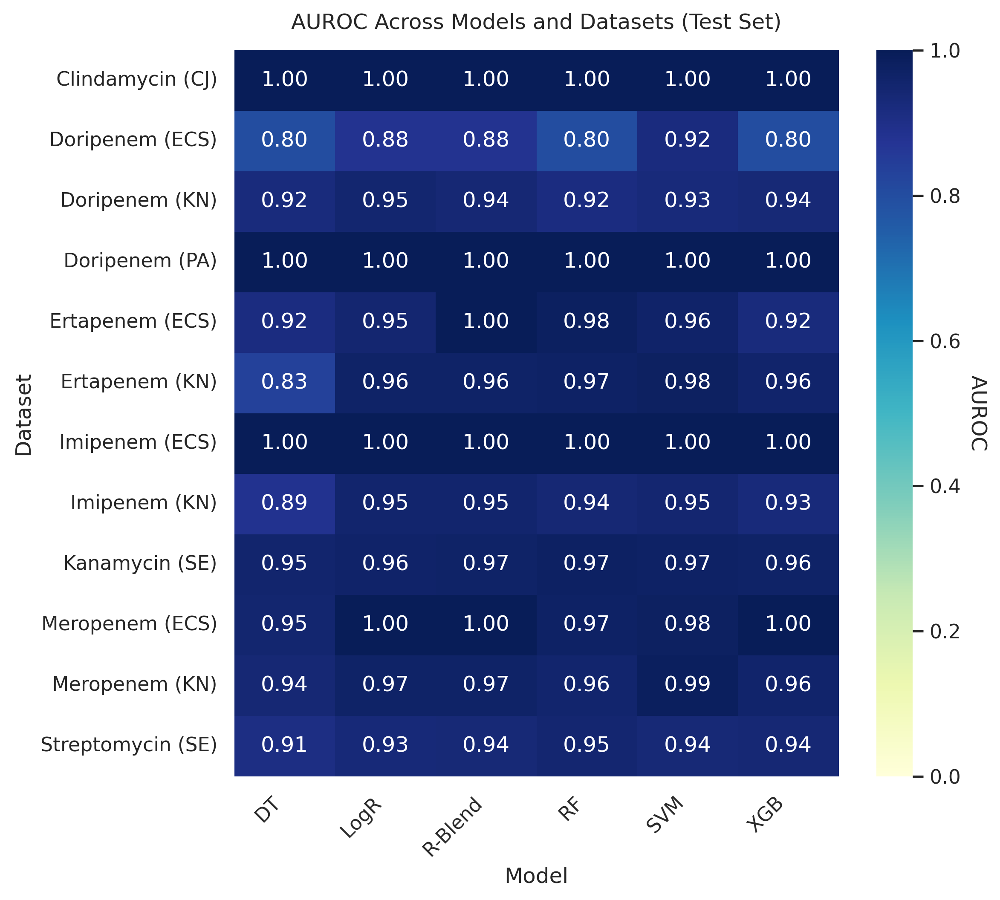

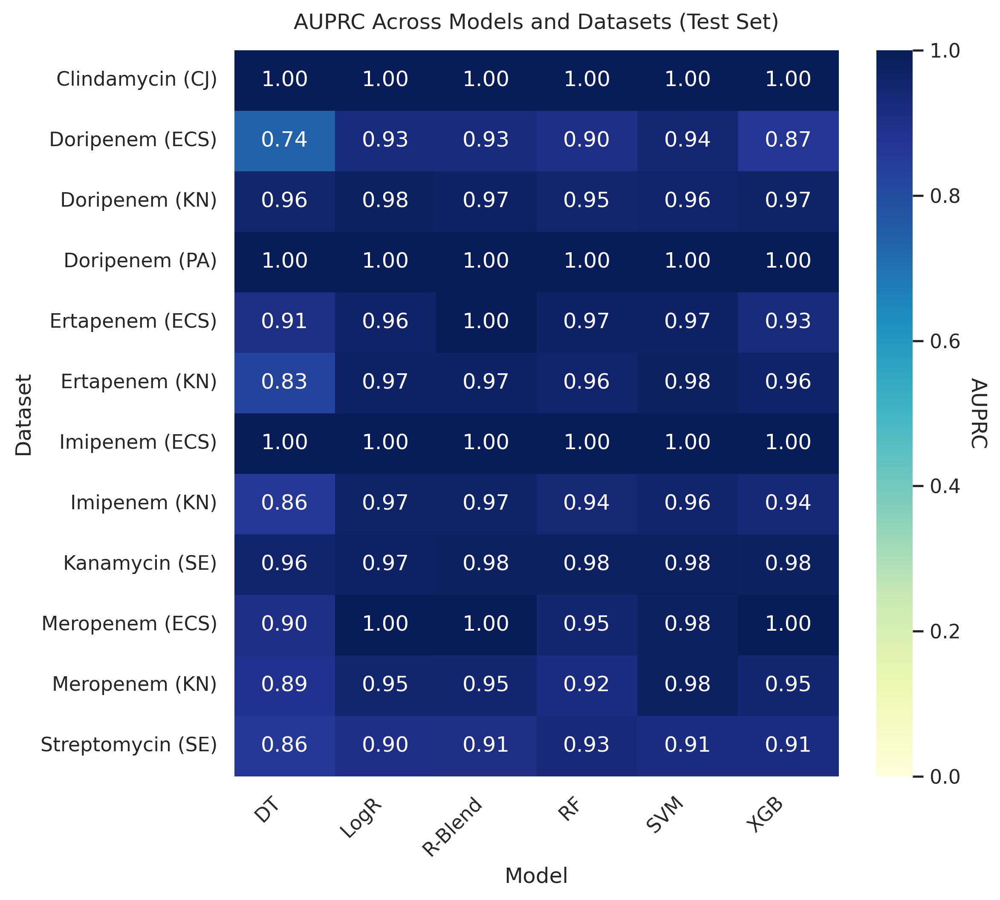

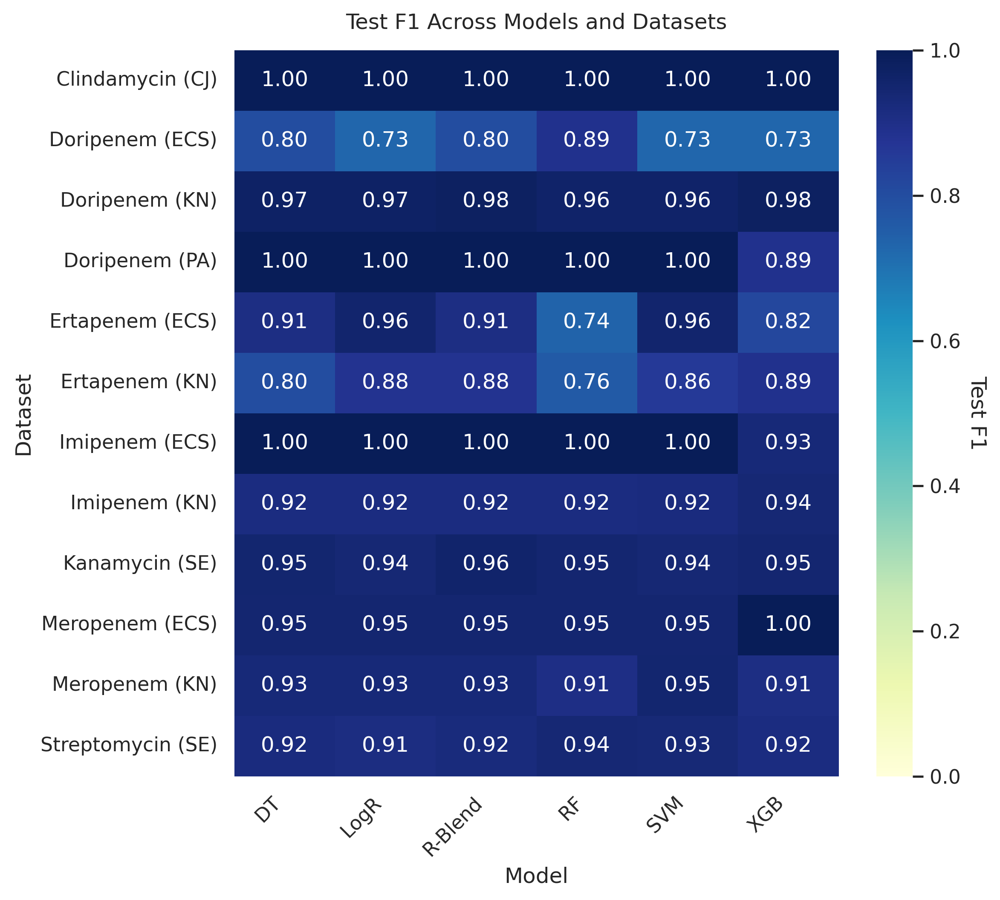

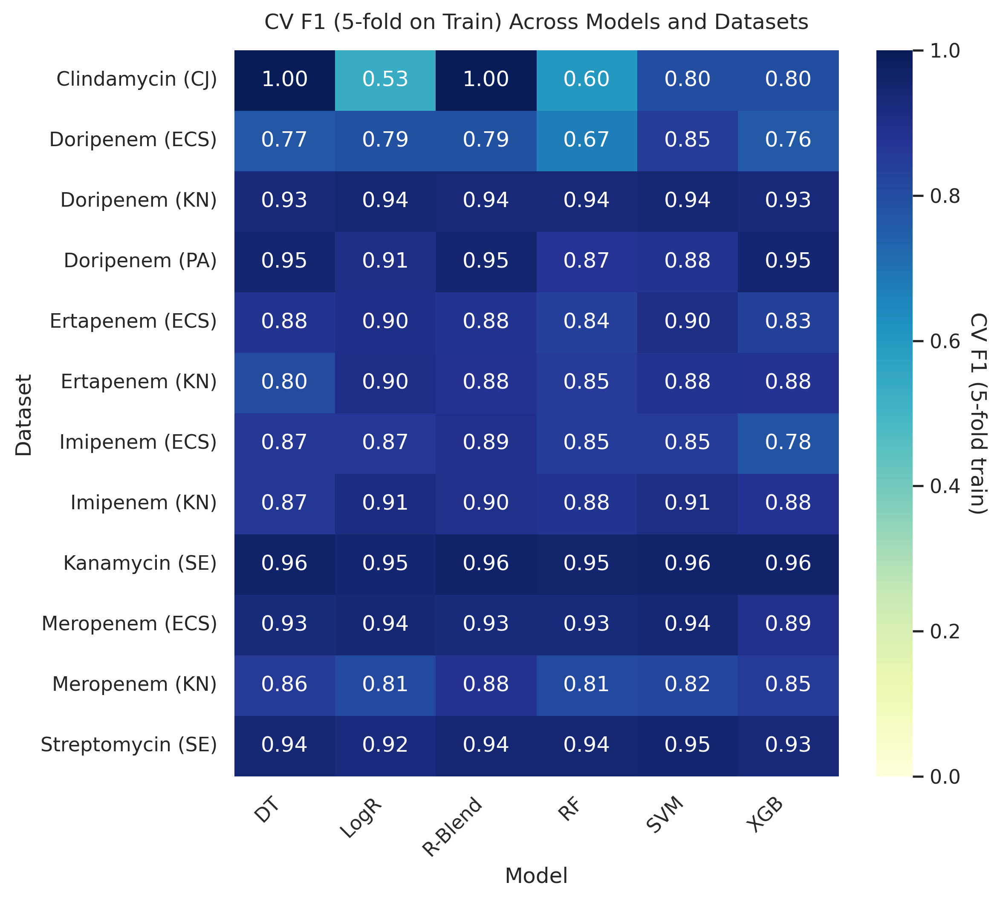


Saved heatmaps to: /content/drive/MyDrive/Research Work/AMR Automation/Output/figures/overview


In [ ]:
# ============================================
# Baseline on ALL datasets in DATASET_PATHS
# Uses your pre-defined `models` list
# ============================================

# ---- Config ----
OUTPUT_ROOT = "/content/drive/MyDrive/Research Work/AMR Automation/Output/"
RANDOM_STATE = 42
TEST_SIZE = 0.2
CV_FOLDS = 5

# ---- Imports ----
import warnings
warnings.filterwarnings("ignore")

from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.base import clone
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import (
    accuracy_score, f1_score, precision_score, recall_score,
    roc_auc_score, average_precision_score, make_scorer
)

# ---- Your `models` list must already be defined in a previous cell ----
# Example:
# models = [
#     ('LogR', LogisticRegression(random_state=0, max_iter=1000)),
#     ...
# ]

# ---- Paths ----
OUT_ROOT = Path(OUTPUT_ROOT)
DIR_TABLES = OUT_ROOT / "tables"
DIR_FIGS = OUT_ROOT / "figures" / "overview"
for d in (DIR_TABLES, DIR_FIGS):
    d.mkdir(parents=True, exist_ok=True)

# ---- Helpers ----
def clean_dataset_name(name: str) -> str:
    parts = name.split('_')
    if len(parts) >= 4:
        antibiotic = parts[2].capitalize()
        pathogen = parts[3].upper()
        return f"{antibiotic} ({pathogen})"
    return name

def get_scores_or_none(model, X):
    """Return scores for ROC/AUPRC: proba[:,1] > decision_function > None."""
    if hasattr(model, "predict_proba"):
        proba = model.predict_proba(X)
        if proba is not None and proba.ndim == 2 and proba.shape[1] > 1:
            return proba[:, 1]
    if hasattr(model, "decision_function"):
        df = model.decision_function(X)
        return df.ravel() if hasattr(df, "ravel") else df
    return None

def plot_metric_heatmap(df, metric_col, save_path, title, vmin=0, vmax=1):
    pivot = df.pivot(index="Dataset", columns="Model", values=metric_col)
    plt.figure(figsize=(max(8, 1.2 * len(pivot.columns)), max(4, 0.6 * len(pivot.index))))
    ax = sns.heatmap(pivot, annot=True, fmt=".2f", cmap="YlGnBu", vmin=vmin, vmax=vmax, cbar=True)
    ax.set_title(title, pad=12)
    ax.set_xlabel("Model")
    ax.set_ylabel("Dataset")
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
    cbar = ax.collections[0].colorbar
    cbar.set_label(metric_col, rotation=270, labelpad=15)
    plt.tight_layout()
    plt.savefig(save_path, dpi=300, bbox_inches="tight")
    plt.show()

# ---- Safety check ----
if 'DATASET_PATHS' not in globals() or not isinstance(DATASET_PATHS, (list, tuple)) or len(DATASET_PATHS) == 0:
    raise ValueError("`DATASET_PATHS` must be defined as a non-empty list of dataset CSV paths.")

if 'models' not in globals() or not isinstance(models, (list, tuple)) or len(models) == 0:
    raise ValueError("`models` list is not defined or empty.")

# ---- Evaluate ALL datasets ----
all_rows = []
per_ds_tables = {}

skf = StratifiedKFold(n_splits=CV_FOLDS, shuffle=True, random_state=RANDOM_STATE)

for path in DATASET_PATHS:
    ds_name = clean_dataset_name(Path(path).stem)
    df = pd.read_csv(path)
    y = df.iloc[:, -1]
    X = df.iloc[:, 1:-1]

    try:
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=TEST_SIZE, stratify=y, random_state=RANDOM_STATE
        )
    except ValueError:
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=TEST_SIZE, random_state=RANDOM_STATE
        )

    rows = []
    for name, base_model in models:
        model = clone(base_model)
        try:
            model.fit(X_train, y_train)
            y_pred_train = model.predict(X_train)
            y_pred_test = model.predict(X_test)

            scores_test = get_scores_or_none(model, X_test)
            if len(np.unique(y_test)) < 2 or scores_test is None:
                auroc = np.nan
                auprc = np.nan
            else:
                auroc = roc_auc_score(y_test, scores_test)
                auprc = average_precision_score(y_test, scores_test)

            cv_f1 = cross_val_score(
                model, X_train, y_train, cv=skf,
                scoring=make_scorer(f1_score, zero_division=0)
            ).mean()

            rows.append({
                "Dataset": ds_name,
                "Model": name,
                "Test Accuracy": accuracy_score(y_test, y_pred_test),
                "Test F1": f1_score(y_test, y_pred_test, zero_division=0),
                "Test Precision": precision_score(y_test, y_pred_test, zero_division=0),
                "Test Recall": recall_score(y_test, y_pred_test, zero_division=0),
                "AUROC": auroc,
                "AUPRC": auprc,
                "CV F1 (5-fold train)": cv_f1,
                "Train Accuracy": accuracy_score(y_train, y_pred_train),
                "Train F1": f1_score(y_train, y_pred_train, zero_division=0),
            })
        except Exception as e:
            rows.append({
                "Dataset": ds_name,
                "Model": name,
                "Test Accuracy": np.nan,
                "Test F1": np.nan,
                "Test Precision": np.nan,
                "Test Recall": np.nan,
                "AUROC": np.nan,
                "AUPRC": np.nan,
                "CV F1 (5-fold train)": np.nan,
                "Train Accuracy": np.nan,
                "Train F1": np.nan,
                "Error": str(e),
            })

    ds_df = pd.DataFrame(rows)
    per_ds_tables[ds_name] = ds_df   # ✅ FIXED assignment bug
    all_rows.extend(rows)

# ---- Combine, round, save ----
df_results = pd.DataFrame(all_rows)
numeric_cols = ["Test Accuracy","Test F1","Test Precision","Test Recall","AUROC","AUPRC","CV F1 (5-fold train)","Train Accuracy","Train F1"]
df_results_rounded = df_results.copy()
for c in numeric_cols:
    df_results_rounded[c] = pd.to_numeric(df_results_rounded[c], errors="coerce").round(3)

combined_csv = DIR_TABLES / "baseline_results_ALL_datasets.csv"
df_results_rounded.to_csv(combined_csv, index=False)

# Save per-dataset CSVs
for ds_name, ds_df in per_ds_tables.items():
    ds_df_round = ds_df.copy()
    for c in numeric_cols:
        ds_df_round[c] = pd.to_numeric(ds_df_round[c], errors="coerce").round(3)
    ds_csv = DIR_TABLES / f"baseline_results_{ds_name.replace(' ','_').replace('(','').replace(')','')}.csv"
    ds_df_round.to_csv(ds_csv, index=False)

from IPython.display import display, Markdown
display(Markdown("### 📊 Baseline Performance — All Datasets (combined)"))
display(df_results_rounded.head(30))
print(f"\nSaved combined results: {combined_csv}")
print("Saved per-dataset results to:", DIR_TABLES)

# ---- Heatmaps ----
plot_metric_heatmap(
    df_results_rounded,
    metric_col="AUROC",
    save_path=DIR_FIGS / "baseline_heatmap_AUROC.png",
    title="AUROC Across Models and Datasets (Test Set)",
    vmin=0, vmax=1
)
plot_metric_heatmap(
    df_results_rounded,
    metric_col="AUPRC",
    save_path=DIR_FIGS / "baseline_heatmap_AUPRC.png",
    title="AUPRC Across Models and Datasets (Test Set)",
    vmin=0, vmax=1
)
plot_metric_heatmap(
    df_results_rounded,
    metric_col="Test F1",
    save_path=DIR_FIGS / "baseline_heatmap_TestF1.png",
    title="Test F1 Across Models and Datasets",
    vmin=0, vmax=1
)
plot_metric_heatmap(
    df_results_rounded,
    metric_col="CV F1 (5-fold train)",
    save_path=DIR_FIGS / "baseline_heatmap_CV_F1_train.png",
    title="CV F1 (5-fold on Train) Across Models and Datasets",
    vmin=0, vmax=1
)

print("\nSaved heatmaps to:", DIR_FIGS)


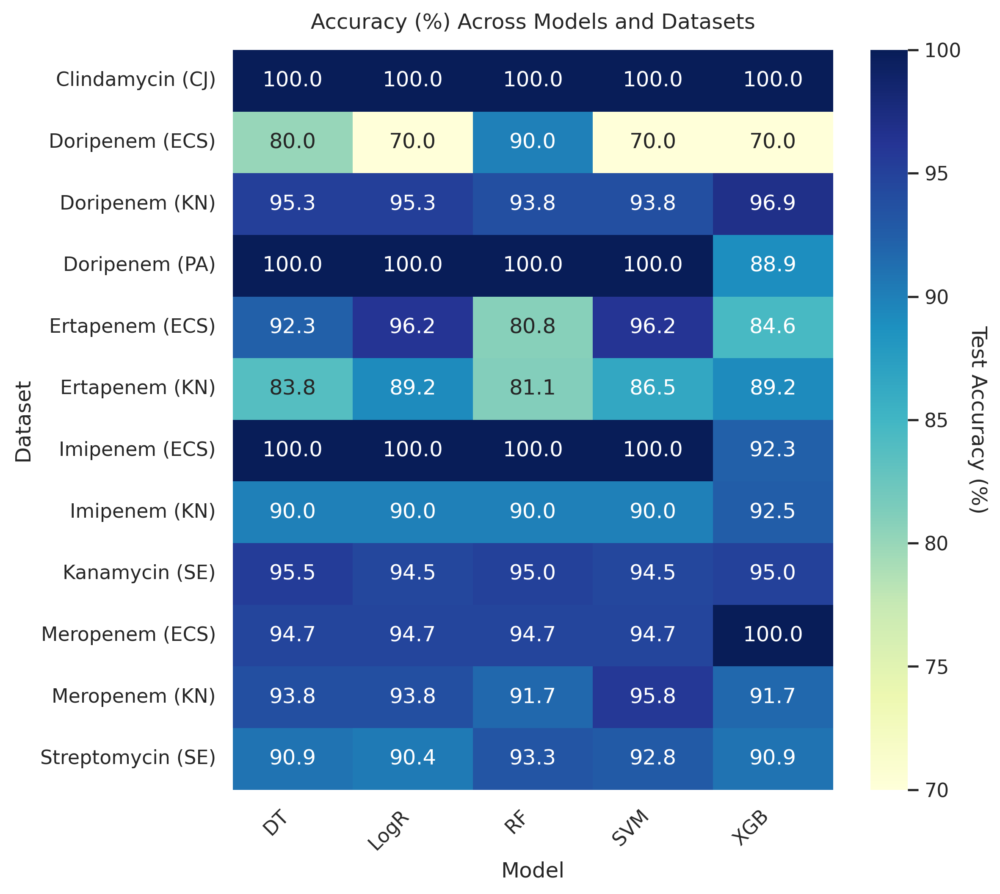

Saved accuracy heatmap (no R-Blend) to: /content/drive/MyDrive/Research Work/AMR Automation/Output/figures/overview/baseline_heatmap_Accuracy_percent_noRBlend.png


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

# Path to combined results CSV
csv_path = "/content/drive/MyDrive/Research Work/AMR Automation/Output/tables/baseline_results_ALL_datasets.csv"

# Load results
df = pd.read_csv(csv_path)

# Filter out R-Blend
df = df[df["Model"] != "R-Blend"]

# Pivot for accuracy
acc_pivot = df.pivot(index="Dataset", columns="Model", values="Test Accuracy")

# Convert to percentages
acc_pivot_percent = acc_pivot * 100

# Dynamic min/max for color scaling
vmin = acc_pivot_percent.min().min()
vmax = acc_pivot_percent.max().max()

plt.figure(figsize=(max(8, 1.2 * len(acc_pivot_percent.columns)), max(4, 0.6 * len(acc_pivot_percent.index))))
ax = sns.heatmap(
    acc_pivot_percent, annot=True, fmt=".1f", cmap="YlGnBu",
    vmin=vmin, vmax=vmax, cbar=True
)

# Labels & title
ax.set_title("Accuracy (%) Across Models and Datasets", pad=12)
ax.set_xlabel("Model")
ax.set_ylabel("Dataset")
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

# Colorbar label
cbar = ax.collections[0].colorbar
cbar.set_label("Test Accuracy (%)", rotation=270, labelpad=15)

plt.tight_layout()

# Save
output_path = Path("/content/drive/MyDrive/Research Work/AMR Automation/Output/figures/overview/baseline_heatmap_Accuracy_percent_noRBlend.png")
plt.savefig(output_path, dpi=300, bbox_inches="tight")
plt.show()

print(f"Saved accuracy heatmap (no R-Blend) to: {output_path}")


# R-Blend Performance: Baseline vs With R-Score (Including Average Row)
This section compares the R-Blend ensemble’s performance across all datasets before and after adding the R-Score feature, reporting metrics such as Accuracy, F1-score, Precision, Recall, AUROC, and AUPRC. An “Average” row is appended to the table, showing the mean value of each metric across all datasets for quick overall comparison.

In [ ]:
# ============================================================
# R-Blend ONLY: Baseline vs With R-Score (print results)
# - Uses DATASET_PATHS (fallback to dataset)
# - Reads baseline CSV if available (else computes baseline)
# - Adds R-Score safely (scaled row-sum, before label)
# ============================================================

# ---- Config ----
OUTPUT_ROOT = "/content/drive/MyDrive/Research Work/AMR Automation/Output/"
BASELINE_CSV = OUTPUT_ROOT + "tables/baseline_results_ALL_datasets.csv"
RANDOM_STATE = 42
TEST_SIZE = 0.2
CV_FOLDS = 5

# ---- Imports ----
import warnings
warnings.filterwarnings("ignore")

from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import MinMaxScaler
from sklearn.base import clone
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import (
    accuracy_score, f1_score, precision_score, recall_score,
    roc_auc_score, average_precision_score, make_scorer
)

# Base models for (re)creating R-Blend if needed
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
try:
    from xgboost import XGBClassifier
    HAS_XGB = True
except Exception:
    HAS_XGB = False

# ---- Paths ----
OUT_ROOT = Path(OUTPUT_ROOT)
DIR_TABLES = OUT_ROOT / "tables"
DIR_FIGS = OUT_ROOT / "figures" / "overview"
for d in (DIR_TABLES, DIR_FIGS):
    d.mkdir(parents=True, exist_ok=True)

# ---- Helpers ----
def scale_column(df, column_name='R-Score'):
    df = df.copy()
    scaler = MinMaxScaler()
    df[column_name] = scaler.fit_transform(df[column_name].values.reshape(-1, 1))
    return df

def clean_dataset_name(name: str):
    parts = name.split('_')
    if len(parts) >= 4:
        antibiotic = parts[2].capitalize()
        pathogen = parts[3].upper()
        return f"{antibiotic} ({pathogen})"
    return name

def add_rscore_column(df: pd.DataFrame) -> pd.DataFrame:
    """
    Create R-Score = row-wise sum across feature columns (col 1 .. col -2),
    min-max scale it, and insert immediately BEFORE the label (last col).
    Assumes col0 is ID; last col is the binary target.
    """
    df = df.copy()
    feature_sum = df.iloc[:, 1:-1].sum(axis=1)
    df["R-Score"] = feature_sum
    df = scale_column(df, column_name="R-Score")

    cols = list(df.columns)
    # move R-Score to just before the label
    cols.insert(-1, cols.pop(cols.index("R-Score")))
    return df[cols]

def get_scores_or_none(model, X):
    """Scores for ROC/AUPRC: proba[:,1] > decision_function > None."""
    if hasattr(model, "predict_proba"):
        proba = model.predict_proba(X)
        if proba is not None and proba.ndim == 2 and proba.shape[1] > 1:
            return proba[:, 1]
    if hasattr(model, "decision_function"):
        s = model.decision_function(X)
        return s.ravel() if hasattr(s, "ravel") else s
    return None

def ensure_rblend(models_list=None):
    """
    Return a (name, estimator) tuple for R-Blend.
    If provided a models list, try to pull 'R-Blend' from it; otherwise build it.
    """
    if models_list:
        try:
            return next((n, m) for (n, m) in models_list if n == "R-Blend")
        except StopIteration:
            pass
    # Recreate R-Blend with the user's exact config
    if not HAS_XGB:
        raise ImportError("xgboost is required to recreate R-Blend but is not installed.")
    rblend = VotingClassifier(
        estimators=[
            ('DT', DecisionTreeClassifier(criterion='entropy', random_state=0)),
            ('LogR', LogisticRegression(random_state=0, max_iter=1000)),
            # ('SVM', SVC(kernel='rbf', probability=True, random_state=0)),
            ('XGB', XGBClassifier(random_state=0, use_label_encoder=False, eval_metric='logloss')),
        ],
        voting='soft',
        weights=[1, 1.5, 1]
    )
    return ("R-Blend", rblend)

# ---- Datasets list ----
if 'DATASET_PATHS' in globals() and isinstance(DATASET_PATHS, (list, tuple)) and len(DATASET_PATHS) > 0:
    DATASETS = DATASET_PATHS
elif 'dataset' in globals() and isinstance(dataset, (list, tuple)) and len(dataset) > 0:
    DATASETS = dataset
else:
    raise ValueError("Provide datasets via `DATASET_PATHS` (preferred) or `dataset` (list of CSV paths).")

# ---- Get R-Blend estimator ----
rblend_name, rblend_est = ensure_rblend(models if 'models' in globals() else None)

# ---- Load Baseline for R-Blend (prefer CSV) ----
baseline_df = None
baseline_path = Path(BASELINE_CSV)
if baseline_path.exists():
    tmp = pd.read_csv(baseline_path)
    if "Model" in tmp.columns and "Dataset" in tmp.columns:
        # Only R-Blend and keep key metrics
        keep_cols_map = {
            "Test Accuracy": "Accuracy",
            "Test F1": "F1-score",
            "Test Precision": "Precision",
            "Test Recall": "Recall",
            "AUROC": "AUROC",
            "AUPRC": "AUPRC",
            "CV F1 (5-fold train)": "CV F1 (5-fold train)",
            "Train Accuracy": "Train Accuracy",
            "Train F1": "Train F1",
        }
        cols_present = [c for c in keep_cols_map.keys() if c in tmp.columns]
        baseline_df = tmp[tmp["Model"] == "R-Blend"][["Dataset", "Model"] + cols_present].copy()
        # rename to unified metric names
        baseline_df = baseline_df.rename(columns=keep_cols_map)
else:
    print("ℹ️ Baseline CSV not found; will compute baseline for R-Blend on the fly.")

# ---- Compute WITH R-Score metrics for R-Blend on all datasets ----
rows_with_r = []
rows_baseline = []  # in case we have to compute baseline now

skf = StratifiedKFold(n_splits=CV_FOLDS, shuffle=True, random_state=RANDOM_STATE)

for path in DATASETS:
    ds_name = clean_dataset_name(Path(path).stem)
    df = pd.read_csv(path)
    y = df.iloc[:, -1].copy()
    # skip tiny classes
    vc = y.value_counts()
    if (vc < 2).any():
        print(f"⚠️ Skipping {ds_name} (insufficient samples).")
        continue

    # --- With R-Score ---
    df_rs = add_rscore_column(df)
    X_rs = df_rs.drop(columns=[df_rs.columns[0], df_rs.columns[-1]])
    Xtr, Xte, ytr, yte = train_test_split(X_rs, y, test_size=TEST_SIZE, stratify=y, random_state=RANDOM_STATE)

    m = clone(rblend_est)
    m.fit(Xtr, ytr)
    y_pred_tr = m.predict(Xtr)
    y_pred_te = m.predict(Xte)
    scores_te = get_scores_or_none(m, Xte)

    auroc = roc_auc_score(yte, scores_te) if (scores_te is not None and len(np.unique(yte)) > 1) else np.nan
    auprc = average_precision_score(yte, scores_te) if (scores_te is not None and len(np.unique(yte)) > 1) else np.nan
    cv_f1 = cross_val_score(m, Xtr, ytr, cv=skf, scoring=make_scorer(f1_score, zero_division=0)).mean()

    rows_with_r.append({
        "Dataset": ds_name,
        "Model": "R-Blend",
        "Accuracy": accuracy_score(yte, y_pred_te),
        "F1-score": f1_score(yte, y_pred_te, zero_division=0),
        "Precision": precision_score(yte, y_pred_te, zero_division=0),
        "Recall": recall_score(yte, y_pred_te, zero_division=0),
        "AUROC": auroc,
        "AUPRC": auprc,
        "CV F1 (5-fold train)": cv_f1,
        "Train Accuracy": accuracy_score(ytr, y_pred_tr),
        "Train F1": f1_score(ytr, y_pred_tr, zero_division=0),
    })

    # --- Baseline on-the-fly if baseline_df missing ---
    if baseline_df is None:
        X = df.iloc[:, 1:-1]  # NO R-Score
        Xtr_b, Xte_b, ytr_b, yte_b = train_test_split(X, y, test_size=TEST_SIZE, stratify=y, random_state=RANDOM_STATE)
        mb = clone(rblend_est)
        mb.fit(Xtr_b, ytr_b)
        y_pred_tr_b = mb.predict(Xtr_b)
        y_pred_te_b = mb.predict(Xte_b)
        scores_te_b = get_scores_or_none(mb, Xte_b)
        auroc_b = roc_auc_score(yte_b, scores_te_b) if (scores_te_b is not None and len(np.unique(yte_b)) > 1) else np.nan
        auprc_b = average_precision_score(yte_b, scores_te_b) if (scores_te_b is not None and len(np.unique(yte_b)) > 1) else np.nan
        cv_f1_b = cross_val_score(mb, Xtr_b, ytr_b, cv=skf, scoring=make_scorer(f1_score, zero_division=0)).mean()
        rows_baseline.append({
            "Dataset": ds_name,
            "Model": "R-Blend",
            "Accuracy": accuracy_score(yte_b, y_pred_te_b),
            "F1-score": f1_score(yte_b, y_pred_te_b, zero_division=0),
            "Precision": precision_score(yte_b, y_pred_te_b, zero_division=0),
            "Recall": recall_score(yte_b, y_pred_te_b, zero_division=0),
            "AUROC": auroc_b,
            "AUPRC": auprc_b,
            "CV F1 (5-fold train)": cv_f1_b,
            "Train Accuracy": accuracy_score(ytr_b, y_pred_tr_b),
            "Train F1": f1_score(ytr_b, y_pred_tr_b, zero_division=0),
        })

df_with_r = pd.DataFrame(rows_with_r)

# If we computed baseline on-the-fly:
if baseline_df is None:
    baseline_df = pd.DataFrame(rows_baseline)

# Keep only overlapping datasets between baseline and with-R
pairs = set(df_with_r["Dataset"]) & set(baseline_df["Dataset"])
df_with_r = df_with_r[df_with_r["Dataset"].isin(pairs)].reset_index(drop=True)
df_baseline_rblend = baseline_df[baseline_df["Model"] == "R-Blend"]
df_baseline_rblend = df_baseline_rblend[df_baseline_rblend["Dataset"].isin(pairs)].reset_index(drop=True)

# ---- Build comparison (R-Blend only) ----
metrics = ["Accuracy","F1-score","Precision","Recall","AUROC","AUPRC","CV F1 (5-fold train)","Train Accuracy","Train F1"]

comp = df_baseline_rblend[["Dataset","Model"] + metrics].merge(
    df_with_r[["Dataset","Model"] + metrics],
    on=["Dataset","Model"], suffixes=(" (Baseline)", " (With R-Score)")
)

# Compute deltas
for m in metrics:
    comp[f"Δ {m}"] = (comp[f"{m} (With R-Score)"] - comp[f"{m} (Baseline)"]).round(3)

# Build an "Average" row across all datasets
avg_row = {"Dataset": "Average", "Model": "R-Blend"}
for col in comp.columns:
    if col not in ["Dataset", "Model"]:
        avg_row[col] = comp[col].mean()

# Append the Average row
comp_with_avg = pd.concat([comp, pd.DataFrame([avg_row])], ignore_index=True)

# Save & display
comp_csv = DIR_TABLES / "rblend_baseline_vs_rscore_with_average.csv"
comp_with_avg.to_csv(comp_csv, index=False)

from IPython.display import display, Markdown
display(Markdown("### ✅ R-Blend — Baseline vs With R-Score (with Average row)"))
display(comp_with_avg)

print(f"\nSaved comparison CSV (with Average row) to: {comp_csv}")

### ✅ R-Blend — Baseline vs With R-Score (with Average row)

,Dataset,Model,Accuracy (Baseline),F1-score (Baseline),Precision (Baseline),Recall (Baseline),AUROC (Baseline),AUPRC (Baseline),CV F1 (5-fold train) (Baseline),Train Accuracy (Baseline),...,Train F1 (With R-Score),Δ Accuracy,Δ F1-score,Δ Precision,Δ Recall,Δ AUROC,Δ AUPRC,Δ CV F1 (5-fold train),Δ Train Accuracy,Δ Train F1
0,Doripenem (KN),R-Blend,0.969000,0.980000,0.961000,1.000000,0.93900,0.9690,0.937000,0.996000,...,0.997403,-0.031000,-0.020,-0.020000,-0.020000,0.00700,0.0040,-0.00500,0.000000,0.000000
1,Ertapenem (KN),R-Blend,0.892000,0.882000,0.938000,0.833000,0.96500,0.9690,0.876000,1.000000,...,1.000000,-0.000000,0.007,-0.049000,0.056000,0.00900,0.0030,-0.02200,0.000000,0.000000
2,Meropenem (ECS),R-Blend,0.947000,0.947000,0.900000,1.000000,1.00000,1.0000,0.926000,0.972000,...,0.985915,0.000000,0.000,0.000000,0.000000,0.00000,0.0000,0.01800,0.014000,0.015000
3,Ertapenem (ECS),R-Blend,0.923000,0.909000,1.000000,0.833000,1.00000,1.0000,0.880000,0.981000,...,0.979167,0.039000,0.048,0.000000,0.084000,-0.03600,-0.0280,0.04500,-0.000000,0.000000
4,Doripenem (ECS),R-Blend,0.800000,0.800000,0.800000,0.800000,0.88000,0.9250,0.788000,1.000000,...,1.000000,0.100000,0.089,0.200000,0.000000,-0.04000,-0.0140,0.05100,0.000000,0.000000
5,Imipenem (ECS),R-Blend,1.000000,1.000000,1.000000,1.000000,1.00000,1.0000,0.893000,0.980000,...,0.982456,0.000000,0.000,0.000000,0.000000,0.00000,0.0000,-0.07600,0.000000,0.000000
6,Doripenem (PA),R-Blend,1.000000,1.000000,1.000000,1.000000,1.00000,1.0000,0.949000,1.000000,...,1.000000,0.000000,0.000,0.000000,0.000000,0.00000,0.0000,-0.01100,0.000000,0.000000
7,Streptomycin (SE),R-Blend,0.914000,0.922000,0.870000,0.982000,0.93500,0.9080,0.942000,0.957000,...,0.961883,0.005000,0.004,0.007000,-0.000000,0.00500,0.0070,-0.00200,0.002000,0.002000
8,Imipenem (KN),R-Blend,0.900000,0.917000,0.880000,0.957000,0.95400,0.9670,0.897000,0.994000,...,0.994475,0.000000,-0.000,0.000000,-0.000000,0.01500,0.0110,-0.00900,-0.000000,0.000000
9,Clindamycin (CJ),R-Blend,1.000000,1.000000,1.000000,1.000000,1.00000,1.0000,1.000000,1.000000,...,1.000000,0.000000,0.000,0.000000,0.000000,0.00000,0.0000,0.00000,0.000000,0.000000



Saved comparison CSV (with Average row) to: /content/drive/MyDrive/Research Work/AMR Automation/Output/tables/rblend_baseline_vs_rscore_with_average.csv


# R-Blend Performance Across Balancing Strategies (with R-Score)
This section evaluates the R-Blend ensemble on all datasets using multiple data balancing strategies applied to the training set, including SMOTE, Random Over/Under-sampling, ADASYN, and hybrid methods, both with and without the R-Score feature. The results table reports Accuracy, F1-score, Precision, Recall, AUROC, and AUPRC for each method and dataset, along with an average row summarizing overall performance.

In [ ]:
# ============================================================
# R-Blend only: Balancing strategy comparison (robust version)
# - Adds R-Score (scaled) before label
# - Adapts k_neighbors per split; skips impossible resamples
# - Saves per-dataset + Average row
# ============================================================

# ---- Config ----
OUTPUT_ROOT = "/content/drive/MyDrive/Research Work/AMR Automation/Output/"
TEST_SIZE = 0.2
RANDOM_STATE = 42

# ---- Imports ----
import warnings
warnings.filterwarnings("ignore")

from pathlib import Path
import numpy as np
import pandas as pd

from sklearn.base import clone
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score, f1_score, precision_score, recall_score,
    roc_auc_score, average_precision_score
)
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import VotingClassifier
try:
    from xgboost import XGBClassifier
    HAS_XGB = True
except Exception:
    HAS_XGB = False

# imblearn resamplers
from imblearn.over_sampling import SMOTE, RandomOverSampler, ADASYN, BorderlineSMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.combine import SMOTEENN, SMOTETomek

# ---- Paths ----
OUT_ROOT = Path(OUTPUT_ROOT)
DIR_TABLES = OUT_ROOT / "tables"
DIR_FIGS = OUT_ROOT / "figures" / "overview"
for d in (DIR_TABLES, DIR_FIGS):
    d.mkdir(parents=True, exist_ok=True)

# ---- Helpers ----
def clean_dataset_name(name: str):
    parts = name.split('_')
    if len(parts) >= 4:
        antibiotic = parts[2].capitalize()
        pathogen = parts[3].upper()
        return f"{antibiotic} ({pathogen})"
    return name

def add_rscore_column(df: pd.DataFrame) -> pd.DataFrame:
    """Add R-Score = min-max scaled row-wise sum (cols 1..-2), insert before label."""
    df = df.copy()
    rsum = df.iloc[:, 1:-1].sum(axis=1)
    df["R-Score"] = MinMaxScaler().fit_transform(rsum.values.reshape(-1, 1))
    cols = list(df.columns)
    cols.insert(-1, cols.pop(cols.index("R-Score")))
    return df[cols]

def get_scores_or_none(model, X):
    if hasattr(model, "predict_proba"):
        proba = model.predict_proba(X)
        if proba is not None and proba.ndim == 2 and proba.shape[1] > 1:
            return proba[:, 1]
    if hasattr(model, "decision_function"):
        s = model.decision_function(X)
        return s.ravel() if hasattr(s, "ravel") else s
    return None

def ensure_rblend(models_list=None):
    """Return ('R-Blend', estimator) from provided list if present; else recreate exactly."""
    if models_list:
        for n, m in models_list:
            if n == "R-Blend":
                return n, m
    if not HAS_XGB:
        raise ImportError("xgboost is required to recreate R-Blend but is not installed.")
    return "R-Blend", VotingClassifier(
        estimators=[
            ('DT',   DecisionTreeClassifier(criterion='entropy', random_state=0)),
            ('LogR', LogisticRegression(random_state=0, max_iter=1000)),
            # ('SVM',  SVC(kernel='rbf', probability=True, random_state=0)),
            ('XGB',  XGBClassifier(random_state=0, use_label_encoder=False, eval_metric='logloss')),
        ],
        voting='soft',
        weights=[1, 1.5, 1]
    )

def adaptive_resampler(resampler, y_train):
    """Clone/build resampler with k_neighbors adapted to minority count; return (resampler, note)."""
    if resampler is None or not hasattr(resampler, "fit_resample"):
        return resampler, ""
    n_min = min(np.bincount(y_train.astype(int))) if set(np.unique(y_train)) <= {0,1} else y_train.value_counts().min()
    # If too tiny, many algorithms can't synthesize
    if n_min < 2:
        return None, "skip: minority<2"
    # For SMOTE-like methods, set k_neighbors <= n_min-1
    k = max(1, min(5, n_min - 1))
    try:
        if isinstance(resampler, (SMOTE, BorderlineSMOTE, ADASYN)):
            # rebuild with same params but new k_neighbors
            params = resampler.get_params()
            params["k_neighbors"] = k
            if isinstance(resampler, SMOTE):
                newr = SMOTE(**params)
            elif isinstance(resampler, BorderlineSMOTE):
                newr = BorderlineSMOTE(**params)
            else:
                newr = ADASYN(**params)
            return newr, f"k_neighbors={k}"
        elif isinstance(resampler, (SMOTEENN, SMOTETomek)):
            # inner SMOTE gets k_neighbors, but these don't expose directly; leave as-is
            return resampler, ""
        else:
            return resampler, ""
    except Exception as e:
        return None, f"skip: adapt-failed ({e})"

# ---- Datasets source ----
if 'DATASET_PATHS' in globals() and isinstance(DATASET_PATHS, (list, tuple)) and len(DATASET_PATHS) > 0:
    DATASETS = DATASET_PATHS
elif 'dataset' in globals() and isinstance(dataset, (list, tuple)) and len(dataset) > 0:
    DATASETS = dataset
else:
    raise ValueError("Provide datasets via `DATASET_PATHS` or `dataset` (list of CSV paths).")

# ---- Get R-Blend ----
rblend_name, rblend_est = ensure_rblend(models if 'models' in globals() else None)

# ---- Define balancing methods ----
resamplers = {
    "Baseline (no R-Score)": None,                # plain, no R-Score, no resampling
    "R-Score only": "R-Score",                    # add R-Score, no resampling
    "R-Score + SMOTE": SMOTE(random_state=RANDOM_STATE),
    "R-Score + RandomOver": RandomOverSampler(random_state=RANDOM_STATE),
    "R-Score + RandomUnder": RandomUnderSampler(random_state=RANDOM_STATE),
    "R-Score + ADASYN": ADASYN(random_state=RANDOM_STATE),
    "R-Score + BorderlineSMOTE": BorderlineSMOTE(random_state=RANDOM_STATE),
    "R-Score + SMOTEENN": SMOTEENN(random_state=RANDOM_STATE),
    "R-Score + SMOTETomek": SMOTETomek(random_state=RANDOM_STATE),
}

# ---- Evaluate ----
rows = []
for p in DATASETS:
    ds_name = clean_dataset_name(Path(p).stem)
    df_orig = pd.read_csv(p)

    y_all = df_orig.iloc[:, -1]
    vc = y_all.value_counts()
    if (vc < 2).any():
        print(f"⚠️ Skipping {ds_name} (insufficient samples in one of the classes).")
        continue

    for method, resampler in resamplers.items():
        # Data with/without R-Score
        df = df_orig if method == "Baseline (no R-Score)" else add_rscore_column(df_orig)
        y = df.iloc[:, -1]
        X = df.drop(columns=[df.columns[0], df.columns[-1]])  # drop ID & label

        # Split
        try:
            X_tr, X_te, y_tr, y_te = train_test_split(X, y, stratify=y, test_size=TEST_SIZE, random_state=RANDOM_STATE)
        except ValueError:
            X_tr, X_te, y_tr, y_te = train_test_split(X, y, test_size=TEST_SIZE, random_state=RANDOM_STATE)

        # Resample (train only)
        note = ""
        if hasattr(resampler, "fit_resample"):
            r_adapt, note = adaptive_resampler(resampler, y_tr)
            if r_adapt is not None:
                try:
                    X_tr, y_tr = r_adapt.fit_resample(X_tr, y_tr)
                except Exception as e:
                    note = f"skip: {type(resampler).__name__} ({e})"
            else:
                # r_adapt None -> skip due to tiny minority or adapt-failed
                pass

        # Fit R-Blend
        model = clone(rblend_est)
        model.fit(X_tr, y_tr)

        # Predict
        y_pred = model.predict(X_te)
        scores = get_scores_or_none(model, X_te)

        # Metrics
        acc = accuracy_score(y_te, y_pred)
        f1 = f1_score(y_te, y_pred, zero_division=0)
        prec = precision_score(y_te, y_pred, zero_division=0)
        rec = recall_score(y_te, y_pred, zero_division=0)
        if scores is not None and len(np.unique(y_te)) > 1:
            auroc = roc_auc_score(y_te, scores)
            auprc = average_precision_score(y_te, scores)
        else:
            auroc = np.nan
            auprc = np.nan

        rows.append({
            "Dataset": ds_name,
            "Method": method,
            "Model": "R-Blend",
            "Accuracy": acc,
            "F1-score": f1,
            "Precision": prec,
            "Recall": rec,
            "AUROC": auroc,
            "AUPRC": auprc,
            "Note": note
        })

df_bal = pd.DataFrame(rows)

# Append per-method Average row
avg = df_bal.drop(columns=["Dataset"]).groupby("Method").mean(numeric_only=True).reset_index()
avg.insert(0, "Dataset", "Average")
avg["Model"] = "R-Blend"
df_bal_with_avg = pd.concat([df_bal, avg], ignore_index=True)

# Save & display
out_csv = DIR_TABLES / "rblend_balancing_results.csv"
df_bal_with_avg.to_csv(out_csv, index=False)

from IPython.display import display, Markdown
display(Markdown("### ✅ R-Blend — Balancing Strategies (per-dataset + Average, robust)"))
display(df_bal_with_avg.head(50))
print(f"\nSaved table: {out_csv}")


### ✅ R-Blend — Balancing Strategies (per-dataset + Average, robust)

,Dataset,Method,Model,Accuracy,F1-score,Precision,Recall,AUROC,AUPRC,Note
0,Doripenem (KN),Baseline (no R-Score),R-Blend,0.968750,0.980000,0.960784,1.000000,0.938776,0.968670,
1,Doripenem (KN),R-Score only,R-Blend,0.937500,0.960000,0.941176,0.979592,0.945578,0.973074,
2,Doripenem (KN),R-Score + SMOTE,R-Blend,0.953125,0.969697,0.960000,0.979592,0.936054,0.961846,k_neighbors=5
3,Doripenem (KN),R-Score + RandomOver,R-Blend,0.953125,0.969697,0.960000,0.979592,0.931973,0.963756,
4,Doripenem (KN),R-Score + RandomUnder,R-Blend,0.921875,0.948454,0.958333,0.938776,0.922449,0.959016,
5,Doripenem (KN),R-Score + ADASYN,R-Blend,0.937500,0.960000,0.941176,0.979592,0.945578,0.973074,skip: adapt-failed (ADASYN.__init__() got an u...
6,Doripenem (KN),R-Score + BorderlineSMOTE,R-Blend,0.953125,0.969697,0.960000,0.979592,0.936054,0.959634,k_neighbors=5
7,Doripenem (KN),R-Score + SMOTEENN,R-Blend,0.921875,0.947368,0.978261,0.918367,0.976871,0.992721,
8,Doripenem (KN),R-Score + SMOTETomek,R-Blend,0.953125,0.969697,0.960000,0.979592,0.936054,0.961846,
9,Ertapenem (KN),Baseline (no R-Score),R-Blend,0.891892,0.882353,0.937500,0.833333,0.964912,0.968951,



Saved table: /content/drive/MyDrive/Research Work/AMR Automation/Output/tables/rblend_balancing_results.csv


# Sequential Grid Search with Feature Selection with ANOVA and RF/XGB for R-Blend
This section performs a grid search to evaluate the performance of R-Blend models across various ANOVA p-values, feature selectors (RF or XGB), and cumulative importance cutoffs. The code processes each dataset sequentially, applies SMOTETomek for resampling, and computes performance metrics like F1-score, AUROC, Precision, Recall, and AUPRC. Results are saved per dataset as well as in a master CSV file, with detailed logs stored for each dataset's execution. Additionally, the selected features for each model and setting are tracked and stored for analysis.

In [ ]:
# ============================================================
# Grid search — Sequential (CPU-friendly)
# No parallelism, SMOTETomek safety, verbose progress
# ============================================================

import warnings, json, time
warnings.filterwarnings("ignore")

from pathlib import Path
import numpy as np
import pandas as pd

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, average_precision_score
)
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import f_classif
from sklearn.ensemble import VotingClassifier, RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from xgboost import XGBClassifier

from imblearn.combine import SMOTETomek

# -----------------------
# CONFIG (same dirs as before)
# -----------------------
OUTPUT_ROOT = "/content/drive/MyDrive/Research Work/AMR Automation/Output/"
OUT = Path(OUTPUT_ROOT)

DIR_GS         = OUT / "gridsearch"
DIR_LOGS       = DIR_GS / "logs"
DIR_CONFIGS    = DIR_GS / "configs"
DIR_RESULTS_PD = DIR_GS / "per_dataset"
DIR_BEST       = DIR_GS / "best_models"

DIR_FS         = OUT / "feature_selection"
DIR_FS_SEL     = DIR_FS / "selections"
DIR_FS_VENN    = DIR_FS / "venn"
DIR_FS_RANK    = DIR_FS / "feature_rankings"

for d in [DIR_GS, DIR_LOGS, DIR_CONFIGS, DIR_RESULTS_PD, DIR_BEST,
          DIR_FS, DIR_FS_SEL, DIR_FS_VENN, DIR_FS_RANK]:
    d.mkdir(parents=True, exist_ok=True)

RANDOM_STATE = 42
TEST_SIZE = 0.2
SELECT_SET = "union"      # use "union" of ANOVA & selector features
ANOVA_PS = [0.05, 0.1, 0.3]
SELECTORS = ["RF", "XGB"]
CUTOFFS = [85, 90, 95]  # %

# -----------------------
# Helpers
# -----------------------
def clean_dataset_name(name: str):
    parts = name.split('_')
    if len(parts) >= 4:
        antibiotic = parts[2].capitalize()
        pathogen = parts[3].upper()
        return f"{antibiotic} ({pathogen})"
    return name

def slug(s: str) -> str:
    return str(s).replace("(", "").replace(")", "").replace(" ", "_").replace("/", "_")

def add_rscore(X_df: pd.DataFrame) -> pd.DataFrame:
    X = X_df.copy()
    rsum = X.sum(axis=1)
    X["R-Score"] = MinMaxScaler().fit_transform(rsum.values.reshape(-1, 1))
    return X

def anova_select(X_tr: pd.DataFrame, y_tr: pd.Series, p_thresh: float):
    f_vals, p_vals = f_classif(X_tr, y_tr)
    p_series = pd.Series(p_vals, index=X_tr.columns, name="p_value")
    keep = p_series[p_series <= p_thresh].index.tolist()
    if "R-Score" in X_tr.columns and "R-Score" not in keep:
        keep.append("R-Score")
    return p_series, keep

def selector_importances(model_name: str, X_tr: pd.DataFrame, y_tr: pd.Series) -> pd.Series:
    if model_name == "RF":
        model = RandomForestClassifier(
            n_estimators=300, criterion="entropy", random_state=RANDOM_STATE, n_jobs=-1
        )
    elif model_name == "XGB":
        model = XGBClassifier(
            random_state=RANDOM_STATE, use_label_encoder=False, eval_metric='logloss',
            n_estimators=400, max_depth=6, subsample=0.8, colsample_bytree=0.8, n_jobs=-1
        )
    else:
        raise ValueError("selector must be 'RF' or 'XGB'")
    model.fit(X_tr, y_tr)
    s = pd.Series(model.feature_importances_, index=X_tr.columns, name="importance")
    return s.sort_values(ascending=False)

def cutoff_features_by_cumulative(importances: pd.Series, cutoff_pct: int) -> list[str]:
    imp = importances / max(importances.sum(), 1e-12)
    cum = imp.cumsum()
    keep = cum[cum <= (cutoff_pct / 100.0)].index.tolist()
    if len(keep) == 0 and len(importances) > 0:
        keep = [importances.index[0]]
    return keep

def rblend_est():
    return VotingClassifier(
        estimators=[
            ('DT',   DecisionTreeClassifier(criterion='entropy', random_state=0)),
            ('LogR', LogisticRegression(random_state=0, max_iter=1000)),
            # ('SVM',  SVC(kernel='rbf', probability=True, random_state=0)),
            ('XGB',  XGBClassifier(random_state=0, use_label_encoder=False, eval_metric='logloss')),
        ],
        voting='soft',
        weights=[1, 1.5, 1],
        n_jobs=-1
    )

def safe_metrics(y_true, y_pred, scores=None):
    acc  = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, zero_division=0)
    rec  = recall_score(y_true, y_pred, zero_division=0)
    f1   = f1_score(y_true, y_pred, zero_division=0)
    if scores is not None and len(np.unique(y_true)) > 1:
        try:
            auroc = roc_auc_score(y_true, scores)
            auprc = average_precision_score(y_true, scores)
        except Exception:
            auroc, auprc = np.nan, np.nan
    else:
        auroc, auprc = np.nan, np.nan
    return acc, prec, rec, f1, auroc, auprc

def get_scores(model, X):
    if hasattr(model, "predict_proba"):
        p = model.predict_proba(X)
        if p is not None and p.ndim == 2 and p.shape[1] > 1:
            return p[:, 1]
    if hasattr(model, "decision_function"):
        s = model.decision_function(X)
        return s.ravel()
    return None

# -----------------------
# One setting
# -----------------------
def run_setting(ds_name, df, anova_p, selector, cutoff, log_path):
    t0 = time.time()

    y = df.iloc[:, -1]
    X = add_rscore(df.iloc[:, 1:-1])

    try:
        X_tr, X_te, y_tr, y_te = train_test_split(
            X, y, test_size=TEST_SIZE, stratify=y, random_state=RANDOM_STATE
        )
    except ValueError:
        X_tr, X_te, y_tr, y_te = train_test_split(X, y, test_size=TEST_SIZE, random_state=RANDOM_STATE)

    vc = y.value_counts()
    n_pos, n_neg = int(vc.get(1, 0)), int(vc.get(0, 0))
    print(f"Starting: [{ds_name}] R={n_pos} S={n_neg} | ANOVA p={anova_p:.2f} | Selector={selector} | Cut={cutoff}%", flush=True)

    # Selection
    pvals, anova_keep = anova_select(X_tr, y_tr, anova_p)
    importances = selector_importances(selector, X_tr, y_tr)
    model_keep = cutoff_features_by_cumulative(importances, cutoff)

    anova_set, model_set = set(anova_keep), set(model_keep)
    both_set  = anova_set & model_set
    union_set = anova_set | model_set

    feats_use = list(union_set) if SELECT_SET == "union" else list(both_set) if both_set else list(model_set)
    feats_use = [f for f in X.columns if f in feats_use]
    X_tr_sel, X_te_sel = X_tr[feats_use], X_te[feats_use]

    # Safe SMOTETomek
    if y_tr.value_counts().min() < 2:
        X_tr_bal, y_tr_bal = X_tr_sel, y_tr
        resample_note = "NO-RESAMPLE(min<2)"
    else:
        smt = SMOTETomek(random_state=RANDOM_STATE)
        X_tr_bal, y_tr_bal = smt.fit_resample(X_tr_sel, y_tr)
        resample_note = "SMOTETomek"

    model = rblend_est()
    model.fit(X_tr_bal, y_tr_bal)
    y_pred = model.predict(X_te_sel)
    scores = get_scores(model, X_te_sel)
    acc, prec, rec, f1, auroc, auprc = safe_metrics(y_te, y_pred, scores)

    line = f"[{ds_name}] R={n_pos} S={n_neg} | {resample_note} | p={anova_p} | {selector} {cutoff}% | F1={f1:.3f} AUROC={auroc:.3f}"
    print(line, flush=True)
    with open(log_path, "a") as f:
        f.write(line + "\n")

    return {
        "Dataset": ds_name, "anova_p": anova_p, "selector_model": selector, "cum_importance": cutoff,
        "Accuracy": acc, "Precision": prec, "Recall": rec, "F1": f1, "AUROC": auroc, "AUPRC": auprc,
        "resample": resample_note
    }

# -----------------------
# Run sequential per dataset
# -----------------------
if 'DATASET_PATHS' in globals():
    DATASETS = DATASET_PATHS
elif 'dataset' in globals():
    DATASETS = dataset
else:
    raise ValueError("Provide datasets via DATASET_PATHS or dataset.")

all_rows = []
for path in DATASETS:
    df = pd.read_csv(path)
    ds_name = clean_dataset_name(Path(path).stem)
    if df.iloc[:, -1].nunique() < 2:
        print(f"⚠️ Skipping {ds_name} (only one class).")
        continue

    log_path = DIR_LOGS / f"{slug(ds_name)}.log"
    with open(log_path, "w") as f:
        f.write(f"Grid search log for {ds_name}\n")

    for p in ANOVA_PS:
        for sel in SELECTORS:
            for cut in CUTOFFS:
                res = run_setting(ds_name, df, p, sel, cut, log_path)
                all_rows.append(res)

    # Save per-dataset results
    ds_df = pd.DataFrame([r for r in all_rows if r["Dataset"] == ds_name])
    ds_df = ds_df.sort_values(["F1","AUROC"], ascending=False).reset_index(drop=True)
    ds_df.to_csv(DIR_RESULTS_PD / f"{slug(ds_name)}_grid_results.csv", index=False)

# Save master
master_df = pd.DataFrame(all_rows)
master_df.to_csv(DIR_GS / "results_master.csv", index=False)
print("✅ Grid search complete (sequential)")


Starting: [Doripenem (KN)] R=241 S=75 | ANOVA p=0.05 | Selector=RF | Cut=85%
[Doripenem (KN)] R=241 S=75 | SMOTETomek | p=0.05 | RF 85% | F1=0.970 AUROC=0.935
Starting: [Doripenem (KN)] R=241 S=75 | ANOVA p=0.05 | Selector=RF | Cut=90%
[Doripenem (KN)] R=241 S=75 | SMOTETomek | p=0.05 | RF 90% | F1=0.970 AUROC=0.933
Starting: [Doripenem (KN)] R=241 S=75 | ANOVA p=0.05 | Selector=RF | Cut=95%
[Doripenem (KN)] R=241 S=75 | SMOTETomek | p=0.05 | RF 95% | F1=0.970 AUROC=0.935
Starting: [Doripenem (KN)] R=241 S=75 | ANOVA p=0.05 | Selector=XGB | Cut=85%
[Doripenem (KN)] R=241 S=75 | SMOTETomek | p=0.05 | XGB 85% | F1=0.970 AUROC=0.937
Starting: [Doripenem (KN)] R=241 S=75 | ANOVA p=0.05 | Selector=XGB | Cut=90%
[Doripenem (KN)] R=241 S=75 | SMOTETomek | p=0.05 | XGB 90% | F1=0.970 AUROC=0.937
Starting: [Doripenem (KN)] R=241 S=75 | ANOVA p=0.05 | Selector=XGB | Cut=95%
[Doripenem (KN)] R=241 S=75 | SMOTETomek | p=0.05 | XGB 95% | F1=0.970 AUROC=0.935
Starting: [Doripenem (KN)] R=241 S=75 | 

In [ ]:
import pandas as pd
from pathlib import Path

# Path to the master results CSV
OUTPUT_ROOT = "/content/drive/MyDrive/Research Work/AMR Automation/Output/"
DIR_GS = Path(OUTPUT_ROOT) / "gridsearch"
MASTER_CSV = DIR_GS / "results_master.csv"

# Load results
df = pd.read_csv(MASTER_CSV)

# Group by settings and average metrics
avg_df = (
    df.groupby(["anova_p", "selector_model", "cum_importance"], as_index=False)
      [["Accuracy", "Precision", "Recall", "F1", "AUROC", "AUPRC"]]
      .mean()
      .round(4)
      .sort_values("F1", ascending=False)
      .reset_index(drop=True)
)

# Save & display
AVG_CSV = DIR_GS / "results_avg_over_datasets.csv"
avg_df.to_csv(AVG_CSV, index=False)

print(f"✅ Saved average results to {AVG_CSV}")
display(avg_df)

✅ Saved average results to /content/drive/MyDrive/Research Work/AMR Automation/Output/gridsearch/results_avg_over_datasets.csv


,anova_p,selector_model,cum_importance,Accuracy,Precision,Recall,F1,AUROC,AUPRC
0,0.30,XGB,85,0.9540,0.9537,0.9610,0.9551,0.9619,0.9691
1,0.30,XGB,90,0.9520,0.9533,0.9573,0.9532,0.9658,0.9699
2,0.30,XGB,95,0.9467,0.9447,0.9573,0.9486,0.9615,0.9669
3,0.10,XGB,95,0.9460,0.9432,0.9563,0.9472,0.9571,0.9660
4,0.05,XGB,95,0.9461,0.9458,0.9527,0.9471,0.9581,0.9670
5,0.10,XGB,85,0.9453,0.9447,0.9534,0.9468,0.9587,0.9675
6,0.10,RF,95,0.9454,0.9483,0.9491,0.9467,0.9604,0.9676
7,0.30,RF,95,0.9454,0.9483,0.9491,0.9467,0.9600,0.9645
8,0.10,XGB,90,0.9452,0.9444,0.9524,0.9462,0.9585,0.9678
9,0.05,RF,95,0.9446,0.9471,0.9491,0.9460,0.9600,0.9667


# Best Model Configuration: R-Blend with R-Score and SMOTETomek (ANOVA p = 0.3, XGB Importance = 85%)
This section focuses on examining the features selected by ANOVA and XGB for different datasets in the R-Blend configuration with ANOVA p = 0.3 and XGB importance cutoff = 85%. It evaluates which features are selected by ANOVA, XGB, and the union of both for each dataset. The goal is to compare the features identified by each method and understand their contributions to the model. Additionally, the features common to both methods are highlighted, providing insights into the feature selection process for R-Blend. The results are saved in a CSV file for further analysis.

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, average_precision_score
from sklearn.feature_selection import f_classif
from sklearn.ensemble import VotingClassifier, RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from xgboost import XGBClassifier
from imblearn.combine import SMOTETomek
from sklearn.preprocessing import MinMaxScaler
from pathlib import Path
import time

# Configuration and paths
OUTPUT_ROOT = "/content/drive/MyDrive/Research Work/AMR Automation/Output/"
DIR_GS = Path(OUTPUT_ROOT) / "gridsearch"
DIR_LOGS = DIR_GS / "logs"
DIR_RESULTS_PD = DIR_GS / "per_dataset"

for d in [DIR_GS, DIR_LOGS, DIR_RESULTS_PD]:
    d.mkdir(parents=True, exist_ok=True)

# Settings
RANDOM_STATE = 42
TEST_SIZE = 0.2
ANOVA_PS = [0.30]
SELECTORS = ["XGB"]
CUTOFFS = [85]

ANOVA_P  = 0.30
SELECTOR = "XGB"
CUTOFF   = 85

# Helper functions
def clean_dataset_name(name: str):
    parts = name.split('_')
    if len(parts) >= 4:
        antibiotic = parts[2].capitalize()
        pathogen = parts[3].upper()
        return f"{antibiotic} ({pathogen})"
    return name

def add_rscore(X_df: pd.DataFrame) -> pd.DataFrame:
    X = X_df.copy()
    rsum = X.sum(axis=1)
    X["R-Score"] = MinMaxScaler().fit_transform(rsum.values.reshape(-1, 1))
    return X

def anova_select(X_tr: pd.DataFrame, y_tr: pd.Series, p_thresh: float):
    f_vals, p_vals = f_classif(X_tr, y_tr)
    p_series = pd.Series(p_vals, index=X_tr.columns, name="p_value")
    keep = p_series[p_series <= p_thresh].index.tolist()
    if "R-Score" in X_tr.columns and "R-Score" not in keep:
        keep.append("R-Score")
    return p_series, keep

def selector_importances(model_name: str, X_tr: pd.DataFrame, y_tr: pd.Series) -> pd.Series:
    if model_name == "RF":
        model = RandomForestClassifier(
            n_estimators=300, criterion="entropy", random_state=RANDOM_STATE, n_jobs=-1
        )
    elif model_name == "XGB":
        model = XGBClassifier(
            random_state=RANDOM_STATE, use_label_encoder=False, eval_metric='logloss',
            n_estimators=400, max_depth=6, subsample=0.8, colsample_bytree=0.8, n_jobs=-1
        )
    else:
        raise ValueError("selector must be 'RF' or 'XGB'")
    model.fit(X_tr, y_tr)
    s = pd.Series(model.feature_importances_, index=X_tr.columns, name="importance")
    return s.sort_values(ascending=False)

def cutoff_features_by_cumulative(importances: pd.Series, cutoff_pct: int) -> list[str]:
    imp = importances / max(importances.sum(), 1e-12)
    cum = imp.cumsum()
    keep = cum[cum <= (cutoff_pct / 100.0)].index.tolist()
    if len(keep) == 0 and len(importances) > 0:
        keep = [importances.index[0]]
    return keep

def rblend_est():
    return VotingClassifier(
        estimators=[
            ('DT',   DecisionTreeClassifier(criterion='entropy', random_state=0)),
            ('LogR', LogisticRegression(random_state=0, max_iter=1000)),
            # ('SVM',  SVC(kernel='rbf', probability=True, random_state=0)),
            ('XGB',  XGBClassifier(random_state=0, use_label_encoder=False, eval_metric='logloss')),
        ],
        voting='soft',
        weights=[1, 1.5, 1],
        n_jobs=-1
    )

def safe_metrics(y_true, y_pred, scores=None):
    acc  = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, zero_division=0)
    rec  = recall_score(y_true, y_pred, zero_division=0)
    f1   = f1_score(y_true, y_pred, zero_division=0)
    if scores is not None and len(np.unique(y_true)) > 1:
        try:
            auroc = roc_auc_score(y_true, scores)
            auprc = average_precision_score(y_true, scores)
        except Exception:
            auroc, auprc = np.nan, np.nan
    else:
        auroc, auprc = np.nan, np.nan
    return acc, prec, rec, f1, auroc, auprc

def get_scores(model, X):
    if hasattr(model, "predict_proba"):
        p = model.predict_proba(X)
        if p is not None and p.ndim == 2 and p.shape[1] > 1:
            return p[:, 1]
    if hasattr(model, "decision_function"):
        s = model.decision_function(X)
        return s.ravel()
    return None

# -----------------------
# Run Settings for a Single Dataset
# -----------------------
def run_targeted_setting(ds_name, df, anova_p, selector, cutoff, log_path):
    t0 = time.time()

    y = df.iloc[:, -1]
    X = add_rscore(df.iloc[:, 1:-1])

    try:
        X_tr, X_te, y_tr, y_te = train_test_split(
            X, y, test_size=TEST_SIZE, stratify=y, random_state=RANDOM_STATE
        )
    except ValueError:
        X_tr, X_te, y_tr, y_te = train_test_split(X, y, test_size=TEST_SIZE, random_state=RANDOM_STATE)

    vc = y.value_counts()
    n_pos, n_neg = int(vc.get(1, 0)), int(vc.get(0, 0))
    print(f"Starting: [{ds_name}] R={n_pos} S={n_neg} | ANOVA p={anova_p:.2f} | Selector={selector} | Cut={cutoff}%", flush=True)

    # Feature Selection
    pvals, anova_keep = anova_select(X_tr, y_tr, anova_p)
    importances = selector_importances(selector, X_tr, y_tr)
    model_keep = cutoff_features_by_cumulative(importances, cutoff)

    anova_set, model_set = set(anova_keep), set(model_keep)
    both_set  = anova_set & model_set
    union_set = anova_set | model_set

    # Selected Features for Training
    feats_use = list(union_set) if len(union_set) > 0 else list(both_set) if len(both_set) > 0 else list(model_set)
    feats_use = [f for f in X.columns if f in feats_use]
    X_tr_sel, X_te_sel = X_tr[feats_use], X_te[feats_use]

    # Safe SMOTETomek
    if y_tr.value_counts().min() < 2:
        X_tr_bal, y_tr_bal = X_tr_sel, y_tr
        resample_note = "NO-RESAMPLE(min<2)"
    else:
        smt = SMOTETomek(random_state=RANDOM_STATE)
        X_tr_bal, y_tr_bal = smt.fit_resample(X_tr_sel, y_tr)
        resample_note = "SMOTETomek"

    model = rblend_est()
    model.fit(X_tr_bal, y_tr_bal)
    y_pred = model.predict(X_te_sel)
    scores = get_scores(model, X_te_sel)
    acc, prec, rec, f1, auroc, auprc = safe_metrics(y_te, y_pred, scores)

    line = f"[{ds_name}] R={n_pos} S={n_neg} | {resample_note} | p={anova_p} | {selector} {cutoff}% | F1={f1:.3f} AUROC={auroc:.3f}"
    print(line, flush=True)
    with open(log_path, "a") as f:
        f.write(line + "\n")

    return {
        "Dataset": ds_name, "anova_p": anova_p, "selector_model": selector, "cum_importance": cutoff,
        "Accuracy": acc, "Precision": prec, "Recall": rec, "F1": f1, "AUROC": auroc, "AUPRC": auprc,
        "resample": resample_note,
        "ANOVA_Selected_Features": list(anova_set),
        "XGB_Selected_Features": list(model_set),
        "Common_Selected_Features": list(both_set),
        "Union_Selected_Features": list(union_set)
    }

# -----------------------
# Run on Datasets for Targeted Setting
# -----------------------
DATASETS = DATASET_PATHS

all_rows = []
for path in DATASETS:
    df = pd.read_csv(path)
    ds_name = clean_dataset_name(Path(path).stem)
    if df.iloc[:, -1].nunique() < 2:
        print(f"⚠️ Skipping {ds_name} (only one class).")
        continue

    log_path = DIR_LOGS / f"{slug(ds_name)}.log"
    with open(log_path, "w") as f:
        f.write(f"Grid search log for {ds_name}\n")

    # Targeted settings (ANOVA p=ANOVA_P, Selector = SELECTOR, CUTOFF% importance)
    results = run_targeted_setting(ds_name, df, ANOVA_P, SELECTOR, CUTOFF, log_path)

    all_rows.append(results)

# Create final DataFrame from results
final_df = pd.DataFrame(all_rows)

# Save initial results CSV
final_csv = DIR_GS / f"targeted_results_with_avg_p_{ANOVA_P}_{SELECTOR}_{CUTOFF}.csv"
final_df.to_csv(final_csv, index=False)

# Print completion message
print(f"\n✅ Completed targeted settings. Results saved in {final_csv}")

# Calculate and add average row for metrics
numeric_columns = final_df.select_dtypes(include=[np.number]).columns
averages = final_df[numeric_columns].mean().round(3)

# Create average row
average_row = pd.Series(["Average"] + averages.tolist(), index=["Dataset"] + numeric_columns.tolist())

# Append the average row to the DataFrame
final_df = pd.concat([final_df, pd.DataFrame([average_row])], ignore_index=True)

# Save the updated CSV with averages
final_df.to_csv(final_csv, index=False)

Starting: [Doripenem (KN)] R=241 S=75 | ANOVA p=0.30 | Selector=XGB | Cut=85%
[Doripenem (KN)] R=241 S=75 | SMOTETomek | p=0.3 | XGB 85% | F1=0.970 AUROC=0.933
Starting: [Ertapenem (KN)] R=90 S=91 | ANOVA p=0.30 | Selector=XGB | Cut=85%
[Ertapenem (KN)] R=90 S=91 | SMOTETomek | p=0.3 | XGB 85% | F1=0.944 AUROC=0.977
Starting: [Meropenem (ECS)] R=45 S=46 | ANOVA p=0.30 | Selector=XGB | Cut=85%
[Meropenem (ECS)] R=45 S=46 | SMOTETomek | p=0.3 | XGB 85% | F1=0.947 AUROC=1.000
Starting: [Ertapenem (ECS)] R=61 S=68 | ANOVA p=0.30 | Selector=XGB | Cut=85%
[Ertapenem (ECS)] R=61 S=68 | SMOTETomek | p=0.3 | XGB 85% | F1=0.957 AUROC=0.970
Starting: [Doripenem (ECS)] R=25 S=24 | ANOVA p=0.30 | Selector=XGB | Cut=85%
[Doripenem (ECS)] R=25 S=24 | SMOTETomek | p=0.3 | XGB 85% | F1=0.889 AUROC=0.840
Starting: [Imipenem (ECS)] R=37 S=27 | ANOVA p=0.30 | Selector=XGB | Cut=85%
[Imipenem (ECS)] R=37 S=27 | SMOTETomek | p=0.3 | XGB 85% | F1=1.000 AUROC=1.000
Starting: [Doripenem (PA)] R=22 S=22 | ANOVA

In [ ]:
# Configuration and paths
OUTPUT_ROOT = "/content/drive/MyDrive/Research Work/AMR Automation/Output/"
DIR_GS = Path(OUTPUT_ROOT) / "gridsearch"
# Save initial results CSV
path = DIR_GS / "targeted_results_with_avg_p_0.3_XGB_85.csv"

R_Blend_df = pd.read_csv(path)

display(R_Blend_df)

,Dataset,anova_p,selector_model,cum_importance,Accuracy,Precision,Recall,F1,AUROC,AUPRC,resample,ANOVA_Selected_Features,XGB_Selected_Features,Common_Selected_Features,Union_Selected_Features
0,Doripenem (KN),0.3,XGB,85.0,0.953125,0.960000,0.979592,0.969697,0.933333,0.961205,SMOTETomek,"['aac(3)-IV=COMPLETE', 'blaOKP-B-6=COMPLETE', ...","['ble=COMPLETE', ""aac(6')-Ib=PARTIAL"", 'blaSHV...","['ble=COMPLETE', 'blaTEM=PARTIAL_END_OF_CONTIG...","['tet(A)=COMPLETE', 'aac(3)-IV=COMPLETE', ""aac..."
1,Ertapenem (KN),0.3,XGB,85.0,0.945946,0.944444,0.944444,0.944444,0.976608,0.981358,SMOTETomek,"['aac(3)-IV=COMPLETE', 'blaVIM-27=COMPLETE', '...","['R-Score', 'catA1=COMPLETE', 'blaTEM=PARTIAL'...","[""aph(3')-Ia=COMPLETE"", 'aph(4)-Ia=COMPLETE', ...","['tet(A)=COMPLETE', 'aac(3)-IV=COMPLETE', ""aac..."
2,Meropenem (ECS),0.3,XGB,85.0,0.947368,0.900000,1.000000,0.947368,1.000000,1.000000,SMOTETomek,"['ampC_C-42T=POINT', 'tet(A)=COMPLETE', 'blaTE...",['gyrA_D87N=POINT'],['gyrA_D87N=POINT'],"['ampC_C-42T=POINT', 'tet(A)=COMPLETE', ""aac(6..."
3,Ertapenem (ECS),0.3,XGB,85.0,0.961538,1.000000,0.916667,0.956522,0.970238,0.975490,SMOTETomek,"['ampC_C-42T=POINT', 'aac(3)-IV=COMPLETE', 'aa...","['ble=COMPLETE', 'blaKPC-3=COMPLETE', 'sul2=CO...","['ble=COMPLETE', 'blaKPC-3=COMPLETE', 'sul2=CO...","['ampC_C-42T=POINT', 'tet(A)=COMPLETE', 'aac(3..."
4,Doripenem (ECS),0.3,XGB,85.0,0.900000,1.000000,0.800000,0.888889,0.840000,0.911111,SMOTETomek,"['tet(A)=COMPLETE', 'blaTEM-1=COMPLETE', ""aac(...","['cyaA_S352T=POINT', 'R-Score', 'mdtM=COMPLETE...","['R-Score', 'mdtM=COMPLETE', 'uhpT_E350Q=POINT...","['tet(A)=COMPLETE', 'blaTEM-1=COMPLETE', ""aac(..."
5,Imipenem (ECS),0.3,XGB,85.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,SMOTETomek,"['ampC_C-42T=POINT', 'tet(A)=COMPLETE', 'blaTE...","['sul1=COMPLETE', 'ble=COMPLETE', 'ptsI_V25I=P...","['sul1=COMPLETE', 'ble=COMPLETE', 'ptsI_V25I=P...","['ampC_C-42T=POINT', 'tet(A)=COMPLETE', ""aac(6..."
6,Doripenem (PA),0.3,XGB,85.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,SMOTETomek,"['tet(A)=COMPLETE', 'blaVEB-9=COMPLETE', 'R-Sc...",['R-Score'],['R-Score'],"['tet(A)=COMPLETE', 'cmlA5=COMPLETE', 'aadA2=C..."
7,Streptomycin (SE),0.3,XGB,85.0,0.928230,0.891667,0.981651,0.934498,0.939954,0.915751,SMOTETomek,"['aac(3)-IV=COMPLETE', 'aadA5=COMPLETE', 'fosA...","[""aph(3')-Ia=COMPLETE"", ""aph(3'')-Ib=COMPLETE""...","[""aph(3')-Ia=COMPLETE"", ""aph(3'')-Ib=COMPLETE""...","['tet(A)=COMPLETE', 'aac(3)-IV=COMPLETE', 'aad..."
8,Imipenem (KN),0.3,XGB,85.0,0.925000,0.884615,1.000000,0.938776,0.959079,0.970171,SMOTETomek,"['aac(3)-IV=COMPLETE', 'blaVIM-27=COMPLETE', '...","[""aac(6')-Ib-cr5=COMPLETE"", 'aac(3)-IV=COMPLET...","['aac(3)-IV=COMPLETE', ""aac(6')-Ib-cr5=COMPLET...","['aph(4)-Ia=PARTIAL_END_OF_CONTIG', 'tet(A)=CO..."
9,Clindamycin (CJ),0.3,XGB,85.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,SMOTETomek,"['blaOXA-193=COMPLETE', 'ant(6)-Ia=PARTIAL', '...",['lnu(C)=COMPLETE'],['lnu(C)=COMPLETE'],"['blaOXA-193=COMPLETE', 'ant(6)-Ia=PARTIAL', '..."


# Confusion Matrix and Error analysis


Processing: Doripenem (KN)
  CM: TN=13 FP=2 FN=1 TP=48
  F1=0.9697
  Errors saved: 3 misclassified samples

Processing: Ertapenem (KN)
  CM: TN=18 FP=1 FN=1 TP=17
  F1=0.9444
  Errors saved: 2 misclassified samples

Processing: Meropenem (ECS)
  CM: TN=9 FP=1 FN=0 TP=9
  F1=0.9474
  Errors saved: 1 misclassified samples

Processing: Ertapenem (ECS)
  CM: TN=14 FP=0 FN=1 TP=11
  F1=0.9565
  Errors saved: 1 misclassified samples

Processing: Doripenem (ECS)
  CM: TN=5 FP=0 FN=1 TP=4
  F1=0.8889
  Errors saved: 1 misclassified samples

Processing: Imipenem (ECS)
  CM: TN=5 FP=0 FN=0 TP=8
  F1=1.0000
  ✓ Perfect classification — no errors!

Processing: Doripenem (PA)
  CM: TN=5 FP=0 FN=0 TP=4
  F1=1.0000
  ✓ Perfect classification — no errors!

Processing: Streptomycin (SE)
  CM: TN=87 FP=13 FN=2 TP=107
  F1=0.9345
  Errors saved: 15 misclassified samples

Processing: Imipenem (KN)
  CM: TN=14 FP=3 FN=0 TP=23
  F1=0.9388
  Errors saved: 3 misclassified samples

Processing: Clindamycin (CJ

### Confusion Matrix Summary (All 12 Datasets)

,Dataset,TN,FP,FN,TP,Test_Size,Test_R,Test_S,Accuracy,Precision,Recall,F1
0,Doripenem (KN),13,2,1,48,64,49,15,0.953125,0.960000,0.979592,0.969697
1,Ertapenem (KN),18,1,1,17,37,18,19,0.945946,0.944444,0.944444,0.944444
2,Meropenem (ECS),9,1,0,9,19,9,10,0.947368,0.900000,1.000000,0.947368
3,Ertapenem (ECS),14,0,1,11,26,12,14,0.961538,1.000000,0.916667,0.956522
4,Doripenem (ECS),5,0,1,4,10,5,5,0.900000,1.000000,0.800000,0.888889
5,Imipenem (ECS),5,0,0,8,13,8,5,1.000000,1.000000,1.000000,1.000000
6,Doripenem (PA),5,0,0,4,9,4,5,1.000000,1.000000,1.000000,1.000000
7,Streptomycin (SE),87,13,2,107,209,109,100,0.928230,0.891667,0.981651,0.934498
8,Imipenem (KN),14,3,0,23,40,23,17,0.925000,0.884615,1.000000,0.938776
9,Clindamycin (CJ),4,0,0,2,6,2,4,1.000000,1.000000,1.000000,1.000000


### Error Analysis Summary

,Dataset,Total_Errors,False_Positives,False_Negatives,FP_Avg_Gene_Count,FN_Avg_Gene_Count,FP_Avg_R_Score,FN_Avg_R_Score,Overall_Avg_Gene_Count,Overall_Avg_R_Score
0,Doripenem (KN),3,2,1,15.000000,7.0,0.208333,0.041667,16.484375,0.239258
1,Ertapenem (KN),2,1,1,20.000000,20.0,0.312500,0.312500,16.540541,0.240428
2,Meropenem (ECS),1,1,0,11.000000,NaN,0.277778,NaN,11.947368,0.304094
3,Ertapenem (ECS),1,0,1,NaN,5.0,NaN,0.085714,13.115385,0.317582
4,Doripenem (ECS),1,0,1,NaN,12.0,NaN,0.375000,13.600000,0.441667
5,Imipenem (ECS),0,0,0,NaN,NaN,NaN,NaN,14.461538,0.337104
6,Doripenem (PA),0,0,0,NaN,NaN,NaN,NaN,14.000000,0.400000
7,Streptomycin (SE),15,13,2,4.923077,6.5,0.224852,0.346154,5.607656,0.277512
8,Imipenem (KN),3,3,0,20.666667,NaN,0.326389,NaN,17.850000,0.267708
9,Clindamycin (CJ),0,0,0,NaN,NaN,NaN,NaN,2.500000,0.214286


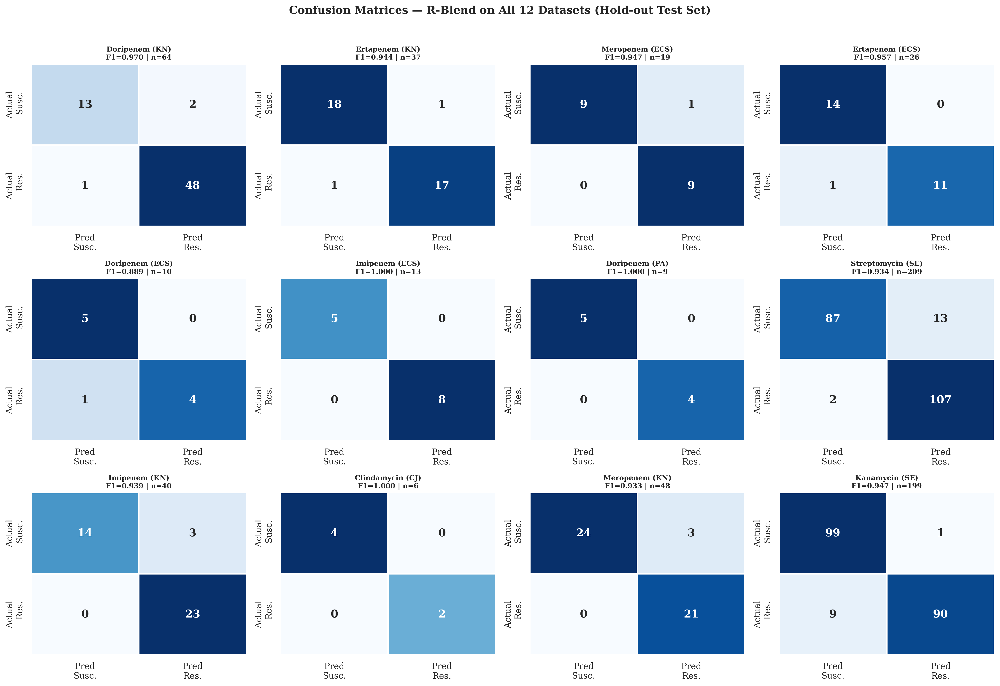


✅ Figure saved: /content/drive/MyDrive/Research Work/AMR Automation/Output/confusion_matrices/confusion_matrices_all_12.png

QUICK REFERENCE: Copy these into your thesis
Dataset                  TN   FP   FN   TP |     F1  Errors
----------------------------------------------------------------------
Doripenem (KN)           13    2    1   48 |  0.970       3
Ertapenem (KN)           18    1    1   17 |  0.944       2
Meropenem (ECS)           9    1    0    9 |  0.947       1
Ertapenem (ECS)          14    0    1   11 |  0.957       1
Doripenem (ECS)           5    0    1    4 |  0.889       1
Imipenem (ECS)            5    0    0    8 |  1.000       0
Doripenem (PA)            5    0    0    4 |  1.000       0
Streptomycin (SE)        87   13    2  107 |  0.934      15
Imipenem (KN)            14    3    0   23 |  0.939       3
Clindamycin (CJ)          4    0    0    2 |  1.000       0
Meropenem (KN)           24    3    0   21 |  0.933       3
Kanamycin (SE)           99    1    9 

In [ ]:
# ============================================================
# Confusion Matrix + Error Analysis for All 12 Datasets
# ============================================================
# PASTE THIS INTO A NEW COLAB CELL AFTER YOUR CELL 37
# (after DATASET_PATHS and all helper functions are defined)
#
# This reuses your exact pipeline (same split, same features,
# same model) so results are 100% reproducible.
#
# OUTPUTS:
#   1. Confusion matrix figure (all 12 datasets, 3x4 grid)
#   2. Per-dataset error CSVs with misclassified samples
#   3. Summary CSV of all confusion matrix values
# ============================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    confusion_matrix, accuracy_score, precision_score,
    recall_score, f1_score, roc_auc_score
)
from sklearn.feature_selection import f_classif
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import VotingClassifier, RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from imblearn.combine import SMOTETomek
from pathlib import Path

# ---- Config (same as your Cell 37) ----
RANDOM_STATE = 42
TEST_SIZE = 0.2
ANOVA_P = 0.30
SELECTOR = "XGB"
CUTOFF = 85

OUTPUT_ROOT = "/content/drive/MyDrive/Research Work/AMR Automation/Output/"
DIR_CM = Path(OUTPUT_ROOT) / "confusion_matrices"
DIR_ERRORS = Path(OUTPUT_ROOT) / "error_analysis"
DIR_CM.mkdir(parents=True, exist_ok=True)
DIR_ERRORS.mkdir(parents=True, exist_ok=True)

# ---- Reuse your helper functions ----
# (These are already defined from Cell 37, but included here
#  for self-containment in case you run this cell independently)

def clean_dataset_name(name):
    parts = name.split('_')
    if len(parts) >= 4:
        return f"{parts[2].capitalize()} ({parts[3].upper()})"
    return name

def slug(s):
    return str(s).replace("(", "").replace(")", "").replace(" ", "_").replace("/", "_")

def add_rscore(X_df):
    X = X_df.copy()
    rsum = X.sum(axis=1)
    X["R-Score"] = MinMaxScaler().fit_transform(rsum.values.reshape(-1, 1))
    return X

def anova_select(X_tr, y_tr, p_thresh):
    f_vals, p_vals = f_classif(X_tr, y_tr)
    p_series = pd.Series(p_vals, index=X_tr.columns, name="p_value")
    keep = p_series[p_series <= p_thresh].index.tolist()
    if "R-Score" in X_tr.columns and "R-Score" not in keep:
        keep.append("R-Score")
    return p_series, keep

def selector_importances(model_name, X_tr, y_tr):
    if model_name == "XGB":
        model = XGBClassifier(
            random_state=RANDOM_STATE, use_label_encoder=False, eval_metric='logloss',
            n_estimators=400, max_depth=6, subsample=0.8, colsample_bytree=0.8, n_jobs=-1
        )
    elif model_name == "RF":
        model = RandomForestClassifier(
            n_estimators=300, criterion="entropy", random_state=RANDOM_STATE, n_jobs=-1
        )
    model.fit(X_tr, y_tr)
    s = pd.Series(model.feature_importances_, index=X_tr.columns, name="importance")
    return s.sort_values(ascending=False)

def cutoff_features_by_cumulative(importances, cutoff_pct):
    imp = importances / max(importances.sum(), 1e-12)
    cum = imp.cumsum()
    keep = cum[cum <= (cutoff_pct / 100.0)].index.tolist()
    if len(keep) == 0 and len(importances) > 0:
        keep = [importances.index[0]]
    return keep

def rblend_est():
    return VotingClassifier(
        estimators=[
            ('DT', DecisionTreeClassifier(criterion='entropy', random_state=0)),
            ('LogR', LogisticRegression(random_state=0, max_iter=1000)),
            ('XGB', XGBClassifier(random_state=0, use_label_encoder=False, eval_metric='logloss'))
        ],
        voting='soft', weights=[1, 1.5, 1], n_jobs=-1
    )


# ============================================================
# MAIN LOOP: Train, predict, collect CM + errors for all 12
# ============================================================

cm_results = []       # Stores confusion matrix values
error_summaries = []  # Stores error summary per dataset

for path in DATASET_PATHS:
    df = pd.read_csv(path)
    ds_name = clean_dataset_name(Path(path).stem)

    if df.iloc[:, -1].nunique() < 2:
        print(f"⚠️ Skipping {ds_name} (only one class).")
        continue

    print(f"\n{'='*60}")
    print(f"Processing: {ds_name}")
    print(f"{'='*60}")

    # ---- Exact same pipeline as your Cell 37 ----
    y = df.iloc[:, -1]
    X_raw = df.iloc[:, 1:-1]
    X = add_rscore(X_raw)

    # Store isolate IDs for error tracking
    isolate_ids = df.iloc[:, 0]

    try:
        X_tr, X_te, y_tr, y_te = train_test_split(
            X, y, test_size=TEST_SIZE, stratify=y, random_state=RANDOM_STATE
        )
    except ValueError:
        X_tr, X_te, y_tr, y_te = train_test_split(
            X, y, test_size=TEST_SIZE, random_state=RANDOM_STATE
        )

    # Get matching isolate IDs for test set
    te_isolates = isolate_ids.loc[X_te.index]

    # Feature selection
    pvals, anova_keep = anova_select(X_tr, y_tr, ANOVA_P)
    importances = selector_importances(SELECTOR, X_tr, y_tr)
    model_keep = cutoff_features_by_cumulative(importances, CUTOFF)

    anova_set, model_set = set(anova_keep), set(model_keep)
    union_set = anova_set | model_set
    both_set = anova_set & model_set
    feats_use = list(union_set) if len(union_set) > 0 else list(both_set) if len(both_set) > 0 else list(model_set)
    feats_use = [f for f in X.columns if f in feats_use]

    X_tr_sel, X_te_sel = X_tr[feats_use], X_te[feats_use]

    # SMOTETomek
    if y_tr.value_counts().min() < 2:
        X_tr_bal, y_tr_bal = X_tr_sel, y_tr
    else:
        smt = SMOTETomek(random_state=RANDOM_STATE)
        X_tr_bal, y_tr_bal = smt.fit_resample(X_tr_sel, y_tr)

    # Train & predict
    model = rblend_est()
    model.fit(X_tr_bal, y_tr_bal)
    y_pred = model.predict(X_te_sel)

    # Get prediction probabilities
    try:
        y_proba = model.predict_proba(X_te_sel)[:, 1]
    except:
        y_proba = np.full(len(y_pred), np.nan)

    # ---- Confusion Matrix ----
    cm = confusion_matrix(y_te, y_pred)
    tn, fp, fn, tp = cm.ravel()

    cm_results.append({
        'Dataset': ds_name,
        'TN': tn, 'FP': fp, 'FN': fn, 'TP': tp,
        'Test_Size': len(y_te),
        'Test_R': int((y_te == 1).sum()),
        'Test_S': int((y_te == 0).sum()),
        'Accuracy': accuracy_score(y_te, y_pred),
        'Precision': precision_score(y_te, y_pred, zero_division=0),
        'Recall': recall_score(y_te, y_pred, zero_division=0),
        'F1': f1_score(y_te, y_pred, zero_division=0),
    })

    print(f"  CM: TN={tn} FP={fp} FN={fn} TP={tp}")
    print(f"  F1={f1_score(y_te, y_pred, zero_division=0):.4f}")

    # ---- Error Analysis: Save misclassified samples ----
    y_te_arr = y_te.values
    y_pred_arr = y_pred

    # Build test set DataFrame with predictions
    test_df = pd.DataFrame({
        'Isolate': te_isolates.values,
        'True_Label': y_te_arr,
        'Predicted_Label': y_pred_arr,
        'Pred_Probability': y_proba,
        'Correct': y_te_arr == y_pred_arr,
        'Error_Type': 'Correct'
    })

    # Label error types
    test_df.loc[(y_te_arr == 0) & (y_pred_arr == 1), 'Error_Type'] = 'FP (Susceptible predicted Resistant)'
    test_df.loc[(y_te_arr == 1) & (y_pred_arr == 0), 'Error_Type'] = 'FN (Resistant predicted Susceptible)'

    # Add R-Score and gene count for error samples
    test_df['R_Score'] = X_te_sel['R-Score'].values if 'R-Score' in X_te_sel.columns else np.nan
    test_df['Gene_Count'] = X_te.loc[X_te.index, X_raw.columns].sum(axis=1).values

    # Save FULL test set with predictions (for your reference)
    full_test_csv = DIR_ERRORS / f"{slug(ds_name)}_full_test_predictions.csv"
    test_df.to_csv(full_test_csv, index=False)

    # Save ERRORS ONLY with gene profiles
    errors_df = test_df[test_df['Correct'] == False].copy()

    if len(errors_df) > 0:
        # Add the gene feature columns for misclassified samples
        error_indices = X_te.index[~(y_te_arr == y_pred_arr)]
        error_genes = X_te.loc[error_indices, [c for c in feats_use if c != 'R-Score']]

        # Find which genes are present (=1) for each error sample
        errors_gene_detail = errors_df.reset_index(drop=True)
        error_genes_reset = error_genes.reset_index(drop=True)

        # Add "Present_Genes" column: list of gene names where value=1
        present_genes = []
        for idx in range(len(error_genes_reset)):
            row = error_genes_reset.iloc[idx]
            genes = row[row == 1].index.tolist()
            present_genes.append('; '.join(genes) if genes else 'None')
        errors_gene_detail['Present_Genes'] = present_genes
        errors_gene_detail['Num_Present_Genes'] = error_genes_reset.sum(axis=1).values

        error_csv = DIR_ERRORS / f"{slug(ds_name)}_errors_only.csv"
        errors_gene_detail.to_csv(error_csv, index=False)
        print(f"  Errors saved: {len(errors_df)} misclassified samples")

        # Summary for this dataset
        n_fp = len(errors_df[errors_df['Error_Type'].str.startswith('FP')])
        n_fn = len(errors_df[errors_df['Error_Type'].str.startswith('FN')])
        error_summaries.append({
            'Dataset': ds_name,
            'Total_Errors': len(errors_df),
            'False_Positives': n_fp,
            'False_Negatives': n_fn,
            'FP_Avg_Gene_Count': errors_gene_detail[errors_gene_detail['Error_Type'].str.startswith('FP')]['Gene_Count'].mean() if n_fp > 0 else np.nan,
            'FN_Avg_Gene_Count': errors_gene_detail[errors_gene_detail['Error_Type'].str.startswith('FN')]['Gene_Count'].mean() if n_fn > 0 else np.nan,
            'FP_Avg_R_Score': errors_gene_detail[errors_gene_detail['Error_Type'].str.startswith('FP')]['R_Score'].mean() if n_fp > 0 else np.nan,
            'FN_Avg_R_Score': errors_gene_detail[errors_gene_detail['Error_Type'].str.startswith('FN')]['R_Score'].mean() if n_fn > 0 else np.nan,
            'Overall_Avg_Gene_Count': test_df['Gene_Count'].mean(),
            'Overall_Avg_R_Score': test_df['R_Score'].mean(),
        })
    else:
        print(f"  ✓ Perfect classification — no errors!")
        error_summaries.append({
            'Dataset': ds_name, 'Total_Errors': 0,
            'False_Positives': 0, 'False_Negatives': 0,
            'FP_Avg_Gene_Count': np.nan, 'FN_Avg_Gene_Count': np.nan,
            'FP_Avg_R_Score': np.nan, 'FN_Avg_R_Score': np.nan,
            'Overall_Avg_Gene_Count': test_df['Gene_Count'].mean(),
            'Overall_Avg_R_Score': test_df['R_Score'].mean(),
        })


# ============================================================
# SAVE SUMMARY CSVs
# ============================================================

cm_df = pd.DataFrame(cm_results)
cm_csv = DIR_CM / "confusion_matrix_all_datasets.csv"
cm_df.to_csv(cm_csv, index=False)
print(f"\n✅ Confusion matrix summary saved: {cm_csv}")

error_summary_df = pd.DataFrame(error_summaries)
error_csv = DIR_ERRORS / "error_analysis_summary.csv"
error_summary_df.to_csv(error_csv, index=False)
print(f"✅ Error analysis summary saved: {error_csv}")

# Display summaries
from IPython.display import display, Markdown

display(Markdown("### Confusion Matrix Summary (All 12 Datasets)"))
display(cm_df)

display(Markdown("### Error Analysis Summary"))
display(error_summary_df)


# ============================================================
# GENERATE CONFUSION MATRIX FIGURE (3x4 grid, all 12)
# ============================================================

plt.rcParams.update({
    'font.family': 'serif', 'font.size': 10, 'figure.dpi': 300,
    'savefig.dpi': 300, 'savefig.bbox': 'tight',
})

fig, axes = plt.subplots(3, 4, figsize=(18, 12))
axes_flat = axes.flatten()

for idx, row in cm_df.iterrows():
    ax = axes_flat[idx]
    cm = np.array([[row['TN'], row['FP']],
                    [row['FN'], row['TP']]])

    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax,
                xticklabels=['Pred\nSusc.', 'Pred\nRes.'],
                yticklabels=['Actual\nSusc.', 'Actual\nRes.'],
                cbar=False, linewidths=1.5, linecolor='white',
                annot_kws={'fontsize': 14, 'fontweight': 'bold'})

    # Add F1 score in subtitle
    ax.set_title(f"{row['Dataset']}\nF1={row['F1']:.3f} | n={int(row['Test_Size'])}",
                 fontweight='bold', fontsize=9)

# Remove any unused subplots (if fewer than 12 datasets)
for idx in range(len(cm_df), len(axes_flat)):
    axes_flat[idx].set_visible(False)

fig.suptitle('Confusion Matrices — R-Blend on All 12 Datasets (Hold-out Test Set)',
             fontweight='bold', fontsize=14, y=1.02)
plt.tight_layout()

fig_path = DIR_CM / "confusion_matrices_all_12.png"
plt.savefig(fig_path)
plt.savefig(DIR_CM / "confusion_matrices_all_12.pdf")
plt.show()
print(f"\n✅ Figure saved: {fig_path}")


# ============================================================
# PRINT SUMMARY FOR QUICK REFERENCE
# ============================================================

print("\n" + "=" * 70)
print("QUICK REFERENCE: Copy these into your thesis")
print("=" * 70)
print(f"{'Dataset':<22} {'TN':>4} {'FP':>4} {'FN':>4} {'TP':>4} | {'F1':>6} {'Errors':>7}")
print("-" * 70)
for _, row in cm_df.iterrows():
    total_errors = int(row['FP'] + row['FN'])
    print(f"{row['Dataset']:<22} {int(row['TN']):>4} {int(row['FP']):>4} "
          f"{int(row['FN']):>4} {int(row['TP']):>4} | {row['F1']:>6.3f} {total_errors:>7}")
print("-" * 70)
total_e = int(cm_df['FP'].sum() + cm_df['FN'].sum())
total_n = int(cm_df['Test_Size'].sum())
print(f"{'TOTAL':<22} {int(cm_df['TN'].sum()):>4} {int(cm_df['FP'].sum()):>4} "
      f"{int(cm_df['FN'].sum()):>4} {int(cm_df['TP'].sum()):>4} | "
      f"{'':>6} {total_e:>4}/{total_n}")


# ============================================================
# SAVED FILES SUMMARY
# ============================================================
print(f"\n📂 All files saved to Google Drive:")
print(f"  Confusion matrices: {DIR_CM}/")
print(f"    - confusion_matrix_all_datasets.csv")
print(f"    - confusion_matrices_all_12.png")
print(f"    - confusion_matrices_all_12.pdf")
print(f"  Error analysis: {DIR_ERRORS}/")
print(f"    - error_analysis_summary.csv")
for path in DATASET_PATHS:
    ds = slug(clean_dataset_name(Path(path).stem))
    print(f"    - {ds}_full_test_predictions.csv")
    print(f"    - {ds}_errors_only.csv")

# R-Blend + R-Score + SMOTETomek: Hold-out and Multi-fold Cross-validation Performance (Might Contain Error!! Skip it... next one will do the same)
This section evaluates the R-Blend ensemble augmented with the R-Score feature and balanced using SMOTETomek. Each dataset is tested with a fixed hold-out split and multiple stratified cross-validation settings (4, 5, 6, 7, and 10 folds). The results table reports Accuracy, Precision, Recall, F1-score, AUROC, and AUPRC from the hold-out test, alongside mean F1-scores from each CV configuration. An average row summarizes the performance across all datasets.

In [ ]:
# ============================================================
# R-Blend + R-Score + SMOTETomek
# Hold-out metrics + Stratified CV at 4/5/6/7/10 folds
# ============================================================

# ---- Config ----
OUTPUT_ROOT = "/content/drive/MyDrive/Research Work/AMR Automation/Output/"
TEST_SIZE = 0.2
RANDOM_STATE = 42
FOLDS = [4, 5, 6, 7, 10]  # CV settings to evaluate

# ---- Imports ----
import warnings
warnings.filterwarnings("ignore")

from pathlib import Path
import numpy as np
import pandas as pd

from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, average_precision_score, make_scorer
)
from sklearn.preprocessing import MinMaxScaler
from sklearn.base import clone

# Base learners for R-Blend
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import VotingClassifier
from xgboost import XGBClassifier

# Imbalanced-learn
from imblearn.combine import SMOTETomek
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline

# ---- Paths ----
OUT_ROOT = Path(OUTPUT_ROOT)
DIR_TABLES = OUT_ROOT / "tables"
DIR_TABLES.mkdir(parents=True, exist_ok=True)

# ---- Helpers ----
def clean_dataset_name(name: str):
    parts = name.split('_')
    if len(parts) >= 4:
        antibiotic = parts[2].capitalize()
        pathogen = parts[3].upper()
        return f"{antibiotic} ({pathogen})"
    return name

def add_rscore_column(df: pd.DataFrame) -> pd.DataFrame:
    """
    Add R-Score = min-max scaled row-wise sum of features (cols 1..-2),
    then insert it immediately BEFORE the label (last column).
    Assumes col0 is ID and last col is the binary target.
    """
    df = df.copy()
    rsum = df.iloc[:, 1:-1].sum(axis=1)
    df["R-Score"] = MinMaxScaler().fit_transform(rsum.values.reshape(-1, 1))
    cols = list(df.columns)
    cols.insert(-1, cols.pop(cols.index("R-Score")))
    return df[cols]

def adaptive_smotetomek(y_train):
    """
    Build a SMOTETomek where the inner SMOTE has k_neighbors <= minority-1.
    Returns a SMOTETomek instance.
    """
    # minority class count
    if set(np.unique(y_train)) <= {0, 1}:
        n_min = min(np.bincount(y_train.astype(int)))
    else:
        n_min = int(pd.Series(y_train).value_counts().min())
    k = max(1, min(5, n_min - 1))
    return SMOTETomek(random_state=RANDOM_STATE, smote=SMOTE(random_state=RANDOM_STATE, k_neighbors=k))

def get_scores_or_none(model, X):
    """Scores for ROC/AUPRC: proba[:,1] > decision_function > None."""
    if hasattr(model, "predict_proba"):
        proba = model.predict_proba(X)
        if proba is not None and proba.ndim == 2 and proba.shape[1] > 1:
            return proba[:, 1]
    if hasattr(model, "decision_function"):
        s = model.decision_function(X)
        return s.ravel() if hasattr(s, "ravel") else s
    return None

def rblend_estimator():
    """Your exact R-Blend config."""
    return VotingClassifier(
        estimators=[
            ('DT',   DecisionTreeClassifier(criterion='entropy', random_state=0)),
            ('LogR', LogisticRegression(random_state=0, max_iter=1000)),
            # ('SVM',  SVC(kernel='rbf', probability=True, random_state=0)),
            ('XGB',  XGBClassifier(random_state=0, use_label_encoder=False, eval_metric='logloss')),
        ],
        voting='soft',
        weights=[1, 1.5, 1]
    )

# ---- Datasets ----
if 'DATASET_PATHS' in globals() and isinstance(DATASET_PATHS, (list, tuple)) and len(DATASET_PATHS) > 0:
    DATASETS = DATASET_PATHS
elif 'dataset' in globals() and isinstance(dataset, (list, tuple)) and len(dataset) > 0:
    DATASETS = dataset
else:
    raise ValueError("Provide datasets via DATASET_PATHS (preferred) or dataset (list of CSV paths).")

# ---- Run across datasets ----
rows = []
for path in DATASETS:
    ds_name = clean_dataset_name(Path(path).stem)
    df = pd.read_csv(path)

    # Add R-Score safely
    df_rs = add_rscore_column(df)
    y = df_rs.iloc[:, -1]
    X = df_rs.drop(columns=[df_rs.columns[0], df_rs.columns[-1]])  # drop ID + label

    # Skip degenerate
    if y.nunique() < 2:
        print(f"⚠️ Skipping {ds_name} (insufficient class variation).")
        continue

    # Hold-out split
    try:
        X_tr, X_te, y_tr, y_te = train_test_split(X, y, test_size=TEST_SIZE, stratify=y, random_state=RANDOM_STATE)
    except ValueError:
        X_tr, X_te, y_tr, y_te = train_test_split(X, y, test_size=TEST_SIZE, random_state=RANDOM_STATE)

    # Adaptive SMOTETomek on train only
    smt = adaptive_smotetomek(y_tr)
    X_tr_bal, y_tr_bal = smt.fit_resample(X_tr, y_tr)

    # Fit R-Blend
    rblend = rblend_estimator()
    rblend.fit(X_tr_bal, y_tr_bal)

    # Hold-out predictions
    y_pred = rblend.predict(X_te)
    scores = get_scores_or_none(rblend, X_te)

    acc  = accuracy_score(y_te, y_pred)
    prec = precision_score(y_te, y_pred, zero_division=0)
    rec  = recall_score(y_te, y_pred, zero_division=0)
    f1   = f1_score(y_te, y_pred, zero_division=0)
    auroc = roc_auc_score(y_te, scores) if (scores is not None and len(np.unique(y_te)) > 1) else np.nan
    auprc = average_precision_score(y_te, scores) if (scores is not None and len(np.unique(y_te)) > 1) else np.nan

    # CV (resampling inside each fold via Pipeline)
    cv_metrics = {}
    for k in FOLDS:
        skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=RANDOM_STATE)
        # pipeline: adaptive k_neighbors per fold is hard to wire; use safe k=5 but it will error if too small.
        # safer: k=2 for tiny datasets; choose k=5 but set error_score='raise' -> wrap in try/except per fold.
        # Instead, we implement a small helper scorer that just uses F1 and let SMOTETomek default (k=5).
        pipe = Pipeline([
            ("smt", SMOTETomek(random_state=RANDOM_STATE)),  # default k=5; OK for most datasets
            ("clf", rblend_estimator())
        ])
        try:
            cv_f1 = cross_val_score(
                pipe, X, y, cv=skf,
                scoring=make_scorer(f1_score, zero_division=0),
                n_jobs=None
            ).mean()
        except ValueError:
            # fallback to k=2 in inner SMOTE when minority super tiny
            pipe = Pipeline([
                ("smt", SMOTETomek(random_state=RANDOM_STATE, smote=SMOTE(random_state=RANDOM_STATE, k_neighbors=2))),
                ("clf", rblend_estimator())
            ])
            cv_f1 = cross_val_score(
                pipe, X, y, cv=skf,
                scoring=make_scorer(f1_score, zero_division=0),
                n_jobs=None
            ).mean()
        cv_metrics[k] = cv_f1

    rows.append({
        "Dataset": ds_name,
        "Accuracy": round(acc, 3),
        "Precision": round(prec, 3),
        "Recall": round(rec, 3),
        "F1-score": round(f1, 3),
        "AUROC": round(auroc, 3) if pd.notna(auroc) else np.nan,
        "AUPRC": round(auprc, 3) if pd.notna(auprc) else np.nan,
        **{f"{k}-fold CV F1": round(cv_metrics[k], 3) for k in FOLDS}
    })

# Build table + Average row and save
df_cv = pd.DataFrame(rows)
if not df_cv.empty:
    avg = df_cv.drop(columns=["Dataset"]).mean(numeric_only=True).round(3).to_dict()
    df_cv.loc[len(df_cv)] = {"Dataset": "Average", **avg}

out_csv = DIR_TABLES / "rblend_rscore_smotetomek_all_cv_results.csv"
df_cv.to_csv(out_csv, index=False)

from IPython.display import display, Markdown
display(Markdown("### 📊 R-Blend + R-Score + SMOTETomek — Hold-out & Multi-fold CV Results"))
display(df_cv)
print(f"\nSaved: {out_csv}")


### 📊 R-Blend + R-Score + SMOTETomek — Hold-out & Multi-fold CV Results

,Dataset,Accuracy,Precision,Recall,F1-score,AUROC,AUPRC,4-fold CV F1,5-fold CV F1,6-fold CV F1,7-fold CV F1,10-fold CV F1
0,Doripenem (KN),0.953,0.960,0.980,0.970,0.936,0.962,0.937,0.931,0.938,0.934,0.943
1,Ertapenem (KN),0.892,0.889,0.889,0.889,0.974,0.972,0.891,0.886,0.868,0.885,0.879
2,Meropenem (ECS),0.947,0.900,1.000,0.947,1.000,1.000,0.934,0.920,0.920,0.923,0.918
3,Ertapenem (ECS),0.962,1.000,0.917,0.957,0.958,0.969,0.914,0.900,0.915,0.890,0.921
4,Doripenem (ECS),0.900,1.000,0.800,0.889,0.840,0.911,0.798,0.852,0.784,0.871,0.867
5,Imipenem (ECS),1.000,1.000,1.000,1.000,1.000,1.000,0.928,0.882,0.926,0.897,0.927
6,Doripenem (PA),1.000,1.000,1.000,1.000,1.000,1.000,0.977,0.928,0.976,0.971,0.967
7,Streptomycin (SE),0.919,0.877,0.982,0.926,0.940,0.915,0.938,0.944,0.942,0.945,0.943
8,Imipenem (KN),0.925,0.885,1.000,0.939,0.959,0.970,0.897,0.900,0.906,0.910,0.900
9,Clindamycin (CJ),1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,0.800



Saved: /content/drive/MyDrive/Research Work/AMR Automation/Output/tables/rblend_rscore_smotetomek_all_cv_results.csv


# Best Model Configuration: R-Blend (R-Score, SMOTETomek, and ANOVA p = 0.3, XGB Importance = 85%) : Hold-out and Multi-fold Cross-validation Performance
This section evaluates the R-Blend with R-Score and SMOTETomek (ANOVA p = 0.3, XGB Importance = 85%). Each dataset is tested with a fixed hold-out split and multiple stratified cross-validation settings (5, 6, and 10 folds). The results table reports Accuracy, Precision, Recall, F1-score, AUROC, and AUPRC from the hold-out test, alongside mean F1-scores from each CV configuration. An average row summarizes the performance across all datasets.

In [ ]:
# ============================================================
# R-Blend + R-Score + Feature Selection + SMOTETomek
# Hold-out metrics + Proper Stratified CV (with resampling inside folds)
# ============================================================

import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, average_precision_score, make_scorer
)
from sklearn.feature_selection import f_classif
from sklearn.ensemble import VotingClassifier, RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from xgboost import XGBClassifier
from imblearn.combine import SMOTETomek
from imblearn.pipeline import Pipeline  # Use imblearn's Pipeline for resampling
from sklearn.preprocessing import MinMaxScaler
from pathlib import Path
import time

# Configuration and paths
OUTPUT_ROOT = "/content/drive/MyDrive/Research Work/AMR Automation/Output/"
DIR_TABLES = Path(OUTPUT_ROOT) / "tables"
DIR_LOGS = Path(OUTPUT_ROOT) / "gridsearch" / "logs"

for d in [DIR_TABLES, DIR_LOGS]:
    d.mkdir(parents=True, exist_ok=True)

# Settings
RANDOM_STATE = 42
TEST_SIZE = 0.2
ANOVA_P = 0.30
SELECTOR = "XGB"
CUTOFF = 85

# Helper functions
def slug(s: str) -> str:
    return str(s).replace("(", "").replace(")", "").replace(" ", "_").replace("/", "_")

def clean_dataset_name(name):
    parts = name.split('_')
    if len(parts) >= 4:
        antibiotic = parts[2].capitalize()
        pathogen = parts[3].upper()
        return f"{antibiotic} ({pathogen})"
    return name

def add_rscore(X_df: pd.DataFrame) -> pd.DataFrame:
    X = X_df.copy()
    rsum = X.sum(axis=1)
    X["R-Score"] = MinMaxScaler().fit_transform(rsum.values.reshape(-1, 1))
    return X

def anova_select(X_tr: pd.DataFrame, y_tr: pd.Series, p_thresh: float):
    f_vals, p_vals = f_classif(X_tr, y_tr)
    p_series = pd.Series(p_vals, index=X_tr.columns, name="p_value")
    keep = p_series[p_series <= p_thresh].index.tolist()
    if "R-Score" in X_tr.columns and "R-Score" not in keep:
        keep.append("R-Score")
    return p_series, keep

def selector_importances(model_name: str, X_tr: pd.DataFrame, y_tr: pd.Series) -> pd.Series:
    if model_name == "RF":
        model = RandomForestClassifier(
            n_estimators=300, criterion="entropy", random_state=RANDOM_STATE, n_jobs=-1
        )
    elif model_name == "XGB":
        model = XGBClassifier(
            random_state=RANDOM_STATE, use_label_encoder=False, eval_metric='logloss',
            n_estimators=400, max_depth=6, subsample=0.8, colsample_bytree=0.8, n_jobs=-1
        )
    else:
        raise ValueError("selector must be 'RF' or 'XGB'")
    model.fit(X_tr, y_tr)
    s = pd.Series(model.feature_importances_, index=X_tr.columns, name="importance")
    return s.sort_values(ascending=False)

def cutoff_features_by_cumulative(importances: pd.Series, cutoff_pct: int) -> list:
    imp = importances / max(importances.sum(), 1e-12)
    cum = imp.cumsum()
    keep = cum[cum <= (cutoff_pct / 100.0)].index.tolist()
    if len(keep) == 0 and len(importances) > 0:
        keep = [importances.index[0]]
    return keep

def rblend_est():
    return VotingClassifier(
        estimators=[
            ('DT', DecisionTreeClassifier(criterion='entropy', random_state=0)),
            ('LogR', LogisticRegression(random_state=0, max_iter=1000)),
            # ('SVM', SVC(kernel='rbf', probability=True, random_state=0)),
            ('XGB', XGBClassifier(random_state=0, use_label_encoder=False, eval_metric='logloss'))
        ],
        voting='soft',
        weights=[1, 1.5, 1],
        n_jobs=-1
    )

def safe_metrics(y_true, y_pred, scores=None):
    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, zero_division=0)
    rec = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    if scores is not None and len(np.unique(y_true)) > 1:
        try:
            auroc = roc_auc_score(y_true, scores)
            auprc = average_precision_score(y_true, scores)
        except Exception:
            auroc, auprc = np.nan, np.nan
    else:
        auroc, auprc = np.nan, np.nan
    return acc, prec, rec, f1, auroc, auprc

def get_scores(model, X):
    if hasattr(model, "predict_proba"):
        p = model.predict_proba(X)
        if p is not None and p.ndim == 2 and p.shape[1] > 1:
            return p[:, 1]
    if hasattr(model, "decision_function"):
        s = model.decision_function(X)
        return s.ravel()
    return None

def safe_cv_score(X_data, y_data, n_splits, random_state):
    """
    Perform cross-validation with SMOTETomek inside each fold.
    Handles edge cases where minority class is too small.
    """
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=random_state)
    f1_scorer = make_scorer(f1_score, zero_division=0)

    # Check minimum class size
    min_class_size = y_data.value_counts().min()

    # Adjust k_neighbors for SMOTE based on minority class size
    if min_class_size < 2:
        # Can't do SMOTE, use model directly
        pipe = rblend_est()
    elif min_class_size <= 5:
        # Use smaller k_neighbors
        k_neighbors = max(1, min_class_size - 1)
        from imblearn.over_sampling import SMOTE
        pipe = Pipeline([
            ("smt", SMOTETomek(random_state=random_state,
                              smote=SMOTE(random_state=random_state, k_neighbors=k_neighbors))),
            ("clf", rblend_est())
        ])
    else:
        # Default k_neighbors=5
        pipe = Pipeline([
            ("smt", SMOTETomek(random_state=random_state)),
            ("clf", rblend_est())
        ])

    try:
        cv_scores = cross_val_score(pipe, X_data, y_data, cv=skf, scoring=f1_scorer, n_jobs=-1)
        return np.mean(cv_scores)
    except Exception as e:
        print(f"    ⚠️ CV failed for {n_splits}-fold: {e}")
        return np.nan

# -----------------------
# Run Settings for a Single Dataset
# -----------------------
def run_targeted_setting(ds_name, df, anova_p, selector, cutoff, log_path=None):
    t0 = time.time()

    y = df.iloc[:, -1]
    X = add_rscore(df.iloc[:, 1:-1])

    try:
        X_tr, X_te, y_tr, y_te = train_test_split(
            X, y, test_size=TEST_SIZE, stratify=y, random_state=RANDOM_STATE
        )
    except ValueError:
        X_tr, X_te, y_tr, y_te = train_test_split(X, y, test_size=TEST_SIZE, random_state=RANDOM_STATE)

    vc = y.value_counts()
    n_pos, n_neg = int(vc.get(1, 0)), int(vc.get(0, 0))
    print(f"Starting: [{ds_name}] R={n_pos} S={n_neg} | ANOVA p={anova_p:.2f} | Selector={selector} | Cut={cutoff}%", flush=True)

    # Feature Selection
    pvals, anova_keep = anova_select(X_tr, y_tr, anova_p)
    importances = selector_importances(selector, X_tr, y_tr)
    model_keep = cutoff_features_by_cumulative(importances, cutoff)

    anova_set, model_set = set(anova_keep), set(model_keep)
    both_set = anova_set & model_set
    union_set = anova_set | model_set

    # Selected Features for Training (same logic as Code 1)
    feats_use = list(union_set) if len(union_set) > 0 else list(both_set) if len(both_set) > 0 else list(model_set)
    feats_use = [f for f in X.columns if f in feats_use]
    X_tr_sel, X_te_sel = X_tr[feats_use], X_te[feats_use]

    # Safe SMOTETomek (same logic as Code 1)
    if y_tr.value_counts().min() < 2:
        X_tr_bal, y_tr_bal = X_tr_sel, y_tr
        resample_note = "NO-RESAMPLE(min<2)"
    else:
        smt = SMOTETomek(random_state=RANDOM_STATE)
        X_tr_bal, y_tr_bal = smt.fit_resample(X_tr_sel, y_tr)
        resample_note = "SMOTETomek"

    # Train model and get hold-out metrics (same as Code 1)
    model = rblend_est()
    model.fit(X_tr_bal, y_tr_bal)
    y_pred = model.predict(X_te_sel)
    scores = get_scores(model, X_te_sel)
    acc, prec, rec, f1, auroc, auprc = safe_metrics(y_te, y_pred, scores)

    # Log results
    line = f"[{ds_name}] R={n_pos} S={n_neg} | {resample_note} | p={anova_p} | {selector} {cutoff}% | F1={f1:.4f} Recall={rec:.4f} AUROC={auroc:.4f}"
    print(line, flush=True)
    if log_path:
        with open(log_path, "a") as f:
            f.write(line + "\n")

    # Cross-Validation with proper resampling inside each fold
    # CV is done on ORIGINAL selected features (X_tr_sel, y_tr), NOT on resampled data
    print(f"  Running CV for {ds_name}...", flush=True)
    cv5_f1 = safe_cv_score(X_tr_sel, y_tr, n_splits=5, random_state=RANDOM_STATE)
    cv6_f1 = safe_cv_score(X_tr_sel, y_tr, n_splits=6, random_state=RANDOM_STATE)
    cv10_f1 = safe_cv_score(X_tr_sel, y_tr, n_splits=10, random_state=RANDOM_STATE)

    elapsed = time.time() - t0
    print(f"  ✓ {ds_name} completed in {elapsed:.1f}s | F1={f1:.4f} | CV5={cv5_f1:.4f} | CV10={cv10_f1:.4f}", flush=True)

    return {
        "Dataset": ds_name,
        "Accuracy": acc,
        "Precision": prec,
        "Recall": rec,
        "F1": f1,
        "AUROC": auroc,
        "AUPRC": auprc,
        "5-fold CV F1": cv5_f1,
        "6-fold CV F1": cv6_f1,
        "10-fold CV F1": cv10_f1,
        "resample": resample_note,
        "Num_Features": len(feats_use),
        "ANOVA_Features": len(anova_set),
        "XGB_Features": len(model_set),
    }

# -----------------------
# Run on Datasets for Targeted Setting
# -----------------------
DATASETS = DATASET_PATHS

all_rows = []
for path in DATASETS:
    df = pd.read_csv(path)
    ds_name = clean_dataset_name(Path(path).stem)

    if df.iloc[:, -1].nunique() < 2:
        print(f"⚠️ Skipping {ds_name} (only one class).")
        continue

    # Setup logging
    log_path = DIR_LOGS / f"{slug(ds_name)}.log"
    with open(log_path, "w") as f:
        f.write(f"Log for {ds_name}\n")

    # Run targeted settings (ANOVA p=0.30, Selector=XGB, CUTOFF=85%)
    results = run_targeted_setting(ds_name, df, ANOVA_P, SELECTOR, CUTOFF, log_path)
    all_rows.append(results)

# Create final DataFrame from results
final_df = pd.DataFrame(all_rows)

# Add Average row
if not final_df.empty:
    numeric_cols = final_df.select_dtypes(include=[np.number]).columns
    avg_row = {"Dataset": "Average", "resample": ""}
    for col in numeric_cols:
        avg_row[col] = round(final_df[col].mean(skipna=True), 4)
    final_df = pd.concat([final_df, pd.DataFrame([avg_row])], ignore_index=True)

# Save results
final_csv = DIR_TABLES / "rblend_rscore_smotetomek_anova_0.3_xgb_85_feature_selection_all_cv.csv"
final_df.to_csv(final_csv, index=False)

# Display results
from IPython.display import display, Markdown
display(Markdown("### 📊 R-Blend + R-Score + Feature Selection + SMOTETomek — Hold-out & Multi-fold CV Results"))
display(final_df)

print(f"\n✅ Saved: {final_csv}")

Starting: [Doripenem (KN)] R=241 S=75 | ANOVA p=0.30 | Selector=XGB | Cut=85%
[Doripenem (KN)] R=241 S=75 | SMOTETomek | p=0.3 | XGB 85% | F1=0.9697 Recall=0.9796 AUROC=0.9333
  Running CV for Doripenem (KN)...
  ✓ Doripenem (KN) completed in 6.6s | F1=0.9697 | CV5=0.9409 | CV10=0.9352
Starting: [Ertapenem (KN)] R=90 S=91 | ANOVA p=0.30 | Selector=XGB | Cut=85%
[Ertapenem (KN)] R=90 S=91 | SMOTETomek | p=0.3 | XGB 85% | F1=0.9444 Recall=0.9444 AUROC=0.9766
  Running CV for Ertapenem (KN)...
  ✓ Ertapenem (KN) completed in 2.5s | F1=0.9444 | CV5=0.8614 | CV10=0.9004
Starting: [Meropenem (ECS)] R=45 S=46 | ANOVA p=0.30 | Selector=XGB | Cut=85%
[Meropenem (ECS)] R=45 S=46 | SMOTETomek | p=0.3 | XGB 85% | F1=0.9474 Recall=1.0000 AUROC=1.0000
  Running CV for Meropenem (ECS)...
  ✓ Meropenem (ECS) completed in 1.8s | F1=0.9474 | CV5=0.9262 | CV10=0.9260
Starting: [Ertapenem (ECS)] R=61 S=68 | ANOVA p=0.30 | Selector=XGB | Cut=85%
[Ertapenem (ECS)] R=61 S=68 | SMOTETomek | p=0.3 | XGB 85% | 

### 📊 R-Blend + R-Score + Feature Selection + SMOTETomek — Hold-out & Multi-fold CV Results

,Dataset,Accuracy,Precision,Recall,F1,AUROC,AUPRC,5-fold CV F1,6-fold CV F1,10-fold CV F1,resample,Num_Features,ANOVA_Features,XGB_Features
0,Doripenem (KN),0.953125,0.960000,0.979592,0.969697,0.933333,0.961205,0.940899,0.929025,0.935151,SMOTETomek,94.0000,88.0000,17.0000
1,Ertapenem (KN),0.945946,0.944444,0.944444,0.944444,0.976608,0.981358,0.861373,0.836854,0.900369,SMOTETomek,95.0000,90.0000,20.0000
2,Meropenem (ECS),0.947368,0.900000,1.000000,0.947368,1.000000,1.000000,0.926184,0.929099,0.926032,SMOTETomek,69.0000,69.0000,1.0000
3,Ertapenem (ECS),0.961538,1.000000,0.916667,0.956522,0.970238,0.975490,0.902855,0.899074,0.899242,SMOTETomek,114.0000,113.0000,10.0000
4,Doripenem (ECS),0.900000,1.000000,0.800000,0.888889,0.840000,0.911111,0.853968,0.817460,0.826667,SMOTETomek,50.0000,48.0000,6.0000
5,Imipenem (ECS),1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.816566,0.815873,0.865714,SMOTETomek,65.0000,65.0000,4.0000
6,Doripenem (PA),1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.977778,0.976190,0.966667,SMOTETomek,30.0000,30.0000,1.0000
7,Streptomycin (SE),0.928230,0.891667,0.981651,0.934498,0.939954,0.915751,0.943703,0.944888,0.942531,SMOTETomek,83.0000,83.0000,6.0000
8,Imipenem (KN),0.925000,0.884615,1.000000,0.938776,0.959079,0.970171,0.910879,0.878350,0.887180,SMOTETomek,121.0000,118.0000,22.0000
9,Clindamycin (CJ),1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,NaN,NaN,NaN,SMOTETomek,11.0000,11.0000,1.0000



✅ Saved: /content/drive/MyDrive/Research Work/AMR Automation/Output/tables/rblend_rscore_smotetomek_anova_0.3_xgb_85_feature_selection_all_cv.csv


# Janak’s Best (All/Intersection) 3 Models
This section finds out the best-performing three model reported by Janak Sunwar et al. for each dataset (chosen by highest test F1-score, regardless of whether it came from the All Set or Intersection Set).

In [ ]:
# ============================================
# Janak Sunwar et al. — Top-3 by Test F1 (All Set & Intersection Set)
# ============================================

# ---- Config ----
ALL_SET_XLSX = "/content/drive/MyDrive/Research Work/AMR Automation/Data/JSunwar All Set.xlsx"
INT_SET_XLSX = "/content/drive/MyDrive/Research Work/AMR Automation/Data/JSunwar Intersection Set.xlsx"
OUTPUT_ROOT  = "/content/drive/MyDrive/Research Work/AMR Automation/Output/"

BLOCK_SIZE = 13  # rows of model results per dataset block
SHEET_INDEX = 0  # first sheet

# ---- Imports ----
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
from pathlib import Path
from IPython.display import display, Markdown

# ---- Paths ----
OUT = Path(OUTPUT_ROOT) / "tables"
OUT.mkdir(parents=True, exist_ok=True)

# ---- Helper to parse one workbook ----
def extract_top3_by_f1(xlsx_path, source_label, block_size=BLOCK_SIZE, sheet_index=SHEET_INDEX):
    df = pd.read_excel(xlsx_path, sheet_name=sheet_index)
    results = []
    n = len(df)

    # We assume blocks are laid out as: [dataset header row + model rows] then one blank row, repeating.
    # Your previous code stepped by (block_size + 1); we’ll do the same and add guards.
    for start in range(0, n, block_size + 1):
        block = df.iloc[start : start + block_size].copy()

        # Skip empty or fully NaN blocks
        if block.empty or block.isnull().all(axis=1).all():
            continue

        # Dataset name in first cell of block (col 0, row 0)
        dataset_name = block.iloc[0, 0]
        if pd.isna(dataset_name):
            # If first row is blank, skip
            continue

        # Drop the dataset-name column and put it back as a proper column
        block = block.drop(columns=block.columns[0])
        block.insert(0, "Dataset", dataset_name)

        # Ensure the expected F1 column exists and drop rows without it
        if "te_f1_avg" not in block.columns:
            raise KeyError(f"'te_f1_avg' column not found in {xlsx_path}. Check column names.")

        block = block.dropna(subset=["te_f1_avg"])

        # Sort and take top-3 by F1
        top3 = block.sort_values(by="te_f1_avg", ascending=False).head(3).copy()
        top3.insert(1, "Source", source_label)  # keep a source label
        results.append(top3)

    # Combine all datasets’ top-3
    if results:
        combined = pd.concat(results, ignore_index=True)
    else:
        combined = pd.DataFrame(columns=["Dataset", "Source"])

    return combined

# ---- Run for both files ----
top3_all = extract_top3_by_f1(ALL_SET_XLSX, "All Set")
top3_int = extract_top3_by_f1(INT_SET_XLSX, "Intersection Set")

# ---- Save individual CSVs ----
p_all = OUT / "janak_top3_allset_by_f1.csv"
p_int = OUT / "janak_top3_intersection_by_f1.csv"
top3_all.to_csv(p_all, index=False)
top3_int.to_csv(p_int, index=False)

# ---- Combined (stacked) with Source column ----
top3_both = pd.concat([top3_all, top3_int], ignore_index=True)
p_both = OUT / "janak_top3_both_by_f1_combined.csv"
top3_both.to_csv(p_both, index=False)

# ---- Pick a clean set of columns to display (adjust if needed)
cols_show = [
    "Dataset", "Source", "classifier",
    "te_precision_avg", "te_recall_avg", "te_f1_avg",
    "Tf_CV_Avg", "au_ROC_avg", "au_PR_avg"
]
cols_show = [c for c in cols_show if c in top3_both.columns]  # guard if any missing

display(Markdown("### 🔝 Top-3 Janak Models by Test F1 — All Set"))
display(top3_all[cols_show].head(50) if not top3_all.empty else top3_all)

display(Markdown("### 🔝 Top-3 Janak Models by Test F1 — Intersection Set"))
display(top3_int[cols_show].head(50) if not top3_int.empty else top3_int)

display(Markdown("### 🔝 Combined (All Set + Intersection Set) — Top-3 by Test F1 (per dataset)"))
display(top3_both[cols_show].head(100) if not top3_both.empty else top3_both)

print(f"\nSaved:\n- {p_all}\n- {p_int}\n- {p_both}")

### 🔝 Top-3 Janak Models by Test F1 — All Set

,Dataset,Source,classifier,te_precision_avg,te_recall_avg,te_f1_avg,Tf_CV_Avg,au_ROC_avg,au_PR_avg
0,doripenem KN,All Set,ABC,0.852,0.842,0.825,0.821,0.895,0.956
1,doripenem KN,All Set,ETC,0.83,0.822,0.816,0.824,0.868,0.939
2,doripenem KN,All Set,LogR,0.824,0.83,0.815,0.846,0.897,0.949
3,ertapenem KN,All Set,GBC,0.832,0.827,0.815,0.787,0.849,0.863
4,ertapenem KN,All Set,ABC,0.836,0.821,0.808,0.821,0.883,0.876
5,ertapenem KN,All Set,mNB,0.782,0.788,0.769,0.73,0.845,0.859
6,imipenem KN,All Set,ABC,0.882,0.847,0.83,0.824,0.897,0.93
7,imipenem KN,All Set,LDA,0.831,0.829,0.824,0.78,0.834,0.898
8,imipenem KN,All Set,SVM,0.813,0.845,0.82,0.835,0.947,0.96
9,meropenem KN,All Set,ABC,0.831,0.792,0.775,0.786,0.847,0.836


### 🔝 Top-3 Janak Models by Test F1 — Intersection Set

,Dataset,Source,classifier,te_precision_avg,te_recall_avg,te_f1_avg,Tf_CV_Avg,au_ROC_avg,au_PR_avg
0,doripenem KN,Intersection Set,LDA,0.897,0.841,0.848,0.904,0.907,0.949
1,doripenem KN,Intersection Set,ABC,0.88,0.84,0.84,0.87,0.917,0.958
2,doripenem KN,Intersection Set,GBC,0.875,0.842,0.84,0.849,0.915,0.949
3,ertapenem KN,Intersection Set,LDA,0.84,0.832,0.82,0.797,0.915,0.936
4,ertapenem KN,Intersection Set,ABC,0.824,0.81,0.796,0.794,0.911,0.93
5,ertapenem KN,Intersection Set,GBC,0.803,0.799,0.788,0.794,0.856,0.884
6,imipenem KN,Intersection Set,LDA,0.899,0.861,0.845,0.81,0.925,0.942
7,imipenem KN,Intersection Set,KNN,0.875,0.843,0.829,0.795,0.91,0.932
8,imipenem KN,Intersection Set,SVM,0.836,0.848,0.821,0.812,0.933,0.943
9,meropenem KN,Intersection Set,LDA,0.85,0.814,0.801,0.807,0.928,0.904


### 🔝 Combined (All Set + Intersection Set) — Top-3 by Test F1 (per dataset)

,Dataset,Source,classifier,te_precision_avg,te_recall_avg,te_f1_avg,Tf_CV_Avg,au_ROC_avg,au_PR_avg
0,doripenem KN,All Set,ABC,0.852,0.842,0.825,0.821,0.895,0.956
1,doripenem KN,All Set,ETC,0.83,0.822,0.816,0.824,0.868,0.939
2,doripenem KN,All Set,LogR,0.824,0.83,0.815,0.846,0.897,0.949
3,ertapenem KN,All Set,GBC,0.832,0.827,0.815,0.787,0.849,0.863
4,ertapenem KN,All Set,ABC,0.836,0.821,0.808,0.821,0.883,0.876
...,...,...,...,...,...,...,...,...,...
67,streptomycin SE,Intersection Set,LDA,0.885,0.829,0.814,0.77,0.885,0.677
68,streptomycin SE,Intersection Set,LogR,0.892,0.83,0.813,0.767,0.906,0.749
69,clindamycin CJ,Intersection Set,DT,1,1,1,1,1,1
70,clindamycin CJ,Intersection Set,mNB,1,1,1,0.928,1,1



Saved:
- /content/drive/MyDrive/Research Work/AMR Automation/Output/tables/janak_top3_allset_by_f1.csv
- /content/drive/MyDrive/Research Work/AMR Automation/Output/tables/janak_top3_intersection_by_f1.csv
- /content/drive/MyDrive/Research Work/AMR Automation/Output/tables/janak_top3_both_by_f1_combined.csv


# Janak’s Best vs R-Blend — Sorted by Δ F1 with Averages

Building on the previous comparison, this section sorts all datasets in descending order of Δ F1 to highlight where R-Blend outperforms Janak’s best models the most. An Average row is added at the end to summarize the mean performance for all metrics across datasets, providing a quick overall performance snapshot.

In [ ]:
# ============================================================
# Janak’s BEST (All/Intersection) vs R-Blend — Full Metrics
# + sort by Δ F1 and append Average row
# ============================================================

#######################################################################
# In my code and Sunuwar et al.'s, CV-F1 refers to CV based on accuracy
#######################################################################

from pathlib import Path
import pandas as pd
import numpy as np
import difflib
from IPython.display import display, Markdown

# ---- Paths ----
OUTPUT_ROOT = "/content/drive/MyDrive/Research Work/AMR Automation/Output/"
JANAK_COMBINED = Path(OUTPUT_ROOT) / "tables" / "janak_top3_both_by_f1_combined.csv"
RBLEND_RESULTS = Path(OUTPUT_ROOT) / "tables" / "rblend_rscore_smotetomek_anova_0.3_xgb_85_feature_selection_all_cv.csv"
OUT_CSV        = Path(OUTPUT_ROOT) / "tables" / "comparison_janak_best_vs_rblend_allmetrics.csv"

# ---- Load ----
janak = pd.read_csv(JANAK_COMBINED)
mine  = pd.read_csv(RBLEND_RESULTS)

# ---- Normalize dataset names ----
def normalize_name(name: str) -> str:
    s = str(name).lower()
    s = s.replace("(", "").replace(")", "")
    s = s.replace("-", "").replace("_", " ")
    s = " ".join(s.split())
    return s

janak["Dataset_norm"] = janak["Dataset"].apply(normalize_name)
mine["Dataset_norm"]  = mine["Dataset"].apply(normalize_name)

# ---- Map your datasets to Janak's with fuzzy match ----
mapping = {}
janak_names = sorted(janak["Dataset_norm"].unique().tolist())
for my_ds in sorted(mine["Dataset_norm"].unique().tolist()):
    match = difflib.get_close_matches(my_ds, janak_names, n=1, cutoff=0.7)
    if match:
        mapping[my_ds] = match[0]

# ---- Pick your CV-Accuracy (Although in my table, it's written as F1) column (prefer explicit 10-fold if present) ----
mine_cols = set(mine.columns)
cv10_candidates = [c for c in mine_cols if "10" in c and "CV" in c and "F1" in c]
if cv10_candidates:
    MINE_CV_COL = sorted(cv10_candidates)[0]
else:
    cv_cols = [c for c in mine_cols if "CV" in c and "F1" in c]
    MINE_CV_COL = None
    if cv_cols:
        mine["Mean CV F1"] = mine[cv_cols].astype(float).mean(axis=1)
        MINE_CV_COL = "Mean CV F1"

# ---- Build comparison rows ----
rows = []
for my_ds_norm, janak_ds_norm in mapping.items():
    # your dataset name & metrics
    my_ds_original = mine.loc[mine["Dataset_norm"] == my_ds_norm, "Dataset"].iloc[0]
    mine_block = mine[mine["Dataset_norm"] == my_ds_norm]

    def mean_safe(df, col):
        return float(df[col].astype(float).mean()) if col in df.columns else np.nan

    my_prec = mean_safe(mine_block, "Precision")
    my_rec  = mean_safe(mine_block, "Recall")
    my_f1   = mean_safe(mine_block, "F1")
    my_auc  = mean_safe(mine_block, "AUROC")
    my_aupr = mean_safe(mine_block, "AUPRC")
    my_cv   = mean_safe(mine_block, MINE_CV_COL) if MINE_CV_COL else np.nan

    # Janak best by F1 (across both sources)
    block = janak[janak["Dataset_norm"] == janak_ds_norm].dropna(subset=["te_f1_avg"]).copy()
    if block.empty:
        continue
    best = block.loc[block["te_f1_avg"].astype(float).idxmax()]

    j_src   = best.get("Source", "")
    j_model = best.get("classifier", "")
    j_prec  = float(best["te_precision_avg"]) if pd.notna(best.get("te_precision_avg")) else np.nan
    j_rec   = float(best["te_recall_avg"])    if pd.notna(best.get("te_recall_avg"))    else np.nan
    j_f1    = float(best["te_f1_avg"])        if pd.notna(best.get("te_f1_avg"))        else np.nan
    j_cv    = float(best["Tf_CV_Avg"])        if pd.notna(best.get("Tf_CV_Avg"))        else np.nan
    j_auc   = float(best["au_ROC_avg"])       if pd.notna(best.get("au_ROC_avg"))       else np.nan
    j_aupr  = float(best["au_PR_avg"])        if pd.notna(best.get("au_PR_avg"))        else np.nan

    rows.append({
        "Dataset": my_ds_original,
        "Janak Source": j_src,                # All Set / Intersection Set
        "Janak Best Model": j_model,

        # Janak metrics
        "Janak Precision": round(j_prec, 3),
        "Janak Recall":    round(j_rec, 3),
        "Janak F1":        round(j_f1, 3),
        "Janak CV F1":     round(j_cv, 3),
        "Janak AUROC":     round(j_auc, 3),
        "Janak AUPRC":     round(j_aupr, 3),

        # Your R-Blend metrics
        "R-Blend Precision": round(my_prec, 3) if pd.notna(my_prec) else np.nan,
        "R-Blend Recall":    round(my_rec, 3)  if pd.notna(my_rec)  else np.nan,
        "R-Blend F1":        round(my_f1, 3)   if pd.notna(my_f1)   else np.nan,
        "R-Blend CV F1":     round(my_cv, 3)   if pd.notna(my_cv)   else np.nan,
        "R-Blend AUROC":     round(my_auc, 3)  if pd.notna(my_auc)  else np.nan,
        "R-Blend AUPRC":     round(my_aupr, 3) if pd.notna(my_aupr) else np.nan,
    })

comp = pd.DataFrame(rows)

# ---- Delta columns (R-Blend - Janak) ----
for m_j, m_m in [
    ("Precision", "Precision"),
    ("Recall",    "Recall"),
    ("F1",        "F1"),
    ("CV F1",     "CV F1"),
    ("AUROC",     "AUROC"),
    ("AUPRC",     "AUPRC"),
]:
    jcol = f"Janak {m_j}"
    mcol = f"R-Blend {m_m}"
    dcol = f"Δ {m_m}"
    if jcol in comp.columns and mcol in comp.columns:
        comp[dcol] = comp[mcol].astype(float) - comp[jcol].astype(float)

# ---- Sort by Δ F1 (desc), then append Average row ----
if "Δ F1" in comp.columns:
    comp = comp.sort_values("Δ F1", ascending=False, na_position="last").reset_index(drop=True)

# Average row over numeric cols
avg_row = {"Dataset": "Average", "Janak Source": "", "Janak Best Model": ""}
for col in comp.columns:
    if col not in ["Dataset", "Janak Source", "Janak Best Model"]:
        if pd.api.types.is_numeric_dtype(comp[col]):
            avg_row[col] = round(comp[col].mean(skipna=True), 3)
        else:
            avg_row[col] = ""

comp_with_avg = pd.concat([comp, pd.DataFrame([avg_row])], ignore_index=True)

# ---- Save & display ----
comp_with_avg.to_csv(OUT_CSV, index=False)
display(Markdown("### 🥊 Janak’s Best vs **R-Blend** — Full Metric Comparison (sorted by Δ F1, with Average)"))
display(comp_with_avg.head(60))
print(f"\nSaved: {OUT_CSV}")


### 🥊 Janak’s Best vs **R-Blend** — Full Metric Comparison (sorted by Δ F1, with Average)

,Dataset,Janak Source,Janak Best Model,Janak Precision,Janak Recall,Janak F1,Janak CV F1,Janak AUROC,Janak AUPRC,R-Blend Precision,...,R-Blend F1,R-Blend CV F1,R-Blend AUROC,R-Blend AUPRC,Δ Precision,Δ Recall,Δ F1,Δ CV F1,Δ AUROC,Δ AUPRC
0,Meropenem (KN),Intersection Set,LDA,0.850,0.814,0.801,0.807,0.928,0.904,0.875,...,0.933,0.932,0.959,0.937,0.025,0.186,0.132,0.125,0.031,0.033
1,Ertapenem (KN),Intersection Set,LDA,0.840,0.832,0.820,0.797,0.915,0.936,0.944,...,0.944,0.900,0.977,0.981,0.104,0.112,0.124,0.103,0.062,0.045
2,Doripenem (KN),Intersection Set,LDA,0.897,0.841,0.848,0.904,0.907,0.949,0.960,...,0.970,0.935,0.933,0.961,0.063,0.139,0.122,0.031,0.026,0.012
3,Streptomycin (SE),All Set,mNB,0.897,0.845,0.833,0.844,0.959,0.856,0.892,...,0.934,0.943,0.940,0.916,-0.005,0.137,0.101,0.099,-0.019,0.060
4,Imipenem (KN),Intersection Set,LDA,0.899,0.861,0.845,0.810,0.925,0.942,0.885,...,0.939,0.887,0.959,0.970,-0.014,0.139,0.094,0.077,0.034,0.028
5,Ertapenem (ECS),All Set,SVM,0.926,0.918,0.917,0.895,0.940,0.920,1.000,...,0.957,0.899,0.970,0.975,0.074,-0.001,0.040,0.004,0.030,0.055
6,Imipenem (ECS),Intersection Set,SVM,0.972,0.972,0.967,0.967,1.000,1.000,1.000,...,1.000,0.866,1.000,1.000,0.028,0.028,0.033,-0.101,0.000,0.000
7,Kanamycin (SE),Intersection Set,gNB,0.923,0.917,0.916,0.871,0.913,0.938,0.989,...,0.947,0.972,0.964,0.977,0.066,-0.008,0.031,0.101,0.051,0.039
8,Doripenem (PA),All Set,DT,0.983,0.972,0.974,0.940,0.972,0.984,1.000,...,1.000,0.967,1.000,1.000,0.017,0.028,0.026,0.027,0.028,0.016
9,Clindamycin (CJ),All Set,SVM,1.000,1.000,1.000,0.983,1.000,1.000,1.000,...,1.000,NaN,1.000,1.000,0.000,0.000,0.000,NaN,0.000,0.000



Saved: /content/drive/MyDrive/Research Work/AMR Automation/Output/tables/comparison_janak_best_vs_rblend_allmetrics.csv


# Minimal Model Extraction from Janak et al. and Performance Comparison with R-Blend
The first cell processes Janak et al.’s All Set and Intersection Set results to identify the smallest set of models per dataset that together achieve the best performance across all evaluation metrics (te_precision_avg, te_recall_avg, te_f1_avg, Tf_CV_Avg, au_ROC_avg, au_PR_avg, and Loo_CV). The Best_in column is fixed to correctly reflect metrics where each model ranks first.

The second cell matches these minimal-best Janak models to the R-Blend (R-Score + SMOTETomek + ANOVA-XGB-Feats) results for the same datasets. It compares performance across all metrics, computes per-metric deltas (R-Blend − Janak), and outputs a styled table highlighting improvements in green and decreases in red, along with an average row for overall performance trends.

In [ ]:
# ============================================
# Minimal-Model Cover per Dataset (All + Intersection) — FIXED Best_in
# ============================================

#######################################################################
# In my code and Sunuwar et al.'s, CV-F1 refers to CV based on accuracy
#######################################################################

from pathlib import Path
from itertools import combinations
import pandas as pd
from IPython.display import display, Markdown

# ---- Config ----
ALL_SET_XLSX = "/content/drive/MyDrive/Research Work/AMR Automation/Data/JSunwar All Set.xlsx"
INT_SET_XLSX = "/content/drive/MyDrive/Research Work/AMR Automation/Data/JSunwar Intersection Set.xlsx"
OUTPUT_ROOT  = "/content/drive/MyDrive/Research Work/AMR Automation/Output/"
OUT_CSV = Path(OUTPUT_ROOT) / "tables" / "janak_minimal_model_cover_combined.csv"

BLOCK_SIZE   = 13
SHEET_INDEX  = 0
METRICS_BASE = ["te_precision_avg", "te_recall_avg", "te_f1_avg", "Tf_CV_Avg", "au_ROC_avg", "au_PR_avg"]
ALL_COLUMNS  = METRICS_BASE + ["Loo_CV"]  # include if present

def parse_blocked_workbook(xlsx_path, source_label, block_size=BLOCK_SIZE, sheet_index=SHEET_INDEX):
    raw = pd.read_excel(xlsx_path, sheet_name=sheet_index)
    rows = []
    n = len(raw)
    for start in range(0, n, block_size + 1):
        block = raw.iloc[start : start + block_size].copy()
        if block.empty or block.isnull().all(axis=1).all():
            continue
        ds_name = block.iloc[0, 0]
        if pd.isna(ds_name):
            continue
        block = block.drop(columns=block.columns[0])  # drop the label column
        block.insert(0, "Dataset", ds_name)
        block.insert(1, "Source", source_label)
        rows.append(block)

    if rows:
        df = pd.concat(rows, ignore_index=True)
        for m in ALL_COLUMNS:
            if m in df.columns:
                df[m] = pd.to_numeric(df[m], errors="coerce")
        return df
    return pd.DataFrame(columns=["Dataset","Source","classifier"] + ALL_COLUMNS)

def find_minimal_cover(group: pd.DataFrame, metric_cols: list[str]) -> list[str]:
    # Build winners per metric (skip metrics that are all-NaN)
    metric_to_winners = {}
    for m in metric_cols:
        if m not in group.columns:
            continue
        max_val = group[m].max(skipna=True)
        if pd.isna(max_val):
            continue
        winners = set(group.loc[group[m] == max_val, "classifier"].dropna().astype(str))
        if winners:
            metric_to_winners[m] = winners

    metrics_to_cover = list(metric_to_winners.keys())
    if not metrics_to_cover:
        return list(group["classifier"].dropna().astype(str).unique())

    models = list(group["classifier"].dropna().astype(str).unique())
    for k in range(1, len(models) + 1):
        for subset in combinations(models, k):
            if all(any(c in metric_to_winners[m] for c in subset) for m in metrics_to_cover):
                return list(subset)
    return models

# ---- Load & combine both sources ----
df_all = parse_blocked_workbook(ALL_SET_XLSX, "All Set")
df_int = parse_blocked_workbook(INT_SET_XLSX, "Intersection Set")
df = pd.concat([df_all, df_int], ignore_index=True)
metric_cols = [m for m in METRICS_BASE if m in df.columns] + (["Loo_CV"] if "Loo_CV" in df.columns else [])

# ---- Build final (fixed Best_in) ----
out_rows = []
for ds_name, group in df.groupby("Dataset", dropna=True):
    group = group.copy()
    minimal_models = find_minimal_cover(group, metric_cols)

    for clf in minimal_models:
        rows_clf = group[group["classifier"] == clf].copy()
        # Best_in: metric m is included if ANY row for this classifier achieves the dataset max
        best_in = []
        rep_row = None
        # choose representative row = row for this classifier with highest te_f1_avg (fallback: first)
        if "te_f1_avg" in rows_clf.columns and rows_clf["te_f1_avg"].notna().any():
            rep_row = rows_clf.loc[rows_clf["te_f1_avg"].astype(float).idxmax()]
        else:
            rep_row = rows_clf.iloc[0]

        for m in metric_cols:
            if m in group.columns:
                ds_max = group[m].max(skipna=True)
                clf_max = rows_clf[m].max(skipna=True) if m in rows_clf.columns else pd.NA
                if pd.notna(ds_max) and pd.notna(clf_max) and clf_max == ds_max:
                    best_in.append(m)

        rec = {
            "Dataset": ds_name,
            "Source": rep_row.get("Source", ""),
            "classifier": clf,
            "Best_in": ", ".join(best_in) if best_in else "-",  # never empty now
            "Cover_Size": len(minimal_models),
        }
        for m in metric_cols:
            rec[m] = rep_row.get(m, pd.NA)
        out_rows.append(rec)

final_table = pd.DataFrame(out_rows)
OUT_CSV.parent.mkdir(parents=True, exist_ok=True)
final_table.to_csv(OUT_CSV, index=False)

display(Markdown("### Minimal-Model Table (All + Intersection) — `Best_in`"))
display(final_table.head(60))
print(f"\nSaved: {OUT_CSV}")


### Minimal-Model Table (All + Intersection) — `Best_in`

,Dataset,Source,classifier,Best_in,Cover_Size,te_precision_avg,te_recall_avg,te_f1_avg,Tf_CV_Avg,au_ROC_avg,au_PR_avg,Loo_CV
0,clindamycin CJ,All Set,DT,"te_precision_avg, te_recall_avg, te_f1_avg, Tf...",1,1.000,1.000,1.000,1.000,1.000,1.000,1.000
1,doripenem EcS,Intersection Set,SVM,"au_ROC_avg, au_PR_avg",2,0.924,0.875,0.864,0.854,0.952,0.967,0.878
2,doripenem EcS,Intersection Set,LDA,"te_precision_avg, te_recall_avg, te_f1_avg, Tf...",2,0.942,0.917,0.915,0.910,0.917,0.946,0.939
3,doripenem KN,Intersection Set,gNB,te_recall_avg,4,0.861,0.852,0.839,0.894,0.895,0.959,0.911
4,doripenem KN,Intersection Set,RF,au_PR_avg,4,0.825,0.807,0.800,0.830,0.886,0.962,0.902
5,doripenem KN,Intersection Set,LDA,"te_precision_avg, te_f1_avg, Tf_CV_Avg",4,0.897,0.841,0.848,0.904,0.907,0.949,0.908
6,doripenem KN,Intersection Set,ABC,"au_ROC_avg, Loo_CV",4,0.880,0.840,0.840,0.870,0.917,0.958,0.905
7,doripenem PA,All Set,DT,"te_precision_avg, te_recall_avg, te_f1_avg",3,0.983,0.972,0.974,0.940,0.972,0.984,0.977
8,doripenem PA,Intersection Set,ABC,Tf_CV_Avg,3,0.956,0.930,0.930,0.953,0.979,0.986,0.977
9,doripenem PA,All Set,ETC,"au_ROC_avg, au_PR_avg, Loo_CV",3,0.972,0.958,0.956,0.918,1.000,1.000,0.955



Saved: /content/drive/MyDrive/Research Work/AMR Automation/Output/tables/janak_minimal_model_cover_combined.csv


In [ ]:
# ============================================================
# Janak Minimal Best vs R-Blend (R-Score + SMOTETomek)
# Full metrics, styled like your example, sorted by ΔF1 + Average row
# ============================================================

from pathlib import Path
import pandas as pd
import numpy as np
from IPython.display import display, Markdown

# ---- Paths (your updated names) ----
OUTPUT_ROOT = "/content/drive/MyDrive/Research Work/AMR Automation/Output/"
JANAK_MINIMAL = Path(OUTPUT_ROOT) / "tables" / "janak_minimal_model_cover_combined.csv"
RBLEND_RESULTS = Path(OUTPUT_ROOT) / "tables" / "rblend_rscore_smotetomek_anova_0.3_xgb_85_feature_selection_all_cv.csv"
OUT_COMP = Path(OUTPUT_ROOT) / "tables" / "comparison_janak_MINIMALbest_vs_rblend_allmetrics_with_average.csv"

# ---- Load ----
final_table = pd.read_csv(JANAK_MINIMAL)
mine = pd.read_csv(RBLEND_RESULTS)

# ---- Map Janak dataset names -> your format "Antibiotic (TAG)"
def janak_to_ours(name):
    # e.g., "clindamycin CJ" -> "Clindamycin (CJ)"
    if not isinstance(name, str):
        return name
    parts = name.split()
    if len(parts) < 2:
        return name
    antibiotic = parts[0].capitalize()
    pathogen = parts[1].replace("(", "").replace(")", "").upper()
    return f"{antibiotic} ({pathogen})"

# Ensure the column exists and convert
if "Dataset Name" not in final_table.columns:
    final_table["Dataset Name"] = final_table["Dataset"].apply(janak_to_ours)
else:
    final_table["Dataset Name"] = final_table["Dataset Name"].apply(janak_to_ours)

# ---- Pick your CV-F1 column (prefer 10-fold if present) ----
mine_cols = set(mine.columns)
cv10_candidates = [c for c in mine_cols if ("CV" in c and "F1" in c and "10" in c)]
if cv10_candidates:
    MINE_CV_COL = sorted(cv10_candidates)[0]
else:
    cv_cols = [c for c in mine_cols if ("CV" in c and "F1" in c)]
    MINE_CV_COL = None
    if cv_cols:
        mine["Mean CV F1"] = mine[cv_cols].astype(float).mean(axis=1)
        MINE_CV_COL = "Mean CV F1"

# ---- Metrics to compare ----
janak_metrics = ["te_precision_avg", "te_recall_avg", "te_f1_avg", "Tf_CV_Avg", "au_ROC_avg", "au_PR_avg"]
mine_map = {  # map Janak metric -> your column name
    "te_precision_avg": "Precision",
    "te_recall_avg":    "Recall",
    "te_f1_avg":        "F1",
    "Tf_CV_Avg":        MINE_CV_COL,     # may be None; we handle that
    "au_ROC_avg":       "AUROC",
    "au_PR_avg":        "AUPRC"
}

# ---- Build comparison rows (one per minimal-best model row) ----
rows = []
for _, r in final_table.iterrows():
    ds = r["Dataset Name"]
    mine_row = mine[mine["Dataset"] == ds]
    if mine_row.empty:
        continue
    mine_row = mine_row.iloc[0]

    row_out = {
        "Dataset Name": ds,
        "Janak Source": r.get("Source", ""),
        "Janak model":  r.get("classifier", ""),
        "Best_in":      r.get("Best_in", "-"),
        "Cover_Size":   r.get("Cover_Size", np.nan)
    }

    # Add metrics and deltas
    for jm in janak_metrics:
        # Janak value
        jval = r.get(jm, np.nan)
        # Your value
        my_col = mine_map[jm]
        if my_col is None or my_col not in mine_row.index:
            myval = np.nan
        else:
            myval = mine_row.get(my_col, np.nan)

        # Store both + delta
        row_out[f"Janak {jm}"] = round(float(jval), 3) if pd.notna(jval) else np.nan
        label_my = my_col if jm != "Tf_CV_Avg" else (my_col or "CV F1 (NA)")
        row_out[f"R-Blend {label_my}"] = round(float(myval), 3) if pd.notna(myval) else np.nan

        # delta column name harmonized to the Janak metric name
        if pd.notna(myval) and pd.notna(jval):
            row_out[f"Δ {jm}"] = round(float(myval) - float(jval), 3)
        else:
            row_out[f"Δ {jm}"] = np.nan

    rows.append(row_out)

comp = pd.DataFrame(rows)

# ---- Sort by Dataset Name (alphabetically) ----
if "Dataset Name" in comp.columns:
    comp = comp.sort_values("Dataset Name", ascending=True).reset_index(drop=True)

# ---- Append Average row over numeric columns ----
avg_row = {c: "" for c in comp.columns}
avg_row["Dataset Name"] = "Average"
for c in comp.columns:
    if pd.api.types.is_numeric_dtype(comp[c]):
        avg_row[c] = round(comp[c].mean(skipna=True), 3)
comp_with_avg = pd.concat([comp, pd.DataFrame([avg_row])], ignore_index=True)

# ---- Save CSV ----
Path(OUTPUT_ROOT, "tables").mkdir(parents=True, exist_ok=True)
comp_with_avg.to_csv(OUT_COMP, index=False)

# ---- Styling like your example (green = improvement, red = drop) ----
def highlight_delta(val):
    try:
        v = float(val)
    except Exception:
        return ""
    if np.isnan(v):
        return ""
    return "background-color: lightgreen" if v >= 0 else "background-color: lightcoral"

delta_cols = [c for c in comp_with_avg.columns if c.startswith("Δ ")]
styled = (
    comp_with_avg.style
    .applymap(highlight_delta, subset=delta_cols)
    .set_properties(**{
        "font-size": "12px",
        "border": "1px solid #ddd",
        "text-align": "center",
        "white-space": "nowrap"
    })
    .hide(axis="index")
)

display(Markdown("### Janak Minimal Best vs **R-Blend** (R-Score + SMOTETomek) — Full Metrics"))
display(styled)
print(f"\nSaved: {OUT_COMP}")


### Janak Minimal Best vs **R-Blend** (R-Score + SMOTETomek) — Full Metrics

Dataset Name,Janak Source,Janak model,Best_in,Cover_Size,Janak te_precision_avg,R-Blend Precision,Δ te_precision_avg,Janak te_recall_avg,R-Blend Recall,Δ te_recall_avg,Janak te_f1_avg,R-Blend F1,Δ te_f1_avg,Janak Tf_CV_Avg,R-Blend 10-fold CV F1,Δ Tf_CV_Avg,Janak au_ROC_avg,R-Blend AUROC,Δ au_ROC_avg,Janak au_PR_avg,R-Blend AUPRC,Δ au_PR_avg
Clindamycin (CJ),All Set,DT,"te_precision_avg, te_recall_avg, te_f1_avg, Tf_CV_Avg, au_ROC_avg, au_PR_avg, Loo_CV",1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,nan,nan,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000
Doripenem (ECS),Intersection Set,SVM,"au_ROC_avg, au_PR_avg",2.000000,0.924000,1.000000,0.076000,0.875000,0.800000,-0.075000,0.864000,0.889000,0.025000,0.854000,0.827000,-0.027000,0.952000,0.840000,-0.112000,0.967000,0.911000,-0.056000
Doripenem (ECS),Intersection Set,LDA,"te_precision_avg, te_recall_avg, te_f1_avg, Tf_CV_Avg, Loo_CV",2.000000,0.942000,1.000000,0.058000,0.917000,0.800000,-0.117000,0.915000,0.889000,-0.026000,0.910000,0.827000,-0.083000,0.917000,0.840000,-0.077000,0.946000,0.911000,-0.035000
Doripenem (KN),Intersection Set,gNB,te_recall_avg,4.000000,0.861000,0.960000,0.099000,0.852000,0.980000,0.128000,0.839000,0.970000,0.131000,0.894000,0.935000,0.041000,0.895000,0.933000,0.038000,0.959000,0.961000,0.002000
Doripenem (KN),Intersection Set,RF,au_PR_avg,4.000000,0.825000,0.960000,0.135000,0.807000,0.980000,0.173000,0.800000,0.970000,0.170000,0.830000,0.935000,0.105000,0.886000,0.933000,0.047000,0.962000,0.961000,-0.001000
Doripenem (KN),Intersection Set,LDA,"te_precision_avg, te_f1_avg, Tf_CV_Avg",4.000000,0.897000,0.960000,0.063000,0.841000,0.980000,0.139000,0.848000,0.970000,0.122000,0.904000,0.935000,0.031000,0.907000,0.933000,0.026000,0.949000,0.961000,0.012000
Doripenem (KN),Intersection Set,ABC,"au_ROC_avg, Loo_CV",4.000000,0.880000,0.960000,0.080000,0.840000,0.980000,0.140000,0.840000,0.970000,0.130000,0.870000,0.935000,0.065000,0.917000,0.933000,0.016000,0.958000,0.961000,0.003000
Doripenem (PA),All Set,ETC,"au_ROC_avg, au_PR_avg, Loo_CV",3.000000,0.972000,1.000000,0.028000,0.958000,1.000000,0.042000,0.956000,1.000000,0.044000,0.918000,0.967000,0.049000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000
Doripenem (PA),Intersection Set,ABC,Tf_CV_Avg,3.000000,0.956000,1.000000,0.044000,0.930000,1.000000,0.070000,0.930000,1.000000,0.070000,0.953000,0.967000,0.014000,0.979000,1.000000,0.021000,0.986000,1.000000,0.014000
Doripenem (PA),All Set,DT,"te_precision_avg, te_recall_avg, te_f1_avg",3.000000,0.983000,1.000000,0.017000,0.972000,1.000000,0.028000,0.974000,1.000000,0.026000,0.940000,0.967000,0.027000,0.972000,1.000000,0.028000,0.984000,1.000000,0.016000



Saved: /content/drive/MyDrive/Research Work/AMR Automation/Output/tables/comparison_janak_MINIMALbest_vs_rblend_allmetrics_with_average.csv


# Aggregated Comparison (Percent): R-Blend vs Janak (Best-by-F1 & Per-metric Max)

We aggregate Janak’s results two ways—(1) picking each dataset’s best-by-F1 model and averaging its metrics, and (2) averaging per-metric maxima across models—then compare both baselines against our R-Blend (R-Score + SMOTETomek + ANOVA-XGB-Feats). All values are shown as percentages; deltas are percentage points. The heatmap is scaled to 85–100% to emphasize meaningful variation.

### R-Blend vs Janak — Aggregated Comparison (Percent)

,Metric,Janak (Best-by-F1 Avg) %,Janak (Per-metric Max Avg) %,R-Blend Avg %,Δ vs Best-by-F1 (pp),Δ vs Per-metric Max (pp)
0,te_precision_avg,92.480000,92.520000,95.37%,2.90,2.86
1,te_recall_avg,90.460000,90.550000,96.10%,5.64,5.55
2,te_f1_avg,90.020000,90.020000,95.51%,5.49,5.49
3,Tf_CV_Avg,88.890000,89.960000,92.56%,3.66,2.60
4,au_ROC_avg,94.580000,95.910000,96.19%,1.61,0.28
5,au_PR_avg,94.620000,96.840000,96.91%,2.29,0.07


Saved table: /content/drive/MyDrive/Research Work/AMR Automation/Output/tables/rblend_vs_janak_aggregates_table.csv


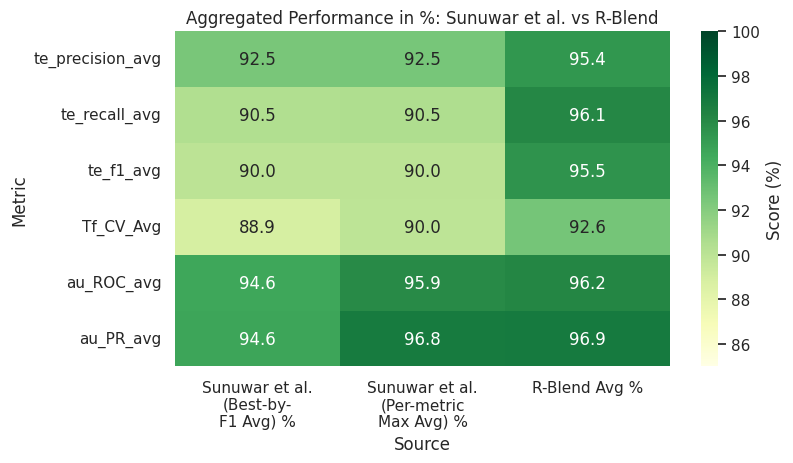

Saved heatmap: /content/drive/MyDrive/Research Work/AMR Automation/Output/figures/overview/rblend_vs_janak_aggregates_heatmap.png


In [ ]:
# ============================================================
# R-Blend vs Janak — Aggregated Comparison in PERCENT
# - Converts all metrics to % (0–100)
# - Heatmap color range fixed to 85–100 for better variation
# ============================================================

from pathlib import Path
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import display, Markdown

# ---- Paths ----
ALL_SET_XLSX = "/content/drive/MyDrive/Research Work/AMR Automation/Data/JSunwar All Set.xlsx"
INT_SET_XLSX = "/content/drive/MyDrive/Research Work/AMR Automation/Data/JSunwar Intersection Set.xlsx"
OUTPUT_ROOT  = "/content/drive/MyDrive/Research Work/AMR Automation/Output/"
RBLEND_RESULTS = Path(OUTPUT_ROOT) / "tables" / "rblend_rscore_smotetomek_anova_0.3_xgb_85_feature_selection_all_cv.csv"

DIR_TABLES = Path(OUTPUT_ROOT) / "tables"
DIR_FIGS   = Path(OUTPUT_ROOT) / "figures" / "overview"
DIR_TABLES.mkdir(parents=True, exist_ok=True)
DIR_FIGS.mkdir(parents=True, exist_ok=True)

# ---- Config ----
BLOCK_SIZE  = 13
SHEET_INDEX = 0
METRICS = ["te_precision_avg", "te_recall_avg", "te_f1_avg", "Tf_CV_Avg", "au_ROC_avg", "au_PR_avg"]

def parse_blocked_workbook(xlsx_path, source_label):
    raw = pd.read_excel(xlsx_path, sheet_name=SHEET_INDEX)
    rows, n = [], len(raw)
    for start in range(0, n, BLOCK_SIZE + 1):  # +1 for blank row
        block = raw.iloc[start:start+BLOCK_SIZE].copy()
        if block.empty or block.isnull().all(axis=1).all():
            continue
        ds_name = block.iloc[0, 0]
        if pd.isna(ds_name):
            continue
        block = block.drop(columns=block.columns[0])
        block.insert(0, "Dataset", ds_name)
        block.insert(1, "Source", source_label)
        rows.append(block)
    if not rows:
        return pd.DataFrame(columns=["Dataset","Source","classifier"] + METRICS)
    df = pd.concat(rows, ignore_index=True)
    for m in METRICS:
        if m in df.columns:
            df[m] = pd.to_numeric(df[m], errors="coerce")
    return df

# ---- Load Janak (both files combined) ----
janak_all = parse_blocked_workbook(ALL_SET_XLSX, "All Set")
janak_int = parse_blocked_workbook(INT_SET_XLSX, "Intersection Set")
janak = pd.concat([janak_all, janak_int], ignore_index=True)

present_metrics = [m for m in METRICS if m in janak.columns]
if not present_metrics:
    raise ValueError("No expected metric columns found in Janak files.")

# A) Best-by-F1 per dataset → average metrics across datasets
best_by_f1_rows = (
    janak.dropna(subset=["te_f1_avg"])
         .sort_values(["Dataset","te_f1_avg"], ascending=[True, False])
         .groupby("Dataset", as_index=False)
         .first()
)
janak_best_by_f1_avg = best_by_f1_rows[present_metrics].mean(numeric_only=True)

# B) Per-metric max per dataset → average across datasets
per_ds_max = janak.groupby("Dataset")[present_metrics].max(numeric_only=True)
janak_per_metric_max_avg = per_ds_max.mean(numeric_only=True)

# ---- Load your R-Blend results and compute averages ----
mine = pd.read_csv(RBLEND_RESULTS)

mine_cols = set(mine.columns)
cv10_candidates = [c for c in mine_cols if ("CV" in c and "F1" in c and "10" in c)]
if cv10_candidates:
    mine_cv_col = sorted(cv10_candidates)[0]
else:
    cv_cols = [c for c in mine_cols if ("CV" in c and "F1" in c)]
    mine_cv_col = None
    if cv_cols:
        mine["Mean CV F1"] = mine[cv_cols].astype(float).mean(axis=1)
        mine_cv_col = "Mean CV F1"

mine_map = {
    "te_precision_avg": "Precision",
    "te_recall_avg":    "Recall",
    "te_f1_avg":        "F1",
    "Tf_CV_Avg":        mine_cv_col,
    "au_ROC_avg":       "AUROC",
    "au_PR_avg":        "AUPRC",
}
mine_avgs = {}
for jm, myc in mine_map.items():
    if myc is None or myc not in mine.columns:
        mine_avgs[jm] = np.nan
    else:
        mine_avgs[jm] = mine[myc].astype(float).mean()

mine_avg_series = pd.Series(mine_avgs)

# ---- Build table in PERCENT ----
to_pct = lambda s: s * 100.0
table = pd.DataFrame({
    "Metric": present_metrics,
    "Janak (Best-by-F1 Avg) %": [to_pct(janak_best_by_f1_avg.get(m, np.nan)) for m in present_metrics],
    "Janak (Per-metric Max Avg) %": [to_pct(janak_per_metric_max_avg.get(m, np.nan)) for m in present_metrics],
    "R-Blend Avg %": [to_pct(mine_avg_series.get(m, np.nan)) for m in present_metrics],
})
# Deltas in percentage points
table["Δ vs Best-by-F1 (pp)"]      = (table["R-Blend Avg %"] - table["Janak (Best-by-F1 Avg) %"]).round(2)
table["Δ vs Per-metric Max (pp)"]  = (table["R-Blend Avg %"] - table["Janak (Per-metric Max Avg) %"]).round(2)
table = table.round(2)

# Save table
out_csv = DIR_TABLES / "rblend_vs_janak_aggregates_table.csv"
table.to_csv(out_csv, index=False)

# ---- Display styled table ----
def highlight_delta(val):
    try:
        v = float(val)
    except Exception:
        return ""
    if np.isnan(v):
        return ""
    return "background-color: lightgreen" if v >= 0 else "background-color: lightcoral"

display(Markdown("### R-Blend vs Janak — Aggregated Comparison (Percent)"))
styled = (
    table.style
    .applymap(highlight_delta, subset=["Δ vs Best-by-F1 (pp)", "Δ vs Per-metric Max (pp)"])
    .format({
        "Sunuwar et al. (Best-by-F1 Avg) %": "{:.2f}%",
        "Sunuwar et al. (Per-metric Max Avg) %": "{:.2f}%",
        "R-Blend Avg %": "{:.2f}%",
        "Δ vs Best-by-F1 (pp)": "{:.2f}",
        "Δ vs Per-metric Max (pp)": "{:.2f}",
    })
    .set_properties(**{"text-align": "center"})
)
display(styled)
print(f"Saved table: {out_csv}")

# ---- Heatmap (metrics x sources) in % with 85–100 range ----
heat = table.set_index("Metric")[["Janak (Best-by-F1 Avg) %","Janak (Per-metric Max Avg) %","R-Blend Avg %"]]

# Force multi-line column names to save horizontal space
heat.columns = [
    "Sunuwar et al.\n(Best-by-\nF1 Avg) %",
    "Sunuwar et al.\n(Per-metric\nMax Avg) %",
    "R-Blend Avg %"
]

plt.figure(figsize=(8.2, 4.8))
sns.heatmap(
    heat, annot=True, fmt=".1f", cmap="YlGn",
    vmin=85, vmax=100, cbar_kws={"label": "Score (%)"}
)
plt.title("Aggregated Performance in %: Sunuwar et al. vs R-Blend")
plt.ylabel("Metric"); plt.xlabel("Source")
plt.tight_layout()
fig_path = DIR_FIGS / "rblend_vs_janak_aggregates_heatmap.png"
plt.savefig(fig_path, dpi=300, bbox_inches="tight")
plt.show()
print(f"Saved heatmap: {fig_path}")


# Perfomance of R-Blend on WGS dataset (Noman et al.)
The following code evaluates different performance matrics on Noman et al.'s dataset. We first took the dataset they shared in their paper's supplimentary documents section. As it contains the information of registant gene presence in each isolate we extracted those and transformed the datset into a binary matrix format and run our model on it.

In [ ]:
import pandas as pd
import numpy as np
from imblearn.combine import SMOTETomek
from sklearn.model_selection import train_test_split
from sklearn.base import clone
from sklearn.ensemble import VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, average_precision_score, cohen_kappa_score, confusion_matrix
from sklearn.feature_selection import f_classif
from sklearn.pipeline import FeatureUnion
from IPython.display import display, Markdown

# === Additional Functions ===
def scale_column(df, column_name='sum'):
    """Normalize the column using MinMaxScaler."""
    scaler = MinMaxScaler()
    scaled_column = scaler.fit_transform(df[column_name].values.reshape(-1, 1))
    df[column_name] = scaled_column
    return df

def add_sum_column(df):
    """
    Adds a 'sum' column (sum of features) to the dataframe excluding 'Genome Name' and target columns.
    Scales the 'sum' column and places it after 'Genome Name' but before the features.
    """
    # Extract feature columns (excluding 'Genome Name' and target columns)
    feature_columns = df.columns[1:-12]  # Exclude 'Genome Name' and the last 12 columns (targets)

    # Calculate the sum for each row
    df['sum'] = df[feature_columns].sum(axis=1)

    # Scale the 'sum' column
    df = scale_column(df, column_name='sum')

    # Move the 'sum' column after 'Genome Name' but before the features and target columns
    cols = list(df.columns)
    cols.insert(1, cols.pop(cols.index('sum')))  # Insert 'sum' after 'Genome Name'

    # Ensure the target columns are preserved in the DataFrame
    df = df[cols]

    return df

# === Feature Selection Functions ===
def anova_feature_importance(X, y, p_value_threshold=0.3):
    F_vals, p_vals = f_classif(X, y)
    anova_pvals = pd.Series(p_vals, index=X.columns)
    selected_features = anova_pvals[anova_pvals < p_value_threshold].index.tolist()
    return selected_features

def selector_importances(model_name: str, X_tr: pd.DataFrame, y_tr: pd.Series) -> pd.Series:
    if model_name == "XGB":
        model = XGBClassifier(
            random_state=42, use_label_encoder=False, eval_metric='logloss',
            n_estimators=400, max_depth=6, subsample=0.8, colsample_bytree=0.8, n_jobs=-1
        )
    else:
        raise ValueError("Only XGB is supported")
    model.fit(X_tr, y_tr)
    importances = pd.Series(model.feature_importances_, index=X_tr.columns, name="importance")
    return importances.sort_values(ascending=False)

def cutoff_features_by_cumulative(importances: pd.Series, cutoff_pct: int) -> list[str]:
    imp = importances / max(importances.sum(), 1e-12)
    cum = imp.cumsum()
    keep = cum[cum <= (cutoff_pct / 100.0)].index.tolist()
    if len(keep) == 0 and len(importances) > 0:
        keep = [importances.index[0]]
    return keep

# === Model Setup ===
ens3_model = VotingClassifier(estimators=[
    ('DT', DecisionTreeClassifier(random_state=0)),
    ('LogR', LogisticRegression(max_iter=1000, random_state=0)),
    # ('SVM', SVC(kernel='rbf', probability=True, random_state=0)),
    ('XGB', XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=0))
], voting='soft', weights=[1, 1.5, 1])

# === Load the dataset from CSV ===
input_file = "/content/drive/MyDrive/Research Work/AMR Automation/Data/dataset_noman.csv"  # Path to the CSV
df_orig = pd.read_csv(input_file)

# === Data Preprocessing ===
df = df_orig.copy()
df = add_sum_column(df)  # Add the sum column as an engineered feature

# Store results
results = []

# Define target columns (the last 12 columns)
target_columns = df.columns[-12:]

# Loop over the target columns
for target_column in target_columns:
    print(f"Processing target: {target_column}")

    y = df[target_column]  # Target variable

    # Exclude the target column and 'Genome Name' column to create the feature set
    X = df.drop(columns=[df.columns[0], target_column])  # Features (excluding isolate and target)

    # If there are missing values in the target column, remove rows with missing labels
    if y.isnull().any():
        print(f"⚠️ Missing values in target variable ({target_column}). Removing rows with missing labels.")
        df = df.dropna(subset=[target_column])
        X = df.drop(columns=[df.columns[0], target_column])
        y = df[target_column]

    # Apply ANOVA feature selection
    anova_selected_features = anova_feature_importance(X, y, p_value_threshold=0.3)

    # Apply XGB feature importance
    xgb_importances = selector_importances("XGB", X, y)
    xgb_selected_features = cutoff_features_by_cumulative(xgb_importances, cutoff_pct=85)

    # Combine selected features from ANOVA and XGB using FeatureUnion
    selected_features = list(set(anova_selected_features) | set(xgb_selected_features))
    print(f"Selected Features ({len(selected_features)}): {sorted(selected_features)}")

    value_counts = y.value_counts()
    res_cnt = value_counts.get(1, 0)
    sus_cnt = value_counts.get(0, 0)
    print(f"Resistant v Suseptive : {res_cnt} and {sus_cnt}")

    # Split the data into training and test sets
    X_train, X_test, y_train, y_test = train_test_split(X[selected_features], y, stratify=y, test_size=0.2, random_state=42)

    # Apply SMOTE with dynamic neighbors based on dataset size
    n_samples = X_train.shape[0]
    n_neighbors = min(6, n_samples - 1)  # Dynamically adjust the number of neighbors


    # if target_column == "Ampicillin" or target_column == "Ceftazidime" or n_samples < 5:  # needed when test split = 0.4
    #     print(f"⚠️ Skipping SMOTETomek due to small sample size ({n_samples} samples).")
    # else:
    #     # Apply SMOTETomek with dynamic neighbors if sufficient samples are available
    #     smote = SMOTE(random_state=42, k_neighbors=n_neighbors)  # Create SMOTE with dynamic neighbors
    #     smote_tomek = SMOTETomek(sampling_strategy='auto', random_state=42, smote=smote)  # Pass SMOTE instance to SMOTETomek
    #     # smote_tomek = SMOTETomek(random_state=42, n_neighbors=n_neighbors)
    #     X_train, y_train = smote_tomek.fit_resample(X_train, y_train)

    # Apply SMOTETomek for balancing the dataset
    smote_tomek = SMOTETomek(random_state=42)
    X_train, y_train = smote_tomek.fit_resample(X_train, y_train)

    # Train the model
    model = clone(ens3_model)
    model.fit(X_train, y_train)
    y_pred_test = model.predict(X_test)
    proba_test = model.predict_proba(X_test)[:, 1]

    # Calculate performance metrics
    acc = round(accuracy_score(y_test, y_pred_test), 3)
    prec = round(precision_score(y_test, y_pred_test), 3)
    rec = round(recall_score(y_test, y_pred_test), 3)  # Sensitivity
    specificity = round(confusion_matrix(y_test, y_pred_test)[0, 0] / (confusion_matrix(y_test, y_pred_test)[0, 0] + confusion_matrix(y_test, y_pred_test)[0, 1]), 3)  # Specificity
    f1 = round(f1_score(y_test, y_pred_test), 3)
    auroc = round(roc_auc_score(y_test, proba_test), 3)
    auprc = round(average_precision_score(y_test, proba_test), 3)
    kappa = round(cohen_kappa_score(y_test, y_pred_test), 3)  # Calculate Kappa stat

    # Store the results for the current target column
    results.append({
        'Target': target_column,
        'Accuracy': acc * 100,
        'Sensitivity (Recall)': rec * 100,
        'Specificity': specificity * 100,
        'Precision': prec * 100,
        'F1 Score': f1 * 100,
        'Kappa': kappa * 100,
        '#Resistant / #Suseptive': f"{res_cnt} / {sus_cnt}",
    })

# Create a DataFrame for results
results_df = pd.DataFrame(results)

# Add the average row for all targets
average_row = results_df.mean(numeric_only=True).round(3).to_dict()
average_row['Target'] = 'Average'
average_row['#Resistant / #Suseptive'] = ''
results_df = pd.concat([results_df, pd.DataFrame([average_row])], ignore_index=True)

# Display the results
display(Markdown("### 🔬 ENS-3 Evaluation Across Different Targets"))
display(results_df)

# Save the results to CSV
output_file = "/content/drive/MyDrive/Research Work/AMR Automation/Output/Noman/R_Blend_on_Noman.csv"
results_df.to_csv(output_file, index=False)

print("Results saved as R_Blend_on_Noman.csv")


Processing target: Ampicillin
Selected Features (24): ['Amoxicillin', 'Cefepime', 'Ceftazidime', 'Chloramphenicol', 'Ciprofloxacin', 'Fosfomycin', 'Gentamycin', 'Meropenem', 'Tetracycline', 'aac(6)-29a', 'aac(6)-Iia', 'aph(3)-Ib', 'blaIMP-34', 'blaIMP-6', 'blaOXA-1', 'blaOXA-101', 'blaOXA-74', 'blaOXA494', 'blaVIM-2', 'cmlA1blaOXA-395', 'dfrA1', 'qacE.catB7', 'sum', 'tet(G)cmlA1']
Resistant v Suseptive : 1428 and 9
Processing target: Amoxicillin
Selected Features (35): ['ARR-3', 'Ampicillin', 'Cefepime', 'Ceftazidime', 'Chloramphenicol', 'Ciprofloxacin', 'Fosfomycin', 'Meropenem', 'aac(3)-Iid', 'aac(6)-29a', 'aac(6)-Iia', 'aac(6)-Iib', 'aadA10', 'aadA5', 'addA1', 'aph(3)-Ib', 'aph(3)-Iib', 'blaGES-5', 'blaIMP-34', 'blaIMP-48', 'blaIMP-6', 'blaOXA-101', 'blaOXA-5', 'blaOXA-50cmlA1', 'blaOXA-74', 'blaVIM-11', 'blaoXA-396', 'crpP', 'dfrA1', 'dfrA14', 'dfrA33', 'sum', 'tet(G)cmlA1', 'tet(G)dfrB5', 'tet(g)']
Resistant v Suseptive : 1423 and 14
Processing target: Meropenem
Selected Features 

### 🔬 ENS-3 Evaluation Across Different Targets

,Target,Accuracy,Sensitivity (Recall),Specificity,Precision,F1 Score,Kappa,#Resistant / #Suseptive
0,Ampicillin,99.300,99.700,50.000,99.700,99.700,49.70,1428 / 9
1,Amoxicillin,98.300,98.600,66.700,99.600,99.100,43.70,1423 / 14
2,Meropenem,96.200,94.500,98.400,98.700,96.600,92.30,814 / 623
3,Cefepime,97.600,98.600,25.000,98.900,98.800,21.00,1415 / 22
4,Fosfomycin,99.000,99.300,50.000,99.600,99.500,39.50,1425 / 12
5,Ceftazidime,99.700,100.000,50.000,99.700,99.800,66.50,1428 / 9
6,Chloramphenicol,97.600,98.200,66.700,99.300,98.800,52.10,1405 / 32
7,Erythromycin,99.700,85.700,100.000,100.000,92.300,92.10,36 / 1401
8,Tetracycline,97.600,92.700,98.400,90.500,91.600,90.10,205 / 1232
9,Gentamycin,87.800,79.500,94.000,90.700,84.700,74.70,608 / 829


Results saved as R_Blend_on_Noman.csv


In [ ]:
# Different Performances based on ANOVA p-value
#             Acc     Rec     Specif  Prec    F1      kappa         P-value
# 12	Average	95.0	  92.85	  75.108	95.8	  94.142	52.95  	NaN - 0.01
# 12	Average	96.075	93.767	71.017	95.175	94.275	52.875	NaN - 0.05
# 12	Average	96.425	94.3	  73.008	97.0  	95.5	  55.75	  NaN - 0.1
# 12	Average	96.717	94.383	79.233	95.675	94.942	66.95	  NaN - 0.2
# 12	Average	97.2	  94.942	74.5	  96.725	95.792	66.783	NaN - 0.3
# 12	Average	97.342	95.283	74.467	96.283	95.725	67.608	NaN - 0.5 <- can be considered as best
# 12	Average	97.475	95.283	74.442	95.567	95.35	  68.217	NaN - 0.55
# 12	Average	97.433	95.45	  70.233	96.683	96.033	62.108	NaN - 0.6
# 12	Average	97.167	95.125	71.55	  97.575	96.225	63.325	NaN - 0.7
# 12	Average	97.692	95.683	73.758	95.233	95.367	66.483	NaN - 0.9
# 12	Average	97.758	95.642	75.183	95.8	  95.65	  67.7	  NaN - 1

# Ablation Study

In [ ]:
import pandas as pd
import numpy as np
import re, time, warnings
from pathlib import Path
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, average_precision_score
from sklearn.feature_selection import f_classif
from sklearn.ensemble import VotingClassifier, RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from xgboost import XGBClassifier
from imblearn.combine import SMOTETomek
from sklearn.preprocessing import MinMaxScaler
from pathlib import Path
import time

import os

# Check if Google Drive is mounted
if not os.path.ismount('/content/drive'):
    print("Google Drive is not mounted. Skipping the next executions.")
    raise RuntimeError("Google Drive is not mounted!")

# Configuration and paths
OUTPUT_ROOT = "/content/drive/MyDrive/Research Work/AMR Automation/Output/"
DIR_GS = Path(OUTPUT_ROOT) / "Ablation"
DIR_LOGS = DIR_GS / "logs"
DIR_RESULTS_PD = DIR_GS / "per_dataset"

for d in [DIR_GS, DIR_LOGS, DIR_RESULTS_PD]:
    d.mkdir(parents=True, exist_ok=True)

# Settings
RANDOM_STATE = 42
TEST_SIZE = 0.2
ANOVA_PS = [0.30]
SELECTORS = ["XGB"]
CUTOFFS = [85]

ANOVA_P  = 0.30
SELECTOR = "XGB"
CUTOFF   = 85

# Helper functions

def slug(text: str) -> str:
    return re.sub(r"[^\w]+", "_", text).strip("_").lower()

def clean_dataset_name(name: str):
    parts = name.split('_')
    if len(parts) >= 4:
        antibiotic = parts[2].capitalize()
        pathogen = parts[3].upper()
        return f"{antibiotic} ({pathogen})"
    return name

def add_rscore(X_df: pd.DataFrame) -> pd.DataFrame:
    X = X_df.copy()
    rsum = X.sum(axis=1)
    X["R-Score"] = MinMaxScaler().fit_transform(rsum.values.reshape(-1, 1))
    return X

def anova_select(X_tr: pd.DataFrame, y_tr: pd.Series, p_thresh: float):
    f_vals, p_vals = f_classif(X_tr, y_tr)
    p_series = pd.Series(p_vals, index=X_tr.columns, name="p_value")
    keep = p_series[p_series <= p_thresh].index.tolist()
    if "R-Score" in X_tr.columns and "R-Score" not in keep:
        keep.append("R-Score")
    return p_series, keep

def selector_importances(model_name: str, X_tr: pd.DataFrame, y_tr: pd.Series) -> pd.Series:
    if model_name == "RF":
        model = RandomForestClassifier(
            n_estimators=300, criterion="entropy", random_state=RANDOM_STATE, n_jobs=-1
        )
    elif model_name == "XGB":
        model = XGBClassifier(
            random_state=RANDOM_STATE, use_label_encoder=False, eval_metric='logloss',
            n_estimators=400, max_depth=6, subsample=0.8, colsample_bytree=0.8, n_jobs=-1
        )
    else:
        raise ValueError("selector must be 'RF' or 'XGB'")
    model.fit(X_tr, y_tr)
    s = pd.Series(model.feature_importances_, index=X_tr.columns, name="importance")
    return s.sort_values(ascending=False)

def cutoff_features_by_cumulative(importances: pd.Series, cutoff_pct: int) -> list[str]:
    imp = importances / max(importances.sum(), 1e-12)
    cum = imp.cumsum()
    keep = cum[cum <= (cutoff_pct / 100.0)].index.tolist()
    if len(keep) == 0 and len(importances) > 0:
        keep = [importances.index[0]]
    return keep

def rblend_est(ens_models=["DT", "LogR", "SVM", "XGB"], weights=None):
    """
    Creates a voting classifier based on the specified models.

    :param ens_models:  List of strings specifying which models to include in the ensemble.
                        Options: "DT" (DecisionTree), "LogR" (LogisticRegression), "SVM", "XGB"
                        Example: models=["DT", "LogR"] will include only DecisionTree and LogisticRegression.
    :return: VotingClassifier with the selected models
    """
    estimators = []

    # Add models to the ensemble based on the provided list
    if "DT" in ens_models:
        estimators.append(('DT', DecisionTreeClassifier(criterion='entropy', random_state=0)))
    if "LogR" in ens_models:
        estimators.append(('LogR', LogisticRegression(random_state=0, max_iter=1000)))
    if "XGB" in ens_models:
        estimators.append(('XGB', XGBClassifier(random_state=0, use_label_encoder=False, eval_metric='logloss')))

    # Default equal weights if no custom weights provided
    if weights is None:
        weights = [1] * len(estimators)

    # Create and return the VotingClassifier with the selected models and weights
    return VotingClassifier(
        estimators=estimators,
        voting='soft',
        weights=weights,
        n_jobs=-1
    )

def safe_metrics(y_true, y_pred, scores=None):
    acc  = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, zero_division=0)
    rec  = recall_score(y_true, y_pred, zero_division=0)
    f1   = f1_score(y_true, y_pred, zero_division=0)
    if scores is not None and len(np.unique(y_true)) > 1:
        try:
            auroc = roc_auc_score(y_true, scores)
            auprc = average_precision_score(y_true, scores)
        except Exception:
            auroc, auprc = np.nan, np.nan
    else:
        auroc, auprc = np.nan, np.nan
    return acc, prec, rec, f1, auroc, auprc

def get_scores(model, X):
    if hasattr(model, "predict_proba"):
        p = model.predict_proba(X)
        if p is not None and p.ndim == 2 and p.shape[1] > 1:
            return p[:, 1]
    if hasattr(model, "decision_function"):
        s = model.decision_function(X)
        return s.ravel()
    return None

# -----------------------
# Run Settings for a Single Dataset
# -----------------------
def run_targeted_setting(ds_name, df, anova_p, selector, cutoff, log_path):
    t0 = time.time()

    y = df.iloc[:, -1]
    X = add_rscore(df.iloc[:, 1:-1])

    # Change for finding out no R-Score
    # Uncmment the previous and the next line
    # X = df.iloc[:, 1:-1]

    try:
        X_tr, X_te, y_tr, y_te = train_test_split(
            X, y, test_size=TEST_SIZE, stratify=y, random_state=RANDOM_STATE
        )
    except ValueError:
        X_tr, X_te, y_tr, y_te = train_test_split(X, y, test_size=TEST_SIZE, random_state=RANDOM_STATE)

    vc = y.value_counts()
    n_pos, n_neg = int(vc.get(1, 0)), int(vc.get(0, 0))
    print(f"Starting: [{ds_name}] R={n_pos} S={n_neg} | ANOVA p={anova_p:.2f} | Selector={selector} | Cut={cutoff}%", flush=True)

    # Feature Selection
    pvals, anova_keep = anova_select(X_tr, y_tr, anova_p)
    importances = selector_importances(selector, X_tr, y_tr)
    model_keep = cutoff_features_by_cumulative(importances, cutoff)

    anova_set, model_set = set(anova_keep), set(model_keep)
    both_set  = anova_set & model_set
    union_set = anova_set | model_set

    # No ANOVA
    # Uncomment the following line only
    # union_set = model_set

    # No XGB Feature Importance
    # Uncomment the following line only
    # union_set = anova_set

    # Selected Features for Training
    feats_use = list(union_set) if len(union_set) > 0 else list(both_set) if len(both_set) > 0 else list(model_set)
    feats_use = [f for f in X.columns if f in feats_use]
    X_tr_sel, X_te_sel = X_tr[feats_use], X_te[feats_use]

    # No feature selection used (No ANOVA and No XGB)
    # Uncomment the following line only
    # X_tr_sel, X_te_sel = X_tr, X_te

    # Safe SMOTETomek
    if y_tr.value_counts().min() < 2:
        X_tr_bal, y_tr_bal = X_tr_sel, y_tr
        resample_note = "NO-RESAMPLE(min<2)"
    else:
        smt = SMOTETomek(random_state=RANDOM_STATE)
        X_tr_bal, y_tr_bal = smt.fit_resample(X_tr_sel, y_tr)
        resample_note = "SMOTETomek"

    # No SMOTETomek Balancing
    # Uncomment the following line only
    # X_tr_bal, y_tr_bal = X_tr_sel, y_tr


    # model = rblend_est(weights=[1, 1.5, 1])
    # model = rblend_est(ens_models=["LogR", "XGB"], weights=[1.5, 1])  # Uncomment - No_DT
    # model = rblend_est(ens_models=["DT", "XGB"], weights=[1, 1])  # Uncomment - No_LogR
    model = rblend_est(ens_models=["DT", "LogR"], weights=[1, 1.5])  # Uncomment - No_XGB

    model.fit(X_tr_bal, y_tr_bal)
    y_pred = model.predict(X_te_sel)
    scores = get_scores(model, X_te_sel)
    acc, prec, rec, f1, auroc, auprc = safe_metrics(y_te, y_pred, scores)

    line = f"[{ds_name}] R={n_pos} S={n_neg} | {resample_note} | p={anova_p} | {selector} {cutoff}% | F1={f1:.3f} AUROC={auroc:.3f}"
    print(line, flush=True)
    with open(log_path, "a") as f:
        f.write(line + "\n")

    return {
        "Dataset": ds_name, "anova_p": anova_p, "selector_model": selector, "cum_importance": cutoff,
        "Accuracy": acc, "Precision": prec, "Recall": rec, "F1": f1, "AUROC": auroc, "AUPRC": auprc,
        "resample": resample_note,
        "ANOVA_Selected_Features": list(anova_set),
        "XGB_Selected_Features": list(model_set),
        "Common_Selected_Features": list(both_set),
        "Union_Selected_Features": list(union_set)
    }

# -----------------------
# Run on Datasets for Targeted Setting
# -----------------------
DATASETS = DATASET_PATHS

all_rows = []
for path in DATASETS:
    df = pd.read_csv(path)
    ds_name = clean_dataset_name(Path(path).stem)
    if df.iloc[:, -1].nunique() < 2:
        print(f"⚠️ Skipping {ds_name} (only one class).")
        continue

    log_path = DIR_LOGS / f"{slug(ds_name)}.log"
    with open(log_path, "w") as f:
        f.write(f"Grid search log for {ds_name}\n")

    # Targeted settings (ANOVA p=ANOVA_P, Selector = SELECTOR, CUTOFF% importance)
    results = run_targeted_setting(ds_name, df, ANOVA_P, SELECTOR, CUTOFF, log_path)

    all_rows.append(results)

# Create final DataFrame from results
final_df = pd.DataFrame(all_rows)

# Save initial results CSV
final_csv = DIR_GS / f"E3_No_ENS_XGB_results_with_avg_p_{ANOVA_P}_{SELECTOR}_{CUTOFF}.csv"
final_df.to_csv(final_csv, index=False)

# Print completion message
print(f"\n✅ Completed targeted settings. Results saved in {final_csv}")

# Calculate and add average row for metrics
numeric_columns = final_df.select_dtypes(include=[np.number]).columns
averages = final_df[numeric_columns].mean().round(3)

# Create average row
average_row = pd.Series(["Average"] + averages.tolist(), index=["Dataset"] + numeric_columns.tolist())

# Append the average row to the DataFrame
final_df = pd.concat([final_df, pd.DataFrame([average_row])], ignore_index=True)

# Save the updated CSV with averages
final_df.to_csv(final_csv, index=False)
display(final_df)

Starting: [Doripenem (KN)] R=241 S=75 | ANOVA p=0.30 | Selector=XGB | Cut=85%
[Doripenem (KN)] R=241 S=75 | SMOTETomek | p=0.3 | XGB 85% | F1=0.970 AUROC=0.935
Starting: [Ertapenem (KN)] R=90 S=91 | ANOVA p=0.30 | Selector=XGB | Cut=85%
[Ertapenem (KN)] R=90 S=91 | SMOTETomek | p=0.3 | XGB 85% | F1=0.944 AUROC=0.980
Starting: [Meropenem (ECS)] R=45 S=46 | ANOVA p=0.30 | Selector=XGB | Cut=85%
[Meropenem (ECS)] R=45 S=46 | SMOTETomek | p=0.3 | XGB 85% | F1=0.947 AUROC=1.000
Starting: [Ertapenem (ECS)] R=61 S=68 | ANOVA p=0.30 | Selector=XGB | Cut=85%
[Ertapenem (ECS)] R=61 S=68 | SMOTETomek | p=0.3 | XGB 85% | F1=0.957 AUROC=0.970
Starting: [Doripenem (ECS)] R=25 S=24 | ANOVA p=0.30 | Selector=XGB | Cut=85%
[Doripenem (ECS)] R=25 S=24 | SMOTETomek | p=0.3 | XGB 85% | F1=0.889 AUROC=0.880
Starting: [Imipenem (ECS)] R=37 S=27 | ANOVA p=0.30 | Selector=XGB | Cut=85%
[Imipenem (ECS)] R=37 S=27 | SMOTETomek | p=0.3 | XGB 85% | F1=1.000 AUROC=1.000
Starting: [Doripenem (PA)] R=22 S=22 | ANOVA

,Dataset,anova_p,selector_model,cum_importance,Accuracy,Precision,Recall,F1,AUROC,AUPRC,resample,ANOVA_Selected_Features,XGB_Selected_Features,Common_Selected_Features,Union_Selected_Features
0,Doripenem (KN),0.3,XGB,85.0,0.953125,0.960000,0.979592,0.969697,0.934694,0.965212,SMOTETomek,"[gyrA_D87G=POINT, blaNDM-1=COMPLETE, aac(6')-I...","[tet(A)=COMPLETE, catB3=PARTIAL_END_OF_CONTIG,...","[R-Score, blaSHV-28=COMPLETE, aadA1=COMPLETE, ...","[gyrA_D87G=POINT, blaNDM-1=COMPLETE, blaOXA-18..."
1,Ertapenem (KN),0.3,XGB,85.0,0.945946,0.944444,0.944444,0.944444,0.979532,0.984444,SMOTETomek,"[gyrA_D87G=POINT, blaNDM-1=COMPLETE, aac(6')-I...","[blaOXA-181=COMPLETE, blaTEM=PARTIAL, aph(3')-...","[blaOXA-181=COMPLETE, oqxB19=COMPLETE, sul2=CO...","[gyrA_D87G=POINT, blaCTX-M-3=COMPLETE, blaNDM-..."
2,Meropenem (ECS),0.3,XGB,85.0,0.947368,0.900000,1.000000,0.947368,1.000000,1.000000,SMOTETomek,"[blaNDM-1=COMPLETE, cyaA_S352T=POINT, catB3=PA...",[gyrA_D87N=POINT],[gyrA_D87N=POINT],"[blaNDM-1=COMPLETE, uhpT_E350Q=POINT, catB3=PA..."
3,Ertapenem (ECS),0.3,XGB,85.0,0.961538,1.000000,0.916667,0.956522,0.970238,0.975490,SMOTETomek,"[blaNDM-1=COMPLETE, aph(3')-Ia=COMPLETE, blaEC...","[blaCMY-2=COMPLETE, sul2=COMPLETE, sul1=COMPLE...","[sul1=COMPLETE, sul2=COMPLETE, mph(A)=COMPLETE...","[blaNDM-1=COMPLETE, blaOXA-181=COMPLETE, uhpT_..."
4,Doripenem (ECS),0.3,XGB,85.0,0.900000,1.000000,0.800000,0.888889,0.880000,0.925000,SMOTETomek,"[blaNDM-1=COMPLETE, uhpT_E350Q=POINT, catB3=PA...","[blaCMY-2=COMPLETE, cyaA_S352T=POINT, mdtM=COM...","[blaCMY-2=COMPLETE, uhpT_E350Q=POINT, mdtM=COM...","[blaNDM-1=COMPLETE, uhpT_E350Q=POINT, catB3=PA..."
5,Imipenem (ECS),0.3,XGB,85.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,SMOTETomek,"[blaEC=PARTIAL_END_OF_CONTIG, gyrA_D87N=POINT,...","[ble=COMPLETE, ptsI_V25I=POINT, aph(3'')-Ib=CO...","[ptsI_V25I=POINT, aph(3'')-Ib=COMPLETE, sul1=C...","[blaEC=PARTIAL_END_OF_CONTIG, blaNDM-1=COMPLET..."
6,Doripenem (PA),0.3,XGB,85.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,SMOTETomek,"[blaPDC-3=COMPLETE, floR2=COMPLETE, aadA1=COMP...",[R-Score],[R-Score],"[tet(A)=COMPLETE, blaPDC-3=COMPLETE, blaOXA-10..."
7,Streptomycin (SE),0.3,XGB,85.0,0.923445,0.884298,0.981651,0.930435,0.938991,0.913966,SMOTETomek,"[gyrA_D87G=POINT, aph(6)-Ic=PARTIAL, aph(3')-I...","[sul1=COMPLETE, aph(3')-IIa=COMPLETE, aac(2')-...","[sul1=COMPLETE, aph(3')-IIa=COMPLETE, aac(2')-...","[gyrA_D87G=POINT, aph(6)-Ic=PARTIAL, blaCARB-2..."
8,Imipenem (KN),0.3,XGB,85.0,0.925000,0.884615,1.000000,0.938776,0.956522,0.968383,SMOTETomek,"[gyrA_D87G=POINT, blaNDM-1=COMPLETE, aac(6')-I...","[gyrA_D87G=POINT, blaOXA-181=COMPLETE, mph(E)=...","[gyrA_D87G=POINT, blaOXA-181=COMPLETE, blaKPC-...","[gyrA_D87G=POINT, blaNDM-1=COMPLETE, blaOXA-18..."
9,Clindamycin (CJ),0.3,XGB,85.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,SMOTETomek,"[blaOXA-193=COMPLETE, sat4=COMPLETE, R-Score, ...",[lnu(C)=COMPLETE],[lnu(C)=COMPLETE],"[blaOXA-193=COMPLETE, sat4=COMPLETE, R-Score, ..."


# Grid search on ENS-3 -- (including internal hyperparameters)

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.base import clone
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, average_precision_score, make_scorer
from imblearn.over_sampling import SMOTE
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, StratifiedKFold

# Define parameter grids for internal models
param_grid_DT = {
    'max_depth': [3, 5, 7],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
}

param_grid_LogR = {
    'C': [0.1, 1, 10],
    'solver': ['lbfgs', 'liblinear'],
}

param_grid_SVM = {
    'C': [0.1, 1, 10],
    'gamma': ['scale', 'auto'],
}

param_grid_XGB = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1],
    'n_estimators': [50, 100, 200],
    'subsample': [0.8, 1.0],
}

# Define parameter grid for grid search (voting and weights)
param_grid_ens3 = {
    'voting': ['soft', 'hard'],  # Try both hard and soft voting
    'weights': [
        (1, 1, 1, 1),  # Equal weight for each classifier
        (2, 1, 1, 1),  # Give more weight to DecisionTree
        (1, 2, 1, 1),  # Give more weight to LogisticRegression
        (1, 1, 2, 1),  # Give more weight to SVM
        (1, 1, 1, 2),  # Give more weight to XGB
    ]
}

# Function to perform grid search on ENS-3 model
def perform_grid_search(model, param_grid, X_train, y_train):
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=1)
    grid_search.fit(X_train, y_train)
    return grid_search.best_estimator_, grid_search.best_params_

# Main loop for all datasets
results = []

for i in range(len(dataset)):
    path = dataset[i]
    dataset_name = clean_dataset_name(path.split('/')[-1][:-4])
    df = pd.read_csv(path)

    # Optionally add sum column (if applicable)
    df = add_sum_column(df)

    y = df[df.columns[-1]]
    X = df.drop(columns=[df.columns[0], df.columns[-1]])  # Exclude Isolate and Label

    # Split first
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, stratify=y, test_size=0.2, random_state=42
    )

    # Apply SMOTE ONLY to the training set
    smote = SMOTE(random_state=42)
    X_train, y_train = smote.fit_resample(X_train, y_train)

    # Define the ensemble model (ENS-3)
    ens3_model = VotingClassifier(
        estimators=[
            ('DT', DecisionTreeClassifier(criterion='entropy', random_state=0)),
            ('LogR', LogisticRegression(random_state=0, max_iter=1000)),
            ('SVM', SVC(kernel='rbf', probability=True, random_state=0)),
            ('XGB', XGBClassifier(random_state=0, use_label_encoder=False, eval_metric='logloss')),
        ],
        voting='soft'  # Default to 'soft', will be tuned in grid search
    )

    # Perform grid search for VotingClassifier (voting and weights)
    print(f"Performing Grid Search for ENS-3 voting and weights...")
    best_model, best_params = perform_grid_search(ens3_model, param_grid_ens3, X_train, y_train)
    print(f"Best parameters for ENS-3 voting and weights: {best_params}")
    ens3_model = best_model  # Update the model with the best parameters found

    # For DecisionTree (DT)
    dt_model = ens3_model.named_estimators_['DT']  # Access the DecisionTreeClassifier directly by name
    print(f"Performing Grid Search for DecisionTree...")
    best_dt_model, best_dt_params = perform_grid_search(dt_model, param_grid_DT, X_train, y_train)
    print(f"Best parameters for DecisionTree: {best_dt_params}")

    # For LogisticRegression (LogR)
    logr_model = ens3_model.named_estimators_['LogR']  # Access the LogisticRegression model directly by name
    print(f"Performing Grid Search for LogisticRegression...")
    best_logr_model, best_logr_params = perform_grid_search(logr_model, param_grid_LogR, X_train, y_train)
    print(f"Best parameters for LogisticRegression: {best_logr_params}")

    # For Support Vector Machine (SVM)
    svm_model = ens3_model.named_estimators_['SVM']  # Access the SVM model directly by name
    print(f"Performing Grid Search for SVM...")
    best_svm_model, best_svm_params = perform_grid_search(svm_model, param_grid_SVM, X_train, y_train)
    print(f"Best parameters for SVM: {best_svm_params}")

    # For XGBoost (XGB)
    xgb_model = ens3_model.named_estimators_['XGB']  # Access the XGBoost model directly by name
    print(f"Performing Grid Search for XGBoost...")
    best_xgb_model, best_xgb_params = perform_grid_search(xgb_model, param_grid_XGB, X_train, y_train)
    print(f"Best parameters for XGBoost: {best_xgb_params}")

    # Now, update the ensemble model with the tuned internal models
    ens3_model.estimators_ = [
        ('DT', best_dt_model),
        ('LogR', best_logr_model),
        ('SVM', best_svm_model),
        ('XGB', best_xgb_model)
    ]

    # ------- Train and Test -------
    ens3_model.fit(X_train, y_train)

    # Training metrics
    y_pred_train = ens3_model.predict(X_train)
    tr_prec = precision_score(y_train, y_pred_train, zero_division=0)
    tr_rec = recall_score(y_train, y_pred_train, zero_division=0)
    tr_f1 = f1_score(y_train, y_pred_train, zero_division=0)
    tr_acc = accuracy_score(y_train, y_pred_train)

    # Test metrics
    y_pred_test = ens3_model.predict(X_test)
    te_prec = precision_score(y_test, y_pred_test, zero_division=0)
    te_rec = recall_score(y_test, y_pred_test, zero_division=0)
    te_f1 = f1_score(y_test, y_pred_test, zero_division=0)
    te_acc = accuracy_score(y_test, y_pred_test)

    # Proba for AUROC/AUPRC (if supported)
    proba_test = ens3_model.predict_proba(X_test)[:, 1] if hasattr(ens3_model, "predict_proba") else None
    auroc = roc_auc_score(y_test, proba_test) if proba_test is not None else np.nan
    auprc = average_precision_score(y_test, proba_test) if proba_test is not None else np.nan

    # Cross-validation F1 (10-fold)
    try:
        skf10 = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
        tf_cv = cross_val_score(ens3_model, X, y, cv=skf10, scoring=make_scorer(f1_score, zero_division=0)).mean()
    except Exception:
        tf_cv = np.nan

    # Append results for current dataset
    results.append({
        'Dataset Name': dataset_name,
        'classifier': 'ENS-3',
        'tr_accuracy_avg': round(tr_acc, 3),
        'tr_precision_avg': round(tr_prec, 3),
        'tr_recall_avg': round(tr_rec, 3),
        'tr_f1_avg': round(tr_f1, 3),
        'te_accuracy_avg': round(te_acc, 3),
        'te_precision_avg': round(te_prec, 3),
        'te_recall_avg': round(te_rec, 3),
        'te_f1_avg': round(te_f1, 3),
        'Tf_CV_Avg': round(tf_cv, 3),
        'au_ROC_avg': round(auroc, 3),
        'au_PR_avg': round(auprc, 3),
    })

# Convert to DataFrame & Display Results
ens3_df = pd.DataFrame(results)

# Average row (numeric columns only)
avg_row = ens3_df.select_dtypes(include=[np.number]).mean()
avg_row = avg_row.round(3)
avg_row = avg_row.to_dict()
avg_row['Dataset Name'] = 'Average'
avg_row['classifier'] = 'ENSEMBLE'
ens3_df = pd.concat([ens3_df, pd.DataFrame([avg_row])], ignore_index=True)

display(Markdown("### ENS-3 Model Results with Grid Search"))
display(ens3_df)

# Optional: Save results to Excel
# ens3_df.to_excel("Grid_Search_Ensemble_results_ENS-3.xlsx", index=False)

Performing Grid Search for ENS-3 voting and weights...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best parameters for ENS-3 voting and weights: {'voting': 'hard', 'weights': (2, 1, 1, 1)}
Performing Grid Search for DecisionTree...
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Best parameters for DecisionTree: {'max_depth': 7, 'min_samples_leaf': 1, 'min_samples_split': 2}
Performing Grid Search for LogisticRegression...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
Best parameters for LogisticRegression: {'C': 10, 'solver': 'liblinear'}
Performing Grid Search for SVM...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
Best parameters for SVM: {'C': 10, 'gamma': 'scale'}
Performing Grid Search for XGBoost...
Fitting 5 folds for each of 36 candidates, totalling 180 fits
Best parameters for XGBoost: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 100, 'subsample': 0.8}
Performing Grid Search for ENS-3 voting and weights...
F

### ENS-3 Model Results with Grid Search

,Dataset Name,classifier,tr_accuracy_avg,tr_precision_avg,tr_recall_avg,tr_f1_avg,te_accuracy_avg,te_precision_avg,te_recall_avg,te_f1_avg,Tf_CV_Avg,au_ROC_avg,au_PR_avg
0,Doripenem (KN),ENS-3,0.997,0.995,1.000,0.997,0.953,0.960,0.980,0.970,0.936,NaN,NaN
1,Ertapenem (KN),ENS-3,1.000,1.000,1.000,1.000,0.892,0.889,0.889,0.889,0.928,0.977,0.976
2,Meropenem (ECS),ENS-3,0.972,1.000,0.944,0.971,0.947,0.900,1.000,0.947,0.918,1.000,1.000
3,Ertapenem (ECS),ENS-3,0.972,1.000,0.944,0.971,0.962,1.000,0.917,0.957,0.913,0.958,0.969
4,Doripenem (ECS),ENS-3,0.950,1.000,0.900,0.947,0.900,1.000,0.800,0.889,0.847,NaN,NaN
5,Imipenem (ECS),ENS-3,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,0.941,1.000,1.000
6,Doripenem (PA),ENS-3,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,0.967,1.000,1.000
7,Streptomycin (SE),ENS-3,0.956,0.928,0.988,0.957,0.933,0.899,0.982,0.939,0.947,0.942,0.920
8,Imipenem (KN),ENS-3,0.994,0.989,1.000,0.994,0.925,0.885,1.000,0.939,0.911,0.969,0.977
9,Clindamycin (CJ),ENS-3,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,0.800,1.000,1.000


In [ ]:
# ============================================================
# R-Blend Hyperparameter Grid Search
# Grid search over voting type and weight combinations
# With R-Score + Feature Selection + SMOTETomek
# ============================================================

import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
from pathlib import Path
import time
from itertools import product

from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, average_precision_score, make_scorer
)
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import f_classif
from sklearn.ensemble import VotingClassifier, RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from xgboost import XGBClassifier

from imblearn.combine import SMOTETomek
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline

# ============================================================
# Configuration
# ============================================================
OUTPUT_ROOT = "/content/drive/MyDrive/Research Work/AMR Automation/Output/"
DIR_GS = Path(OUTPUT_ROOT) / "gridsearch" / "rblend_hyperparam"
DIR_LOGS = DIR_GS / "logs"
DIR_RESULTS = DIR_GS / "results"

for d in [DIR_GS, DIR_LOGS, DIR_RESULTS]:
    d.mkdir(parents=True, exist_ok=True)

# Fixed settings (from your best feature selection config)
RANDOM_STATE = 42
TEST_SIZE = 0.2
ANOVA_P = 0.30
SELECTOR = "XGB"
CUTOFF = 85

# ============================================================
# R-Blend Hyperparameter Grid
# ============================================================
param_grid_rblend = {
    'voting': ['soft', 'hard'],
    'weights': [
        (1, 1, 1),       # Equal weights
        (1, 1.5, 1),     # Current best (more weight to LogR)
        (1, 2, 1),       # Even more weight to LogR
        (2, 1, 1),       # More weight to DT
        (1, 1, 2),       # More weight to XGB
        (2, 2, 1),       # More weight to DT and LogR
        (1, 2, 2),       # More weight to LogR and XGB
        (2, 1, 2),       # More weight to DT and XGB
        (1, 1.5, 1.5),   # Slight boost to LogR and XGB
        (1.5, 1.5, 1),   # Slight boost to DT and LogR
    ]
}

# Generate all combinations
param_combinations = list(product(
    param_grid_rblend['voting'],
    param_grid_rblend['weights']
))

print(f"Total hyperparameter combinations: {len(param_combinations)}")
for i, (v, w) in enumerate(param_combinations):
    print(f"  {i+1}. voting={v}, weights={w}")

# ============================================================
# Helper Functions
# ============================================================
def slug(s: str) -> str:
    return str(s).replace("(", "").replace(")", "").replace(" ", "_").replace("/", "_")

def clean_dataset_name(name: str):
    parts = name.split('_')
    if len(parts) >= 4:
        antibiotic = parts[2].capitalize()
        pathogen = parts[3].upper()
        return f"{antibiotic} ({pathogen})"
    return name

def add_rscore(X_df: pd.DataFrame) -> pd.DataFrame:
    X = X_df.copy()
    rsum = X.sum(axis=1)
    X["R-Score"] = MinMaxScaler().fit_transform(rsum.values.reshape(-1, 1))
    return X

def anova_select(X_tr: pd.DataFrame, y_tr: pd.Series, p_thresh: float):
    f_vals, p_vals = f_classif(X_tr, y_tr)
    p_series = pd.Series(p_vals, index=X_tr.columns, name="p_value")
    keep = p_series[p_series <= p_thresh].index.tolist()
    if "R-Score" in X_tr.columns and "R-Score" not in keep:
        keep.append("R-Score")
    return p_series, keep

def selector_importances(model_name: str, X_tr: pd.DataFrame, y_tr: pd.Series) -> pd.Series:
    if model_name == "RF":
        model = RandomForestClassifier(
            n_estimators=300, criterion="entropy", random_state=RANDOM_STATE, n_jobs=-1
        )
    elif model_name == "XGB":
        model = XGBClassifier(
            random_state=RANDOM_STATE, use_label_encoder=False, eval_metric='logloss',
            n_estimators=400, max_depth=6, subsample=0.8, colsample_bytree=0.8, n_jobs=-1
        )
    else:
        raise ValueError("selector must be 'RF' or 'XGB'")
    model.fit(X_tr, y_tr)
    s = pd.Series(model.feature_importances_, index=X_tr.columns, name="importance")
    return s.sort_values(ascending=False)

def cutoff_features_by_cumulative(importances: pd.Series, cutoff_pct: int) -> list:
    imp = importances / max(importances.sum(), 1e-12)
    cum = imp.cumsum()
    keep = cum[cum <= (cutoff_pct / 100.0)].index.tolist()
    if len(keep) == 0 and len(importances) > 0:
        keep = [importances.index[0]]
    return keep

def rblend_est(voting='soft', weights=(1, 1.5, 1)):
    """
    Create R-Blend VotingClassifier with configurable voting and weights.

    Parameters:
    -----------
    voting : str, 'soft' or 'hard'
    weights : tuple of 3 floats, weights for (DT, LogR, XGB)

    Note: For hard voting, weights are ignored by sklearn but we keep them for logging.
    """
    # For hard voting, SVC needs probability=False (default)
    # For soft voting, all estimators need predict_proba

    estimators = [
        ('DT', DecisionTreeClassifier(criterion='entropy', random_state=0)),
        ('LogR', LogisticRegression(random_state=0, max_iter=1000)),
        ('XGB', XGBClassifier(random_state=0, use_label_encoder=False, eval_metric='logloss'))
    ]

    # Note: weights are only used in soft voting; ignored in hard voting
    return VotingClassifier(
        estimators=estimators,
        voting=voting,
        weights=list(weights) if voting == 'soft' else None,
        n_jobs=-1
    )

def safe_metrics(y_true, y_pred, scores=None):
    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, zero_division=0)
    rec = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    if scores is not None and len(np.unique(y_true)) > 1:
        try:
            auroc = roc_auc_score(y_true, scores)
            auprc = average_precision_score(y_true, scores)
        except Exception:
            auroc, auprc = np.nan, np.nan
    else:
        auroc, auprc = np.nan, np.nan
    return acc, prec, rec, f1, auroc, auprc

def get_scores(model, X):
    """Get probability scores for AUROC/AUPRC calculation."""
    if hasattr(model, "predict_proba"):
        try:
            p = model.predict_proba(X)
            if p is not None and p.ndim == 2 and p.shape[1] > 1:
                return p[:, 1]
        except Exception:
            pass
    if hasattr(model, "decision_function"):
        try:
            s = model.decision_function(X)
            return s.ravel()
        except Exception:
            pass
    return None

def safe_cv_score(X_data, y_data, voting, weights, n_splits=5):
    """
    Cross-validation with SMOTETomek inside each fold.
    """
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=RANDOM_STATE)
    f1_scorer = make_scorer(f1_score, zero_division=0)

    min_class_size = y_data.value_counts().min()

    if min_class_size < 2:
        # Can't do SMOTE
        pipe = rblend_est(voting=voting, weights=weights)
    elif min_class_size <= 5:
        k_neighbors = max(1, min_class_size - 1)
        pipe = Pipeline([
            ("smt", SMOTETomek(random_state=RANDOM_STATE,
                              smote=SMOTE(random_state=RANDOM_STATE, k_neighbors=k_neighbors))),
            ("clf", rblend_est(voting=voting, weights=weights))
        ])
    else:
        pipe = Pipeline([
            ("smt", SMOTETomek(random_state=RANDOM_STATE)),
            ("clf", rblend_est(voting=voting, weights=weights))
        ])

    try:
        cv_scores = cross_val_score(pipe, X_data, y_data, cv=skf, scoring=f1_scorer, n_jobs=-1)
        return np.mean(cv_scores)
    except Exception as e:
        return np.nan

# ============================================================
# Run Grid Search for a Single Dataset
# ============================================================
def run_gridsearch_single_dataset(ds_name, df, log_path):
    """
    Run grid search over R-Blend hyperparameters for one dataset.
    Feature selection is done ONCE, then all hyperparameter combos are tested.
    """
    t0 = time.time()

    y = df.iloc[:, -1]
    X = add_rscore(df.iloc[:, 1:-1])

    # Train/test split
    try:
        X_tr, X_te, y_tr, y_te = train_test_split(
            X, y, test_size=TEST_SIZE, stratify=y, random_state=RANDOM_STATE
        )
    except ValueError:
        X_tr, X_te, y_tr, y_te = train_test_split(X, y, test_size=TEST_SIZE, random_state=RANDOM_STATE)

    vc = y.value_counts()
    n_pos, n_neg = int(vc.get(1, 0)), int(vc.get(0, 0))
    print(f"\n{'='*60}")
    print(f"Dataset: {ds_name} | R={n_pos} S={n_neg}")
    print(f"{'='*60}")

    # Feature Selection (done ONCE for consistency)
    pvals, anova_keep = anova_select(X_tr, y_tr, ANOVA_P)
    importances = selector_importances(SELECTOR, X_tr, y_tr)
    model_keep = cutoff_features_by_cumulative(importances, CUTOFF)

    anova_set, model_set = set(anova_keep), set(model_keep)
    union_set = anova_set | model_set

    feats_use = list(union_set) if len(union_set) > 0 else list(model_set)
    feats_use = [f for f in X.columns if f in feats_use]
    X_tr_sel, X_te_sel = X_tr[feats_use], X_te[feats_use]

    print(f"Features selected: {len(feats_use)} (ANOVA={len(anova_set)}, XGB={len(model_set)})")

    # SMOTETomek on training data
    if y_tr.value_counts().min() < 2:
        X_tr_bal, y_tr_bal = X_tr_sel, y_tr
        resample_note = "NO-RESAMPLE"
    else:
        smt = SMOTETomek(random_state=RANDOM_STATE)
        X_tr_bal, y_tr_bal = smt.fit_resample(X_tr_sel, y_tr)
        resample_note = "SMOTETomek"

    # Grid search over hyperparameters
    results = []

    for idx, (voting, weights) in enumerate(param_combinations):
        t1 = time.time()

        # Create and train model
        model = rblend_est(voting=voting, weights=weights)
        model.fit(X_tr_bal, y_tr_bal)

        # Predictions
        y_pred = model.predict(X_te_sel)

        # Get scores (only for soft voting - hard voting doesn't have predict_proba)
        if voting == 'soft':
            scores = get_scores(model, X_te_sel)
        else:
            scores = None

        # Calculate metrics
        acc, prec, rec, f1, auroc, auprc = safe_metrics(y_te, y_pred, scores)

        # CV score
        cv5_f1 = safe_cv_score(X_tr_sel, y_tr, voting=voting, weights=weights, n_splits=5)

        elapsed = time.time() - t1

        # Log result
        weights_str = f"({weights[0]},{weights[1]},{weights[2]})"
        log_line = f"  [{idx+1}/{len(param_combinations)}] voting={voting:4s} weights={weights_str:12s} | F1={f1:.4f} Recall={rec:.4f} CV5={cv5_f1:.4f} | {elapsed:.1f}s"
        print(log_line)

        with open(log_path, "a") as f:
            f.write(log_line + "\n")

        results.append({
            "Dataset": ds_name,
            "Voting": voting,
            "Weight_DT": weights[0],
            "Weight_LogR": weights[1],
            "Weight_XGB": weights[2],
            "Weights_Str": weights_str,
            "Accuracy": acc,
            "Precision": prec,
            "Recall": rec,
            "F1": f1,
            "AUROC": auroc if pd.notna(auroc) else np.nan,
            "AUPRC": auprc if pd.notna(auprc) else np.nan,
            "CV5_F1": cv5_f1,
            "Resample": resample_note,
            "Num_Features": len(feats_use),
        })

    total_time = time.time() - t0
    print(f"✓ {ds_name} completed in {total_time:.1f}s")

    return results

# ============================================================
# Main Execution
# ============================================================
if 'DATASET_PATHS' in globals():
    DATASETS = DATASET_PATHS
elif 'dataset' in globals():
    DATASETS = dataset
else:
    raise ValueError("Provide datasets via DATASET_PATHS or dataset.")

all_results = []

for path in DATASETS:
    df = pd.read_csv(path)
    ds_name = clean_dataset_name(Path(path).stem)

    if df.iloc[:, -1].nunique() < 2:
        print(f"⚠️ Skipping {ds_name} (only one class).")
        continue

    # Setup logging
    log_path = DIR_LOGS / f"{slug(ds_name)}_gridsearch.log"
    with open(log_path, "w") as f:
        f.write(f"R-Blend Hyperparameter Grid Search - {ds_name}\n")
        f.write(f"{'='*60}\n")

    # Run grid search
    ds_results = run_gridsearch_single_dataset(ds_name, df, log_path)
    all_results.extend(ds_results)

    # Save per-dataset results
    ds_df = pd.DataFrame(ds_results)
    ds_df = ds_df.sort_values("F1", ascending=False).reset_index(drop=True)
    ds_df.to_csv(DIR_RESULTS / f"{slug(ds_name)}_gridsearch_results.csv", index=False)

# ============================================================
# Aggregate Results
# ============================================================
results_df = pd.DataFrame(all_results)

# Save master results
master_csv = DIR_GS / "rblend_hyperparam_gridsearch_master.csv"
results_df.to_csv(master_csv, index=False)

# ============================================================
# Find Best Configuration Per Dataset
# ============================================================
best_per_dataset = results_df.loc[results_df.groupby("Dataset")["F1"].idxmax()]
best_csv = DIR_GS / "rblend_hyperparam_best_per_dataset.csv"
best_per_dataset.to_csv(best_csv, index=False)

# ============================================================
# Aggregate Performance by Hyperparameter Combination
# ============================================================
agg_by_config = results_df.groupby(["Voting", "Weights_Str"]).agg({
    "Accuracy": "mean",
    "Precision": "mean",
    "Recall": "mean",
    "F1": "mean",
    "AUROC": "mean",
    "AUPRC": "mean",
    "CV5_F1": "mean",
}).round(4).reset_index()

agg_by_config = agg_by_config.sort_values("F1", ascending=False).reset_index(drop=True)
agg_csv = DIR_GS / "rblend_hyperparam_aggregated_by_config.csv"
agg_by_config.to_csv(agg_csv, index=False)

# ============================================================
# Display Results
# ============================================================
from IPython.display import display, Markdown

print("\n" + "="*80)
print("GRID SEARCH COMPLETE")
print("="*80)

display(Markdown("### 🏆 Best Hyperparameter Configuration Per Dataset"))
display(best_per_dataset[["Dataset", "Voting", "Weights_Str", "F1", "Recall", "Precision", "CV5_F1"]])

display(Markdown("### 📊 Average Performance by Hyperparameter Configuration"))
display(agg_by_config)

# Find overall best configuration
best_config = agg_by_config.iloc[0]
print(f"\n{'='*80}")
print(f"🥇 BEST OVERALL CONFIGURATION:")
print(f"   Voting: {best_config['Voting']}")
print(f"   Weights: {best_config['Weights_Str']}")
print(f"   Average F1: {best_config['F1']:.4f}")
print(f"   Average Recall: {best_config['Recall']:.4f}")
print(f"   Average CV5 F1: {best_config['CV5_F1']:.4f}")
print(f"{'='*80}")

print(f"\n✅ Results saved to:")
print(f"   Master: {master_csv}")
print(f"   Best per dataset: {best_csv}")
print(f"   Aggregated by config: {agg_csv}")

Total hyperparameter combinations: 20
  1. voting=soft, weights=(1, 1, 1)
  2. voting=soft, weights=(1, 1.5, 1)
  3. voting=soft, weights=(1, 2, 1)
  4. voting=soft, weights=(2, 1, 1)
  5. voting=soft, weights=(1, 1, 2)
  6. voting=soft, weights=(2, 2, 1)
  7. voting=soft, weights=(1, 2, 2)
  8. voting=soft, weights=(2, 1, 2)
  9. voting=soft, weights=(1, 1.5, 1.5)
  10. voting=soft, weights=(1.5, 1.5, 1)
  11. voting=hard, weights=(1, 1, 1)
  12. voting=hard, weights=(1, 1.5, 1)
  13. voting=hard, weights=(1, 2, 1)
  14. voting=hard, weights=(2, 1, 1)
  15. voting=hard, weights=(1, 1, 2)
  16. voting=hard, weights=(2, 2, 1)
  17. voting=hard, weights=(1, 2, 2)
  18. voting=hard, weights=(2, 1, 2)
  19. voting=hard, weights=(1, 1.5, 1.5)
  20. voting=hard, weights=(1.5, 1.5, 1)

Dataset: Doripenem (KN) | R=241 S=75
Features selected: 94 (ANOVA=88, XGB=17)
  [1/20] voting=soft weights=(1,1,1)      | F1=0.9697 Recall=0.9796 CV5=0.9382 | 9.5s
  [2/20] voting=soft weights=(1,1.5,1)    | F1

### 🏆 Best Hyperparameter Configuration Per Dataset

,Dataset,Voting,Weights_Str,F1,Recall,Precision,CV5_F1
180,Clindamycin (CJ),soft,"(1,1,1)",1.000000,1.000000,1.000000,NaN
80,Doripenem (ECS),soft,"(1,1,1)",0.888889,0.800000,1.000000,0.831746
0,Doripenem (KN),soft,"(1,1,1)",0.969697,0.979592,0.960000,0.938165
120,Doripenem (PA),soft,"(1,1,1)",1.000000,1.000000,1.000000,0.977778
60,Ertapenem (ECS),soft,"(1,1,1)",0.956522,0.916667,1.000000,0.892398
21,Ertapenem (KN),soft,"(1,1.5,1)",0.944444,0.944444,0.944444,0.861373
100,Imipenem (ECS),soft,"(1,1,1)",1.000000,1.000000,1.000000,0.816566
160,Imipenem (KN),soft,"(1,1,1)",0.938776,1.000000,0.884615,0.910879
220,Kanamycin (SE),soft,"(1,1,1)",0.947368,0.909091,0.989011,0.971928
40,Meropenem (ECS),soft,"(1,1,1)",0.947368,1.000000,0.900000,0.908235


### 📊 Average Performance by Hyperparameter Configuration

,Voting,Weights_Str,Accuracy,Precision,Recall,F1,AUROC,AUPRC,CV5_F1
0,soft,"(1,1.5,1)",0.9540,0.9537,0.9610,0.9551,0.9619,0.9691,0.9076
1,soft,"(1,2,1)",0.9540,0.9537,0.9610,0.9551,0.9625,0.9696,0.9117
2,soft,"(2,1,2)",0.9523,0.9533,0.9570,0.9531,0.9630,0.9698,0.8991
3,soft,"(1.5,1.5,1)",0.9523,0.9533,0.9570,0.9531,0.9623,0.9695,0.9009
4,soft,"(2,2,1)",0.9519,0.9527,0.9570,0.9527,0.9629,0.9700,0.8984
5,hard,"(1,1.5,1)",0.9504,0.9498,0.9570,0.9513,NaN,NaN,0.8989
6,hard,"(1,1,2)",0.9504,0.9498,0.9570,0.9513,NaN,NaN,0.8989
7,hard,"(1,1,1)",0.9504,0.9498,0.9570,0.9513,NaN,NaN,0.8989
8,hard,"(1,1.5,1.5)",0.9504,0.9498,0.9570,0.9513,NaN,NaN,0.8989
9,hard,"(1,2,1)",0.9504,0.9498,0.9570,0.9513,NaN,NaN,0.8989



🥇 BEST OVERALL CONFIGURATION:
   Voting: soft
   Weights: (1,1.5,1)
   Average F1: 0.9551
   Average Recall: 0.9610
   Average CV5 F1: 0.9076

✅ Results saved to:
   Master: /content/drive/MyDrive/Research Work/AMR Automation/Output/gridsearch/rblend_hyperparam/rblend_hyperparam_gridsearch_master.csv
   Best per dataset: /content/drive/MyDrive/Research Work/AMR Automation/Output/gridsearch/rblend_hyperparam/rblend_hyperparam_best_per_dataset.csv
   Aggregated by config: /content/drive/MyDrive/Research Work/AMR Automation/Output/gridsearch/rblend_hyperparam/rblend_hyperparam_aggregated_by_config.csv


# Test Runs

In [ ]:
# =========================================================
# AMR misclassification saver + “present genes” per isolate
# =========================================================

import pandas as pd
import numpy as np
import re, time, warnings, os
from pathlib import Path

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, average_precision_score
from sklearn.feature_selection import f_classif
from sklearn.ensemble import VotingClassifier, RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from imblearn.combine import SMOTETomek
from sklearn.preprocessing import MinMaxScaler

warnings.filterwarnings("ignore")

# --------- Drive check ----------
if not os.path.ismount('/content/drive'):
    print("Google Drive is not mounted. Skipping the next executions.")
    raise RuntimeError("Google Drive is not mounted!")

# --------- I/O paths ----------
OUTPUT_ROOT = "/content/drive/MyDrive/Research Work/AMR Automation/Output/"
DIR_GS = Path(OUTPUT_ROOT) / "Ablation"
DIR_LOGS = DIR_GS / "logs"
DIR_RESULTS_PD = DIR_GS / "per_dataset"
for d in [DIR_GS, DIR_LOGS, DIR_RESULTS_PD]:
    d.mkdir(parents=True, exist_ok=True)

# --------- Settings ----------
RANDOM_STATE = 42
TEST_SIZE = 0.20
ANOVA_P  = 0.30
SELECTOR = "XGB"   # 'RF' or 'XGB'
CUTOFF   = 85

# --------- Dataset paths (as you provided) ----------
DATASET_PATHS = [
    "/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_doripenem_KN.csv",
    "/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_ertapenem_KN.csv",
    "/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_meropenem_EcS.csv",
    "/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_ertapenem_EcS.csv",
    "/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_doripenem_EcS.csv",
    "/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_imipenem_EcS.csv",
    "/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_doripenem_PA.csv",
    "/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_streptomycin_SE.csv",
    "/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_imipenem_KN.csv",
    "/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_clindamycin_CJ.csv",
    "/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_meropenem_KN.csv",
    "/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_kanamycin_SE.csv"
]

# ---------- Helpers ----------
def slug(text: str) -> str:
    return re.sub(r"[^\w]+", "_", text).strip("_").lower()

def clean_dataset_name(name: str):
    # Expect names like amr_ast_<antibiotic>_<pathogen>
    parts = name.split('_')
    if len(parts) >= 4:
        antibiotic = parts[2].capitalize()
        pathogen = parts[3].upper()
        return f"{antibiotic} ({pathogen})"
    return name

def add_rscore(X_df: pd.DataFrame) -> pd.DataFrame:
    X = X_df.copy()
    rsum = X.sum(axis=1)
    X["R-Score"] = MinMaxScaler().fit_transform(rsum.values.reshape(-1, 1))
    return X

def anova_select(X_tr: pd.DataFrame, y_tr: pd.Series, p_thresh: float):
    f_vals, p_vals = f_classif(X_tr, y_tr)
    p_series = pd.Series(p_vals, index=X_tr.columns, name="p_value")
    keep = p_series[p_series <= p_thresh].index.tolist()
    if "R-Score" in X_tr.columns and "R-Score" not in keep:
        keep.append("R-Score")
    return p_series, keep

def selector_importances(model_name: str, X_tr: pd.DataFrame, y_tr: pd.Series) -> pd.Series:
    if model_name == "RF":
        model = RandomForestClassifier(
            n_estimators=300, criterion="entropy", random_state=RANDOM_STATE, n_jobs=-1
        )
    elif model_name == "XGB":
        model = XGBClassifier(
            random_state=RANDOM_STATE, use_label_encoder=False, eval_metric='logloss',
            n_estimators=400, max_depth=6, subsample=0.8, colsample_bytree=0.8, n_jobs=-1
        )
    else:
        raise ValueError("selector must be 'RF' or 'XGB'")
    model.fit(X_tr, y_tr)
    s = pd.Series(model.feature_importances_, index=X_tr.columns, name="importance")
    return s.sort_values(ascending=False)

def cutoff_features_by_cumulative(importances: pd.Series, cutoff_pct: int) -> list:
    imp = importances / max(importances.sum(), 1e-12)
    cum = imp.cumsum()
    keep = cum[cum <= (cutoff_pct / 100.0)].index.tolist()
    if len(keep) == 0 and len(importances) > 0:
        keep = [importances.index[0]]
    return keep

def rblend_est(weights=None):
    # Ensemble with DT, LogR, XGB (as in your code)
    estimators = [
        ('DT',   DecisionTreeClassifier(criterion='entropy', random_state=0)),
        ('LogR', LogisticRegression(random_state=0, max_iter=1000)),
        ('XGB',  XGBClassifier(random_state=0, use_label_encoder=False, eval_metric='logloss'))
    ]
    if weights is None:
        weights = [1, 1, 1]
    return VotingClassifier(
        estimators=estimators,
        voting='soft',
        weights=weights,
        n_jobs=-1
    )

def safe_metrics(y_true, y_pred, scores=None):
    acc  = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, zero_division=0)
    rec  = recall_score(y_true, y_pred, zero_division=0)
    f1   = f1_score(y_true, y_pred, zero_division=0)
    if scores is not None and len(np.unique(y_true)) > 1:
        try:
            auroc = roc_auc_score(y_true, scores)
            auprc = average_precision_score(y_true, scores)
        except Exception:
            auroc, auprc = np.nan, np.nan
    else:
        auroc, auprc = np.nan, np.nan
    return acc, prec, rec, f1, auroc, auprc

def get_scores(model, X):
    if hasattr(model, "predict_proba"):
        p = model.predict_proba(X)
        if p is not None and p.ndim == 2 and p.shape[1] > 1:
            return p[:, 1]
    if hasattr(model, "decision_function"):
        s = model.decision_function(X)
        return s.ravel()
    return None

def present_genes_frame(df_rows: pd.DataFrame, isolate_col: str, label_col: str):
    """
    Returns a DataFrame with columns:
    [isolate_col, 'genes_present', 'y_true', 'y_pred']
    df_rows must already contain y_true/y_pred and be a subset of original df rows.
    """
    # Feature columns are all columns except isolate id and label
    all_cols = df_rows.columns.tolist()
    feature_cols = [c for c in all_cols if c not in [isolate_col, label_col, 'Dataset', 'y_true', 'y_pred', 'score', 'error_type']]

    # For binary matrices, mark genes with value==1 (allow small float eps)
    def list_present(row):
        # a bit robust: treat >= 0.5 as present
        present = [c for c in feature_cols if pd.notnull(row[c]) and float(row[c]) >= 0.5]
        return ";".join(present) if present else ""

    out = pd.DataFrame({
        isolate_col: df_rows[isolate_col].values,
        "genes_present": df_rows.apply(list_present, axis=1),
        "y_true": df_rows["y_true"].values,
        "y_pred": df_rows["y_pred"].values
    })
    return out

# ------------- Core runner -------------
def run_targeted_setting(ds_name, df, anova_p, selector, cutoff, log_path):
    t0 = time.time()

    isolate_col = df.columns[0]   # assume first col is isolate id
    label_col   = df.columns[-1]  # assume last col is label

    y = df.iloc[:, -1]
    X = add_rscore(df.iloc[:, 1:-1])

    try:
        X_tr, X_te, y_tr, y_te = train_test_split(
            X, y, test_size=TEST_SIZE, stratify=y, random_state=RANDOM_STATE
        )
    except ValueError:
        X_tr, X_te, y_tr, y_te = train_test_split(X, y, test_size=TEST_SIZE, random_state=RANDOM_STATE)

    vc = y.value_counts()
    n_pos, n_neg = int(vc.get(1, 0)), int(vc.get(0, 0))
    print(f"Starting: [{ds_name}] R={n_pos} S={n_neg} | ANOVA p={anova_p:.2f} | Selector={selector} | Cut={cutoff}%", flush=True)

    # ---- Feature selection
    _, anova_keep = anova_select(X_tr, y_tr, anova_p)
    importances = selector_importances(selector, X_tr, y_tr)
    model_keep = cutoff_features_by_cumulative(importances, cutoff)

    anova_set, model_set = set(anova_keep), set(model_keep)
    both_set  = anova_set & model_set
    union_set = anova_set | model_set

    feats_use = list(union_set) if len(union_set) > 0 else list(both_set) if len(both_set) > 0 else list(model_set)
    feats_use = [f for f in X.columns if f in feats_use]
    X_tr_sel, X_te_sel = X_tr[feats_use], X_te[feats_use]

    # ---- Resampling
    if y_tr.value_counts().min() < 2:
        X_tr_bal, y_tr_bal = X_tr_sel, y_tr
        resample_note = "NO-RESAMPLE(min<2)"
    else:
        smt = SMOTETomek(random_state=RANDOM_STATE)
        X_tr_bal, y_tr_bal = smt.fit_resample(X_tr_sel, y_tr)
        resample_note = "SMOTETomek"

    # ---- Model
    model = rblend_est(weights=[1, 1.5, 1])
    model.fit(X_tr_bal, y_tr_bal)

    # ---- Predictions
    y_pred = model.predict(X_te_sel)
    scores = get_scores(model, X_te_sel)

    # ---- Metrics
    acc, prec, rec, f1, auroc, auprc = safe_metrics(y_te, y_pred, scores)
    line = f"[{ds_name}] R={n_pos} S={n_neg} | {resample_note} | p={anova_p} | {selector} {cutoff}% | F1={f1:.3f} AUROC={auroc:.3f}"
    print(line, flush=True)
    with open(log_path, "a") as f:
        f.write(line + "\n")

    # ---- Misclassified collection
    te_idx = X_te_sel.index
    y_true_te = y.loc[te_idx]
    mis_mask = (y_true_te.values != y_pred)

    # Build full rows from original df for test set, attach truth/pred/etc.
    df_te_full = df.loc[te_idx].copy()
    df_te_full["Dataset"] = ds_name
    df_te_full["y_true"]  = y_true_te.values
    df_te_full["y_pred"]  = y_pred
    df_te_full["score"]   = pd.Series(scores, index=te_idx).values if scores is not None else np.nan
    df_te_full["error_type"] = np.where(
        (df_te_full["y_true"] == 1) & (df_te_full["y_pred"] == 0), "FN",
        np.where((df_te_full["y_true"] == 0) & (df_te_full["y_pred"] == 1), "FP", "OTHER")
    )

    df_err_full = df_te_full.loc[mis_mask].copy()

    # Save per-dataset misclassified (full)
    err_full_path = DIR_RESULTS_PD / f"{slug(ds_name)}_misclassified_full.csv"
    df_err_full.to_csv(err_full_path, index=False)

    # Save compact view (isolate, dataset, truth/pred/score/error)
    compact_cols = [isolate_col, "Dataset", "y_true", "y_pred", "score", "error_type"]
    df_err_compact = df_err_full[compact_cols].copy()
    err_compact_path = DIR_RESULTS_PD / f"{slug(ds_name)}_misclassified_compact.csv"
    df_err_compact.to_csv(err_compact_path, index=False)

    # Save “genes present” list for misclassified isolates
    df_err_genes = present_genes_frame(df_err_full, isolate_col=isolate_col, label_col=label_col)
    genes_path = DIR_RESULTS_PD / f"{slug(ds_name)}_misclassified_genes.csv"
    df_err_genes.to_csv(genes_path, index=False)

    print(f"  -> saved: {err_full_path.name}, {err_compact_path.name}, {genes_path.name}")

    return {
        "Dataset": ds_name, "anova_p": anova_p, "selector_model": selector, "cum_importance": cutoff,
        "Accuracy": acc, "Precision": prec, "Recall": rec, "F1": f1, "AUROC": auroc, "AUPRC": auprc,
        "resample": resample_note,
        "ANOVA_Selected_Features": list(anova_set),
        "XGB_Selected_Features": list(model_set),
        "Common_Selected_Features": list(both_set),
        "Union_Selected_Features": list(union_set),
        "mis_full": df_err_full[compact_cols].copy(),   # light copy for global concat
        "mis_genes": df_err_genes.copy()
    }

# -----------------------
# Run on Datasets
# -----------------------
all_rows = []
for path in DATASET_PATHS:
    df = pd.read_csv(path)
    ds_name = clean_dataset_name(Path(path).stem)
    if df.iloc[:, -1].nunique() < 2:
        print(f"⚠️ Skipping {ds_name} (only one class).")
        continue

    log_path = DIR_LOGS / f"{slug(ds_name)}.log"
    with open(log_path, "w") as f:
        f.write(f"Run log for {ds_name}\n")

    results = run_targeted_setting(ds_name, df, ANOVA_P, SELECTOR, CUTOFF, log_path)
    all_rows.append(results)

# -----------------------
# Final aggregations
# -----------------------
# Main metrics table
final_df = pd.DataFrame([{k: v for k, v in row.items() if k not in ("mis_full", "mis_genes")} for row in all_rows])
final_csv = DIR_GS / f"E3_Grid_Search_results_with_avg_p_{ANOVA_P}_{SELECTOR}_{CUTOFF}.csv"
final_df.to_csv(final_csv, index=False)

# Averages
if not final_df.empty:
    numeric_columns = final_df.select_dtypes(include=[np.number]).columns
    averages = final_df[numeric_columns].mean().round(3)
    average_row = pd.Series(["Average"] + averages.tolist(), index=["Dataset"] + numeric_columns.tolist())
    final_df = pd.concat([final_df, pd.DataFrame([average_row])], ignore_index=True)
    final_df.to_csv(final_csv, index=False)

print(f"\n✅ Completed. Metrics table saved at: {final_csv}")

# Combined misclassified compact (all datasets)
mis_compact_list = [row["mis_full"] for row in all_rows if isinstance(row.get("mis_full"), pd.DataFrame)]
if mis_compact_list:
    mis_all_compact = pd.concat(mis_compact_list, ignore_index=True)
    mis_all_compact_path = DIR_GS / f"misclassified_all_datasets_compact_p_{ANOVA_P}_{SELECTOR}_{CUTOFF}.csv"
    mis_all_compact.to_csv(mis_all_compact_path, index=False)
    print(f"🔎 Misclassified (compact, all datasets): {mis_all_compact_path}")

# Combined misclassified genes (all datasets)
mis_genes_list = [row["mis_genes"] for row in all_rows if isinstance(row.get("mis_genes"), pd.DataFrame)]
if mis_genes_list:
    mis_all_genes = pd.concat(mis_genes_list, ignore_index=True)
    mis_all_genes_path = DIR_GS / f"misclassified_all_datasets_genes_p_{ANOVA_P}_{SELECTOR}_{CUTOFF}.csv"
    mis_all_genes.to_csv(mis_all_genes_path, index=False)
    print(f"🧬 Misclassified (genes list, all datasets): {mis_all_genes_path}")


Starting: [Doripenem (KN)] R=241 S=75 | ANOVA p=0.30 | Selector=XGB | Cut=85%
[Doripenem (KN)] R=241 S=75 | SMOTETomek | p=0.3 | XGB 85% | F1=0.970 AUROC=0.933
  -> saved: doripenem_kn_misclassified_full.csv, doripenem_kn_misclassified_compact.csv, doripenem_kn_misclassified_genes.csv
Starting: [Ertapenem (KN)] R=90 S=91 | ANOVA p=0.30 | Selector=XGB | Cut=85%
[Ertapenem (KN)] R=90 S=91 | SMOTETomek | p=0.3 | XGB 85% | F1=0.944 AUROC=0.977
  -> saved: ertapenem_kn_misclassified_full.csv, ertapenem_kn_misclassified_compact.csv, ertapenem_kn_misclassified_genes.csv
Starting: [Meropenem (ECS)] R=45 S=46 | ANOVA p=0.30 | Selector=XGB | Cut=85%
[Meropenem (ECS)] R=45 S=46 | SMOTETomek | p=0.3 | XGB 85% | F1=0.947 AUROC=1.000
  -> saved: meropenem_ecs_misclassified_full.csv, meropenem_ecs_misclassified_compact.csv, meropenem_ecs_misclassified_genes.csv
Starting: [Ertapenem (ECS)] R=61 S=68 | ANOVA p=0.30 | Selector=XGB | Cut=85%
[Ertapenem (ECS)] R=61 S=68 | SMOTETomek | p=0.3 | XGB 85% | F1

In [ ]:
merged = pd.merge(mis_all_compact, mis_all_genes, on="Isolate")
display(merged)

,Isolate,Dataset,y_true_x,y_pred_x,score,error_type,genes_present,y_true_y,y_pred_y
0,PDT000311283.1,Doripenem (KN),0,1,0.628648,FP,aac(3)-IIa=COMPLETE;aac(6')-Ib-cr5=COMPLETE;an...,0,1
1,PDT000311283.1,Doripenem (KN),0,1,0.628648,FP,aac(3)-IIa=COMPLETE;aac(6')-Ib-cr5=COMPLETE;an...,0,1
2,PDT000497533.1,Doripenem (KN),0,1,0.989315,FP,blaKPC-2=COMPLETE;blaOXA=MISTRANSLATION;blaSHV...,0,1
3,PDT000286108.2,Doripenem (KN),1,0,0.020171,FN,aadA2=COMPLETE;aph(3')-Ia=COMPLETE;cmlA1=COMPL...,1,0
4,PDT000016122.2,Ertapenem (KN),1,0,0.067131,FN,aac(3)-IV=COMPLETE;aac(6')-Ib'=COMPLETE;aadA2=...,1,0
5,PDT000200515.3,Ertapenem (KN),0,1,0.546427,FP,aac(3)-IIa=COMPLETE;aac(6')-Ib-cr5=COMPLETE;ap...,0,1
6,PDT000145827.3,Meropenem (ECS),0,1,0.803138,FP,acrF=PARTIAL;blaEC=COMPLETE;emrD=COMPLETE;gyrA...,0,1
7,PDT000143981.3,Ertapenem (ECS),1,0,0.115662,FN,acrF=COMPLETE;blaCMY-2=COMPLETE;blaEC=COMPLETE...,1,0
8,PDT000145880.3,Doripenem (ECS),1,0,0.079600,FN,acrF=COMPLETE;blaEC=COMPLETE;blaKPC-2=COMPLETE...,1,0
9,PDT000121250.2,Streptomycin (SE),0,1,0.916861,FP,aph(3'')-Ib=COMPLETE;aph(6)-Id=COMPLETE;mdsA=C...,0,1


In [ ]:
# =========================================================
# AMR misclassification saver + Explainability bundle
# (NO forced features)
# - Saves misclassified rows (full/compact/genes)
# - Explainability: Permutation Importance, SHAP (XGB/DT/LogR),
#   Ensemble(approx) global summary, Local top-K per misclassified
# - All explainability tables/figures -> Ablation/Explainability/<dataset>/
# =========================================================

import pandas as pd
import numpy as np
import re, time, warnings, os, sys, subprocess
from pathlib import Path

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, average_precision_score
from sklearn.feature_selection import f_classif
from sklearn.ensemble import VotingClassifier, RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from imblearn.combine import SMOTETomek
from sklearn.preprocessing import MinMaxScaler

# Explainability deps
try:
    import shap  # noqa
except ImportError:
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "shap"])
    import shap  # noqa

from sklearn.inspection import permutation_importance

import matplotlib
matplotlib.use("Agg")  # headless plotting
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore")

# --------- Drive check ----------
if not os.path.ismount('/content/drive'):
    print("Google Drive is not mounted. Skipping the next executions.")
    raise RuntimeError("Google Drive is not mounted!")

# --------- I/O paths ----------
OUTPUT_ROOT = "/content/drive/MyDrive/Research Work/AMR Automation/Output/"
DIR_GS = Path(OUTPUT_ROOT) / "Ablation"
DIR_LOGS = DIR_GS / "logs"
DIR_RESULTS_PD = DIR_GS / "per_dataset"
DIR_EXPLAIN_ROOT = DIR_GS / "Explainability"  # Explainability root

for d in [DIR_GS, DIR_LOGS, DIR_RESULTS_PD, DIR_EXPLAIN_ROOT]:
    d.mkdir(parents=True, exist_ok=True)

# --------- Settings ----------
RANDOM_STATE = 42
TEST_SIZE = 0.20
ANOVA_P  = 0.30
SELECTOR = "XGB"   # 'RF' or 'XGB'
CUTOFF   = 85

# Explainability knobs
EXPLAIN_MAX_SAMPLES = 800     # cap eval/background rows for SHAP
TOP_K_CONTRIB = 10            # per-row top K pos/neg features in local CSV
TOPN_BARS = 20                # top features to show in bar plots

# --------- Dataset paths ----------
DATASET_PATHS = [
    "/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_doripenem_KN.csv",
    "/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_ertapenem_KN.csv",
    "/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_meropenem_EcS.csv",
    "/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_ertapenem_EcS.csv",
    "/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_doripenem_EcS.csv",
    "/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_imipenem_EcS.csv",
    "/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_doripenem_PA.csv",
    "/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_streptomycin_SE.csv",
    "/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_imipenem_KN.csv",
    "/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_clindamycin_CJ.csv",
    "/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_meropenem_KN.csv",
    "/content/drive/MyDrive/Research Work/AMR Automation/Data/Read Data/amr_ast_kanamycin_SE.csv"
]

# ---------- Utilities ----------
def ensure_dir(p: Path):
    p.mkdir(parents=True, exist_ok=True)

def slug(text: str) -> str:
    return re.sub(r"[^\w]+", "_", text).strip("_").lower()

def clean_dataset_name(name: str):
    # Expect names like amr_ast_<antibiotic>_<pathogen>
    parts = name.split('_')
    if len(parts) >= 4:
        antibiotic = parts[2].capitalize()
        pathogen = parts[3].upper()
        return f"{antibiotic} ({pathogen})"
    return name

def add_rscore(X_df: pd.DataFrame) -> pd.DataFrame:
    X = X_df.copy()
    rsum = X.sum(axis=1)
    X["R-Score"] = MinMaxScaler().fit_transform(rsum.values.reshape(-1, 1))
    return X

def anova_select(X_tr: pd.DataFrame, y_tr: pd.Series, p_thresh: float):
    f_vals, p_vals = f_classif(X_tr, y_tr)
    p_series = pd.Series(p_vals, index=X_tr.columns, name="p_value")
    keep = p_series[p_series <= p_thresh].index.tolist()
    if "R-Score" in X_tr.columns and "R-Score" not in keep:
        keep.append("R-Score")
    return p_series, keep

def selector_importances(model_name: str, X_tr: pd.DataFrame, y_tr: pd.Series) -> pd.Series:
    if model_name == "RF":
        model = RandomForestClassifier(
            n_estimators=300, criterion="entropy", random_state=RANDOM_STATE, n_jobs=-1
        )
    elif model_name == "XGB":
        model = XGBClassifier(
            random_state=RANDOM_STATE, use_label_encoder=False, eval_metric='logloss',
            n_estimators=400, max_depth=6, subsample=0.8, colsample_bytree=0.8, n_jobs=-1
        )
    else:
        raise ValueError("selector must be 'RF' or 'XGB'")
    model.fit(X_tr, y_tr)
    s = pd.Series(model.feature_importances_, index=X_tr.columns, name="importance")
    return s.sort_values(ascending=False)

def cutoff_features_by_cumulative(importances: pd.Series, cutoff_pct: int) -> list:
    imp = importances / max(importances.sum(), 1e-12)
    cum = imp.cumsum()
    keep = cum[cum <= (cutoff_pct / 100.0)].index.tolist()
    if len(keep) == 0 and len(importances) > 0:
        keep = [importances.index[0]]
    return keep

def rblend_est(weights=None):
    # Ensemble with DT, LogR, XGB (fixed)
    # estimators = [
    #     ('DT',   DecisionTreeClassifier(criterion='entropy', random_state=0)),
    #     ('LogR', LogisticRegression(random_state=0, max_iter=1000, solver="liblinear")),
    #     ('XGB',  XGBClassifier(random_state=0, use_label_encoder=False, eval_metric='logloss', n_jobs=-1))
    # ]
    estimators = [
        ('DT', DecisionTreeClassifier(criterion='entropy', random_state=0)),
        ('LogR', LogisticRegression(random_state=0, max_iter=1000)),
        ('XGB', XGBClassifier(random_state=0, use_label_encoder=False, eval_metric='logloss'))
    ]
    if weights is None:
        weights = [1, 1.5, 1]
    return VotingClassifier(
        estimators=estimators,
        voting='soft',
        weights=weights,
        n_jobs=-1
    )

def safe_metrics(y_true, y_pred, scores=None):
    acc  = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, zero_division=0)
    rec  = recall_score(y_true, y_pred, zero_division=0)
    f1   = f1_score(y_true, y_pred, zero_division=0)
    if scores is not None and len(np.unique(y_true)) > 1:
        try:
            auroc = roc_auc_score(y_true, scores)
            auprc = average_precision_score(y_true, scores)
        except Exception:
            auroc, auprc = np.nan, np.nan
    else:
        auroc, auprc = np.nan, np.nan
    return acc, prec, rec, f1, auroc, auprc

def get_scores(model, X):
    if hasattr(model, "predict_proba"):
        p = model.predict_proba(X)
        if p is not None and p.ndim == 2 and p.shape[1] > 1:
            return p[:, 1]
    if hasattr(model, "decision_function"):
        s = model.decision_function(X)
        return s.ravel()
    return None

def present_genes_frame(df_rows: pd.DataFrame, isolate_col: str, label_col: str):
    """
    Returns a DataFrame with columns:
    [isolate_col, 'genes_present', 'y_true', 'y_pred']
    df_rows must already contain y_true/y_pred and be a subset of original df rows.
    """
    all_cols = df_rows.columns.tolist()
    feature_cols = [c for c in all_cols if c not in [isolate_col, label_col, 'Dataset', 'y_true', 'y_pred', 'score', 'error_type']]

    def list_present(row):
        present = [c for c in feature_cols if pd.notnull(row[c]) and float(row[c]) >= 0.5]
        return ";".join(present) if present else ""

    out = pd.DataFrame({
        isolate_col: df_rows[isolate_col].values,
        "genes_present": df_rows.apply(list_present, axis=1),
        "y_true": df_rows["y_true"].values,
        "y_pred": df_rows["y_pred"].values
    })
    return out

# ---------- Explainability helpers ----------
def _subsample_df(X_df: pd.DataFrame, n=EXPLAIN_MAX_SAMPLES, random_state=42):
    if len(X_df) > n:
        return X_df.sample(n, random_state=random_state)
    return X_df

def permutation_importance_ensemble(model, X, y, feature_names, scoring="f1", n_repeats=10, random_state=42):
    pi = permutation_importance(model, X, y, scoring=scoring, n_repeats=n_repeats,
                                random_state=random_state, n_jobs=-1)
    out = (pd.DataFrame({"feature": feature_names, "importance_mean": pi.importances_mean,
                         "importance_std": pi.importances_std})
             .sort_values("importance_mean", ascending=False))
    return out

# ----- Robust SHAP helpers (normalize to positive class, 2D arrays) -----
def _to_2d_positive_class(sv, base):
    """
    Normalize SHAP output to (n_samples, n_features) for the positive class.
    Handles cases where sv/base are lists (per-class) or arrays.
    """
    # sv: can be list [class0, class1] or array (n_samples, n_features)
    if isinstance(sv, list):
        sv = sv[-1]  # assume classes [0,1]
    sv = np.asarray(sv, dtype=float)
    if sv.ndim != 2:
        sv = np.squeeze(sv)
        if sv.ndim != 2:
            raise ValueError("SHAP values not 2-D after normalization")

    # base: scalar or list/array; reduce to scalar for positive class
    if isinstance(base, (list, np.ndarray)):
        base = np.asarray(base).ravel()
        base = float(base[-1]) if base.size > 0 else float(np.nan)
    else:
        try:
            base = float(base)
        except Exception:
            base = float(np.nan)
    return sv, base

def shap_for_xgb(xgb_model, X_bg, X_eval):
    expl = shap.TreeExplainer(xgb_model)
    sv = expl.shap_values(X_eval)
    base = expl.expected_value
    return _to_2d_positive_class(sv, base)

def shap_for_dt(dt_model, X_bg, X_eval):
    expl = shap.TreeExplainer(dt_model)
    sv = expl.shap_values(X_eval)
    base = expl.expected_value
    return _to_2d_positive_class(sv, base)

def shap_for_logr(logr_model, X_bg, X_eval):
    try:
        expl = shap.LinearExplainer(logr_model, X_bg, feature_perturbation="independent")
    except TypeError:
        expl = shap.LinearExplainer(logr_model, X_bg)
    sv = expl.shap_values(X_eval)
    base = expl.expected_value
    return _to_2d_positive_class(sv, base)

def weight_ensemble_shap(shap_dict, weights):
    """
    Weighted average of SHAP values across DT, LogR, XGB for the positive class.
    Robust to shape differences by aligning to the smallest n_samples.
    """
    names = ["DT","LogR","XGB"]
    W = np.array(weights, dtype=float)
    W = W / (W.sum() if W.sum() != 0 else 1.0)

    triples = []
    for i, name in enumerate(names):
        tup = shap_dict.get(name)
        if not tup or tup[0] is None:
            continue
        sv, base = tup
        sv = np.asarray(sv, dtype=float)
        if sv.ndim != 2:
            sv = np.squeeze(sv)
            if sv.ndim != 2:
                continue
        triples.append((sv, float(base), W[i]))

    if not triples:
        return None, None

    min_rows = min(sv.shape[0] for sv, _, _ in triples)
    sv_accum = None
    base_accum = 0.0
    for sv, base, w in triples:
        sv_use = sv[:min_rows]
        if sv_accum is None:
            sv_accum = w * sv_use
        else:
            sv_accum = sv_accum + w * sv_use
        base_accum += w * base

    return sv_accum, base_accum

def plot_top_bar(df_feat_imp: pd.DataFrame, feature_col: str, value_col: str, title: str, out_path: Path, topn: int = TOPN_BARS):
    try:
        d = df_feat_imp.sort_values(value_col, ascending=False).head(topn)
        plt.figure(figsize=(8, max(4, 0.35*len(d))))
        plt.barh(range(len(d)), d[value_col].values[::-1])
        plt.yticks(range(len(d)), d[feature_col].values[::-1], fontsize=8)
        plt.xlabel(value_col)
        plt.title(title)
        plt.tight_layout()
        plt.savefig(out_path, dpi=200)
        plt.close()
    except Exception:
        pass

def topk_contrib_per_row(shap_vals, feature_names, k=TOP_K_CONTRIB):
    pos_feats, neg_feats = [], []
    for i in range(shap_vals.shape[0]):
        row = shap_vals[i]
        pos_idx = np.argsort(-row)[:k]
        pos_list = [f"{feature_names[j]}:{row[j]:.4f}" for j in pos_idx if row[j] > 0]
        neg_idx = np.argsort(row)[:k]
        neg_list = [f"{feature_names[j]}:{row[j]:.4f}" for j in neg_idx if row[j] < 0]
        pos_feats.append(";".join(pos_list))
        neg_feats.append(";".join(neg_list))
    return pd.DataFrame({"top_pos": pos_feats, "top_neg": neg_feats})

# ------------- Core runner -------------
def run_targeted_setting(ds_name, df, anova_p, selector, cutoff, log_path):
    t0 = time.time()

    isolate_col = df.columns[0]   # assume first col is isolate id
    label_col   = df.columns[-1]  # assume last col is label

    y = df.iloc[:, -1]
    X = add_rscore(df.iloc[:, 1:-1])

    try:
        X_tr, X_te, y_tr, y_te = train_test_split(
            X, y, test_size=TEST_SIZE, stratify=y, random_state=RANDOM_STATE
        )
    except ValueError:
        X_tr, X_te, y_tr, y_te = train_test_split(X, y, test_size=TEST_SIZE, random_state=RANDOM_STATE)

    vc = y.value_counts()
    n_pos, n_neg = int(vc.get(1, 0)), int(vc.get(0, 0))
    print(f"Starting: [{ds_name}] R={n_pos} S={n_neg} | ANOVA p={anova_p:.2f} | Selector={selector} | Cut={cutoff}%", flush=True)

    # ---- Feature selection
    _, anova_keep = anova_select(X_tr, y_tr, anova_p)
    importances = selector_importances(selector, X_tr, y_tr)
    model_keep = cutoff_features_by_cumulative(importances, cutoff)

    anova_set, model_set = set(anova_keep), set(model_keep)
    both_set  = anova_set & model_set
    union_set = anova_set | model_set

    feats_use = list(union_set) if len(union_set) > 0 else list(both_set) if len(both_set) > 0 else list(model_set)
    feats_use = [f for f in X.columns if f in feats_use]

    # feats_use = list(union_set) if len(union_set) > 0 else list(both_set) if len(both_set) > 0 else list(model_set)
    # if "R-Score" in X.columns and "R-Score" not in feats_use:
    #     feats_use.append("R-Score")

    X_tr_sel, X_te_sel = X_tr[feats_use], X_te[feats_use]

    # ---- Resampling
    if y_tr.value_counts().min() < 2:
        X_tr_bal, y_tr_bal = X_tr_sel, y_tr
        resample_note = "NO-RESAMPLE(min<2)"
    else:
        smt = SMOTETomek(random_state=RANDOM_STATE)
        X_tr_bal, y_tr_bal = smt.fit_resample(X_tr_sel, y_tr)
        resample_note = "SMOTETomek"

    # ---- Model (fixed weights; change here if you want)
    model = rblend_est(weights=[1, 1.5, 1])
    model.fit(X_tr_bal, y_tr_bal)

    # ---- Predictions
    y_pred = model.predict(X_te_sel)
    scores = get_scores(model, X_te_sel)

    # ---- Metrics
    acc, prec, rec, f1, auroc, auprc = safe_metrics(y_te, y_pred, scores)
    line = (
        f"[{ds_name}] R={n_pos} S={n_neg} | {resample_note} | p={anova_p} | {selector} {cutoff}% | "
        f"F1={f1:.3f} AUROC={auroc:.3f} | kept={len(feats_use)}"
    )
    print(line, flush=True)
    with open(log_path, "a") as f:
        f.write(line + "\n")

    # ---- Misclassified collection
    te_idx = X_te_sel.index
    y_true_te = y.loc[te_idx]
    mis_mask = (y_true_te.values != y_pred)

    df_te_full = df.loc[te_idx].copy()
    df_te_full["Dataset"] = ds_name
    df_te_full["y_true"]  = y_true_te.values
    df_te_full["y_pred"]  = y_pred
    df_te_full["score"]   = pd.Series(scores, index=te_idx).values if scores is not None else np.nan
    df_te_full["error_type"] = np.where(
        (df_te_full["y_true"] == 1) & (df_te_full["y_pred"] == 0), "FN",
        np.where((df_te_full["y_true"] == 0) & (df_te_full["y_pred"] == 1), "FP", "OTHER")
    )

    df_err_full = df_te_full.loc[mis_mask].copy()

    # Save per-dataset misclassified (full + compact + genes)
    err_full_path = DIR_RESULTS_PD / f"{slug(ds_name)}_misclassified_full.csv"
    df_err_full.to_csv(err_full_path, index=False)

    compact_cols = [isolate_col, "Dataset", "y_true", "y_pred", "score", "error_type"]
    df_err_compact = df_err_full[compact_cols].copy()
    err_compact_path = DIR_RESULTS_PD / f"{slug(ds_name)}_misclassified_compact.csv"
    df_err_compact.to_csv(err_compact_path, index=False)

    df_err_genes = present_genes_frame(df_err_full, isolate_col=isolate_col, label_col=label_col)
    genes_path = DIR_RESULTS_PD / f"{slug(ds_name)}_misclassified_genes.csv"
    df_err_genes.to_csv(genes_path, index=False)

    print(f"  -> saved: {err_full_path.name}, {err_compact_path.name}, {genes_path.name}")

    # ---------------- Explainability (global + local) ----------------
    EXPL_DIR = DIR_EXPLAIN_ROOT / slug(ds_name)
    ensure_dir(EXPL_DIR)

    feature_names = list(X_tr_sel.columns)

    # 1) Global: permutation importance on the ensemble (test fold)
    try:
        pi_df = permutation_importance_ensemble(model, X_te_sel.values, y_te.values, feature_names,
                                                scoring="f1", n_repeats=10, random_state=RANDOM_STATE)
        pi_csv = EXPL_DIR / f"{slug(ds_name)}_perm_importance_ensemble.csv"
        pi_df.to_csv(pi_csv, index=False)

        plot_top_bar(
            pi_df, "feature", "importance_mean",
            f"{ds_name} — Ensemble Permutation Importance (F1)",
            EXPL_DIR / f"{slug(ds_name)}_perm_importance_ensemble_bar.png",
            topn=TOPN_BARS
        )
    except Exception:
        pass

    # 2) Per-model SHAP on a capped subset of test data & background from train
    X_bg   = _subsample_df(X_tr_sel, n=min(EXPLAIN_MAX_SAMPLES, len(X_tr_sel)))
    X_eval = _subsample_df(X_te_sel, n=min(EXPLAIN_MAX_SAMPLES, len(X_te_sel)))

    shap_dict = {"DT": (None,None), "LogR": (None,None), "XGB": (None,None)}
    try:
        # sklearn >=1.2: named_estimators_; older: estimators_
        try:
            dt_fitted   = dict(model.named_estimators_)["DT"]
            logr_fitted = dict(model.named_estimators_)["LogR"]
            xgb_fitted  = dict(model.named_estimators_)["XGB"]
        except Exception:
            names = [name for name, _ in model.estimators]
            fitted = list(model.estimators_)  # aligned order
            dt_fitted   = fitted[names.index("DT")]
            logr_fitted = fitted[names.index("LogR")]
            xgb_fitted  = fitted[names.index("XGB")]
    except Exception:
        dt_fitted = logr_fitted = xgb_fitted = None

    # SHAP per model (best-effort; skip failures)
    try:
        if dt_fitted is not None:
            sv_dt, base_dt = shap_for_dt(dt_fitted,  X_bg.values, X_eval.values)
            shap_dict["DT"] = (sv_dt, base_dt)
    except Exception:
        pass

    try:
        if logr_fitted is not None:
            sv_lr, base_lr = shap_for_logr(logr_fitted, X_bg.values, X_eval.values)
            shap_dict["LogR"] = (sv_lr, base_lr)
    except Exception:
        pass

    try:
        if xgb_fitted is not None:
            sv_xg, base_xg = shap_for_xgb(xgb_fitted, X_bg.values, X_eval.values)
            shap_dict["XGB"] = (sv_xg, base_xg)
            # Optional: XGB SHAP beeswarm
            try:
                shap.summary_plot(sv_xg, X_eval.values, feature_names=feature_names, show=False, max_display=TOPN_BARS)
                plt.tight_layout()
                plt.savefig(EXPL_DIR / f"{slug(ds_name)}_xgb_shap_beeswarm.png", dpi=200, bbox_inches="tight")
                plt.close()
            except Exception:
                pass
    except Exception:
        pass

    # 2b) Weighted ensemble-approx SHAP + global summary CSV/plot
    weights_used = model.weights if model.weights is not None else [1,1.5,1]
    sv_ens, base_ens = weight_ensemble_shap(shap_dict, weights_used)

    # Fallback: if ensemble approx is None but XGB SHAP exists, use XGB for summaries/local
    if sv_ens is None and shap_dict.get("XGB", (None, None))[0] is not None:
        sv_ens, base_ens = shap_dict["XGB"]

    try:
        summaries = []
        for name in ["DT","LogR","XGB"]:
            sv, _ = shap_dict.get(name, (None, None))
            if sv is None:
                continue
            s = np.abs(np.asarray(sv)).mean(axis=0)
            summaries.append(pd.DataFrame({"feature": feature_names, "mean_abs_shap": s, "model": name}))

        # Add the ensemble (or XGB fallback) as "Ensemble(approx)"
        if sv_ens is not None:
            s = np.abs(np.asarray(sv_ens)).mean(axis=0)
            summaries.append(pd.DataFrame({"feature": feature_names, "mean_abs_shap": s, "model": "Ensemble(approx)"}))

        if summaries:
            gshap = pd.concat(summaries, ignore_index=True)
            gshap = gshap.sort_values(["model","mean_abs_shap"], ascending=[True,False])

            gshap_path = EXPL_DIR / f"{slug(ds_name)}_global_shap_summary.csv"
            gshap.to_csv(gshap_path, index=False)

            # Plot bar for the Ensemble(approx) (or XGB fallback)
            ens_bar = gshap[gshap["model"]=="Ensemble(approx)"][["feature","mean_abs_shap"]]
            if not ens_bar.empty:
                plot_top_bar(
                    ens_bar, "feature", "mean_abs_shap",
                    f"{ds_name} — Ensemble(approx) Mean |SHAP|",
                    EXPL_DIR / f"{slug(ds_name)}_ensemble_shap_bar.png",
                    topn=TOPN_BARS
                )
    except Exception:
        pass

    # 3) Local SHAP for misclassified isolates (top-K contributions)
    try:
        # Use ensemble SHAP if available; otherwise XGB SHAP
        sv_local = sv_ens if sv_ens is not None else shap_dict.get("XGB", (None, None))[0]

        if (sv_local is not None) and (len(X_eval) > 0):
            eval_idx = X_eval.index
            df_eval = df_te_full.loc[df_te_full.index.isin(eval_idx)].copy()

            if not df_eval.empty:
                mis_mask_eval = (df_eval["y_true"].values != df_eval["y_pred"].values)
                idx_local = df_eval.index[mis_mask_eval] if mis_mask_eval.any() else df_eval.index

                n_local = min(len(idx_local), sv_local.shape[0])
                local_top = topk_contrib_per_row(sv_local[:n_local], feature_names, k=TOP_K_CONTRIB)

                local_top.insert(0, isolate_col, df.loc[idx_local[:n_local], isolate_col].values)
                local_top["Dataset"] = ds_name
                local_top["y_true"]  = df_te_full.loc[idx_local[:n_local], "y_true"].values
                local_top["y_pred"]  = df_te_full.loc[idx_local[:n_local], "y_pred"].values
                local_top["error_type"] = df_te_full.loc[idx_local[:n_local], "error_type"].values

                local_path = EXPL_DIR / f"{slug(ds_name)}_local_top_contrib_miscls.csv"
                local_top.to_csv(local_path, index=False)
    except Exception:
        pass

    return {
        "Dataset": ds_name, "anova_p": anova_p, "selector_model": selector, "cum_importance": cutoff,
        "Accuracy": acc, "Precision": prec, "Recall": rec, "F1": f1, "AUROC": auroc, "AUPRC": auprc,
        "resample": resample_note,
        "ANOVA_Selected_Features": list(anova_set),
        "XGB_Selected_Features": list(model_set),
        "Common_Selected_Features": list(both_set),
        "Union_Selected_Features": list(union_set),
        "mis_full": df_err_full[compact_cols].copy(),   # light copy for global concat
        "mis_genes": df_err_genes.copy()
    }

# -----------------------
# Run on Datasets
# -----------------------
all_rows = []
for path in DATASET_PATHS:
    df = pd.read_csv(path)
    ds_name = clean_dataset_name(Path(path).stem)
    if df.iloc[:, -1].nunique() < 2:
        print(f"⚠️ Skipping {ds_name} (only one class).")
        continue

    log_path = DIR_LOGS / f"{slug(ds_name)}.log"
    with open(log_path, "w") as f:
        f.write(f"Run log for {ds_name}\n")

    results = run_targeted_setting(ds_name, df, ANOVA_P, SELECTOR, CUTOFF, log_path)
    all_rows.append(results)

# -----------------------
# Final aggregations
# -----------------------
final_df = pd.DataFrame([{k: v for k, v in row.items() if k not in ("mis_full", "mis_genes")} for row in all_rows])
final_csv = DIR_GS / f"E3_Grid_Search_results_with_avg_p_{ANOVA_P}_{SELECTOR}_{CUTOFF}.csv"
final_df.to_csv(final_csv, index=False)

if not final_df.empty:
    numeric_columns = final_df.select_dtypes(include=[np.number]).columns
    averages = final_df[numeric_columns].mean().round(3)
    average_row = pd.Series(["Average"] + averages.tolist(), index=["Dataset"] + numeric_columns.tolist())
    final_df = pd.concat([final_df, pd.DataFrame([average_row])], ignore_index=True)
    final_df.to_csv(final_csv, index=False)

print(f"\n✅ Completed. Metrics table saved at: {final_csv}")

# Combined misclassified compact (all datasets)
mis_compact_list = [row["mis_full"] for row in all_rows if isinstance(row.get("mis_full"), pd.DataFrame)]
if mis_compact_list:
    mis_all_compact = pd.concat(mis_compact_list, ignore_index=True)
    mis_all_compact_path = DIR_GS / f"misclassified_all_datasets_compact_p_{ANOVA_P}_{SELECTOR}_{CUTOFF}.csv"
    mis_all_compact.to_csv(mis_all_compact_path, index=False)
    print(f"🔎 Misclassified (compact, all datasets): {mis_all_compact_path}")

# Combined misclassified genes (all datasets)
mis_genes_list = [row["mis_genes"] for row in all_rows if isinstance(row.get("mis_genes"), pd.DataFrame)]
if mis_genes_list:
    mis_all_genes = pd.concat(mis_genes_list, ignore_index=True)
    mis_all_genes_path = DIR_GS / f"misclassified_all_datasets_genes_p_{ANOVA_P}_{SELECTOR}_{CUTOFF}.csv"
    mis_all_genes.to_csv(mis_all_genes_path, index=False)
    print(f"🧬 Misclassified (genes list, all datasets): {mis_all_genes_path}")

print(f"📁 Explainability outputs saved under: {DIR_EXPLAIN_ROOT}")


Starting: [Doripenem (KN)] R=241 S=75 | ANOVA p=0.30 | Selector=XGB | Cut=85%
[Doripenem (KN)] R=241 S=75 | SMOTETomek | p=0.3 | XGB 85% | F1=0.970 AUROC=0.933 | kept=94
  -> saved: doripenem_kn_misclassified_full.csv, doripenem_kn_misclassified_compact.csv, doripenem_kn_misclassified_genes.csv
Starting: [Ertapenem (KN)] R=90 S=91 | ANOVA p=0.30 | Selector=XGB | Cut=85%
[Ertapenem (KN)] R=90 S=91 | SMOTETomek | p=0.3 | XGB 85% | F1=0.944 AUROC=0.977 | kept=95
  -> saved: ertapenem_kn_misclassified_full.csv, ertapenem_kn_misclassified_compact.csv, ertapenem_kn_misclassified_genes.csv
Starting: [Meropenem (ECS)] R=45 S=46 | ANOVA p=0.30 | Selector=XGB | Cut=85%
[Meropenem (ECS)] R=45 S=46 | SMOTETomek | p=0.3 | XGB 85% | F1=0.947 AUROC=1.000 | kept=69
  -> saved: meropenem_ecs_misclassified_full.csv, meropenem_ecs_misclassified_compact.csv, meropenem_ecs_misclassified_genes.csv
Starting: [Ertapenem (ECS)] R=61 S=68 | ANOVA p=0.30 | Selector=XGB | Cut=85%
[Ertapenem (ECS)] R=61 S=68 | SMO

/tmp/ipython-input-2946543079.py:72: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right', fontsize=11)


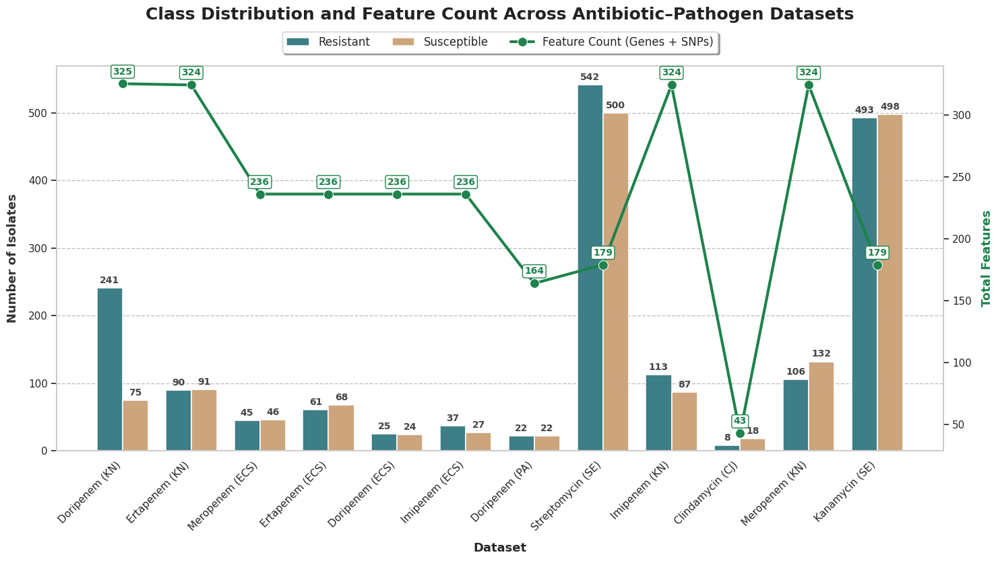

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np

# 1. Prepare the Data
data = {
    'Dataset': [
        'Doripenem (KN)', 'Ertapenem (KN)', 'Meropenem (ECS)', 'Ertapenem (ECS)',
        'Doripenem (ECS)', 'Imipenem (ECS)', 'Doripenem (PA)', 'Streptomycin (SE)',
        'Imipenem (KN)', 'Clindamycin (CJ)', 'Meropenem (KN)', 'Kanamycin (SE)'
    ],
    'Genes': [325, 324, 236, 236, 236, 236, 164, 179, 324, 43, 324, 179],
    'Resistant': [241, 90, 45, 61, 25, 37, 22, 542, 113, 8, 106, 493],
    'Susceptible': [75, 91, 46, 68, 24, 27, 22, 500, 87, 18, 132, 498]
}

df = pd.DataFrame(data)

# 2. Setup the Plot Style
sns.set_theme(style="whitegrid")
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial', 'DejaVu Sans']

# Create figure
fig, ax1 = plt.subplots(figsize=(15, 8.5)) # Increased height slightly for top legend

# 3. Plot Grouped Bar Chart
df_melted = df.melt(id_vars=['Dataset', 'Genes'],
                    value_vars=['Resistant', 'Susceptible'],
                    var_name='Status', value_name='Count')

# Modern Colors
palette = {"Resistant": "#26818e", "Susceptible": "#d8a068"}

sns.barplot(
    data=df_melted,
    x='Dataset',
    y='Count',
    hue='Status',
    ax=ax1,
    palette=palette,
    edgecolor="white",
    linewidth=1.2,
    alpha=0.95,
    width=0.75
)

# 4. Plot Line Chart
ax2 = ax1.twinx()
line_color = "#1e824c"

# Change label to "Feature Count" for scientific accuracy
sns.lineplot(
    data=df,
    x='Dataset',
    y='Genes',
    ax=ax2,
    color=line_color,
    marker='o',
    markersize=10,
    linewidth=3,
    label='Feature Count (Genes + SNPs)'
)

# 5. Formatting

# Axes Labels
ax1.set_ylabel('Number of Isolates', fontsize=13, fontweight='bold', color='#333333', labelpad=10)
ax2.set_ylabel('Total Features', fontsize=13, fontweight='bold', color=line_color, labelpad=10)
ax1.set_xlabel('Dataset', fontsize=13, fontweight='bold', labelpad=10)
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right', fontsize=11)

# Grid
ax1.grid(True, axis='y', linestyle='--', alpha=0.5, color='gray')
ax2.grid(False)

# 6. Annotations (Values)
# Bars
for container in ax1.containers:
    ax1.bar_label(container, padding=3, fontsize=10, fontweight='bold', color='#444444')

# Line Points
for i, txt in enumerate(df['Genes']):
    ax2.annotate(txt, (i, df['Genes'][i]),
                 xytext=(0, 10),
                 textcoords='offset points',
                 ha='center',
                 color=line_color,
                 fontweight='bold',
                 fontsize=10,
                 bbox=dict(boxstyle="round,pad=0.2", fc="white", ec=line_color, lw=1))

# 7. FIXED LEGEND (Placed above the chart)
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()

# Combine legends and place horizontally at the top
ax2.legend(lines + lines2, labels + labels2,
           loc='lower center',
           bbox_to_anchor=(0.5, 1.02), # Moves legend just above the graph
           ncol=3,
           frameon=True,
           fancybox=True,
           shadow=True,
           fontsize=12)

# Remove original legend
if ax1.get_legend():
    ax1.get_legend().remove()

# Title
plt.title('Class Distribution and Feature Count Across Antibiotic–Pathogen Datasets',
          fontsize=18, fontweight='bold', pad=50, color='#222222')

plt.tight_layout()
plt.show()

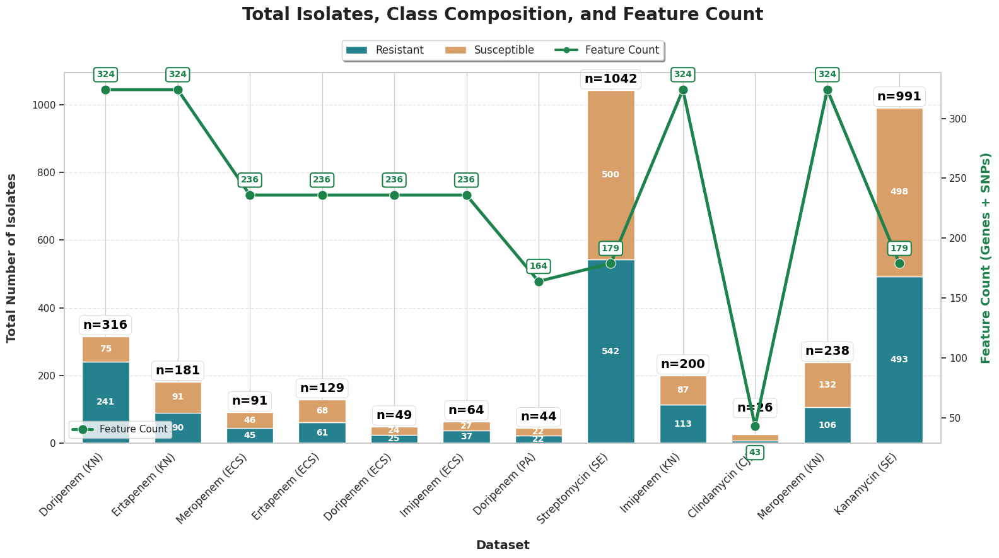

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

# 1. Prepare the Data
data = {
    'Dataset': [
        'Doripenem (KN)', 'Ertapenem (KN)', 'Meropenem (ECS)', 'Ertapenem (ECS)',
        'Doripenem (ECS)', 'Imipenem (ECS)', 'Doripenem (PA)', 'Streptomycin (SE)',
        'Imipenem (KN)', 'Clindamycin (CJ)', 'Meropenem (KN)', 'Kanamycin (SE)'
    ],
    'Genes': [324, 324, 236, 236, 236, 236, 164, 179, 324, 43, 324, 179],
    'Resistant': [241, 90, 45, 61, 25, 37, 22, 542, 113, 8, 106, 493],
    'Susceptible': [75, 91, 46, 68, 24, 27, 22, 500, 87, 18, 132, 498]
}

df = pd.DataFrame(data)
df['Total'] = df['Resistant'] + df['Susceptible']

# 2. Setup Plot Style
sns.set_theme(style="whitegrid")
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial', 'DejaVu Sans']

fig, ax1 = plt.subplots(figsize=(16, 9))

# 3. Plot Stacked Bars
colors = ["#26818e", "#d8a068"]
df[['Resistant', 'Susceptible']].plot(
    kind='bar',
    stacked=True,
    ax=ax1,
    color=colors,
    edgecolor='white',
    linewidth=1,
    width=0.65,
    legend=False
)

# 4. Plot Line Chart
ax2 = ax1.twinx()
line_color = "#1e824c"

sns.lineplot(
    data=df,
    x=df.index,
    y='Genes',
    ax=ax2,
    color=line_color,
    marker='o',
    markersize=11,
    linewidth=3.5,
    label='Feature Count'
)

# 5. Formatting Axes
ax1.set_ylabel('Total Number of Isolates', fontsize=14, fontweight='bold', color='#333333', labelpad=15)
ax2.set_ylabel('Feature Count (Genes + SNPs)', fontsize=14, fontweight='bold', color=line_color, labelpad=15)
ax1.set_xlabel('Dataset', fontsize=14, fontweight='bold', labelpad=15)

ax1.set_xticks(range(len(df)))
ax1.set_xticklabels(df['Dataset'], rotation=45, ha='right', fontsize=12)

# Grid
ax1.grid(True, axis='y', linestyle='--', alpha=0.5)
ax2.grid(False)

# 6. Annotations & Labels

# A. Label Total Count (n=...) with COLLISION FIX
for i, total in enumerate(df['Total']):
    # Default offset
    offset = 15

    # FIX: For Clindamycin, push the "n=26" label MUCH higher
    # so it floats above the green line point
    if df['Dataset'][i] == 'Clindamycin (CJ)':
        offset = 60

    # ax1.text(i, total + offset, f"n={total}", ha='center', va='bottom',
    #          fontsize=11, fontweight='bold', color='black')
    ax1.text(i, total + offset, f"n={total}", ha='center', va='bottom',
             fontsize=14, fontweight='bold', color='black',
             zorder=30,
             bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="#cccccc", lw=0.5))

# B. Label Individual Class Counts inside bars
for container in ax1.containers:
    labels = [f'{v.get_height():.0f}' if v.get_height() > 20 else '' for v in container]
    ax1.bar_label(container, labels=labels, label_type='center',
                  fontsize=10, fontweight='bold', color='white')

# C. Label Feature Counts
for i, txt in enumerate(df['Genes']):
    # Default position: Above the point
    xytext = (0, 12)
    va = 'bottom'

    # Keep the Clindamycin feature label (43) BELOW the point
    # to separate it from the lifted "n=26" label
    if df['Dataset'][i] == 'Clindamycin (CJ)':
        xytext = (0, -25)
        va = 'top'

    ax2.annotate(txt, (i, df['Genes'][i]),
                 xytext=xytext,
                 textcoords='offset points',
                 ha='center',
                 va=va,
                 color=line_color,
                 fontweight='bold',
                 fontsize=10,
                 bbox=dict(boxstyle="round,pad=0.3", fc="white", ec=line_color, lw=1.5))

# 7. Legend
legend_elements = [
    Patch(facecolor='#26818e', label='Resistant'),
    Patch(facecolor='#d8a068', label='Susceptible'),
    Line2D([0], [0], color=line_color, lw=3, marker='o', label='Feature Count')
]

ax1.legend(handles=legend_elements, loc='lower center',
           bbox_to_anchor=(0.5, 1.02), ncol=3,
           frameon=True, fancybox=True, shadow=True, fontsize=12)

# Title
plt.title('Total Isolates, Class Composition, and Feature Count',
          fontsize=20, fontweight='bold', pad=60, color='#222222')

plt.tight_layout()
plt.show()

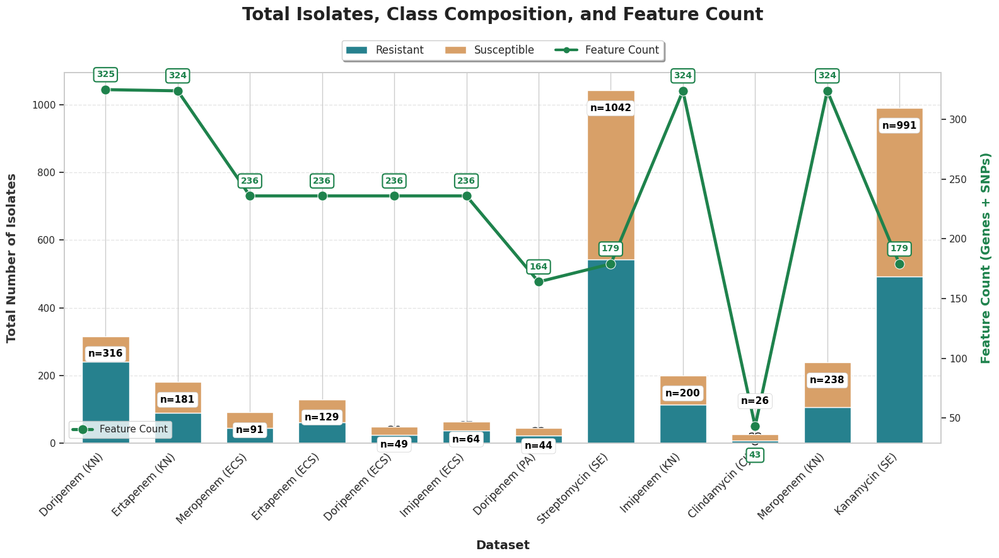

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
import matplotlib.patheffects as pe

# 1. Prepare the Data
data = {
    'Dataset': [
        'Doripenem (KN)', 'Ertapenem (KN)', 'Meropenem (ECS)', 'Ertapenem (ECS)',
        'Doripenem (ECS)', 'Imipenem (ECS)', 'Doripenem (PA)', 'Streptomycin (SE)',
        'Imipenem (KN)', 'Clindamycin (CJ)', 'Meropenem (KN)', 'Kanamycin (SE)'
    ],
    'Genes': [325, 324, 236, 236, 236, 236, 164, 179, 324, 43, 324, 179],
    'Resistant': [241, 90, 45, 61, 25, 37, 22, 542, 113, 8, 106, 493],
    'Susceptible': [75, 91, 46, 68, 24, 27, 22, 500, 87, 18, 132, 498]
}

df = pd.DataFrame(data)
df['Total'] = df['Resistant'] + df['Susceptible']

# 2. Setup Plot Style
sns.set_theme(style="whitegrid")
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial', 'DejaVu Sans']

fig, ax1 = plt.subplots(figsize=(16, 9))

# 3. Plot Stacked Bars (On Bottom Layer ax1)
colors = ["#26818e", "#d8a068"]
df[['Resistant', 'Susceptible']].plot(
    kind='bar',
    stacked=True,
    ax=ax1,
    color=colors,
    edgecolor='white',
    linewidth=1,
    width=0.65,
    legend=False,
    zorder=5
)

# 4. Plot Line Chart (On Top Layer ax2)
ax2 = ax1.twinx()
line_color = "#1e824c"

sns.lineplot(
    data=df,
    x=df.index,
    y='Genes',
    ax=ax2,
    color=line_color,
    marker='o',
    markersize=11,
    linewidth=3.5,
    label='Feature Count',
    zorder=10
)

# 5. Formatting Axes
ax1.set_ylabel('Total Number of Isolates', fontsize=14, fontweight='bold', color='#333333', labelpad=15)
ax2.set_ylabel('Feature Count (Genes + SNPs)', fontsize=14, fontweight='bold', color=line_color, labelpad=15)
ax1.set_xlabel('Dataset', fontsize=14, fontweight='bold', labelpad=15)

ax1.set_xticks(range(len(df)))
ax1.set_xticklabels(df['Dataset'], rotation=45, ha='right', fontsize=12)

ax1.grid(True, axis='y', linestyle='--', alpha=0.5)
ax2.grid(False)

# 6. ANNOTATIONS

# A. Internal Class Counts (Inside Bars - ax1)
for container in ax1.containers:
    labels = [f'{int(v.get_height())}' if v.get_height() > 0 else '' for v in container]
    bar_labels = ax1.bar_label(container, labels=labels, label_type='center',
                               fontsize=10, fontweight='bold', color='white')
    # Add black outline for readability
    for label in bar_labels:
        label.set_path_effects([pe.withStroke(linewidth=2, foreground='black')])


# B. Total Count Labels (n=...) - MOVED TO TOP LAYER (ax2)
# We must calculate the scaling factor to convert Bar Height (ax1) -> Line Height (ax2)
y1_min, y1_max = ax1.get_ylim()
y2_min, y2_max = ax2.get_ylim()
scale_factor = (y2_max - y2_min) / (y1_max - y1_min)

for i, total in enumerate(df['Total']):
    # Base offset in 'isolates' units
    base_offset = 35

    # Calculate visual height of the Green Point (in ax1 units)
    # The feature count is df['Genes'][i].
    # We convert it to isolate units to check for collision.
    feature_height_ax1 = df['Genes'][i] / scale_factor

    # Check if the "n=" label (at total) is colliding with the feature point
    # If the bar top is close to the feature point (within 100 units visually), push the label higher
    if abs(total - feature_height_ax1) < 150:
         # Push it nicely above the green point
         # We place it at the Green Point's height + extra buffer
         final_y_ax1 = feature_height_ax1 + 60
    else:
         final_y_ax1 = total + base_offset

    # CONVERT to ax2 coordinates so we can plot on the top layer
    # y_ax2 = y_ax1 * scale_factor
    final_y_ax2 = final_y_ax1 * scale_factor

    # Plot text on AX2 (Top Layer)
    ax2.text(i, final_y_ax2, f"n={total}", ha='center', va='bottom',
             fontsize=11, fontweight='bold', color='black',
             zorder=99, # Guaranteed to be on top of everything
             bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="#cccccc", lw=0.5))

# C. Feature Count Labels (ax2)
for i, txt in enumerate(df['Genes']):
    xytext = (0, 12)
    va = 'bottom'

    # Standard check: if point is too close to the "n=" label we just placed, move label down
    # (The n= label is roughly at feature_height + buffer, so we look below)

    # Specifically for Clindamycin, we know the "n=" is floating above.
    # So we force the "43" label below.
    if df['Dataset'][i] == 'Clindamycin (CJ)':
        xytext = (0, -28)
        va = 'top'

    ax2.annotate(txt, (i, df['Genes'][i]),
                 xytext=xytext,
                 textcoords='offset points',
                 ha='center',
                 va=va,
                 color=line_color,
                 fontweight='bold',
                 fontsize=10,
                 zorder=30,
                 bbox=dict(boxstyle="round,pad=0.3", fc="white", ec=line_color, lw=1.5))

# 7. Legend
legend_elements = [
    Patch(facecolor='#26818e', label='Resistant'),
    Patch(facecolor='#d8a068', label='Susceptible'),
    Line2D([0], [0], color=line_color, lw=3, marker='o', label='Feature Count')
]

ax1.legend(handles=legend_elements, loc='lower center',
           bbox_to_anchor=(0.5, 1.02), ncol=3,
           frameon=True, fancybox=True, shadow=True, fontsize=12)

# Title
plt.title('Total Isolates, Class Composition, and Feature Count',
          fontsize=20, fontweight='bold', pad=60, color='#222222')

plt.tight_layout()
plt.show()

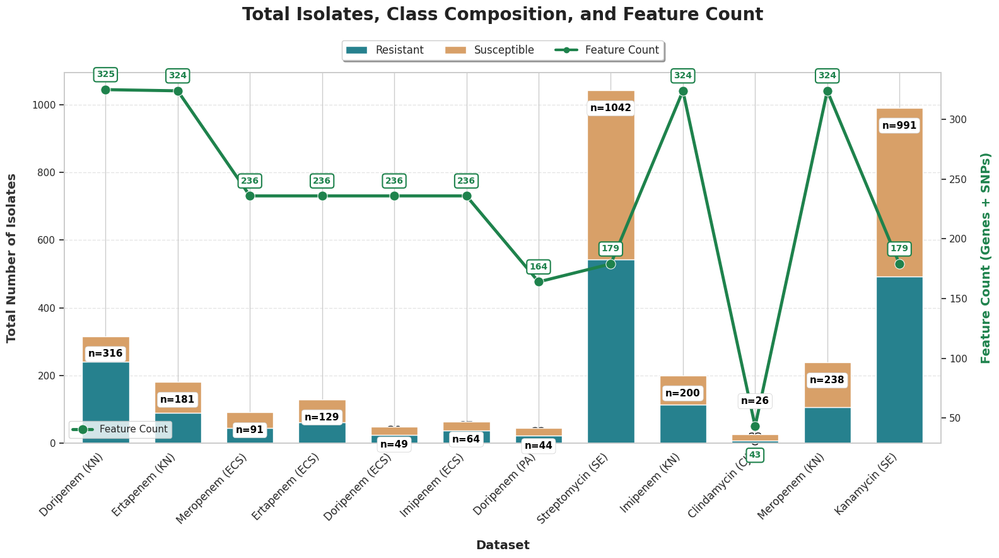

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
import matplotlib.patheffects as pe # Import for text outlines

# 1. Prepare the Data
data = {
    'Dataset': [
        'Doripenem (KN)', 'Ertapenem (KN)', 'Meropenem (ECS)', 'Ertapenem (ECS)',
        'Doripenem (ECS)', 'Imipenem (ECS)', 'Doripenem (PA)', 'Streptomycin (SE)',
        'Imipenem (KN)', 'Clindamycin (CJ)', 'Meropenem (KN)', 'Kanamycin (SE)'
    ],
    'Genes': [325, 324, 236, 236, 236, 236, 164, 179, 324, 43, 324, 179],
    'Resistant': [241, 90, 45, 61, 25, 37, 22, 542, 113, 8, 106, 493],
    'Susceptible': [75, 91, 46, 68, 24, 27, 22, 500, 87, 18, 132, 498]
}

df = pd.DataFrame(data)
df['Total'] = df['Resistant'] + df['Susceptible']

# 2. Setup Plot Style
sns.set_theme(style="whitegrid")
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial', 'DejaVu Sans']

fig, ax1 = plt.subplots(figsize=(16, 9))

# 3. Plot Stacked Bars (Bottom Layer)
colors = ["#26818e", "#d8a068"]
df[['Resistant', 'Susceptible']].plot(
    kind='bar',
    stacked=True,
    ax=ax1,
    color=colors,
    edgecolor='white',
    linewidth=1,
    width=0.65,
    legend=False,
    zorder=5
)

# 4. Plot Line Chart (Top Layer)
ax2 = ax1.twinx()
line_color = "#1e824c"

sns.lineplot(
    data=df,
    x=df.index,
    y='Genes',
    ax=ax2,
    color=line_color,
    marker='o',
    markersize=11,
    linewidth=3.5,
    label='Feature Count',
    zorder=10
)

# 5. Formatting Axes
ax1.set_ylabel('Total Number of Isolates', fontsize=14, fontweight='bold', color='#333333', labelpad=15)
ax2.set_ylabel('Feature Count (Genes + SNPs)', fontsize=14, fontweight='bold', color=line_color, labelpad=15)
ax1.set_xlabel('Dataset', fontsize=14, fontweight='bold', labelpad=15)

ax1.set_xticks(range(len(df)))
ax1.set_xticklabels(df['Dataset'], rotation=45, ha='right', fontsize=12)

# Grid
ax1.grid(True, axis='y', linestyle='--', alpha=0.5)
ax2.grid(False)

# 6. Annotations & Labels

# A. Label Total Count (n=...) MOVED TO TOP LAYER (AX2)
# We calculate the scaling factor to convert Bar Height (ax1) -> Line Height (ax2)
y1_min, y1_max = ax1.get_ylim()
y2_min, y2_max = ax2.get_ylim()
scale_factor = (y2_max - y2_min) / (y1_max - y1_min)

for i, total in enumerate(df['Total']):
    base_offset = 35

    # Calculate visual height of the Green Point (in ax1 units) for collision detection
    feature_height_ax1 = df['Genes'][i] / scale_factor

    # Check for collision: If the "n=" label is too close to the feature point
    if abs(total - feature_height_ax1) < 150:
         # Push it nicely above the green point
         final_y_ax1 = feature_height_ax1 + 60
    else:
         final_y_ax1 = total + base_offset

    # CONVERT to ax2 coordinates so we can plot on the top layer
    final_y_ax2 = final_y_ax1 * scale_factor

    # Plot text on AX2 (Top Layer) so it sits ON TOP of the green line
    ax2.text(i, final_y_ax2, f"n={total}", ha='center', va='bottom',
             fontsize=11, fontweight='bold', color='black',
             zorder=99,
             bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="#cccccc", lw=0.5))

# B. Label Individual Class Counts inside bars (WITH OUTLINES)
for container in ax1.containers:
    # Label everything > 0
    labels = [f'{int(v.get_height())}' if v.get_height() > 0 else '' for v in container]
    bar_labels = ax1.bar_label(container, labels=labels, label_type='center',
                  fontsize=10, fontweight='bold', color='white')

    # Add black outline for readability on all backgrounds
    for label in bar_labels:
        label.set_path_effects([pe.withStroke(linewidth=2, foreground='black')])

# C. Label Feature Counts
for i, txt in enumerate(df['Genes']):
    # Default position: Above the point
    xytext = (0, 12)
    va = 'bottom'

    # For Clindamycin, we know the "n=" label is floating above.
    # So we force the "43" label BELOW the point to avoid crowding.
    if df['Dataset'][i] == 'Clindamycin (CJ)':
        xytext = (0, -28)
        va = 'top'

    ax2.annotate(txt, (i, df['Genes'][i]),
                 xytext=xytext,
                 textcoords='offset points',
                 ha='center',
                 va=va,
                 color=line_color,
                 fontweight='bold',
                 fontsize=10,
                 zorder=30,
                 bbox=dict(boxstyle="round,pad=0.3", fc="white", ec=line_color, lw=1.5))

# 7. Legend
legend_elements = [
    Patch(facecolor='#26818e', label='Resistant'),
    Patch(facecolor='#d8a068', label='Susceptible'),
    Line2D([0], [0], color=line_color, lw=3, marker='o', label='Feature Count')
]

ax1.legend(handles=legend_elements, loc='lower center',
           bbox_to_anchor=(0.5, 1.02), ncol=3,
           frameon=True, fancybox=True, shadow=True, fontsize=12)

# Title
plt.title('Total Isolates, Class Composition, and Feature Count',
          fontsize=20, fontweight='bold', pad=60, color='#222222')

plt.tight_layout()
plt.show()

================================================================================
# ADDING STANDARD DEVIATIONS TO THESIS TABLES
The reviewer's comment has two aspects:
(a) Per-fold CV standard deviations — how much does performance vary across
cross-validation folds within each dataset?
(b) Cross-dataset standard deviations — how much does performance vary across
the 12 datasets?
Both should be reported. Below is the code to generate each, followed by the
updated table formats for each major thesis table.


================================================================================
## PART 1: MODIFIED CODE — Capture Per-Fold Standard Deviations
Your current safe_cv_score function discards the individual fold scores:

In [ ]:
def safe_cv_score(X_data, y_data, n_splits, random_state):
    """
    Perform cross-validation with SMOTETomek inside each fold.
    Returns (mean_f1, std_f1, per_fold_scores) instead of just the mean.
    """
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=random_state)
    f1_scorer = make_scorer(f1_score, zero_division=0)

    min_class_size = y_data.value_counts().min()

    if min_class_size < 2:
        pipe = rblend_est()
    elif min_class_size <= 5:
        k_neighbors = max(1, min_class_size - 1)
        from imblearn.over_sampling import SMOTE
        pipe = Pipeline([
            ("smt", SMOTETomek(random_state=random_state,
                              smote=SMOTE(random_state=random_state, k_neighbors=k_neighbors))),
            ("clf", rblend_est())
        ])
    else:
        pipe = Pipeline([
            ("smt", SMOTETomek(random_state=random_state)),
            ("clf", rblend_est())
        ])

    try:
        cv_scores = cross_val_score(pipe, X_data, y_data, cv=skf, scoring=f1_scorer, n_jobs=-1)
        return np.mean(cv_scores), np.std(cv_scores), cv_scores.tolist()
    except Exception as e:
        print(f"    Warning: CV failed for {n_splits}-fold: {e}")
        return np.nan, np.nan, []

In [ ]:
return {
        "Dataset": ds_name,
        "Accuracy": acc,
        "Precision": prec,
        "Recall": rec,
        "F1": f1,
        "AUROC": auroc,
        "AUPRC": auprc,
        # CV means
        "5-fold CV F1": cv5_mean,
        "6-fold CV F1": cv6_mean,
        "10-fold CV F1": cv10_mean,
        # CV standard deviations (NEW)
        "5-fold CV Std": cv5_std,
        "6-fold CV Std": cv6_std,
        "10-fold CV Std": cv10_std,
        # Per-fold scores for detailed analysis (NEW)
        "5-fold Scores": cv5_folds,
        "6-fold Scores": cv6_folds,
        "10-fold Scores": cv10_folds,
        # Existing fields
        "resample": resample_note,
        "Num_Features": len(feats_use),
        "ANOVA_Features": len(anova_set),
        "XGB_Features": len(model_set),
    }

SyntaxError: 'return' outside function (1695623484.py, line 1)

================================================================================
## PART 2: EXTENDED CV — Multiple Metrics with Std
The above only captures F1 std. For a complete solution capturing std for ALL
metrics (Accuracy, Precision, Recall, F1, AUROC), add this function:

In [ ]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

def full_cv_with_std(X_data, y_data, n_splits=5, random_state=42):
    """
    Run stratified CV with full pipeline inside each fold.
    Returns dict of metric_name -> (mean, std, per_fold_list).
    """
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=random_state)
    min_class_size = y_data.value_counts().min()

    fold_metrics = {m: [] for m in ['Accuracy', 'Precision', 'Recall', 'F1', 'AUROC']}

    for fold_idx, (train_idx, val_idx) in enumerate(skf.split(X_data, y_data)):
        X_fold_tr, X_fold_val = X_data.iloc[train_idx], X_data.iloc[val_idx]
        y_fold_tr, y_fold_val = y_data.iloc[train_idx], y_data.iloc[val_idx]

        # Apply SMOTETomek inside fold
        if y_fold_tr.value_counts().min() >= 2:
            try:
                if min_class_size <= 5:
                    k = max(1, y_fold_tr.value_counts().min() - 1)
                    from imblearn.over_sampling import SMOTE
                    smt = SMOTETomek(random_state=random_state,
                                     smote=SMOTE(random_state=random_state, k_neighbors=k))
                else:
                    smt = SMOTETomek(random_state=random_state)
                X_res, y_res = smt.fit_resample(X_fold_tr, y_fold_tr)
            except Exception:
                X_res, y_res = X_fold_tr, y_fold_tr
        else:
            X_res, y_res = X_fold_tr, y_fold_tr

        # Train and predict
        model = rblend_est()
        model.fit(X_res, y_res)
        y_pred = model.predict(X_fold_val)

        fold_metrics['Accuracy'].append(accuracy_score(y_fold_val, y_pred))
        fold_metrics['Precision'].append(precision_score(y_fold_val, y_pred, zero_division=0))
        fold_metrics['Recall'].append(recall_score(y_fold_val, y_pred, zero_division=0))
        fold_metrics['F1'].append(f1_score(y_fold_val, y_pred, zero_division=0))

        try:
            scores = model.predict_proba(X_fold_val)[:, 1]
            fold_metrics['AUROC'].append(roc_auc_score(y_fold_val, scores))
        except Exception:
            fold_metrics['AUROC'].append(np.nan)

    results = {}
    for metric, values in fold_metrics.items():
        arr = np.array(values)
        results[metric] = {
            'mean': np.nanmean(arr),
            'std': np.nanstd(arr),
            'folds': values
        }

    return results

In [ ]:
# For each dataset, after existing pipeline:
cv_results = full_cv_with_std(X_tr_sel, y_tr, n_splits=5, random_state=RANDOM_STATE)

for metric, vals in cv_results.items():
    print(f"  {metric}: {vals['mean']:.3f} +/- {vals['std']:.3f}")

NameError: name 'X_tr_sel' is not defined

## PART 3: CROSS-DATASET STD (from existing data — NO rerun needed)
You can compute cross-dataset variability RIGHT NOW from the data already in
your thesis tables, without rerunning anything. This shows how much performance
varies across the 12 antibiotic-pathogen combinations.

In [ ]:
import numpy as np

# Data from Table 5.1 (R-Blend Performance Across All Datasets)
table_5_1 = {
    'Dataset': [
        'Doripenem (KN)', 'Ertapenem (KN)', 'Meropenem (ECS)', 'Ertapenem (ECS)',
        'Doripenem (ECS)', 'Imipenem (ECS)', 'Doripenem (PA)', 'Streptomycin (SE)',
        'Imipenem (KN)', 'Clindamycin (CJ)', 'Meropenem (KN)', 'Kanamycin (SE)'
    ],
    'Accuracy':  [0.953, 0.946, 0.947, 0.962, 0.900, 1.000, 1.000, 0.928, 0.925, 1.000, 0.938, 0.950],
    'Precision': [0.960, 0.944, 0.900, 1.000, 1.000, 1.000, 1.000, 0.892, 0.885, 1.000, 0.875, 0.989],
    'Recall':    [0.980, 0.944, 1.000, 0.917, 0.800, 1.000, 1.000, 0.982, 1.000, 1.000, 1.000, 0.909],
    'F1':        [0.970, 0.944, 0.947, 0.957, 0.889, 1.000, 1.000, 0.934, 0.939, 1.000, 0.933, 0.947],
    'AUROC':     [0.933, 0.977, 1.000, 0.970, 0.840, 1.000, 1.000, 0.940, 0.959, 1.000, 0.959, 0.964],
    'AUPRC':     [0.961, 0.981, 1.000, 0.975, 0.911, 1.000, 1.000, 0.916, 0.970, 1.000, 0.937, 0.977],
}

print("=" * 70)
print("TABLE 5.1 — Average +/- Std (cross-dataset variability)")
print("=" * 70)
for metric in ['Accuracy', 'Precision', 'Recall', 'F1', 'AUROC', 'AUPRC']:
    vals = np.array(table_5_1[metric])
    print(f"  {metric:12s}: {vals.mean():.3f} +/- {vals.std():.3f}")


# Data from Table 5.2 (CV F1 Scores) — excluding CJ which has no CV
cv_data = {
    'Dataset': [
        'Doripenem (KN)', 'Ertapenem (KN)', 'Meropenem (ECS)', 'Ertapenem (ECS)',
        'Doripenem (ECS)', 'Imipenem (ECS)', 'Doripenem (PA)', 'Streptomycin (SE)',
        'Imipenem (KN)', 'Meropenem (KN)', 'Kanamycin (SE)'
    ],
    '5-fold':  [0.941, 0.861, 0.926, 0.903, 0.854, 0.817, 0.978, 0.944, 0.911, 0.879, 0.971],
    '6-fold':  [0.929, 0.837, 0.929, 0.899, 0.817, 0.816, 0.976, 0.945, 0.878, 0.923, 0.967],
    '10-fold': [0.935, 0.900, 0.926, 0.899, 0.827, 0.866, 0.967, 0.943, 0.887, 0.932, 0.972],
}

print("\n" + "=" * 70)
print("TABLE 5.2 — CV F1 Average +/- Std (cross-dataset variability)")
print("=" * 70)
for fold_k in ['5-fold', '6-fold', '10-fold']:
    vals = np.array(cv_data[fold_k])
    print(f"  {fold_k:8s} CV F1: {vals.mean():.3f} +/- {vals.std():.3f}")


# Data from Table 5.4 (R-Score Ablation)
ablation_f1_base    = [0.980, 0.882, 0.947, 0.909, 0.800, 1.000, 1.000, 0.922, 0.917, 1.000, 0.930, 0.958]
ablation_f1_rscore  = [0.960, 0.889, 0.947, 0.957, 0.889, 1.000, 1.000, 0.926, 0.917, 1.000, 0.909, 0.947]
ablation_rec_base   = [1.000, 0.833, 1.000, 0.833, 0.800, 1.000, 1.000, 0.926, 0.957, 1.000, 0.952, 0.919]
ablation_rec_rscore = [0.980, 0.889, 1.000, 0.917, 0.800, 1.000, 1.000, 0.982, 0.957, 1.000, 0.952, 0.909]

print("\n" + "=" * 70)
print("TABLE 5.4 — R-Score Ablation Average +/- Std (cross-dataset)")
print("=" * 70)
for name, vals in [("F1 (Baseline)", ablation_f1_base), ("F1 (R-Score)", ablation_f1_rscore),
                   ("Recall (Baseline)", ablation_rec_base), ("Recall (R-Score)", ablation_rec_rscore)]:
    arr = np.array(vals)
    print(f"  {name:20s}: {arr.mean():.3f} +/- {arr.std():.3f}")


# Data from Table 5.5 (Balancing Strategies)
strategies = {
    'Baseline (no R-Score)':     {'Acc': 0.937, 'F1': 0.938, 'Prec': 0.939, 'Rec': 0.940, 'AUROC': 0.969},
    'R-Score only':              {'Acc': 0.947, 'F1': 0.948, 'Prec': 0.949, 'Rec': 0.952, 'AUROC': 0.964},
    'R-Score + SMOTE':           {'Acc': 0.950, 'F1': 0.951, 'Prec': 0.950, 'Rec': 0.956, 'AUROC': 0.964},
    'R-Score + RandomOver':      {'Acc': 0.945, 'F1': 0.946, 'Prec': 0.948, 'Rec': 0.949, 'AUROC': 0.964},
    'R-Score + RandomUnder':     {'Acc': 0.942, 'F1': 0.944, 'Prec': 0.949, 'Rec': 0.942, 'AUROC': 0.964},
    'R-Score + BorderlineSMOTE': {'Acc': 0.949, 'F1': 0.949, 'Prec': 0.950, 'Rec': 0.952, 'AUROC': 0.961},
    'R-Score + SMOTE-ENN':       {'Acc': 0.838, 'F1': 0.778, 'Prec': 0.862, 'Rec': 0.747, 'AUROC': 0.955},
    'R-Score + SMOTETomek':      {'Acc': 0.950, 'F1': 0.951, 'Prec': 0.951, 'Rec': 0.956, 'AUROC': 0.962},
}

# Note: Table 5.5 shows averages across datasets.
# The cross-dataset std for each strategy requires per-dataset values.
# These are available in your saved CSV from cell 27.
# See Part 4 below for the code to extract them.

print("\n" + "=" * 70)
print("TABLE 5.5 — NOTE: Per-strategy std requires per-dataset breakdown")
print("(available in your saved CSV from the balancing strategy experiment)")
print("=" * 70)

TABLE 5.1 — Average +/- Std (cross-dataset variability)
  Accuracy    : 0.954 +/- 0.031
  Precision   : 0.954 +/- 0.050
  Recall      : 0.961 +/- 0.058
  F1          : 0.955 +/- 0.032
  AUROC       : 0.962 +/- 0.043
  AUPRC       : 0.969 +/- 0.031

TABLE 5.2 — CV F1 Average +/- Std (cross-dataset variability)
  5-fold   CV F1: 0.908 +/- 0.048
  6-fold   CV F1: 0.901 +/- 0.055
  10-fold  CV F1: 0.914 +/- 0.042

TABLE 5.4 — R-Score Ablation Average +/- Std (cross-dataset)
  F1 (Baseline)       : 0.937 +/- 0.056
  F1 (R-Score)        : 0.945 +/- 0.039
  Recall (Baseline)   : 0.935 +/- 0.071
  Recall (R-Score)    : 0.949 +/- 0.058

TABLE 5.5 — NOTE: Per-strategy std requires per-dataset breakdown
(available in your saved CSV from the balancing strategy experiment)


================================================================================
## PART 4: CODE TO EXTRACT PER-DATASET STD FOR TABLE 5.5
Your cell 27 saves per-dataset results for each balancing strategy. Load that
CSV and compute std:

In [ ]:
import pandas as pd
import numpy as np

# Load the saved balancing strategy results
# (adjust path to match your actual output)
bal_df = pd.read_csv("/content/drive/MyDrive/Research Work/AMR Automation/Output/balancing_comparison.csv")

# Group by strategy and compute mean +/- std across datasets
summary = bal_df.groupby('Balancing Method').agg(
    Acc_mean=('Accuracy', 'mean'), Acc_std=('Accuracy', 'std'),
    F1_mean=('F1', 'mean'), F1_std=('F1', 'std'),
    Prec_mean=('Precision', 'mean'), Prec_std=('Precision', 'std'),
    Rec_mean=('Recall', 'mean'), Rec_std=('Recall', 'std'),
    AUROC_mean=('AUROC', 'mean'), AUROC_std=('AUROC', 'std'),
).round(3)

print(summary)

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/Research Work/AMR Automation/Output/balancing_comparison.csv'

## PART 5: UPDATED TABLE FORMATS FOR THE THESIS
Below are the exact LaTeX-ready updated table formats. Replace the originals.
--- TABLE 5.1 (Updated with cross-dataset std in Average row) ---
The individual dataset rows stay as-is (single hold-out values). The Average
row gets +/- std to show cross-dataset variability:

## PART 6: QUICK CROSS-DATASET STD COMPUTATION (run immediately)
Paste this into a Colab cell right now — no rerun needed:

In [ ]:
import numpy as np

# ===== TABLE 5.1 cross-dataset std =====
f1_scores = [0.970, 0.944, 0.947, 0.957, 0.889, 1.000, 1.000, 0.934, 0.939, 1.000, 0.933, 0.947]
acc_scores = [0.953, 0.946, 0.947, 0.962, 0.900, 1.000, 1.000, 0.928, 0.925, 1.000, 0.938, 0.950]
prec_scores = [0.960, 0.944, 0.900, 1.000, 1.000, 1.000, 1.000, 0.892, 0.885, 1.000, 0.875, 0.989]
rec_scores = [0.980, 0.944, 1.000, 0.917, 0.800, 1.000, 1.000, 0.982, 1.000, 1.000, 1.000, 0.909]
auroc_scores = [0.933, 0.977, 1.000, 0.970, 0.840, 1.000, 1.000, 0.940, 0.959, 1.000, 0.959, 0.964]
auprc_scores = [0.961, 0.981, 1.000, 0.975, 0.911, 1.000, 1.000, 0.916, 0.970, 1.000, 0.937, 0.977]

print("TABLE 5.1 — Average row (for LaTeX):")
for name, arr in [("Accuracy", acc_scores), ("Precision", prec_scores),
                  ("Recall", rec_scores), ("F1", f1_scores),
                  ("AUROC", auroc_scores), ("AUPRC", auprc_scores)]:
    a = np.array(arr)
    print(f"  {name}: {a.mean():.3f} ± {a.std():.3f}")

# ===== TABLE 5.2 cross-dataset CV std =====
cv5  = [0.941, 0.861, 0.926, 0.903, 0.854, 0.817, 0.978, 0.944, 0.911, 0.879, 0.971]
cv6  = [0.929, 0.837, 0.929, 0.899, 0.817, 0.816, 0.976, 0.945, 0.878, 0.923, 0.967]
cv10 = [0.935, 0.900, 0.926, 0.899, 0.827, 0.866, 0.967, 0.943, 0.887, 0.932, 0.972]

print("\nTABLE 5.2 — Average row:")
for name, arr in [("5-fold", cv5), ("6-fold", cv6), ("10-fold", cv10)]:
    a = np.array(arr)
    print(f"  {name} CV F1: {a.mean():.3f} ± {a.std():.3f}")

# ===== TABLE 5.4 cross-dataset ablation std =====
f1_base = [0.980, 0.882, 0.947, 0.909, 0.800, 1.000, 1.000, 0.922, 0.917, 1.000, 0.930, 0.958]
f1_rs   = [0.960, 0.889, 0.947, 0.957, 0.889, 1.000, 1.000, 0.926, 0.917, 1.000, 0.909, 0.947]
rec_base = [1.000, 0.833, 1.000, 0.833, 0.800, 1.000, 1.000, 0.926, 0.957, 1.000, 0.952, 0.919]
rec_rs   = [0.980, 0.889, 1.000, 0.917, 0.800, 1.000, 1.000, 0.982, 0.957, 1.000, 0.952, 0.909]

print("\nTABLE 5.4 — R-Score Ablation:")
for name, arr in [("F1 Baseline", f1_base), ("F1 R-Score", f1_rs),
                  ("Recall Baseline", rec_base), ("Recall R-Score", rec_rs)]:
    a = np.array(arr)
    print(f"  {name}: {a.mean():.3f} ± {a.std():.3f}")

# ===== TABLE 5.11 R-Blend on Noman (cross-antibiotic std) =====
rblend_f1 = [99.7, 99.1, 96.6, 98.8, 89.5, 99.8, 98.8, 92.3, 91.6, 84.7, 90.9, 98.8]
rblend_sens = [99.7, 98.6, 94.5, 98.6, 99.3, 100.0, 98.8, 85.7, 92.1, 79.5, 83.3, 99.0]
rblend_acc = [99.3, 98.3, 96.6, 97.6, 99.0, 99.7, 97.6, 99.7, 97.6, 87.8, 99.7, 98.3]

print("\nTABLE 5.11 — R-Blend on Noman et al. (Average row):")
for name, arr in [("Accuracy%", rblend_acc), ("F1%", rblend_f1), ("Sensitivity%", rblend_sens)]:
    a = np.array(arr)
    print(f"  {name}: {a.mean():.1f} ± {a.std():.1f}")

TABLE 5.1 — Average row (for LaTeX):
  Accuracy: 0.954 ± 0.031
  Precision: 0.954 ± 0.050
  Recall: 0.961 ± 0.058
  F1: 0.955 ± 0.032
  AUROC: 0.962 ± 0.043
  AUPRC: 0.969 ± 0.031

TABLE 5.2 — Average row:
  5-fold CV F1: 0.908 ± 0.048
  6-fold CV F1: 0.901 ± 0.055
  10-fold CV F1: 0.914 ± 0.042

TABLE 5.4 — R-Score Ablation:
  F1 Baseline: 0.937 ± 0.056
  F1 R-Score: 0.945 ± 0.039
  Recall Baseline: 0.935 ± 0.071
  Recall R-Score: 0.949 ± 0.058

TABLE 5.11 — R-Blend on Noman et al. (Average row):
  Accuracy%: 97.6 ± 3.1
  F1%: 95.0 ± 4.8
  Sensitivity%: 94.1 ± 7.0


# Visualization code

Generating Figure 1: Overall performance...


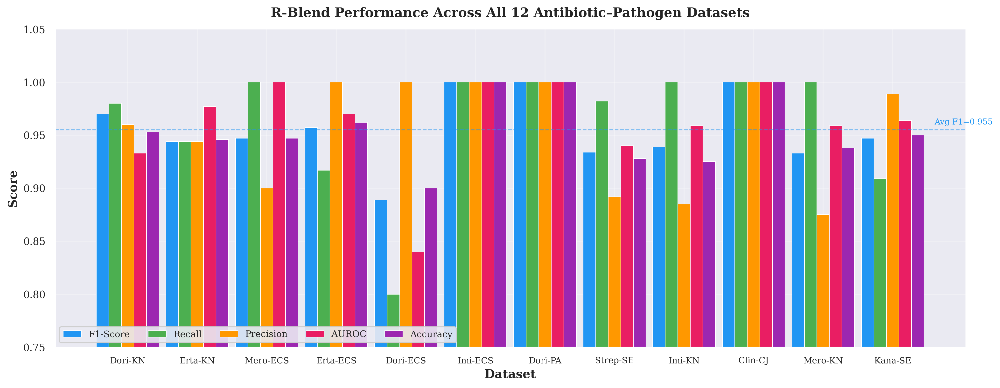

Generating Figure 2: CV stability...


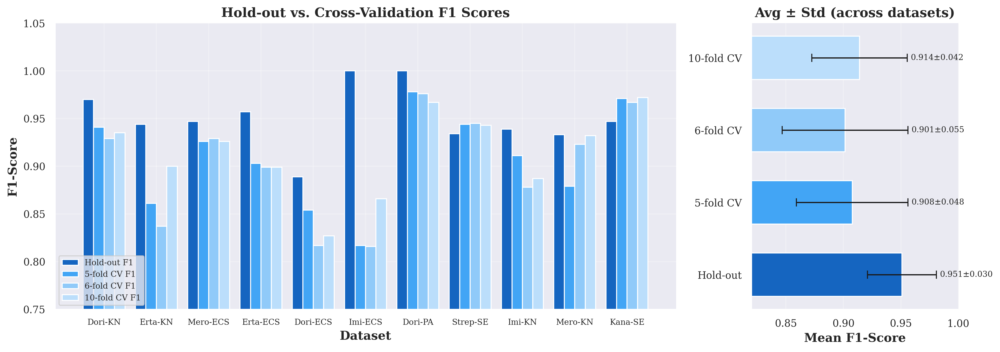

Generating Figure 3: R-Score ablation...


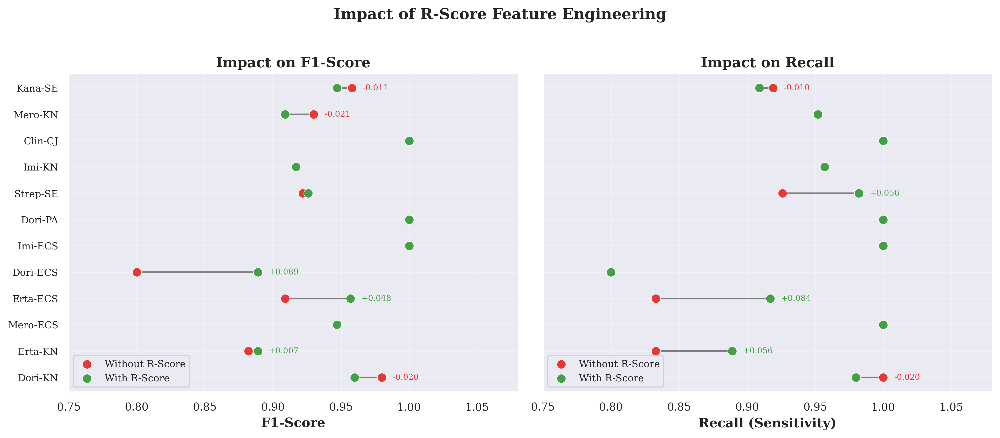

Generating Figure 4: Balancing strategies...


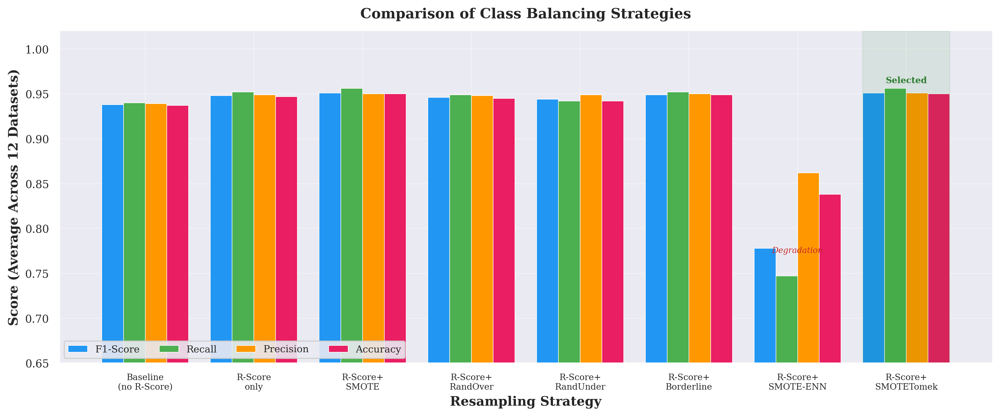

Generating Figure 5: R-Blend vs Sunuwar...


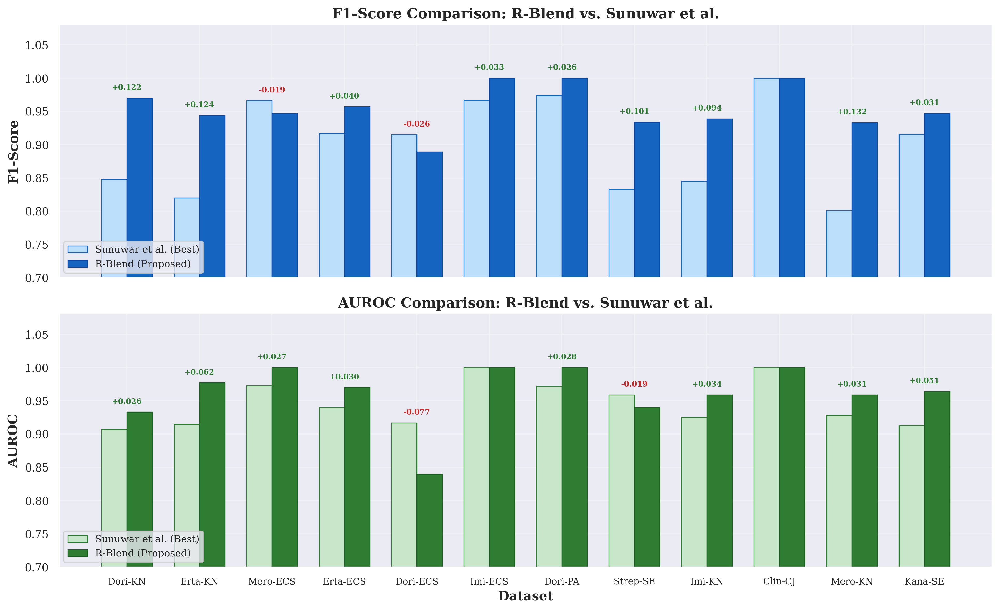

Generating Figure 6: R-Blend vs BioWeka...


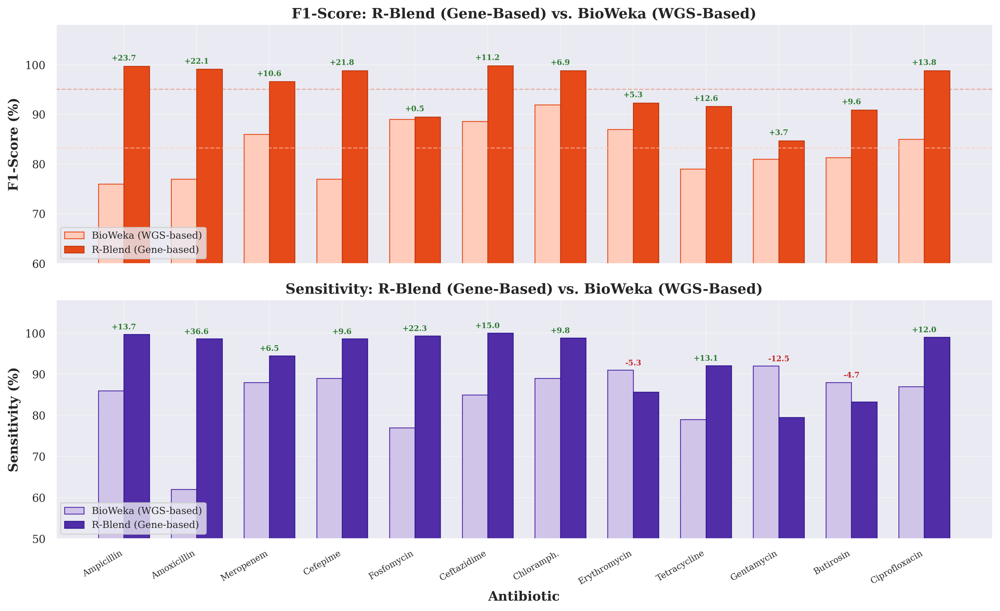

Generating Figure 7: Confusion matrices for all 12 datasets...


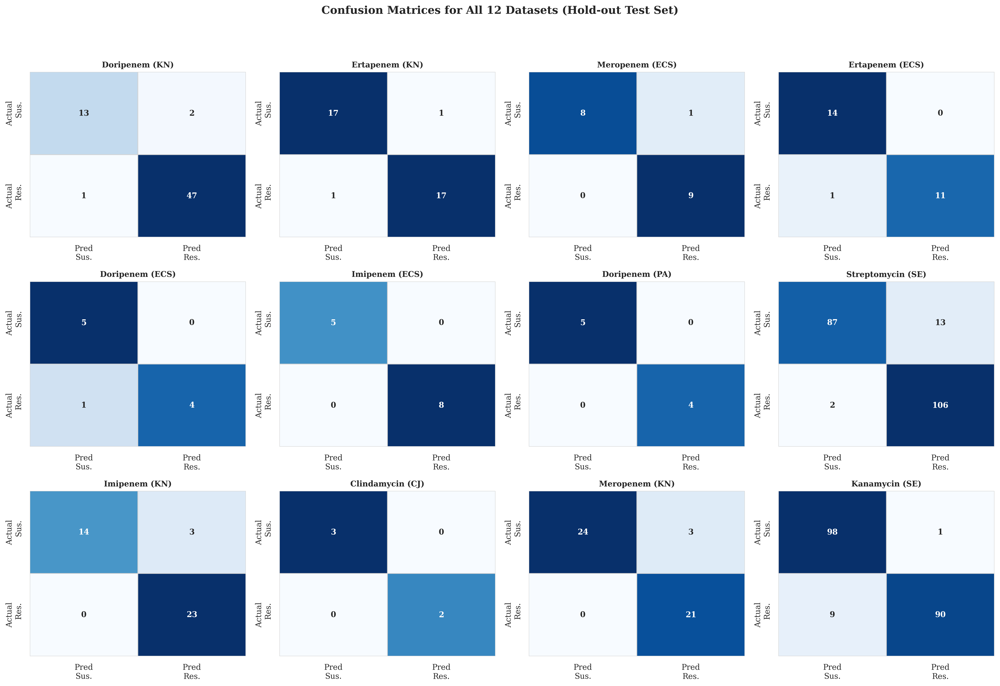

Generating Figure 8: Component ablation...


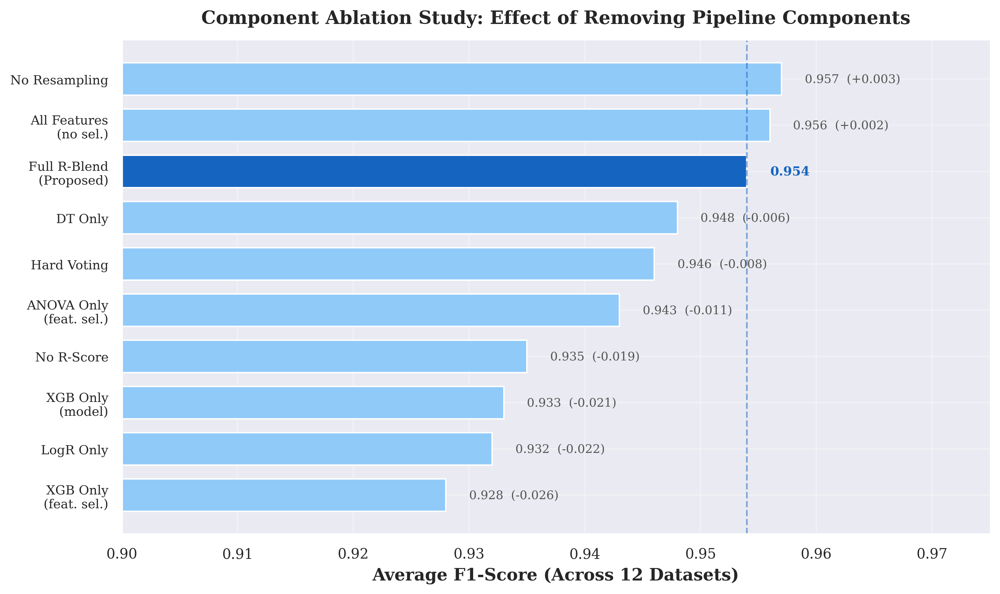


All 8 figures saved to: /mnt/user-data/outputs/ch5_figures/
  fig1_overall_performance.png
  fig2_cv_stability.png
  fig3_rscore_ablation.png
  fig4_balancing_strategies.png
  fig5_rblend_vs_sunuwar.png
  fig6_rblend_vs_bioweka.png
  fig7_confusion_matrices_all_12.png
  fig8_component_ablation.png


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
import pandas as pd
import seaborn as sns
import os

# ---- Global Style ----
plt.rcParams.update({
    'font.family': 'serif',
    'font.size': 11,
    'axes.titlesize': 13,
    'axes.labelsize': 12,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 9,
    'figure.dpi': 300,
    'savefig.dpi': 300,
    'savefig.bbox': 'tight',
    'axes.grid': True,
    'grid.alpha': 0.3,
    'axes.spines.top': False,
    'axes.spines.right': False,
})

OUT_DIR = "/mnt/user-data/outputs/ch5_figures"
os.makedirs(OUT_DIR, exist_ok=True)

# ================================================================
# DATA (from thesis tables)
# ================================================================

datasets_12 = [
    'Doripenem\n(KN)', 'Ertapenem\n(KN)', 'Meropenem\n(ECS)', 'Ertapenem\n(ECS)',
    'Doripenem\n(ECS)', 'Imipenem\n(ECS)', 'Doripenem\n(PA)', 'Streptomycin\n(SE)',
    'Imipenem\n(KN)', 'Clindamycin\n(CJ)', 'Meropenem\n(KN)', 'Kanamycin\n(SE)'
]

datasets_12_short = [
    'Dori-KN', 'Erta-KN', 'Mero-ECS', 'Erta-ECS',
    'Dori-ECS', 'Imi-ECS', 'Dori-PA', 'Strep-SE',
    'Imi-KN', 'Clin-CJ', 'Mero-KN', 'Kana-SE'
]

# Table 5.1
t51_acc   = [0.953, 0.946, 0.947, 0.962, 0.900, 1.000, 1.000, 0.928, 0.925, 1.000, 0.938, 0.950]
t51_prec  = [0.960, 0.944, 0.900, 1.000, 1.000, 1.000, 1.000, 0.892, 0.885, 1.000, 0.875, 0.989]
t51_rec   = [0.980, 0.944, 1.000, 0.917, 0.800, 1.000, 1.000, 0.982, 1.000, 1.000, 1.000, 0.909]
t51_f1    = [0.970, 0.944, 0.947, 0.957, 0.889, 1.000, 1.000, 0.934, 0.939, 1.000, 0.933, 0.947]
t51_auroc = [0.933, 0.977, 1.000, 0.970, 0.840, 1.000, 1.000, 0.940, 0.959, 1.000, 0.959, 0.964]

# Table 5.2 (CV F1 scores, CJ excluded = NaN)
cv5  = [0.941, 0.861, 0.926, 0.903, 0.854, 0.817, 0.978, 0.944, 0.911, np.nan, 0.879, 0.971]
cv6  = [0.929, 0.837, 0.929, 0.899, 0.817, 0.816, 0.976, 0.945, 0.878, np.nan, 0.923, 0.967]
cv10 = [0.935, 0.900, 0.926, 0.899, 0.827, 0.866, 0.967, 0.943, 0.887, np.nan, 0.932, 0.972]

# Table 5.4 (R-Score ablation)
f1_base   = [0.980, 0.882, 0.947, 0.909, 0.800, 1.000, 1.000, 0.922, 0.917, 1.000, 0.930, 0.958]
f1_rscore = [0.960, 0.889, 0.947, 0.957, 0.889, 1.000, 1.000, 0.926, 0.917, 1.000, 0.909, 0.947]
rec_base  = [1.000, 0.833, 1.000, 0.833, 0.800, 1.000, 1.000, 0.926, 0.957, 1.000, 0.952, 0.919]
rec_rscore= [0.980, 0.889, 1.000, 0.917, 0.800, 1.000, 1.000, 0.982, 0.957, 1.000, 0.952, 0.909]

# Table 5.5 (Balancing strategies — averages across datasets)
bal_names = ['Baseline\n(no R-Score)', 'R-Score\nonly', 'R-Score+\nSMOTE', 'R-Score+\nRandOver',
             'R-Score+\nRandUnder', 'R-Score+\nBorderline', 'R-Score+\nSMOTE-ENN', 'R-Score+\nSMOTETomek']
bal_acc   = [0.937, 0.947, 0.950, 0.945, 0.942, 0.949, 0.838, 0.950]
bal_f1    = [0.938, 0.948, 0.951, 0.946, 0.944, 0.949, 0.778, 0.951]
bal_rec   = [0.940, 0.952, 0.956, 0.949, 0.942, 0.952, 0.747, 0.956]
bal_prec  = [0.939, 0.949, 0.950, 0.948, 0.949, 0.950, 0.862, 0.951]

# Table 5.9 (R-Blend vs Sunuwar)
sunuwar_f1 = [0.848, 0.820, 0.966, 0.917, 0.915, 0.967, 0.974, 0.833, 0.845, 1.000, 0.801, 0.916]
rblend_f1  = [0.970, 0.944, 0.947, 0.957, 0.889, 1.000, 1.000, 0.934, 0.939, 1.000, 0.933, 0.947]
sunuwar_auroc = [0.907, 0.915, 0.973, 0.940, 0.917, 1.000, 0.972, 0.959, 0.925, 1.000, 0.928, 0.913]
rblend_auroc  = [0.933, 0.977, 1.000, 0.970, 0.840, 1.000, 1.000, 0.940, 0.959, 1.000, 0.959, 0.964]

# Table 5.11 (R-Blend vs BioWeka on Noman dataset)
noman_antibiotics = ['Ampicillin', 'Amoxicillin', 'Meropenem', 'Cefepime', 'Fosfomycin',
                     'Ceftazidime', 'Chloramph.', 'Erythromycin', 'Tetracycline',
                     'Gentamycin', 'Butirosin', 'Ciprofloxacin']
bioweka_f1   = [76.0, 77.0, 86.0, 77.0, 89.0, 88.6, 91.9, 87.0, 79.0, 81.0, 81.3, 85.0]
rblend_noman_f1 = [99.7, 99.1, 96.6, 98.8, 89.5, 99.8, 98.8, 92.3, 91.6, 84.7, 90.9, 98.8]
bioweka_sens = [86.0, 62.0, 88.0, 89.0, 77.0, 85.0, 89.0, 91.0, 79.0, 92.0, 88.0, 87.0]
rblend_noman_sens = [99.7, 98.6, 94.5, 98.6, 99.3, 100.0, 98.8, 85.7, 92.1, 79.5, 83.3, 99.0]

# Table 5.8 (Component ablation)
ablation_names = ['Full R-Blend', 'No R-Score', 'No Resampling', 'Hard Voting',
                  'ANOVA Only', 'XGB Only', 'All Features',
                  'DT Only', 'LogR Only', 'XGB Only (model)']
ablation_f1 = [0.954, 0.935, 0.957, 0.946, 0.943, 0.928, 0.956, 0.948, 0.932, 0.933]


# ================================================================
# FIGURE 1: R-Blend Performance Across Datasets (Table 5.1)
# ================================================================
print("Generating Figure 1: Overall performance...")

fig, ax = plt.subplots(figsize=(14, 5.5))

x = np.arange(len(datasets_12_short))
w = 0.18

colors = ['#2196F3', '#4CAF50', '#FF9800', '#E91E63', '#9C27B0']
metrics = [t51_f1, t51_rec, t51_prec, t51_auroc, t51_acc]
labels = ['F1-Score', 'Recall', 'Precision', 'AUROC', 'Accuracy']

for i, (vals, label, color) in enumerate(zip(metrics, labels, colors)):
    offset = (i - 2) * w
    bars = ax.bar(x + offset, vals, w, label=label, color=color, edgecolor='white', linewidth=0.5)

ax.set_xlabel('Dataset', fontweight='bold')
ax.set_ylabel('Score', fontweight='bold')
ax.set_title('R-Blend Performance Across All 12 Antibiotic–Pathogen Datasets', fontweight='bold', pad=12)
ax.set_xticks(x)
ax.set_xticklabels(datasets_12_short, fontsize=8.5, rotation=0)
ax.set_ylim(0.75, 1.05)
ax.axhline(y=np.mean(t51_f1), color='#2196F3', linestyle='--', alpha=0.5, linewidth=1)
ax.text(11.6, np.mean(t51_f1)+0.005, f'Avg F1={np.mean(t51_f1):.3f}', fontsize=8, color='#2196F3')
ax.legend(loc='lower left', ncol=5, framealpha=0.9, fontsize=9)

plt.tight_layout()
# plt.savefig(f"{OUT_DIR}/fig1_overall_performance.png")
# plt.savefig(f"{OUT_DIR}/fig1_overall_performance.pdf")
plt.show()
plt.close()



# ================================================================
# FIGURE 2: Cross-Validation Stability (Table 5.2)
# ================================================================
print("Generating Figure 2: CV stability...")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5), gridspec_kw={'width_ratios': [3, 1]})

# Left: grouped bar of CV scores per dataset
ds_cv = [d for i, d in enumerate(datasets_12_short) if i != 9]  # exclude CJ
cv5_clean = [v for v in cv5 if not np.isnan(v)]
cv6_clean = [v for v in cv6 if not np.isnan(v)]
cv10_clean = [v for v in cv10 if not np.isnan(v)]
holdout_clean = [v for i, v in enumerate(t51_f1) if i != 9]

x = np.arange(len(ds_cv))
w = 0.2

ax1.bar(x - 1.5*w, holdout_clean, w, label='Hold-out F1', color='#1565C0', edgecolor='white')
ax1.bar(x - 0.5*w, cv5_clean, w, label='5-fold CV F1', color='#42A5F5', edgecolor='white')
ax1.bar(x + 0.5*w, cv6_clean, w, label='6-fold CV F1', color='#90CAF9', edgecolor='white')
ax1.bar(x + 1.5*w, cv10_clean, w, label='10-fold CV F1', color='#BBDEFB', edgecolor='white')

ax1.set_xlabel('Dataset', fontweight='bold')
ax1.set_ylabel('F1-Score', fontweight='bold')
ax1.set_title('Hold-out vs. Cross-Validation F1 Scores', fontweight='bold')
ax1.set_xticks(x)
ax1.set_xticklabels(ds_cv, fontsize=8, rotation=0)
ax1.set_ylim(0.75, 1.05)
ax1.legend(fontsize=8, loc='lower left')

# Right: summary comparison
summary_means = [np.mean(holdout_clean), np.mean(cv5_clean), np.mean(cv6_clean), np.mean(cv10_clean)]
summary_stds  = [np.std(holdout_clean), np.std(cv5_clean), np.std(cv6_clean), np.std(cv10_clean)]
summary_labels = ['Hold-out', '5-fold CV', '6-fold CV', '10-fold CV']
colors_summary = ['#1565C0', '#42A5F5', '#90CAF9', '#BBDEFB']

bars = ax2.barh(range(4), summary_means, xerr=summary_stds, height=0.6,
                color=colors_summary, edgecolor='white', capsize=4, error_kw={'linewidth': 1.2})
ax2.set_yticks(range(4))
ax2.set_yticklabels(summary_labels)
ax2.set_xlabel('Mean F1-Score', fontweight='bold')
ax2.set_title('Avg ± Std (across datasets)', fontweight='bold')
ax2.set_xlim(0.82, 1.0)
for i, (m, s) in enumerate(zip(summary_means, summary_stds)):
    ax2.text(m + s + 0.003, i, f'{m:.3f}±{s:.3f}', va='center', fontsize=8)

plt.tight_layout()
# plt.savefig(f"{OUT_DIR}/fig2_cv_stability.png")
# plt.savefig(f"{OUT_DIR}/fig2_cv_stability.pdf")
plt.show()
plt.close()


# ================================================================
# FIGURE 3: R-Score Ablation — Dumbbell Plot (Table 5.4)
# ================================================================
print("Generating Figure 3: R-Score ablation...")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(13, 5.5), sharey=True)

y = np.arange(len(datasets_12_short))

# F1 panel
for i in range(len(datasets_12_short)):
    ax1.plot([f1_base[i], f1_rscore[i]], [i, i], color='gray', linewidth=1.5, zorder=1)
ax1.scatter(f1_base, y, color='#E53935', s=70, zorder=2, label='Without R-Score', edgecolors='white', linewidth=0.5)
ax1.scatter(f1_rscore, y, color='#43A047', s=70, zorder=2, label='With R-Score', edgecolors='white', linewidth=0.5)

# Annotate improvements
for i in range(len(datasets_12_short)):
    delta = f1_rscore[i] - f1_base[i]
    if abs(delta) > 0.005:
        color = '#43A047' if delta > 0 else '#E53935'
        ax1.annotate(f'{delta:+.3f}', xy=(max(f1_base[i], f1_rscore[i]) + 0.008, i),
                     fontsize=7.5, color=color, va='center')

ax1.set_yticks(y)
ax1.set_yticklabels(datasets_12_short, fontsize=9)
ax1.set_xlabel('F1-Score', fontweight='bold')
ax1.set_title('Impact on F1-Score', fontweight='bold')
ax1.set_xlim(0.75, 1.08)
ax1.legend(loc='lower left', fontsize=9)
ax1.invert_yaxis()

# Recall panel
for i in range(len(datasets_12_short)):
    ax2.plot([rec_base[i], rec_rscore[i]], [i, i], color='gray', linewidth=1.5, zorder=1)
ax2.scatter(rec_base, y, color='#E53935', s=70, zorder=2, label='Without R-Score', edgecolors='white', linewidth=0.5)
ax2.scatter(rec_rscore, y, color='#43A047', s=70, zorder=2, label='With R-Score', edgecolors='white', linewidth=0.5)

for i in range(len(datasets_12_short)):
    delta = rec_rscore[i] - rec_base[i]
    if abs(delta) > 0.005:
        color = '#43A047' if delta > 0 else '#E53935'
        ax2.annotate(f'{delta:+.3f}', xy=(max(rec_base[i], rec_rscore[i]) + 0.008, i),
                     fontsize=7.5, color=color, va='center')

ax2.set_xlabel('Recall (Sensitivity)', fontweight='bold')
ax2.set_title('Impact on Recall', fontweight='bold')
ax2.set_xlim(0.75, 1.08)
ax2.legend(loc='lower left', fontsize=9)
ax2.invert_yaxis()

fig.suptitle('Impact of R-Score Feature Engineering', fontweight='bold', fontsize=14, y=1.02)
plt.tight_layout()
# plt.savefig(f"{OUT_DIR}/fig3_rscore_ablation.png")
# plt.savefig(f"{OUT_DIR}/fig3_rscore_ablation.pdf")
plt.show()
plt.close()


# ================================================================
# FIGURE 4: Balancing Strategy Comparison (Table 5.5)
# ================================================================
print("Generating Figure 4: Balancing strategies...")

fig, ax = plt.subplots(figsize=(13, 5.5))

x = np.arange(len(bal_names))
w = 0.2

colors_bal = ['#2196F3', '#4CAF50', '#FF9800', '#E91E63']
for i, (vals, label, color) in enumerate(zip(
    [bal_f1, bal_rec, bal_prec, bal_acc],
    ['F1-Score', 'Recall', 'Precision', 'Accuracy'],
    colors_bal
)):
    offset = (i - 1.5) * w
    ax.bar(x + offset, vals, w, label=label, color=color, edgecolor='white', linewidth=0.5)

# Highlight SMOTETomek
ax.axvspan(6.6, 7.4, alpha=0.08, color='green')
ax.annotate('Selected', xy=(7, 0.96), fontsize=8, fontweight='bold', color='#2E7D32',
            ha='center', va='bottom')

# Highlight SMOTE-ENN collapse
ax.annotate('Degradation', xy=(6, 0.78), fontsize=7.5, color='#C62828',
            ha='center', va='top', fontstyle='italic')

ax.set_xlabel('Resampling Strategy', fontweight='bold')
ax.set_ylabel('Score (Average Across 12 Datasets)', fontweight='bold')
ax.set_title('Comparison of Class Balancing Strategies', fontweight='bold', pad=12)
ax.set_xticks(x)
ax.set_xticklabels(bal_names, fontsize=8)
ax.set_ylim(0.65, 1.02)
ax.legend(loc='lower left', ncol=4, fontsize=9, framealpha=0.9)

plt.tight_layout()
# plt.savefig(f"{OUT_DIR}/fig4_balancing_strategies.png")
# plt.savefig(f"{OUT_DIR}/fig4_balancing_strategies.pdf")
plt.show()
plt.close()


# ================================================================
# FIGURE 5: R-Blend vs Sunuwar (Table 5.9)
# ================================================================
print("Generating Figure 5: R-Blend vs Sunuwar...")

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(13, 8), sharex=True)

x = np.arange(len(datasets_12_short))
w = 0.35

# F1 comparison
bars1 = ax1.bar(x - w/2, sunuwar_f1, w, label='Sunuwar et al. (Best)', color='#BBDEFB', edgecolor='#1565C0', linewidth=0.8)
bars2 = ax1.bar(x + w/2, rblend_f1, w, label='R-Blend (Proposed)', color='#1565C0', edgecolor='#0D47A1', linewidth=0.8)

# Delta annotations
for i in range(len(datasets_12_short)):
    delta = rblend_f1[i] - sunuwar_f1[i]
    color = '#2E7D32' if delta > 0 else '#C62828'
    y_pos = max(rblend_f1[i], sunuwar_f1[i]) + 0.01
    if abs(delta) > 0.005:
        ax1.text(i, y_pos, f'{delta:+.3f}', ha='center', va='bottom', fontsize=7,
                 color=color, fontweight='bold')

ax1.set_ylabel('F1-Score', fontweight='bold')
ax1.set_title('F1-Score Comparison: R-Blend vs. Sunuwar et al.', fontweight='bold')
ax1.set_ylim(0.7, 1.08)
ax1.legend(loc='lower left', fontsize=9)

# AUROC comparison
bars3 = ax2.bar(x - w/2, sunuwar_auroc, w, label='Sunuwar et al. (Best)', color='#C8E6C9', edgecolor='#2E7D32', linewidth=0.8)
bars4 = ax2.bar(x + w/2, rblend_auroc, w, label='R-Blend (Proposed)', color='#2E7D32', edgecolor='#1B5E20', linewidth=0.8)

for i in range(len(datasets_12_short)):
    delta = rblend_auroc[i] - sunuwar_auroc[i]
    color = '#2E7D32' if delta > 0 else '#C62828'
    y_pos = max(rblend_auroc[i], sunuwar_auroc[i]) + 0.01
    if abs(delta) > 0.005:
        ax2.text(i, y_pos, f'{delta:+.3f}', ha='center', va='bottom', fontsize=7,
                 color=color, fontweight='bold')

ax2.set_xlabel('Dataset', fontweight='bold')
ax2.set_ylabel('AUROC', fontweight='bold')
ax2.set_title('AUROC Comparison: R-Blend vs. Sunuwar et al.', fontweight='bold')
ax2.set_xticks(x)
ax2.set_xticklabels(datasets_12_short, fontsize=8.5)
ax2.set_ylim(0.7, 1.08)
ax2.legend(loc='lower left', fontsize=9)

plt.tight_layout()
# plt.savefig(f"{OUT_DIR}/fig5_rblend_vs_sunuwar.png")
# plt.savefig(f"{OUT_DIR}/fig5_rblend_vs_sunuwar.pdf")
plt.show()
plt.close()


# ================================================================
# FIGURE 6: R-Blend vs BioWeka (Table 5.11)
# ================================================================
print("Generating Figure 6: R-Blend vs BioWeka...")

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(13, 8), sharex=True)

x = np.arange(len(noman_antibiotics))
w = 0.35

# F1 comparison
ax1.bar(x - w/2, bioweka_f1, w, label='BioWeka (WGS-based)', color='#FFCCBC', edgecolor='#E64A19', linewidth=0.8)
ax1.bar(x + w/2, rblend_noman_f1, w, label='R-Blend (Gene-based)', color='#E64A19', edgecolor='#BF360C', linewidth=0.8)

for i in range(len(noman_antibiotics)):
    delta = rblend_noman_f1[i] - bioweka_f1[i]
    color = '#2E7D32' if delta > 0 else '#C62828'
    y_pos = max(rblend_noman_f1[i], bioweka_f1[i]) + 0.8
    ax1.text(i, y_pos, f'{delta:+.1f}', ha='center', va='bottom', fontsize=7,
             color=color, fontweight='bold')

ax1.set_ylabel('F1-Score (%)', fontweight='bold')
ax1.set_title('F1-Score: R-Blend (Gene-Based) vs. BioWeka (WGS-Based)', fontweight='bold')
ax1.set_ylim(60, 108)
ax1.legend(loc='lower left', fontsize=9)
ax1.axhline(y=np.mean(rblend_noman_f1), color='#E64A19', linestyle='--', alpha=0.4, linewidth=1)
ax1.axhline(y=np.mean(bioweka_f1), color='#FFCCBC', linestyle='--', alpha=0.6, linewidth=1)

# Sensitivity comparison
ax2.bar(x - w/2, bioweka_sens, w, label='BioWeka (WGS-based)', color='#D1C4E9', edgecolor='#512DA8', linewidth=0.8)
ax2.bar(x + w/2, rblend_noman_sens, w, label='R-Blend (Gene-based)', color='#512DA8', edgecolor='#311B92', linewidth=0.8)

for i in range(len(noman_antibiotics)):
    delta = rblend_noman_sens[i] - bioweka_sens[i]
    color = '#2E7D32' if delta > 0 else '#C62828'
    y_pos = max(rblend_noman_sens[i], bioweka_sens[i]) + 0.8
    ax2.text(i, y_pos, f'{delta:+.1f}', ha='center', va='bottom', fontsize=7,
             color=color, fontweight='bold')

ax2.set_xlabel('Antibiotic', fontweight='bold')
ax2.set_ylabel('Sensitivity (%)', fontweight='bold')
ax2.set_title('Sensitivity: R-Blend (Gene-Based) vs. BioWeka (WGS-Based)', fontweight='bold')
ax2.set_xticks(x)
ax2.set_xticklabels(noman_antibiotics, fontsize=8, rotation=30, ha='right')
ax2.set_ylim(50, 108)
ax2.legend(loc='lower left', fontsize=9)

plt.tight_layout()
# plt.savefig(f"{OUT_DIR}/fig6_rblend_vs_bioweka.png")
# plt.savefig(f"{OUT_DIR}/fig6_rblend_vs_bioweka.pdf")
plt.show()
plt.close()


# ================================================================
# FIGURE 7: Confusion Matrices for All 12 Datasets
# ================================================================
print("Generating Figure 7: Confusion matrices for all 12 datasets...")

# Dynamically create dataset info and metrics for all 12 datasets
# Assuming DATASET_PATHS is available globally (from an earlier cell)
# Ensure pandas is imported for pd.read_csv

# Dictionaries to hold info for all 12 datasets
datasets_cm_all = {}
metrics_cm_all = {}

# Use DATASET_PATHS to read CSVs and populate the dictionaries
for i, path in enumerate(DATASET_PATHS):
    df_temp = pd.read_csv(path)
    # Clean dataset name for dictionary key (e.g., 'Doripenem\n(KN)' -> 'Doripenem (KN)')
    ds_name_key = datasets_12[i].replace('\n', ' ')

    datasets_cm_all[ds_name_key] = {
        'total': df_temp.shape[0],
        'R': (df_temp.iloc[:, -1] == 1).sum(), # Count of resistant (label 1)
        'S': (df_temp.iloc[:, -1] == 0).sum()  # Count of susceptible (label 0)
    }

    metrics_cm_all[ds_name_key] = {
        'acc': t51_acc[i],
        'prec': t51_prec[i],
        'rec': t51_rec[i]
    }

# Change subplot layout from (1, 4) to (3, 4) for 12 datasets
fig, axes = plt.subplots(3, 4, figsize=(18, 12)) # Adjusted figure size and grid
axes = axes.flatten() # Flatten the 2x2 array of axes for easy iteration

# Loop through all 12 datasets
for idx, (ds_name_key, info) in enumerate(datasets_cm_all.items()):
    ax = axes[idx] # Use the flattened axis array
    m = metrics_cm_all[ds_name_key]

    n_R_total = info['R']
    n_S_total = info['S']

    # Handle datasets with too few samples for meaningful stratification in test set
    # Or cases where one class is completely absent in the original dataset
    if n_R_total < 2 or n_S_total < 2: # Need at least 2 samples for stratification in original split
        print(f"Skipping CM calculation for {ds_name_key}: Insufficient samples in one or both classes for test split.")
        cm = np.array([[0, 0], [0, 0]]) # Show an empty matrix for these
        # Still set title to indicate it was skipped
        ax.set_title(f"{ds_name_key}\n(Skipped due to small classes)", fontweight='bold', fontsize=9)
    else:
        # Approximate test set counts (20% stratified)
        n_test = round(info['total'] * 0.2)
        # Ensure at least 1 of each class in the test split for calculation if possible
        n_R_test = max(1, round(n_R_total * 0.2))
        n_S_test = max(1, round(n_S_total * 0.2))

        # Adjust test counts to sum up correctly to n_test, favoring actual proportions
        # If sum > n_test, reduce the larger count. If sum < n_test, increase one.
        current_sum_test = n_R_test + n_S_test
        if current_sum_test != n_test:
            if n_R_total > n_S_total: # If Resistant was originally larger
                n_R_test = n_test - n_S_test
            else: # If Susceptible was originally larger or equal
                n_S_test = n_test - n_R_test

        # Ensure non-negative counts after adjustments
        n_R_test = max(0, n_R_test)
        n_S_test = max(0, n_S_test)

        # Derive confusion matrix from metrics
        # TP = Recall * N_Resistant_test
        TP = round(m['rec'] * n_R_test)
        # FN = N_Resistant_test - TP
        FN = n_R_test - TP

        # FP = TP / Precision - TP (handle zero precision by assuming 0 for this calculation)
        FP = round((TP / m['prec']) - TP) if m['prec'] > 0 else 0

        # TN = N_Susceptible_test - FP
        TN = n_S_test - FP

        # Ensure non-negative
        TP = max(TP, 0)
        FN = max(FN, 0)
        FP = max(FP, 0)
        TN = max(TN, 0)

        # Final check to sum to test set totals after all clamping
        if TP + FN != n_R_test:
            FN = n_R_test - TP
        if FP + TN != n_S_test:
            TN = n_S_test - FP

        # Final clamp
        TP, FN, FP, TN = max(0, TP), max(0, FN), max(0, FP), max(0, TN)

        cm = np.array([[TN, FP], [FN, TP]])


    # Plot heatmap
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax,
                xticklabels=['Pred\nSus.', 'Pred\nRes.'], # Shorter labels for smaller plots
                yticklabels=['Actual\nSus.', 'Actual\nRes.'],
                cbar=False, linewidths=0.5, linecolor='lightgray',
                annot_kws={'fontsize': 10, 'fontweight': 'bold'}) # Smaller annotations
    ax.set_title(ds_name_key, fontweight='bold', fontsize=10) # Keep title relatively small

# Add a super title for the entire grid
fig.suptitle('Confusion Matrices for All 12 Datasets (Hold-out Test Set)', fontweight='bold', y=1.02, fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.98]) # Adjust layout to make space for suptitle

# Save with a new filename to avoid overwriting the original 4-dataset figure
# plt.savefig(f"{OUT_DIR}/fig7_confusion_matrices_all_12.png")
# plt.savefig(f"{OUT_DIR}/fig7_confusion_matrices_all_12.pdf")
plt.show()
plt.close()


# ================================================================
# FIGURE 8: Component Ablation (Table 5.8)
# ================================================================
print("Generating Figure 8: Component ablation...")

ablation_labels = [
    'Full R-Blend\n(Proposed)', 'No R-Score', 'No Resampling', 'Hard Voting',
    'ANOVA Only\n(feat. sel.)', 'XGB Only\n(feat. sel.)', 'All Features\n(no sel.)',
    'DT Only', 'LogR Only', 'XGB Only\n(model)'
]
ablation_f1_vals = [0.954, 0.935, 0.957, 0.946, 0.943, 0.928, 0.956, 0.948, 0.932, 0.933]

# Sort by F1 for cleaner visualization
sorted_idx = np.argsort(ablation_f1_vals)
sorted_labels = [ablation_labels[i] for i in sorted_idx]
sorted_f1 = [ablation_f1_vals[i] for i in sorted_idx]
sorted_colors = ['#1565C0' if ablation_labels[i] == 'Full R-Blend\n(Proposed)' else '#90CAF9'
                 for i in sorted_idx]

fig, ax = plt.subplots(figsize=(10, 6))

bars = ax.barh(range(len(sorted_labels)), sorted_f1, color=sorted_colors,
               edgecolor='white', height=0.7)

# Annotate values and deltas
proposed_f1 = 0.954
for i, (val, label) in enumerate(zip(sorted_f1, sorted_labels)):
    delta = val - proposed_f1
    if 'Proposed' in label:
        ax.text(val + 0.002, i, f'{val:.3f}', va='center', fontsize=9, fontweight='bold', color='#1565C0')
    else:
        delta_str = f'{delta:+.3f}' if delta != 0 else ''
        ax.text(val + 0.002, i, f'{val:.3f}  ({delta_str})', va='center', fontsize=8.5, color='#555')

ax.set_yticks(range(len(sorted_labels)))
ax.set_yticklabels(sorted_labels, fontsize=9)
ax.set_xlabel('Average F1-Score (Across 12 Datasets)', fontweight='bold')
ax.set_title('Component Ablation Study: Effect of Removing Pipeline Components', fontweight='bold', pad=12)
ax.set_xlim(0.90, 0.975)
ax.axvline(x=proposed_f1, color='#1565C0', linestyle='--', alpha=0.5, linewidth=1.2)

plt.tight_layout()
# plt.savefig(f"{OUT_DIR}/fig8_component_ablation.png")
# plt.savefig(f"{OUT_DIR}/fig8_component_ablation.pdf")
plt.show()
plt.close()


print("\n" + "=" * 60)
print(f"All 8 figures saved to: {OUT_DIR}/")
print("=" * 60)
for f in sorted(os.listdir(OUT_DIR)):
    if f.endswith('.png'):
        print(f"  {f}")

# Section 4.2.5 — Data Exploration & Dimensionality Analysis


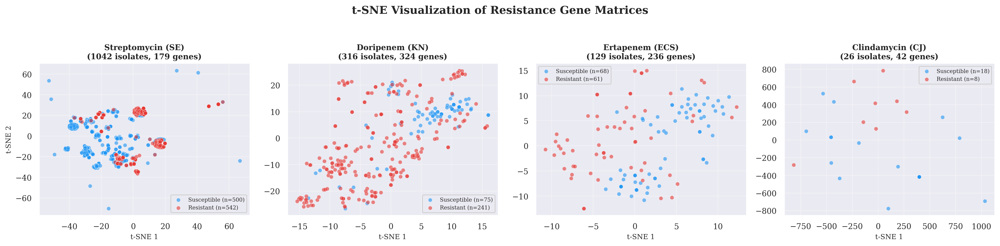

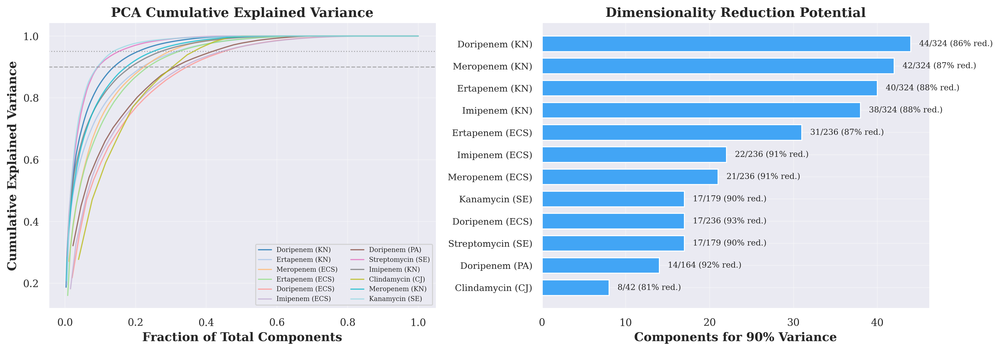

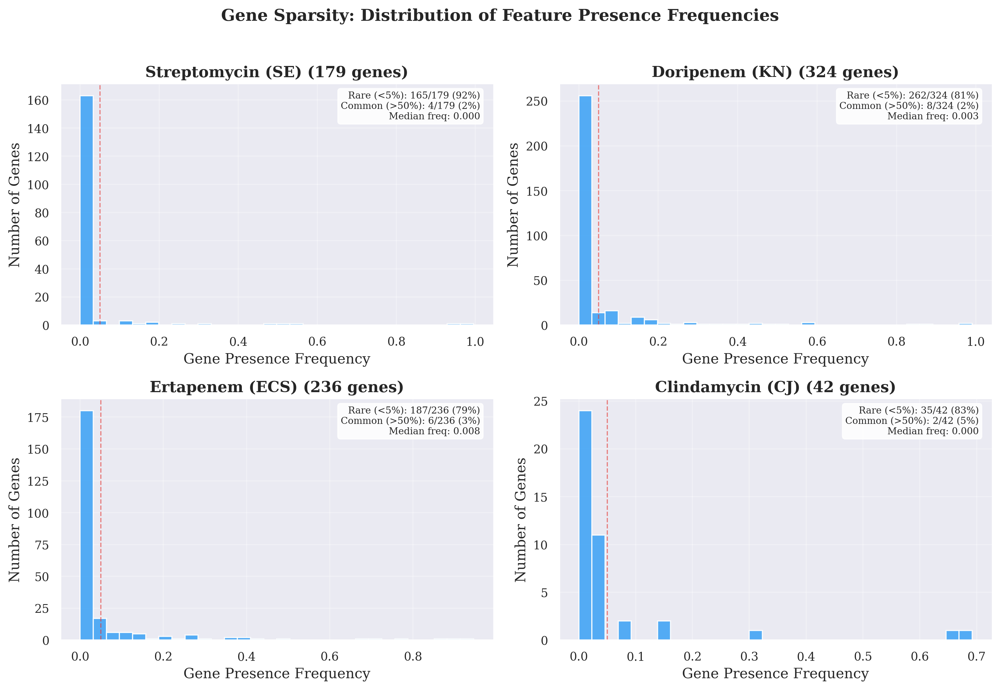

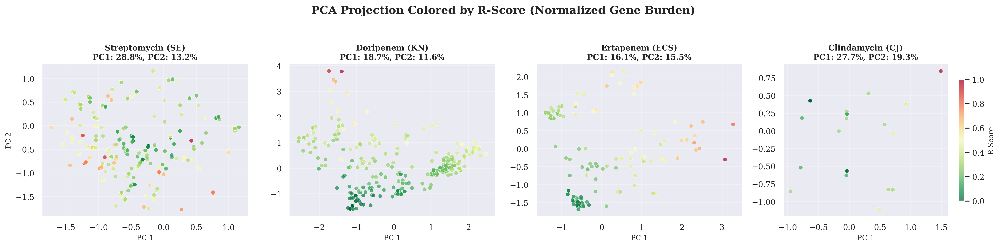


All figures saved to: /content/drive/MyDrive/Research Work/AMR Automation/Output/figures/ch4_exploration


In [ ]:
# ============================================================
# Section 4.2.5 — Data Exploration & Dimensionality Analysis
# PASTE THIS INTO YOUR COLAB NOTEBOOK
# Requires: DATASET_PATHS defined (from Cell 5)
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from pathlib import Path

plt.rcParams.update({
    'font.family': 'serif', 'font.size': 11, 'axes.titlesize': 13,
    'axes.labelsize': 12, 'figure.dpi': 300, 'savefig.dpi': 300,
    'savefig.bbox': 'tight', 'axes.spines.top': False, 'axes.spines.right': False,
    'axes.grid': True, 'grid.alpha': 0.3,
})

OUTPUT_ROOT = "/content/drive/MyDrive/Research Work/AMR Automation/Output/"
FIG_DIR = Path(OUTPUT_ROOT) / "figures" / "ch4_exploration"
FIG_DIR.mkdir(parents=True, exist_ok=True)

def clean_dataset_name(name):
    parts = name.split('_')
    if len(parts) >= 4:
        return f"{parts[2].capitalize()} ({parts[3].upper()})"
    return name

# ---- Load all datasets ----
all_datasets = {}
for path in DATASET_PATHS:
    df = pd.read_csv(path)
    name = clean_dataset_name(Path(path).stem)
    y = df.iloc[:, -1]
    X = df.iloc[:, 1:-1]
    all_datasets[name] = {'X': X, 'y': y, 'n': len(df), 'feats': X.shape[1],
                           'R': int(y.sum()), 'S': int((y == 0).sum())}

# Select 4 representative datasets
representative = ['Streptomycin (SE)', 'Doripenem (KN)', 'Ertapenem (ECS)', 'Clindamycin (CJ)']


# ========== FIGURE A: t-SNE ==========
fig, axes = plt.subplots(1, 4, figsize=(18, 4.2))
for idx, ds_name in enumerate(representative):
    ax = axes[idx]
    data = all_datasets[ds_name]
    X, y = data['X'].values, data['y'].values

    perplexity = min(30, max(5, len(X) // 4))
    tsne = TSNE(n_components=2, random_state=42, perplexity=perplexity,
                max_iter=1000, init='pca', learning_rate='auto')
    X_2d = tsne.fit_transform(X)

    mask_s, mask_r = y == 0, y == 1
    ax.scatter(X_2d[mask_s, 0], X_2d[mask_s, 1], c='#2196F3', alpha=0.6, s=25,
               edgecolors='white', linewidth=0.3, label=f'Susceptible (n={data["S"]})')
    ax.scatter(X_2d[mask_r, 0], X_2d[mask_r, 1], c='#E53935', alpha=0.6, s=25,
               edgecolors='white', linewidth=0.3, label=f'Resistant (n={data["R"]})')

    ax.set_title(f'{ds_name}\n({data["n"]} isolates, {data["feats"]} genes)', fontweight='bold', fontsize=10)
    ax.set_xlabel('t-SNE 1', fontsize=9)
    if idx == 0: ax.set_ylabel('t-SNE 2', fontsize=9)
    ax.legend(fontsize=7, loc='best', framealpha=0.9)

fig.suptitle('t-SNE Visualization of Resistance Gene Matrices', fontweight='bold', fontsize=14, y=1.04)
plt.tight_layout()
plt.savefig(FIG_DIR / 'figA_tsne_projections.png')
plt.savefig(FIG_DIR / 'figA_tsne_projections.pdf')
plt.show()


# ========== FIGURE B: PCA Cumulative Variance ==========
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
colors = plt.cm.tab20(np.linspace(0, 1, 12))
pca_summaries = []

for idx, (ds_name, data) in enumerate(all_datasets.items()):
    X = data['X'].values
    n_comp = min(X.shape[0], X.shape[1])
    pca = PCA(n_components=n_comp)
    pca.fit(X)
    cumvar = np.cumsum(pca.explained_variance_ratio_)
    n_90 = np.searchsorted(cumvar, 0.90) + 1
    pca_summaries.append({'Dataset': ds_name, 'Features': data['feats'],
                           'Components for 90%': n_90,
                           'Reduction %': round((1 - n_90/data['feats'])*100, 1)})
    x_frac = np.arange(1, len(cumvar)+1) / len(cumvar)
    ax1.plot(x_frac, cumvar, color=colors[idx], linewidth=1.2, alpha=0.8, label=ds_name)

ax1.axhline(y=0.90, color='gray', linestyle='--', linewidth=1, alpha=0.6)
ax1.axhline(y=0.95, color='gray', linestyle=':', linewidth=1, alpha=0.6)
ax1.set_xlabel('Fraction of Total Components', fontweight='bold')
ax1.set_ylabel('Cumulative Explained Variance', fontweight='bold')
ax1.set_title('PCA Cumulative Explained Variance', fontweight='bold')
ax1.legend(fontsize=6.5, ncol=2, loc='lower right')

pca_df = pd.DataFrame(pca_summaries).sort_values('Components for 90%')
bars = ax2.barh(range(len(pca_df)), pca_df['Components for 90%'].values,
                color='#42A5F5', edgecolor='white', height=0.7)
for i, (_, row) in enumerate(pca_df.iterrows()):
    ax2.text(row['Components for 90%']+1, i,
             f'{int(row["Components for 90%"])}/{int(row["Features"])} ({row["Reduction %"]:.0f}% red.)',
             va='center', fontsize=8)
ax2.set_yticks(range(len(pca_df)))
ax2.set_yticklabels(pca_df['Dataset'].values, fontsize=9)
ax2.set_xlabel('Components for 90% Variance', fontweight='bold')
ax2.set_title('Dimensionality Reduction Potential', fontweight='bold')
plt.tight_layout()
plt.savefig(FIG_DIR / 'figB_pca_variance.png')
plt.savefig(FIG_DIR / 'figB_pca_variance.pdf')
plt.show()


# ========== FIGURE C: Gene Sparsity ==========
fig, axes = plt.subplots(2, 2, figsize=(12, 8))
for idx, ds_name in enumerate(representative):
    ax = axes[idx//2][idx%2]
    X = all_datasets[ds_name]['X'].values
    info = all_datasets[ds_name]
    gene_freq = X.mean(axis=0)
    ax.hist(gene_freq, bins=30, color='#42A5F5', edgecolor='white', alpha=0.9)
    n_rare = np.sum(gene_freq < 0.05)
    n_common = np.sum(gene_freq > 0.50)
    stats_text = (f'Rare (<5%): {n_rare}/{info["feats"]} ({n_rare/info["feats"]*100:.0f}%)\n'
                  f'Common (>50%): {n_common}/{info["feats"]} ({n_common/info["feats"]*100:.0f}%)\n'
                  f'Median freq: {np.median(gene_freq):.3f}')
    ax.text(0.97, 0.97, stats_text, transform=ax.transAxes, fontsize=8,
            va='top', ha='right', bbox=dict(boxstyle='round', facecolor='white', alpha=0.9))
    ax.axvline(x=0.05, color='#E53935', linestyle='--', linewidth=1, alpha=0.6)
    ax.set_title(f'{ds_name} ({info["feats"]} genes)', fontweight='bold')
    ax.set_xlabel('Gene Presence Frequency')
    ax.set_ylabel('Number of Genes')
fig.suptitle('Gene Sparsity: Distribution of Feature Presence Frequencies',
             fontweight='bold', fontsize=14, y=1.02)
plt.tight_layout()
plt.savefig(FIG_DIR / 'figC_gene_sparsity.png')
plt.savefig(FIG_DIR / 'figC_gene_sparsity.pdf')
plt.show()


# ========== FIGURE D: PCA + R-Score ==========
fig, axes = plt.subplots(1, 4, figsize=(18, 4.2))
for idx, ds_name in enumerate(representative):
    ax = axes[idx]
    data = all_datasets[ds_name]
    X, y = data['X'].values, data['y'].values
    gene_sums = X.sum(axis=1)
    r_score = MinMaxScaler().fit_transform(gene_sums.reshape(-1, 1)).ravel()
    pca = PCA(n_components=2, random_state=42)
    X_2d = pca.fit_transform(X)
    var1, var2 = pca.explained_variance_ratio_[0]*100, pca.explained_variance_ratio_[1]*100
    scatter = ax.scatter(X_2d[:, 0], X_2d[:, 1], c=r_score, cmap='RdYlGn_r',
                         alpha=0.7, s=25, edgecolors='white', linewidth=0.3)
    ax.set_title(f'{ds_name}\nPC1: {var1:.1f}%, PC2: {var2:.1f}%', fontweight='bold', fontsize=10)
    ax.set_xlabel('PC 1', fontsize=9)
    if idx == 0: ax.set_ylabel('PC 2', fontsize=9)
    if idx == 3:
        cbar = plt.colorbar(scatter, ax=ax, shrink=0.8)
        cbar.set_label('R-Score', fontsize=9)
fig.suptitle('PCA Projection Colored by R-Score (Normalized Gene Burden)',
             fontweight='bold', fontsize=14, y=1.04)
plt.tight_layout()
plt.savefig(FIG_DIR / 'figD_pca_rscore.png')
plt.savefig(FIG_DIR / 'figD_pca_rscore.pdf')
plt.show()

print("\nAll figures saved to:", FIG_DIR)